In [1]:
# Standard Library Imports
import os
import re
import json
import random
import multiprocessing
import statistics
from typing import Any, Tuple

# Third-party Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from qiskit import QuantumCircuit, transpile,ClassicalRegister,QuantumRegister
from qiskit_ibm_runtime import QiskitRuntimeService, SamplerV2 as Sampler
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit_aer import QasmSimulator
from qiskit.visualization import plot_distribution
from IPython.display import display
from deap import creator, base, tools

import grape  # Grammatical evolution library
from grape import algorithms  # Evolutionary algorithms

In [ ]:
# Configure IBM Quantum Service
QiskitRuntimeService.save_account(
    token='IBM_QUANTUM_TOKEN_HERE', 
    overwrite=True,
    channel='ibm_cloud',
    instance='ibm_quantum_instance_id_here'
)

service = QiskitRuntimeService()  # Loads default account

backend = service.backend("ibm_torino")
backend_name = backend.name
print(f"✓ Connected to backend: {backend_name}")
print(f"✓ Saved accounts: {service.saved_accounts()}")

In [3]:
# Get the number of logical CPU cores available
num_cores = os.cpu_count()
print("Number of CPU cores available:", num_cores)

Number of CPU cores available: 10


In [4]:
BNF_GRAMMAR = grape.Grammar("grammars/grover.bnf")

In [5]:
# Define evaluation constants
NUM_SHOTS = 10000
SUCCESS_THRESHOLD = 0.48
GATE_PENALTY_WEIGHT = 0.02
TARGET_STATE = "100"

In [6]:
def generate_oracle_for_state(marked_state: str) -> str:
    """Generate Grover oracle code for a given marked state."""
    n = len(marked_state)
    code_lines = []
    # For each qubit where the marked state is '0', apply X gate.
    for i, bit in enumerate(marked_state):
        if bit == '0':
            code_lines.append(f"qc.x({i})")
    # Apply a multi-controlled phase flip (using Hadamard and mcx)
    code_lines.append(f"qc.h({n-1})")
    code_lines.append(f"qc.mcx(list(range({n-1})), {n-1})")
    code_lines.append(f"qc.h({n-1})")
    # Undo the X gates.
    for i, bit in enumerate(marked_state):
        if bit == '0':
            code_lines.append(f"qc.x({i})")
    return "\n".join(code_lines) + "\n"


In [7]:
class CircuitEvaluator:
    def __init__(self, shots: int = NUM_SHOTS, log_dir: str = None):
        """
        Initialize the evaluator with simulation parameters and logging directory.
        """
        self.shots = shots
        self.log_dir = log_dir
        if log_dir:
            os.makedirs(self.log_dir, exist_ok=True)
        os.makedirs(self.log_dir, exist_ok=True)
    
    def decode_individual(self, ind) -> str:
        """
        Decodes an individual's genome into a phenotype code string.
        Returns:
            A string containing the code if decoding is successful,
            or None if invalid.
        """
        if ind.invalid or not hasattr(ind, 'phenotype'):
            return None
        try:
            phenotype_code = ind.phenotype
            if isinstance(phenotype_code, list):
                phenotype_code = "".join(phenotype_code)
            # Replace literal \n with actual newlines and clean quotes
            cleaned_code = re.sub(r'\\n', '\n', phenotype_code)
            cleaned_code = re.sub(r'^"|"$', '', cleaned_code)
            cleaned_code = re.sub(r'"\s+"', '\n', cleaned_code)

            # Inject named registers for compatibility with Sampler V2
            cleaned_code = re.sub(
                r"qc\s*=\s*QuantumCircuit\(\s*3\s*,\s*3\s*\)",
                "qr = QuantumRegister(3, name='q')\ncr = ClassicalRegister(3, name='cr')\nqc = QuantumCircuit(qr, cr)",
                cleaned_code
            )
            return cleaned_code
        except Exception as ex:
            print(f"[Decode Error] {ex}")
            return None
    
    def execute_circuit(self, phenotype_code: str) -> QuantumCircuit:
        """
        Executes the phenotype code to produce a QuantumCircuit.
        Returns:
            The QuantumCircuit if 'qc' is found in the execution context,
            otherwise None.
        """
        local_vars = {}
        try:
            exec(phenotype_code, globals(), local_vars)
            if "qc" in local_vars:
                return local_vars["qc"]
            else:
                print("No circuit variable 'qc' found in phenotype code.")
                return None
        except Exception as e:
            print(f"Error executing phenotype code: {e}")
            return None
    
    def simulate_circuit(self, circuit: QuantumCircuit, marked_state: str) -> dict:
        """
        Simulates the circuit and returns performance metrics for the given marked state.
        
        Args:
            circuit (QuantumCircuit): The circuit to simulate.
            marked_state (str): The state to evaluate.
        
        Returns:
            dict: Contains counts, p_marked, error, gate_count, and depth.
        """
        simulator = QasmSimulator()
        compiled = transpile(circuit, simulator, optimization_level=0)
        result = simulator.run(compiled, shots=self.shots).result()
        counts = result.get_counts()
        # Reverse bitstrings to match the expected format.
        corrected = {k[::-1]: v for k, v in counts.items()}
        total = sum(corrected.values())
        p_marked = corrected.get(marked_state, 0) / total if total > 0 else 0.0
        error = 1 - p_marked
        return {
            "counts": corrected,
            "p_marked": p_marked,
            "error": error,
            "gate_count": compiled.size(),
            "depth": compiled.depth()
        }
    
    def log_evaluation(self, logs: list, generation: int, individual) -> None:
        """
        Logs the evaluation details for an individual to JSON and CSV files.
        """
        if not self.log_dir:
            return
        id_hash = hash(str(individual.genome)) % 10**8
        log_file_json = os.path.join(self.log_dir, f"eval_gen{generation}_id{id_hash}.json")
        log_file_csv = os.path.join(self.log_dir, f"eval_gen{generation}_id{id_hash}.csv")
        with open(log_file_json, "w") as f:
            json.dump(logs, f, indent=2)
        df = pd.DataFrame(logs)
        df[["state", "p_marked", "error", "gate_count", "depth"]].to_csv(log_file_csv, index=False)

In [8]:
def inject_oracle(phenotype_str: str, oracle_code: str) -> str:
    """Inject oracle code into the phenotype string."""
    pattern = r"(## Begin Oracle\n)(.*?)(## End Oracle\n)"
    new_block = r"\1" + oracle_code + r"\3"
    return re.sub(pattern, new_block, phenotype_str, flags=re.DOTALL)

In [9]:
# %%
def fitness_function_specialized_state_000(
    phenotype_str,
    shots=NUM_SHOTS,
    threshold=SUCCESS_THRESHOLD,
    gate_penalty_weight=GATE_PENALTY_WEIGHT,
    target_state=TARGET_STATE,
    log_states=True,
    log_dir=None  
):
    if not isinstance(phenotype_str, str):
        return (float('inf'), []) if log_states else float('inf')
        
    # Initialize Evaluator with the CORRECT directory
    evaluator = CircuitEvaluator(shots=shots, log_dir=log_dir)
    logs = []
    
    oracle_code = generate_oracle_for_state(target_state)
    modified_code = inject_oracle(phenotype_str, oracle_code)
    qc = evaluator.execute_circuit(modified_code)
    if qc is None:
        return (float('inf'), []) if log_states else float('inf')
    
    result = evaluator.simulate_circuit(qc, target_state)
    p_marked = result["p_marked"]
    error = 1 - p_marked
    miss = 1 if error > threshold else 0
    gate_count = result.get("gate_count", 0)
    
    fitness_score = 10 * miss + error + gate_penalty_weight * gate_count
    
    if log_states:
        logs.append({
            "state": target_state,
            "p_marked": p_marked,
            "error": error,
            "gate_count": gate_count,
            "oracle": oracle_code,
            "code": modified_code,
            "counts": result["counts"],
            "depth": result.get("depth", None)
        })
        return (fitness_score, logs)
    else:
        return fitness_score

In [10]:
POPULATION_SIZE    = 1000
MAX_GENERATIONS    = 100
N_GEN = 1
P_CROSSOVER        = 0.8     
P_MUTATION         = 0.01
ELITE_SIZE         = 1
HALLOFFAME_SIZE    = 1
CODON_SIZE         = 400
MAX_TREE_DEPTH     = 50      
TOURNAMENT_SIZE    = 5
MIN_INIT_DEPTH     = 20        
MAX_INIT_DEPTH     = 40       
CODON_CONSUMPTION  = "lazy"   
GENOME_REPRESENTATION = 'list'
REPORT_ITEMS = ['gen', 'invalid', 'avg', 'std', 'min', 'max',
                'fitness_test',
                'best_ind_length', 'avg_length',
                'best_ind_nodes', 'avg_nodes',
                'avg_depth',
                'avg_used_codons', 'best_ind_used_codons',
                'selection_time', 'generation_time']

## IBM Hardware Runner Function

In [11]:
def run_hof_on_ibm(evaluator, hof, target_state=TARGET_STATE):
    """Run Hall of Fame individuals on IBM hardware."""
    service = QiskitRuntimeService(channel="ibm_cloud")  # Changed from "ibm_quantum"
    backend = service.backend("ibm_torino")
    print(f"[QPU] Running on: {backend.name}")

    sampler = Sampler(mode=backend)
    sampler.options.default_shots = evaluator.shots

    for i, ind in enumerate(hof.items):
        print(f"\n[HOF Individual {i+1}] Fitness: {ind.fitness.values[0]}")

        pheno_code = evaluator.decode_individual(ind)
        pheno_code = re.sub(
            r"qc\s*=\s*QuantumCircuit\(\s*3\s*,\s*3\s*\)",
            "qr = QuantumRegister(3, name='q')\n"
            "cr = ClassicalRegister(3, name='cr')\n"
            "qc = QuantumCircuit(qr, cr)",
            pheno_code
        )

        qc = evaluator.execute_circuit(pheno_code)
        if qc is None:
            print(" Invalid circuit. Skipping.")
            continue

        pm = generate_preset_pass_manager(target=backend.target, optimization_level=3)
        circuit_isa = pm.run(qc)

        print("Evolved transpiled count_ops:", circuit_isa.count_ops())
        print("Evolved transpiled depth:   ", circuit_isa.depth())
        print("Total ops:       ", circuit_isa.size())
        print("Qubits / Clbits: ", circuit_isa.num_qubits, "/", circuit_isa.num_clbits)

        display(circuit_isa.draw(output="mpl", idle_wires=False))

        result = sampler.run([circuit_isa]).result()
        databins = result[0].data
        counts = databins["cr"].get_counts()
        counts = {k[::-1]: v for k, v in counts.items()}
        display(plot_distribution(counts, title=f"HOF #{i+1} on {backend.name}"))

### Independent Run Function

In [12]:
NUMBER_OF_RUNS = 5

In [13]:
def run_evolution_experiment(run_id, seed, target_state):
    """Runs a complete GE evolution for a specific seed and target state."""
    print(f"\n{'='*60}")
    print(f"RUN {run_id}/{NUMBER_OF_RUNS} | Target: {target_state} | Seed: {seed}")
    print(f"{'='*60}")
    
    # Organize logs by state, then by run
    state_dir = f"experiments_state_{target_state}"
    os.makedirs(state_dir, exist_ok=True)
    run_log_dir = os.path.join(state_dir, f"run_{run_id}_seed_{seed}")
    os.makedirs(run_log_dir, exist_ok=True)
    print(f"✓ Logging to: {run_log_dir}")
    
    random.seed(seed)
    np.random.seed(seed)
    
    # Force clean DEAP state
    for attr in ["FitnessMin", "Individual"]:
        if hasattr(creator, attr):
            delattr(creator, attr)
    
    creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
    creator.create("Individual", grape.Individual, fitness=creator.FitnessMin)

    toolbox = base.Toolbox()
    toolbox.register(
        "populationCreator",
        grape.sensible_initialisation,
        creator.Individual,
        bnf_grammar=BNF_GRAMMAR,
        min_init_depth=MIN_INIT_DEPTH,
        max_init_depth=MAX_INIT_DEPTH,
        codon_size=CODON_SIZE,
        codon_consumption=CODON_CONSUMPTION,
        genome_representation=GENOME_REPRESENTATION
    )
    toolbox.register("mate", grape.crossover_onepoint)
    toolbox.register("mutate", grape.mutation_int_flip_per_codon)
    toolbox.register("select", tools.selTournament, tournsize=TOURNAMENT_SIZE)
    
    # Create pool for this specific run
    pool = multiprocessing.Pool(num_cores)
    toolbox.register("map", pool.map)
    
    def evaluate_wrapper(individual, pts_train=None):
        evaluator = CircuitEvaluator(shots=NUM_SHOTS, log_dir=run_log_dir)
        phenotype_str = evaluator.decode_individual(individual)
        if not phenotype_str:
            return (float('inf'),)
        fitness_val = fitness_function_specialized_state_000(
            phenotype_str,
            shots=NUM_SHOTS,
            threshold=SUCCESS_THRESHOLD,
            gate_penalty_weight=GATE_PENALTY_WEIGHT,
            target_state=target_state,
            log_states=False,
            log_dir=run_log_dir
        )
        return (fitness_val,)

    toolbox.register("evaluate", evaluate_wrapper)

    # Initialize population
    population = toolbox.populationCreator(pop_size=POPULATION_SIZE)
    hof = tools.HallOfFame(1)
    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("avg", np.mean)
    stats.register("std", np.std)
    stats.register("min", np.min)
    stats.register("max", np.max)
    
    evaluator = CircuitEvaluator(shots=NUM_SHOTS, log_dir=run_log_dir)
    
    # Track metrics over generations
    generations_list = []
    best_fitness_list = []
    best_fidelity_list = []
    best_gate_count_list = []
    best_depth_list = []
    
    # Manual evolution loop with progress display
    print(f"✓ Starting evolution (Population: {POPULATION_SIZE}, Generations: {MAX_GENERATIONS})")
    
    for gen in range(MAX_GENERATIONS):
        # Run one generation
        population, logbook = algorithms.ge_eaSimpleWithElitism(
            population,
            toolbox,
            cxpb=P_CROSSOVER,
            mutpb=P_MUTATION,
            ngen=N_GEN,  # Only 1 generation at a time
            elite_size=ELITE_SIZE,
            bnf_grammar=BNF_GRAMMAR,
            codon_size=CODON_SIZE,
            max_tree_depth=MAX_TREE_DEPTH,
            codon_consumption=CODON_CONSUMPTION,
            report_items=['gen', 'min', 'avg'],
            genome_representation=GENOME_REPRESENTATION,
            stats=stats,
            halloffame=hof,
            verbose=False
        )
        
        # DISPLAY BEST INDIVIDUAL OF THIS GENERATION
        best_ind = tools.selBest(population, 1)[0]
        best_ind.generation = gen
        
        best_phenotype = evaluator.decode_individual(best_ind)
        if best_phenotype is not None:
            fitness_val, logs = fitness_function_specialized_state_000(
                best_phenotype,
                shots=NUM_SHOTS,
                threshold=SUCCESS_THRESHOLD,
                gate_penalty_weight=GATE_PENALTY_WEIGHT,
                target_state=target_state,
                log_states=True,
                log_dir=run_log_dir
            )
            
            # TRACK METRICS (but don't log to disk yet)
            generations_list.append(gen)
            best_fitness_list.append(best_ind.fitness.values[0])
            best_fidelity_list.append(logs[0]['p_marked'])
            best_gate_count_list.append(logs[0]['gate_count'])
            best_depth_list.append(logs[0]['depth'])
            
            qc = evaluator.execute_circuit(best_phenotype)
            if qc:
                print(f"\n[Run {run_id} | Gen {gen}/{MAX_GENERATIONS-1}] Best Fitness: {best_ind.fitness.values[0]:.4f} | Fidelity: {logs[0]['p_marked']:.4f} | Gates: {logs[0]['gate_count']}")
                display(qc.draw("mpl"))
    
    # PLOT EVOLUTION METRICS
    print(f"\n{'='*60}")
    print(f"Generating evolution plots for Run {run_id}...")
    print(f"{'='*60}")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Fitness plot
    axes[0, 0].plot(generations_list, best_fitness_list, 'b-', linewidth=2)
    axes[0, 0].set_xlabel('Generation', fontsize=12)
    axes[0, 0].set_ylabel('Best Fitness (Lower is Better)', fontsize=12)
    axes[0, 0].set_title(f'Run {run_id}: Fitness Evolution', fontsize=14, fontweight='bold')
    axes[0, 0].grid(True, alpha=0.3)
    
    # Fidelity plot
    axes[0, 1].plot(generations_list, best_fidelity_list, 'g-', linewidth=2)
    axes[0, 1].set_xlabel('Generation', fontsize=12)
    axes[0, 1].set_ylabel('Fidelity', fontsize=12)
    axes[0, 1].set_title(f'Run {run_id}: Fidelity Evolution', fontsize=14, fontweight='bold')
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].set_ylim([0, 1.05])
    axes[0, 1].axhline(y=SUCCESS_THRESHOLD, color='r', linestyle='--', label=f'Threshold={SUCCESS_THRESHOLD}')
    axes[0, 1].legend()
    
    # Gate count plot
    axes[1, 0].plot(generations_list, best_gate_count_list, 'r-', linewidth=2)
    axes[1, 0].set_xlabel('Generation', fontsize=12)
    axes[1, 0].set_ylabel('Gate Count', fontsize=12)
    axes[1, 0].set_title(f'Run {run_id}: Gate Count Evolution', fontsize=14, fontweight='bold')
    axes[1, 0].grid(True, alpha=0.3)
    
    # Depth plot
    axes[1, 1].plot(generations_list, best_depth_list, 'm-', linewidth=2)
    axes[1, 1].set_xlabel('Generation', fontsize=12)
    axes[1, 1].set_ylabel('Circuit Depth', fontsize=12)
    axes[1, 1].set_title(f'Run {run_id}: Depth Evolution', fontsize=14, fontweight='bold')
    axes[1, 1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plot_path = os.path.join(run_log_dir, f'evolution_metrics_run_{run_id}.png')
    plt.savefig(plot_path, dpi=150, bbox_inches='tight')
    print(f"✓ Plot saved to: {plot_path}")
    display(fig)
    plt.close()
    
    # Close pool after evolution completes
    pool.close()
    pool.join()
    
    # Final evaluation
    best_ind = hof[0]
    phenotype = evaluator.decode_individual(best_ind)
    
    metrics_score, logs = fitness_function_specialized_state_000(
        phenotype,
        shots=NUM_SHOTS,
        threshold=SUCCESS_THRESHOLD,
        gate_penalty_weight=GATE_PENALTY_WEIGHT,
        target_state=target_state,
        log_states=True,
        log_dir=run_log_dir
    )
    
    best_metrics = logs[0]
    
    # LOG ONLY THE FINAL BEST CIRCUIT TO DISK
    evaluator.log_evaluation(logs, MAX_GENERATIONS-1, best_ind)
    
    print(f"\n{'='*60}")
    print(f"✓ Run {run_id} COMPLETE | Fidelity: {best_metrics['p_marked']:.4f} | Gates: {best_metrics['gate_count']} | Depth: {best_metrics['depth']}")
    print(f"{'='*60}\n")
    
    return {
        "run_id": run_id,
        "seed": seed,
        "log_dir": run_log_dir,
        "individual": best_ind,
        "phenotype": phenotype,
        "fidelity": best_metrics['p_marked'],
        "gate_count": best_metrics['gate_count'],
        "depth": best_metrics['depth'],
        "raw_fitness": best_ind.fitness.values[0],
        # Include evolution history for aggregate plotting
        "generations": generations_list,
        "fitness_history": best_fitness_list,
        "fidelity_history": best_fidelity_list,
        "gate_count_history": best_gate_count_list,
        "depth_history": best_depth_list
    }

### Execute 5 Independent Runs

Generated seeds: [69681, 38083, 68853, 81245, 30112]
✓ Seeds saved to experiment_seeds.json

Starting 5 independent runs for state |100>...

RUN 1/5 | Target: 100 | Seed: 69681
✓ Logging to: experiments_state_100/run_1_seed_69681
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.5834,)
gen = 1 , Best fitness = (1.5834,) , Number of invalids = 155

[Run 1 | Gen 0/99] Best Fitness: 1.5834 | Fidelity: 0.6158 | Gates: 60


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


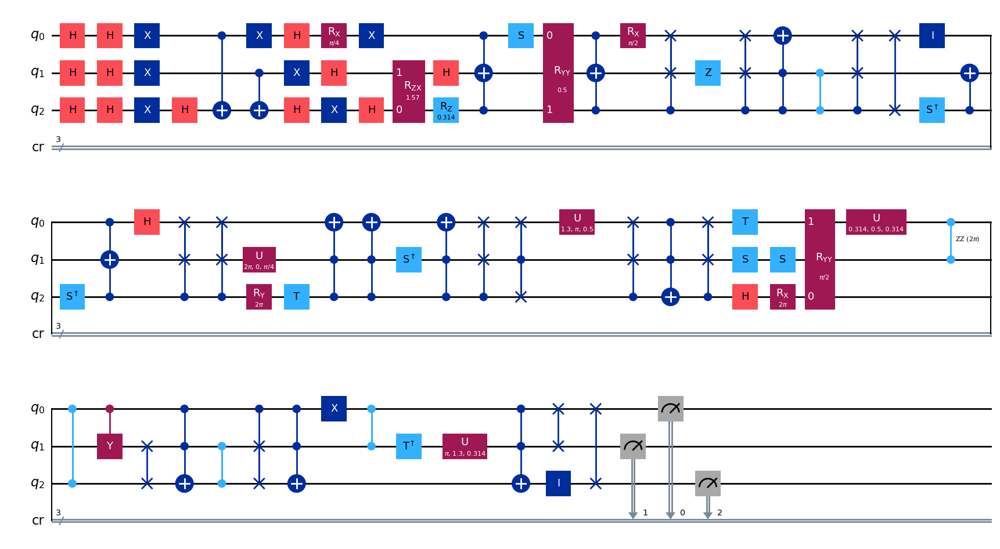

gen = 0 , Best fitness = (1.5834,)
gen = 1 , Best fitness = (1.5720999999999998,) , Number of invalids = 76

[Run 1 | Gen 1/99] Best Fitness: 1.5721 | Fidelity: 0.6264 | Gates: 60


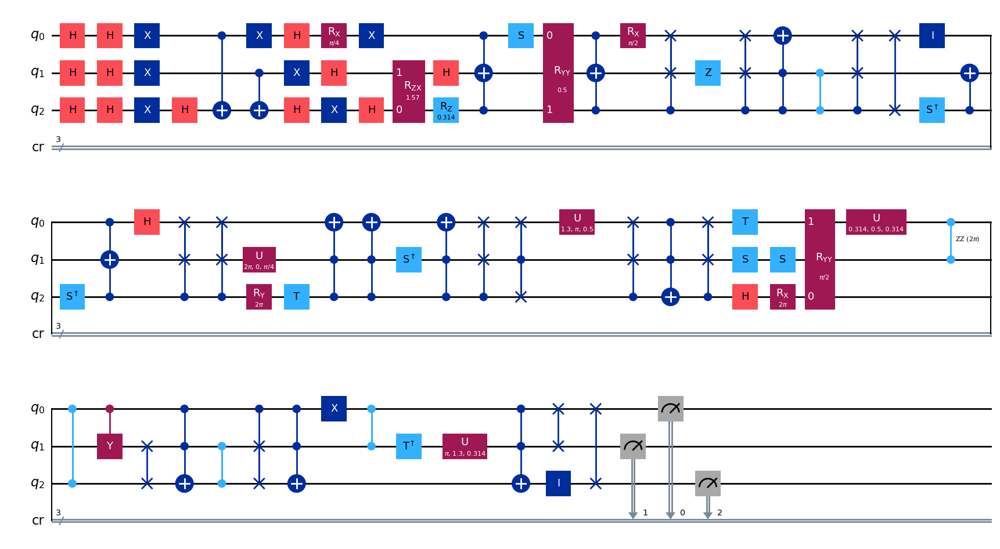

gen = 0 , Best fitness = (1.5720999999999998,)
gen = 1 , Best fitness = (1.4345,) , Number of invalids = 83

[Run 1 | Gen 2/99] Best Fitness: 1.4345 | Fidelity: 0.6211 | Gates: 53


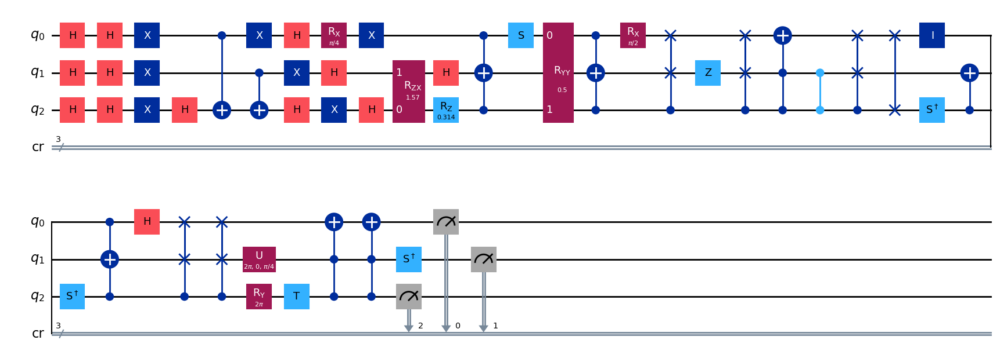

gen = 0 , Best fitness = (1.4345,)
gen = 1 , Best fitness = (1.4345,) , Number of invalids = 62

[Run 1 | Gen 3/99] Best Fitness: 1.4345 | Fidelity: 0.6210 | Gates: 53


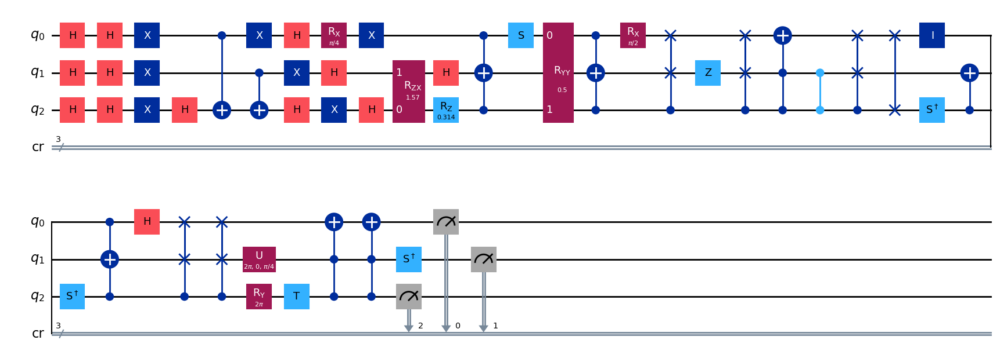

gen = 0 , Best fitness = (1.4345,)
gen = 1 , Best fitness = (1.4345,) , Number of invalids = 59

[Run 1 | Gen 4/99] Best Fitness: 1.4345 | Fidelity: 0.6169 | Gates: 53


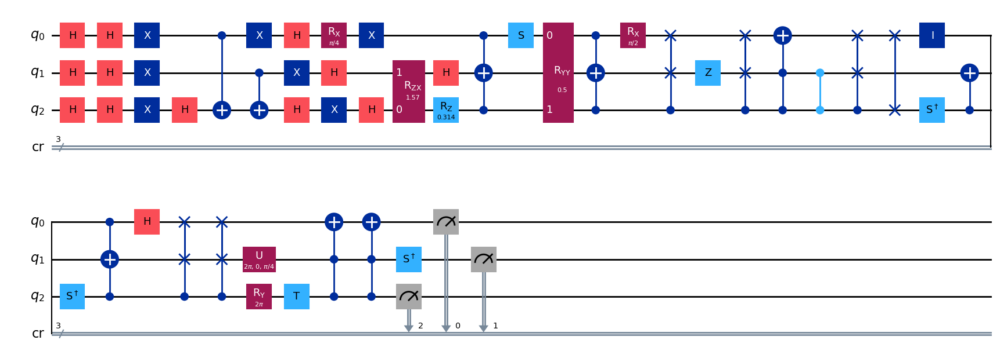

gen = 0 , Best fitness = (1.4345,)
gen = 1 , Best fitness = (1.3414,) , Number of invalids = 45

[Run 1 | Gen 5/99] Best Fitness: 1.3414 | Fidelity: 0.6175 | Gates: 48


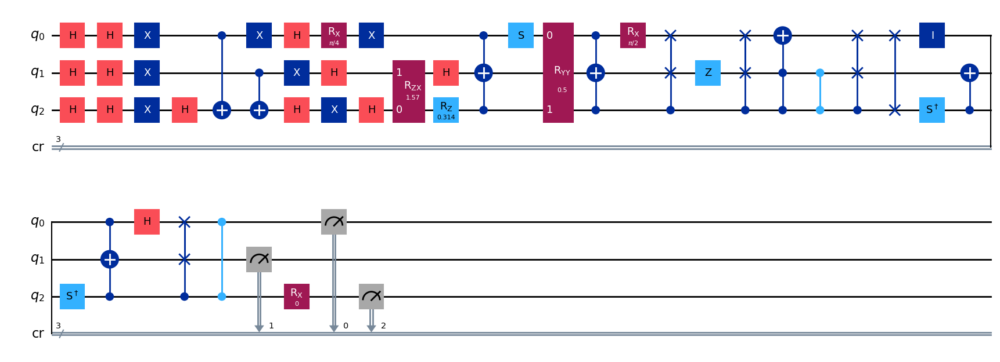

gen = 0 , Best fitness = (1.3414,)
gen = 1 , Best fitness = (1.2745,) , Number of invalids = 51

[Run 1 | Gen 6/99] Best Fitness: 1.2745 | Fidelity: 0.5729 | Gates: 42


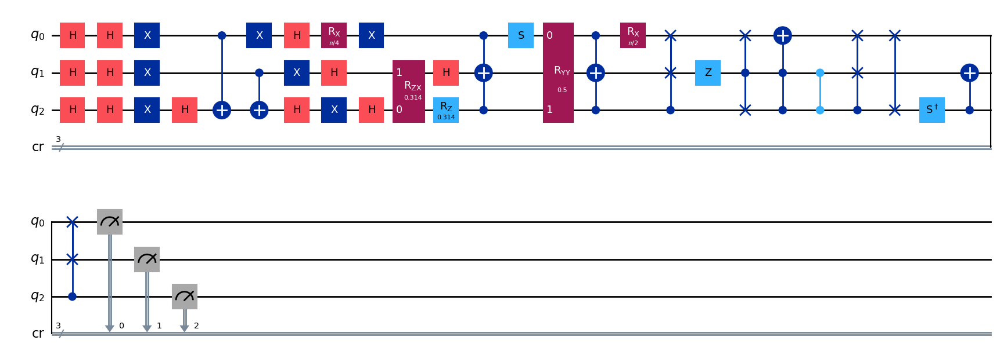

gen = 0 , Best fitness = (1.2745,)
gen = 1 , Best fitness = (1.2745,) , Number of invalids = 50

[Run 1 | Gen 7/99] Best Fitness: 1.2745 | Fidelity: 0.5793 | Gates: 42


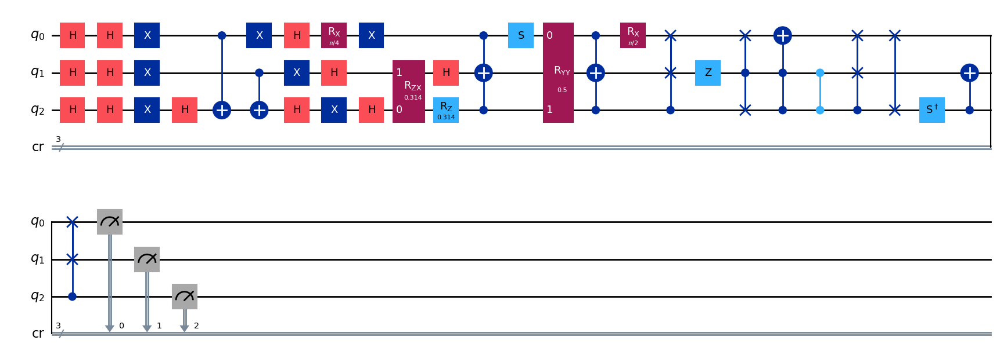

gen = 0 , Best fitness = (1.2745,)
gen = 1 , Best fitness = (1.0413000000000001,) , Number of invalids = 30

[Run 1 | Gen 8/99] Best Fitness: 1.0413 | Fidelity: 0.9404 | Gates: 49


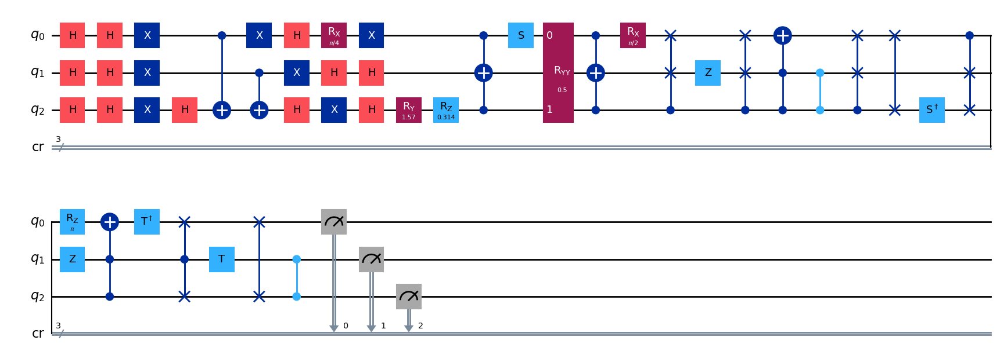

gen = 0 , Best fitness = (1.0413000000000001,)
gen = 1 , Best fitness = (0.9033,) , Number of invalids = 60

[Run 1 | Gen 9/99] Best Fitness: 0.9033 | Fidelity: 0.9319 | Gates: 42


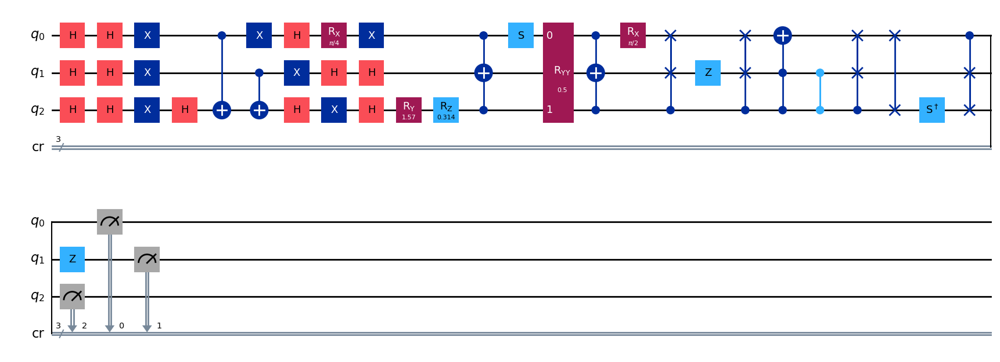

gen = 0 , Best fitness = (0.9033,)
gen = 1 , Best fitness = (0.9033,) , Number of invalids = 50

[Run 1 | Gen 10/99] Best Fitness: 0.9033 | Fidelity: 0.9394 | Gates: 42


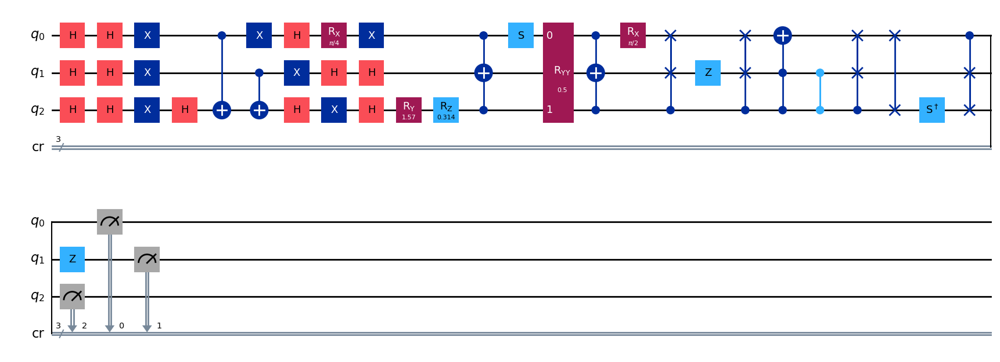

gen = 0 , Best fitness = (0.9033,)
gen = 1 , Best fitness = (0.9033,) , Number of invalids = 52

[Run 1 | Gen 11/99] Best Fitness: 0.9033 | Fidelity: 0.9394 | Gates: 42


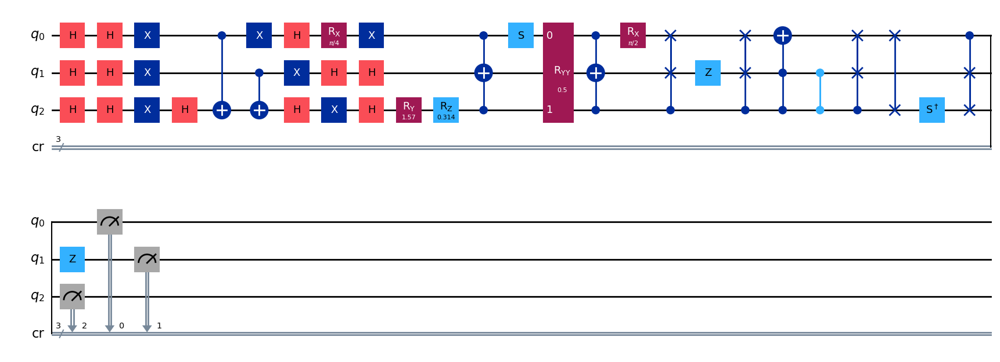

gen = 0 , Best fitness = (0.9033,)
gen = 1 , Best fitness = (0.8988999999999999,) , Number of invalids = 69

[Run 1 | Gen 12/99] Best Fitness: 0.8989 | Fidelity: 0.9367 | Gates: 42


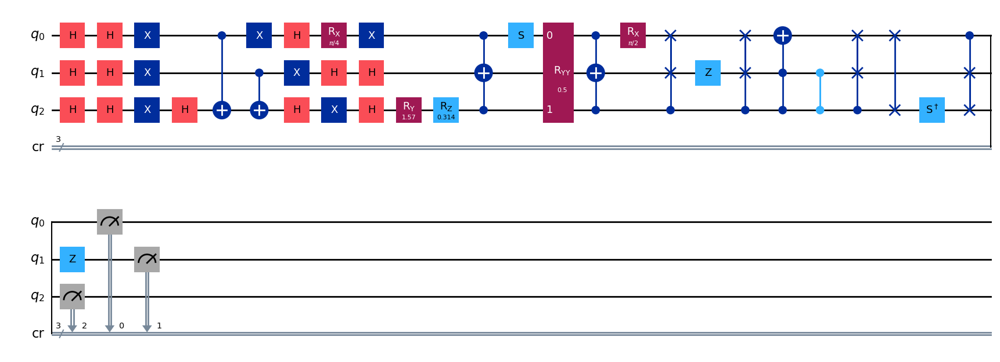

gen = 0 , Best fitness = (0.8988999999999999,)
gen = 1 , Best fitness = (0.8988999999999999,) , Number of invalids = 67

[Run 1 | Gen 13/99] Best Fitness: 0.8989 | Fidelity: 0.9443 | Gates: 42


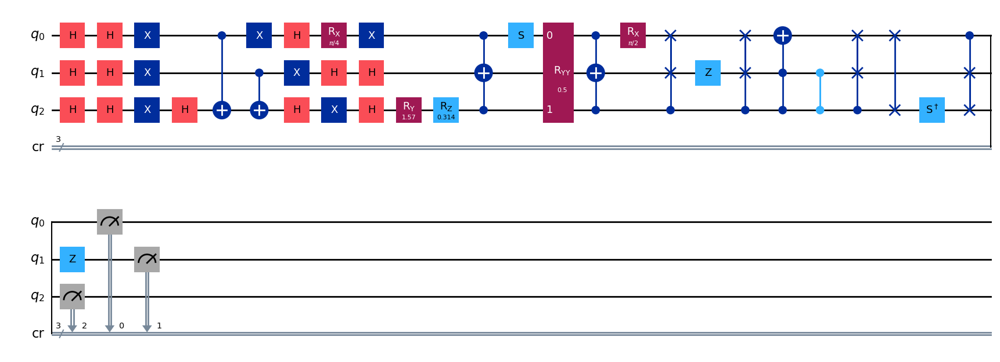

gen = 0 , Best fitness = (0.8988999999999999,)
gen = 1 , Best fitness = (0.8988999999999999,) , Number of invalids = 52

[Run 1 | Gen 14/99] Best Fitness: 0.8989 | Fidelity: 0.9373 | Gates: 42


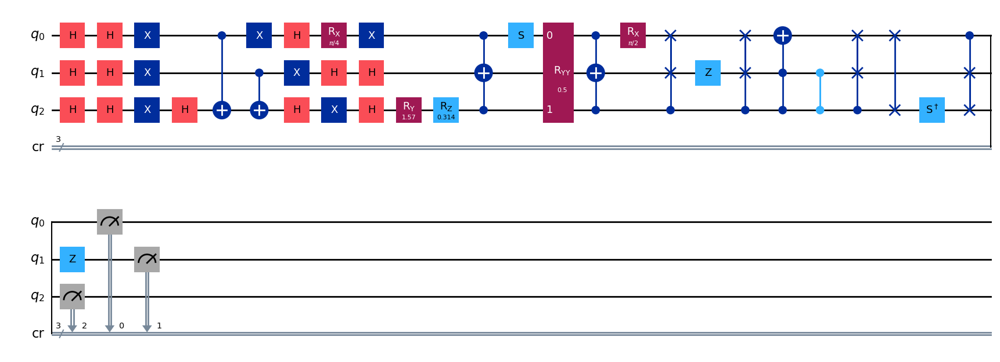

gen = 0 , Best fitness = (0.8988999999999999,)
gen = 1 , Best fitness = (0.8855000000000001,) , Number of invalids = 44

[Run 1 | Gen 15/99] Best Fitness: 0.8855 | Fidelity: 0.9365 | Gates: 41


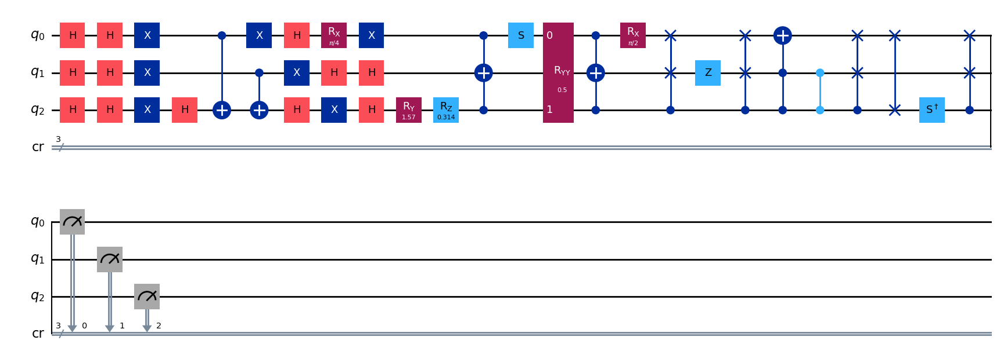

gen = 0 , Best fitness = (0.8855000000000001,)
gen = 1 , Best fitness = (0.8810000000000001,) , Number of invalids = 36

[Run 1 | Gen 16/99] Best Fitness: 0.8810 | Fidelity: 0.9383 | Gates: 41


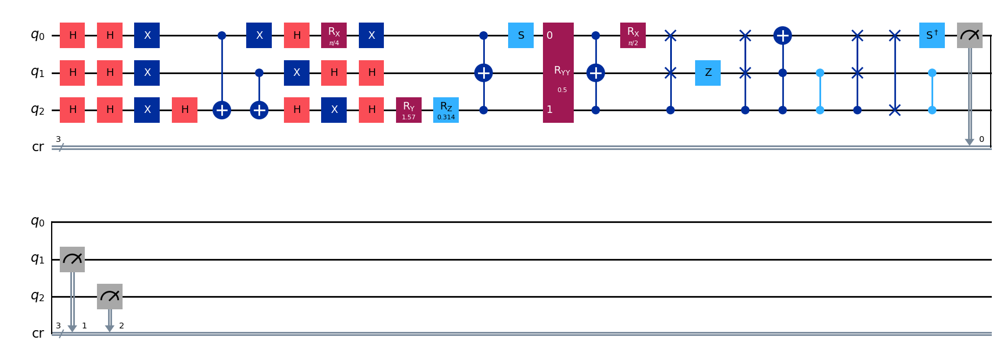

gen = 0 , Best fitness = (0.8810000000000001,)
gen = 1 , Best fitness = (0.8810000000000001,) , Number of invalids = 35

[Run 1 | Gen 17/99] Best Fitness: 0.8810 | Fidelity: 0.9430 | Gates: 41


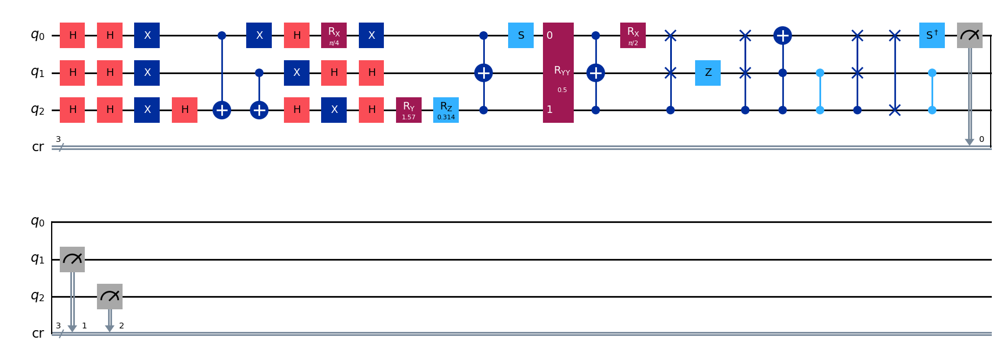

gen = 0 , Best fitness = (0.8810000000000001,)
gen = 1 , Best fitness = (0.8618,) , Number of invalids = 25

[Run 1 | Gen 18/99] Best Fitness: 0.8618 | Fidelity: 0.9368 | Gates: 40


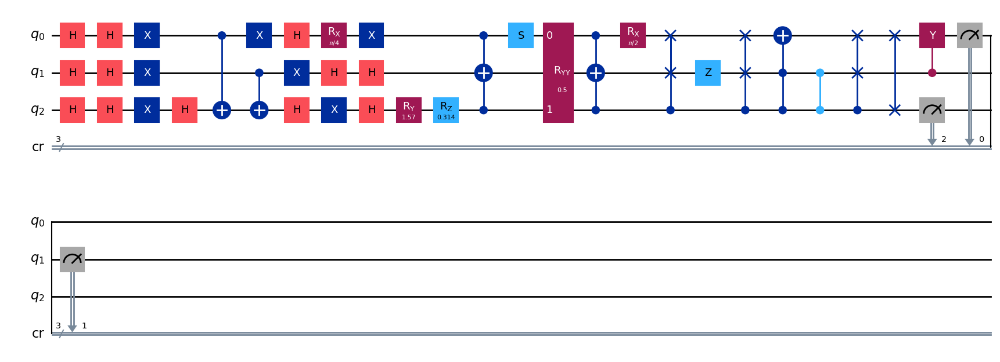

gen = 0 , Best fitness = (0.8618,)
gen = 1 , Best fitness = (0.8618,) , Number of invalids = 22

[Run 1 | Gen 19/99] Best Fitness: 0.8618 | Fidelity: 0.9398 | Gates: 40


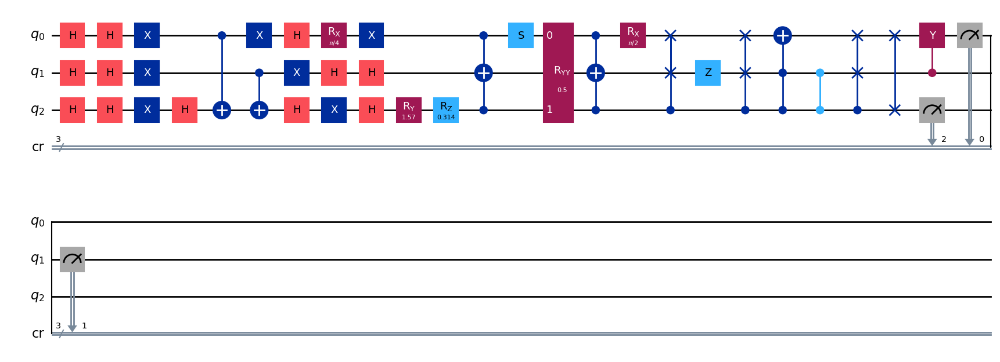

gen = 0 , Best fitness = (0.8618,)
gen = 1 , Best fitness = (0.8598,) , Number of invalids = 25

[Run 1 | Gen 20/99] Best Fitness: 0.8598 | Fidelity: 0.9396 | Gates: 40


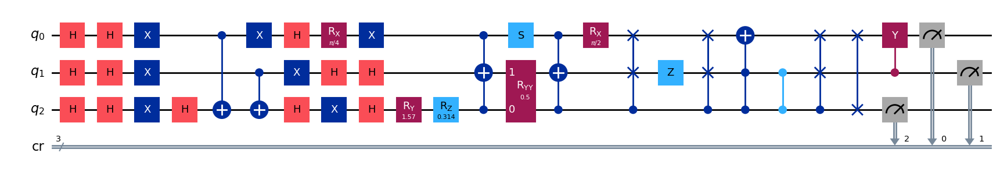

gen = 0 , Best fitness = (0.8598,)
gen = 1 , Best fitness = (0.7411000000000001,) , Number of invalids = 26

[Run 1 | Gen 21/99] Best Fitness: 0.7411 | Fidelity: 0.9372 | Gates: 34


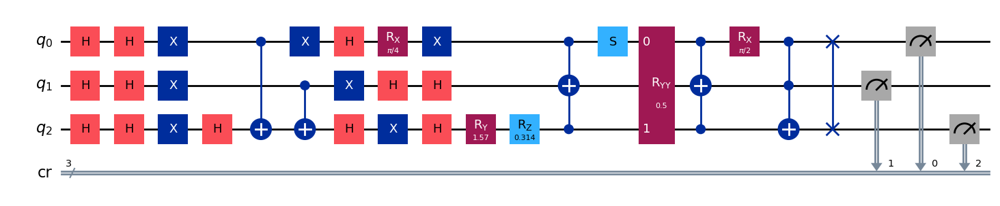

gen = 0 , Best fitness = (0.7411000000000001,)
gen = 1 , Best fitness = (0.7411000000000001,) , Number of invalids = 11

[Run 1 | Gen 22/99] Best Fitness: 0.7411 | Fidelity: 0.9361 | Gates: 34


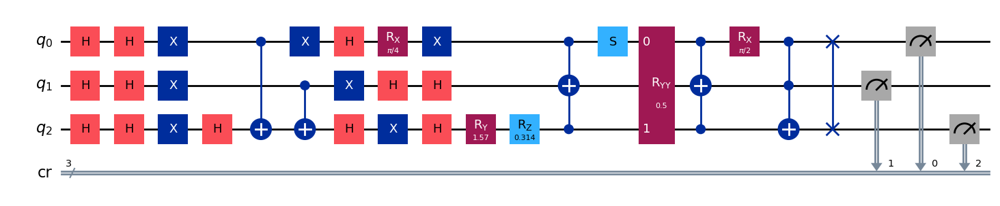

gen = 0 , Best fitness = (0.7411000000000001,)
gen = 1 , Best fitness = (0.7411000000000001,) , Number of invalids = 4

[Run 1 | Gen 23/99] Best Fitness: 0.7411 | Fidelity: 0.9415 | Gates: 34


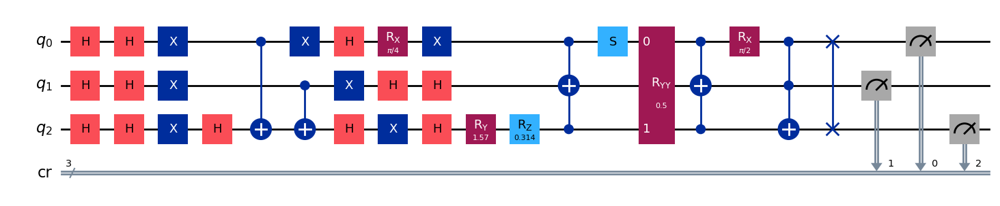

gen = 0 , Best fitness = (0.7411000000000001,)
gen = 1 , Best fitness = (0.7411000000000001,) , Number of invalids = 6

[Run 1 | Gen 24/99] Best Fitness: 0.7411 | Fidelity: 0.9375 | Gates: 34


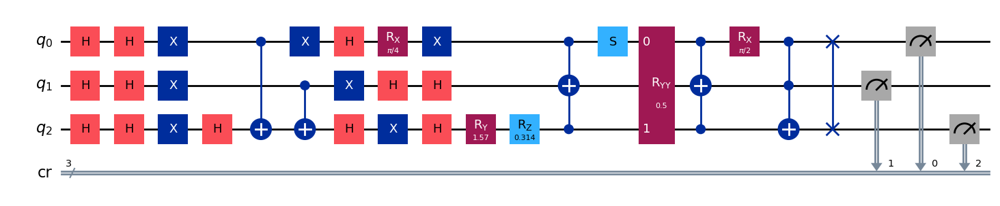

gen = 0 , Best fitness = (0.7411000000000001,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 6

[Run 1 | Gen 25/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


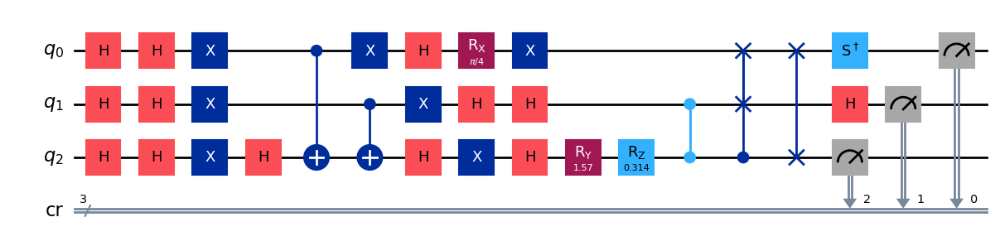

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 8

[Run 1 | Gen 26/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


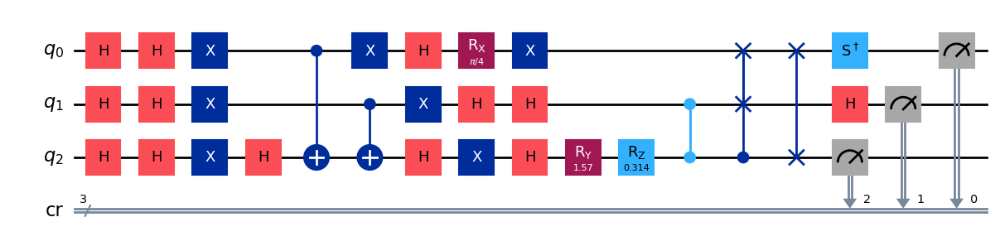

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 4

[Run 1 | Gen 27/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


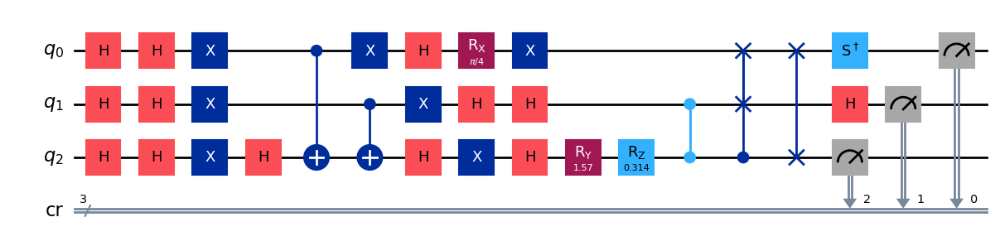

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 3

[Run 1 | Gen 28/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


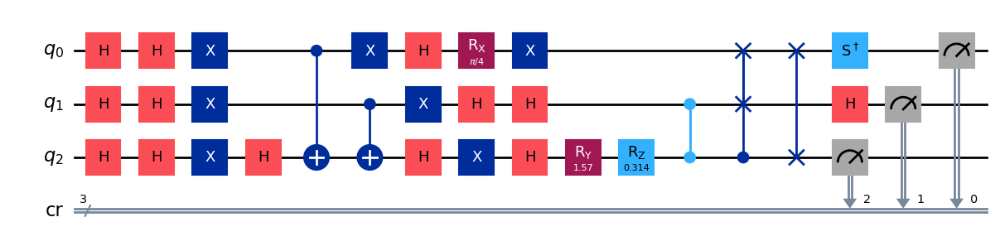

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 3

[Run 1 | Gen 29/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


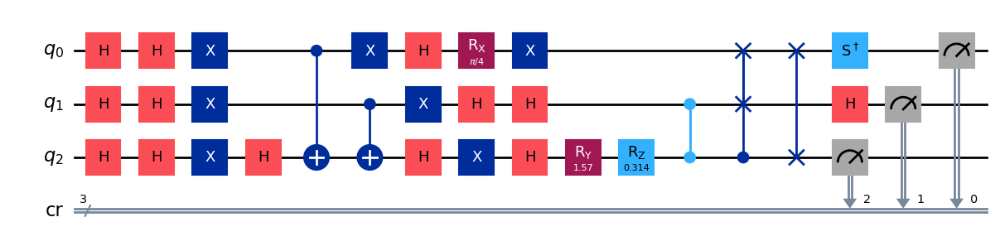

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 30/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


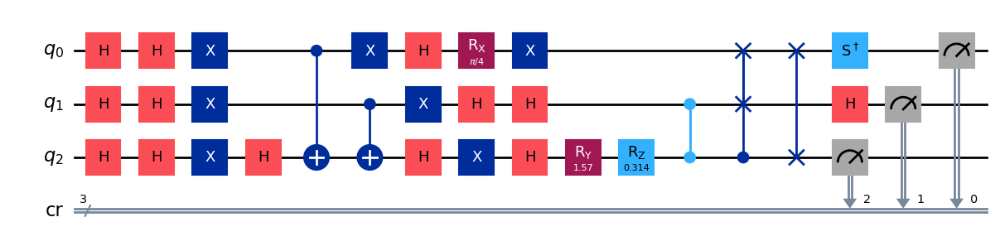

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 31/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


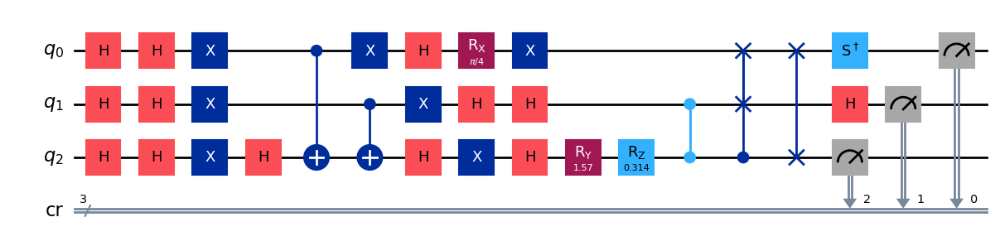

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 32/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


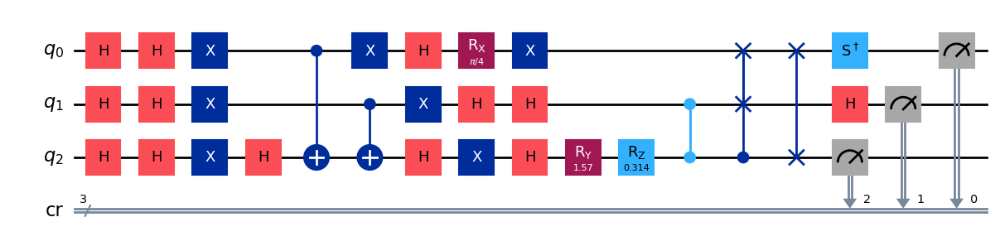

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 33/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


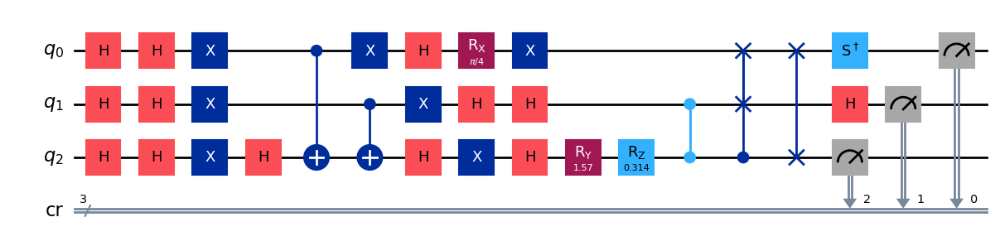

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 34/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


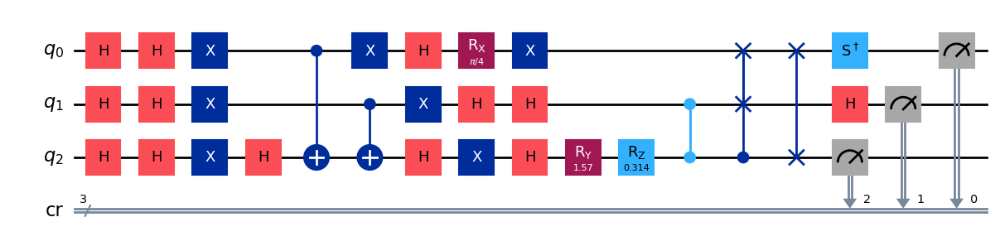

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 35/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


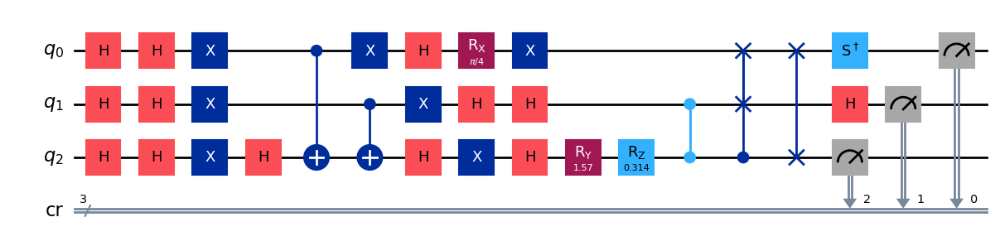

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 36/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


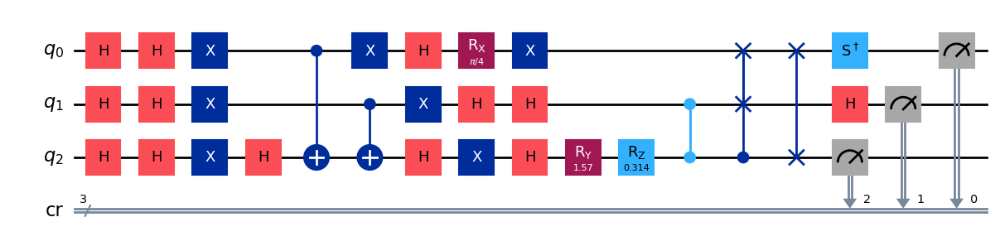

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 37/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


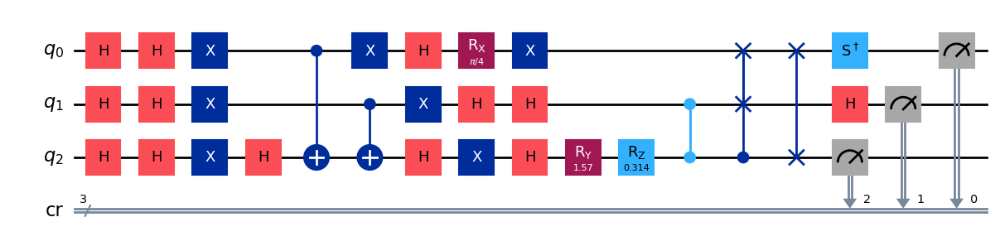

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 38/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


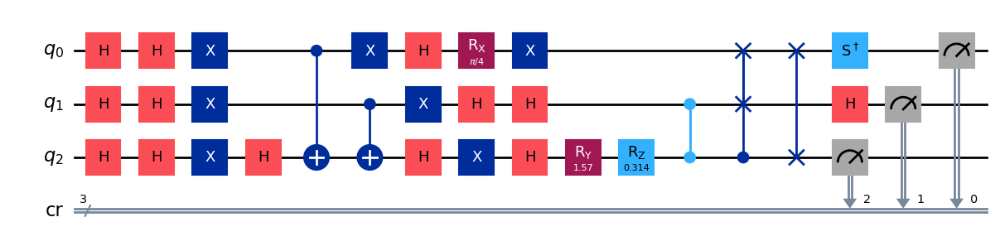

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 39/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


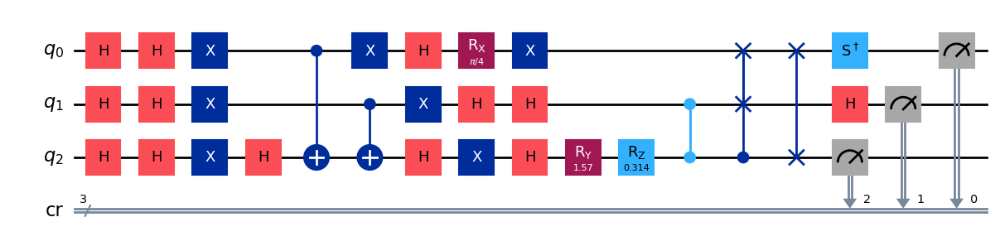

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 40/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


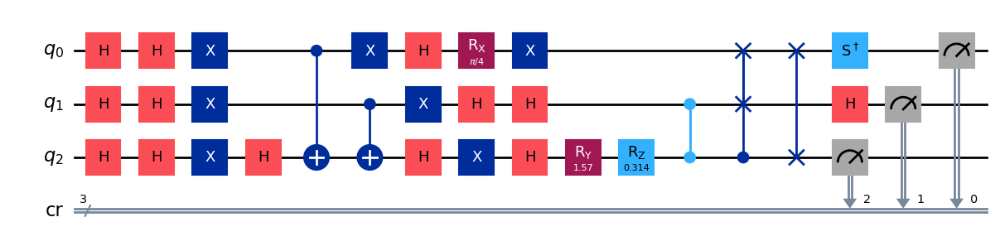

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 41/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


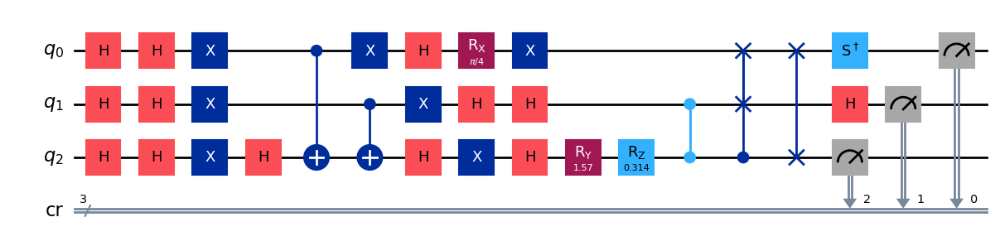

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 42/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


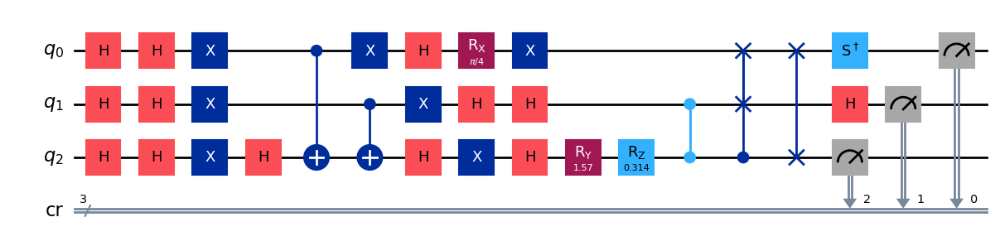

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 43/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


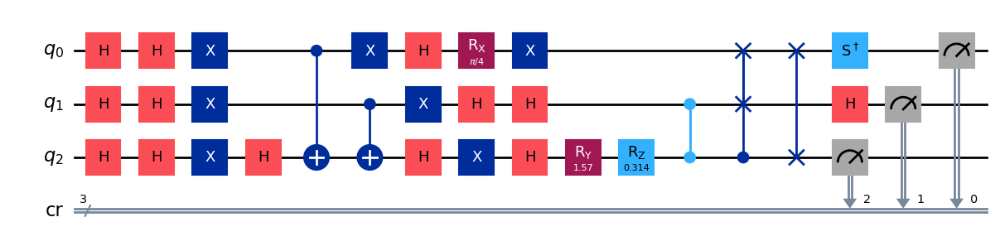

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 44/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


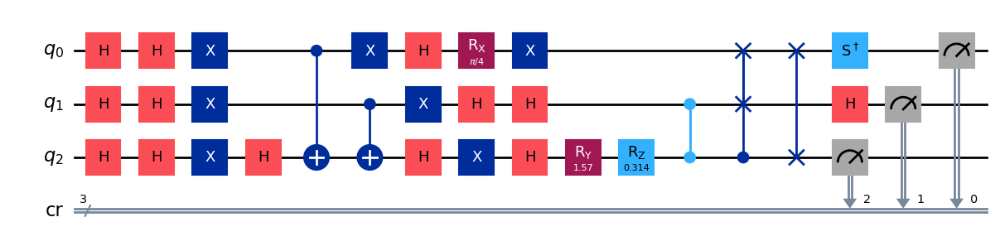

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 45/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


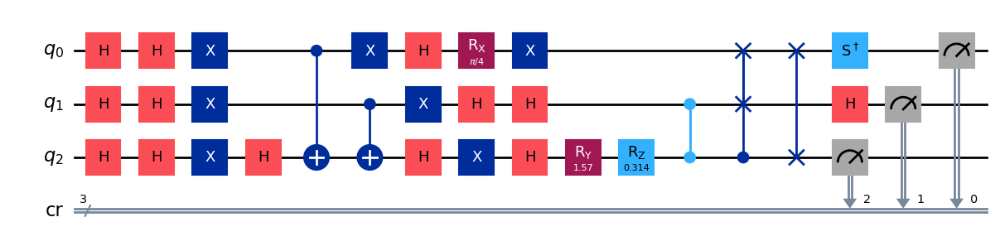

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 46/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


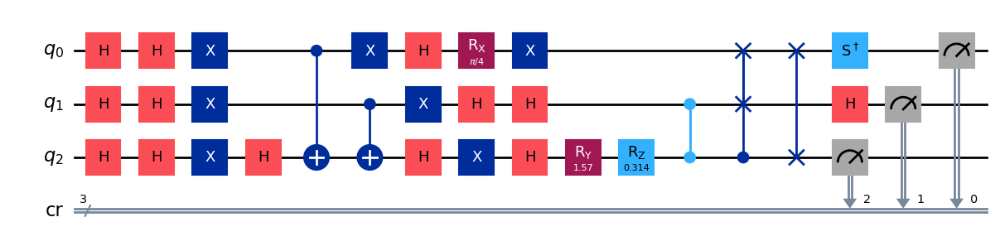

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 47/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


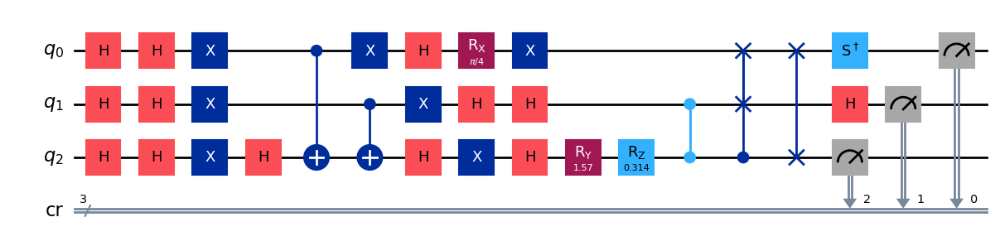

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.64,) , Number of invalids = 0

[Run 1 | Gen 48/99] Best Fitness: 0.6400 | Fidelity: 1.0000 | Gates: 32


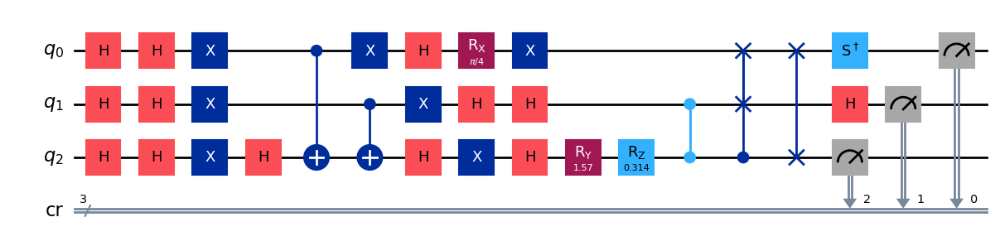

gen = 0 , Best fitness = (0.64,)
gen = 1 , Best fitness = (0.62,) , Number of invalids = 0

[Run 1 | Gen 49/99] Best Fitness: 0.6200 | Fidelity: 1.0000 | Gates: 31


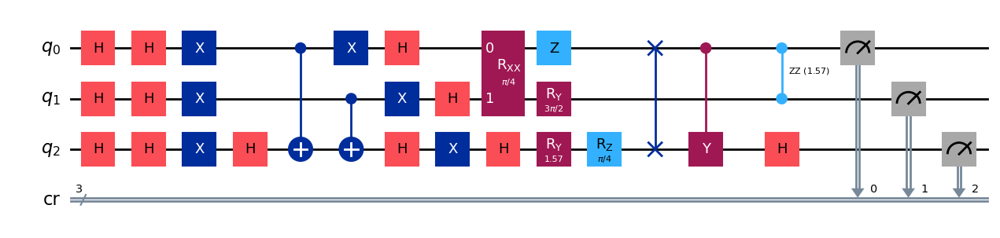

gen = 0 , Best fitness = (0.62,)
gen = 1 , Best fitness = (0.62,) , Number of invalids = 0

[Run 1 | Gen 50/99] Best Fitness: 0.6200 | Fidelity: 1.0000 | Gates: 31


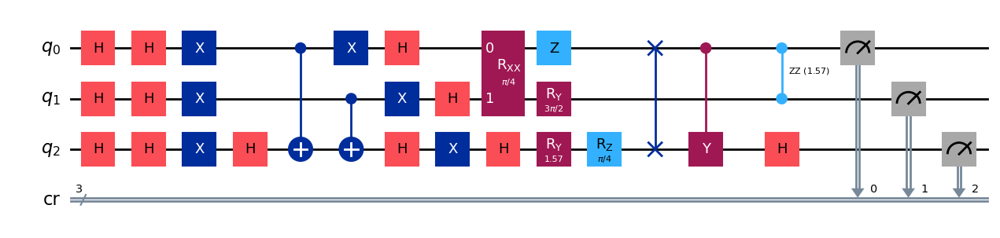

gen = 0 , Best fitness = (0.62,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 51/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


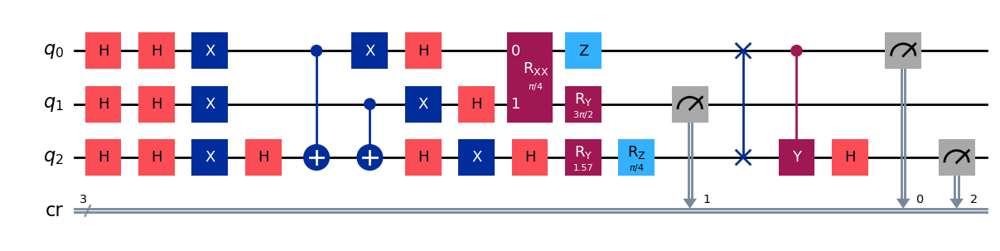

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 52/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


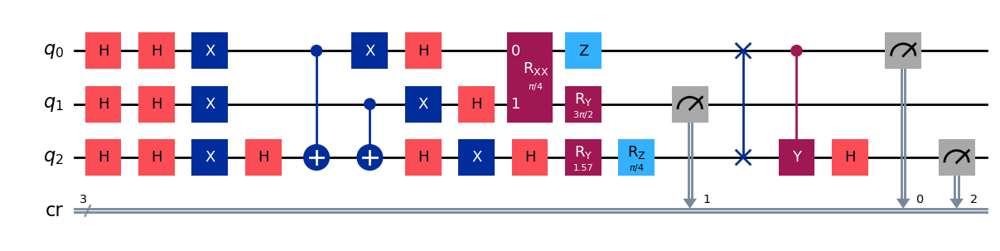

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 53/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


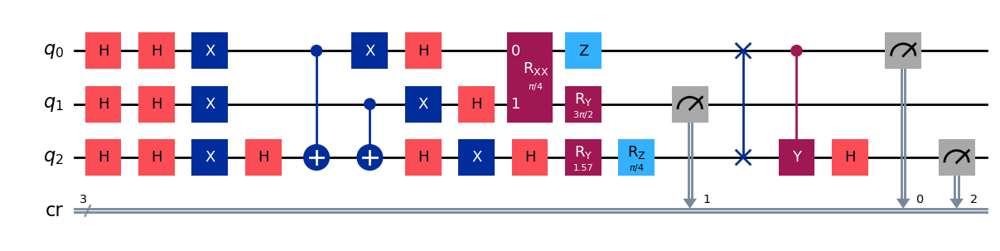

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 54/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


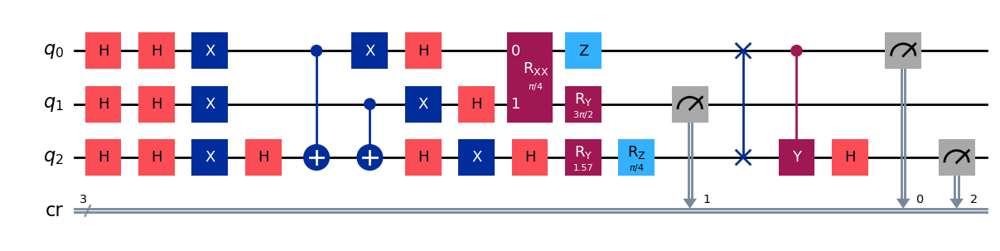

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 55/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


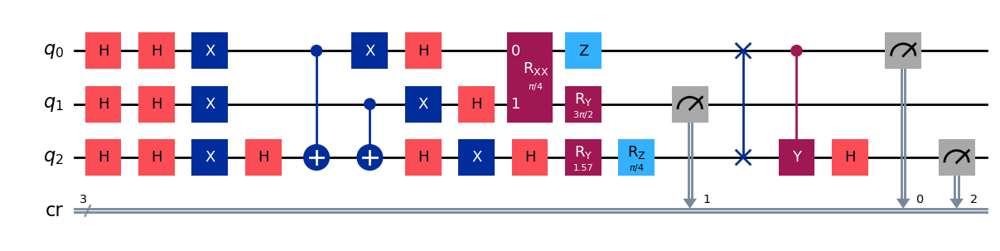

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 56/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


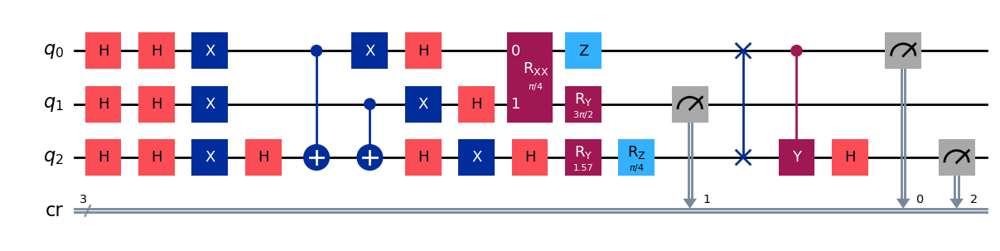

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 57/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


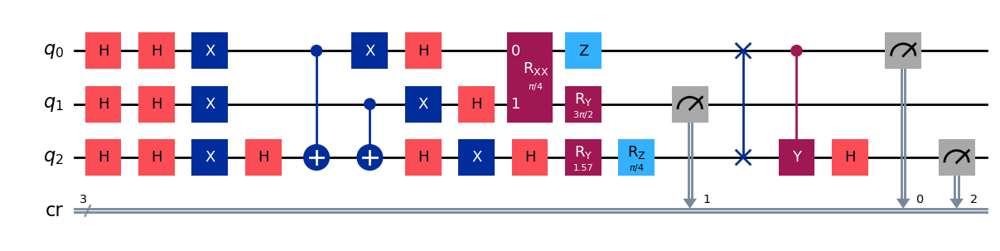

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 58/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


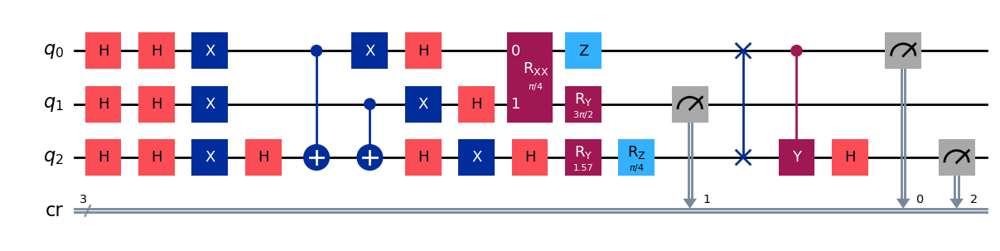

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 59/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


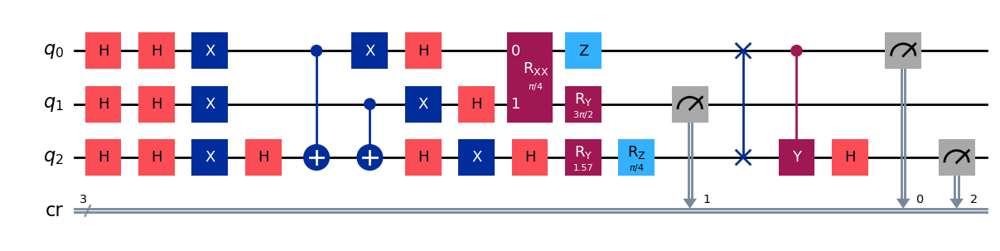

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 60/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


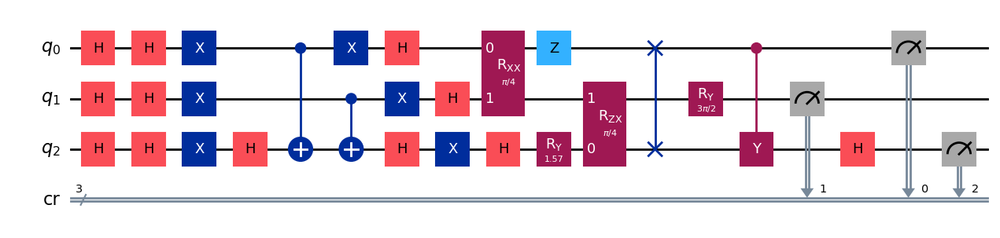

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 61/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


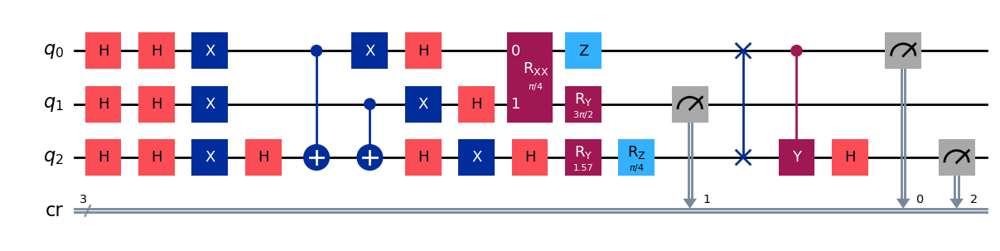

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 62/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


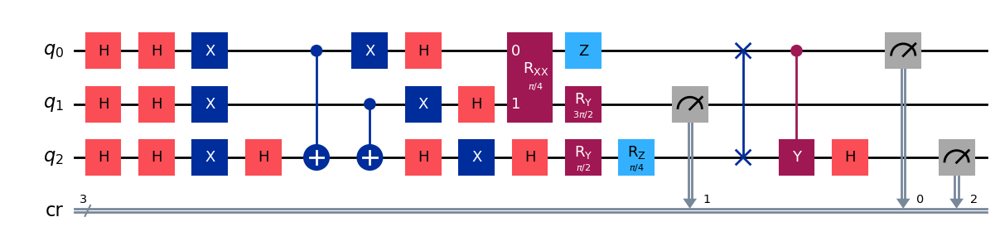

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 63/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


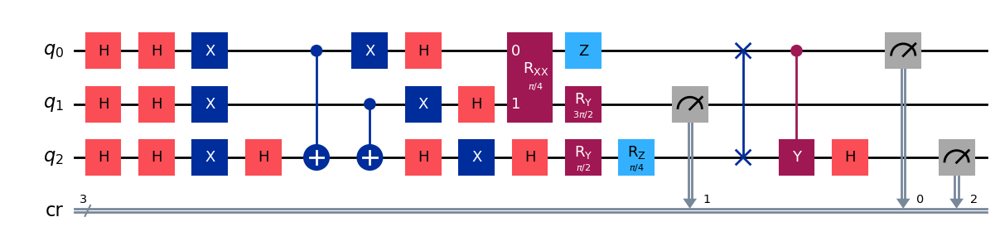

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 64/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


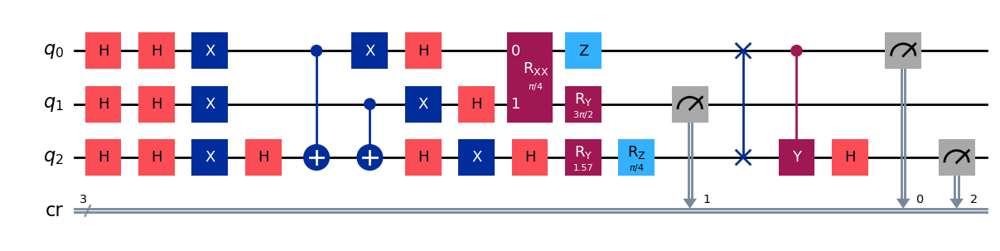

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 65/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


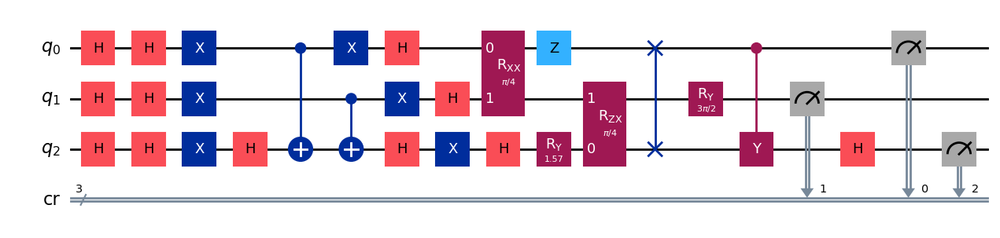

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.6,) , Number of invalids = 0

[Run 1 | Gen 66/99] Best Fitness: 0.6000 | Fidelity: 1.0000 | Gates: 30


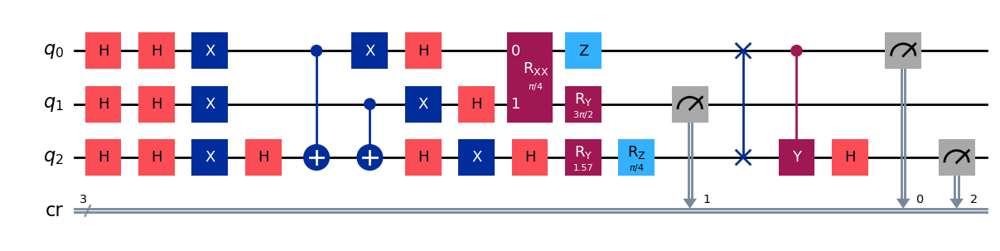

gen = 0 , Best fitness = (0.6,)
gen = 1 , Best fitness = (0.58,) , Number of invalids = 0

[Run 1 | Gen 67/99] Best Fitness: 0.5800 | Fidelity: 1.0000 | Gates: 29


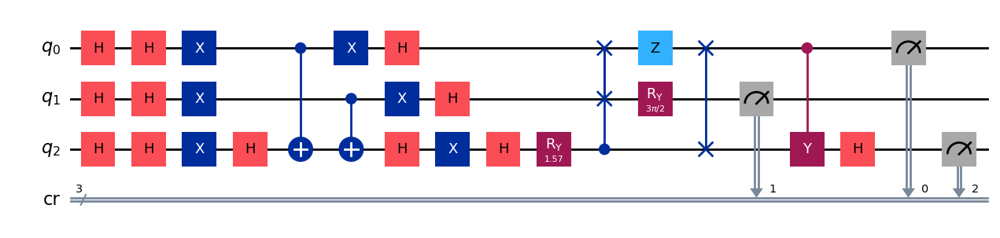

gen = 0 , Best fitness = (0.58,)
gen = 1 , Best fitness = (0.58,) , Number of invalids = 0

[Run 1 | Gen 68/99] Best Fitness: 0.5800 | Fidelity: 1.0000 | Gates: 29


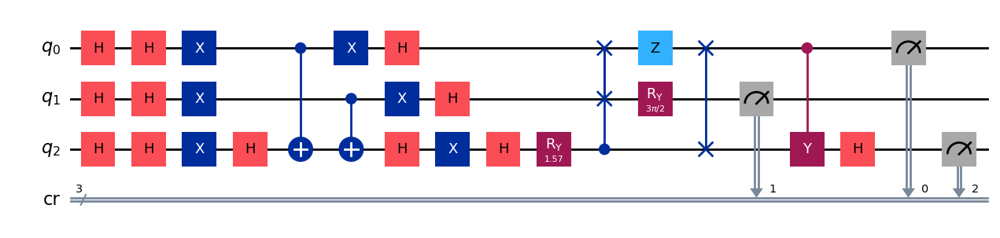

gen = 0 , Best fitness = (0.58,)
gen = 1 , Best fitness = (0.58,) , Number of invalids = 0

[Run 1 | Gen 69/99] Best Fitness: 0.5800 | Fidelity: 1.0000 | Gates: 29


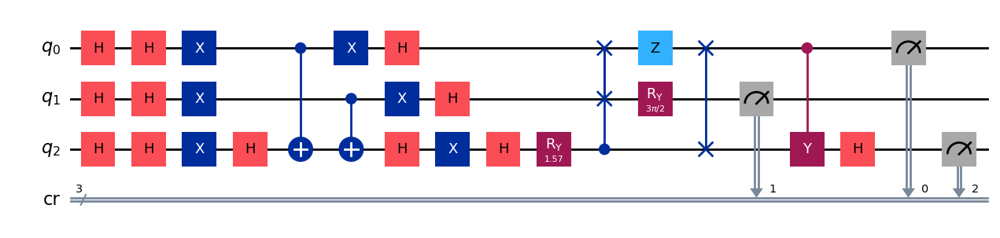

gen = 0 , Best fitness = (0.58,)
gen = 1 , Best fitness = (0.58,) , Number of invalids = 0

[Run 1 | Gen 70/99] Best Fitness: 0.5800 | Fidelity: 1.0000 | Gates: 29


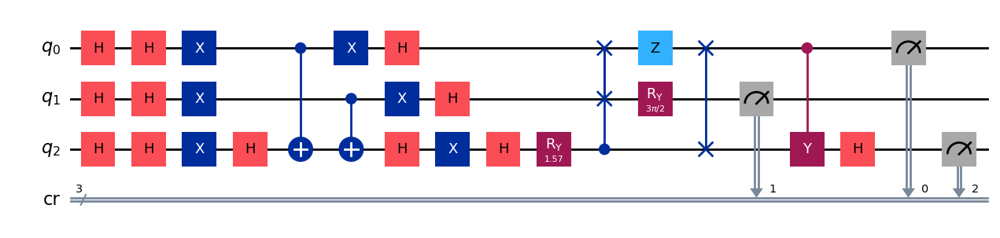

gen = 0 , Best fitness = (0.58,)
gen = 1 , Best fitness = (0.58,) , Number of invalids = 0

[Run 1 | Gen 71/99] Best Fitness: 0.5800 | Fidelity: 1.0000 | Gates: 29


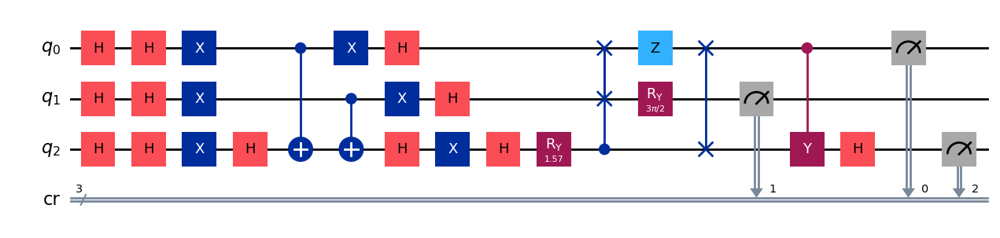

gen = 0 , Best fitness = (0.58,)
gen = 1 , Best fitness = (0.52,) , Number of invalids = 0

[Run 1 | Gen 72/99] Best Fitness: 0.5200 | Fidelity: 1.0000 | Gates: 26


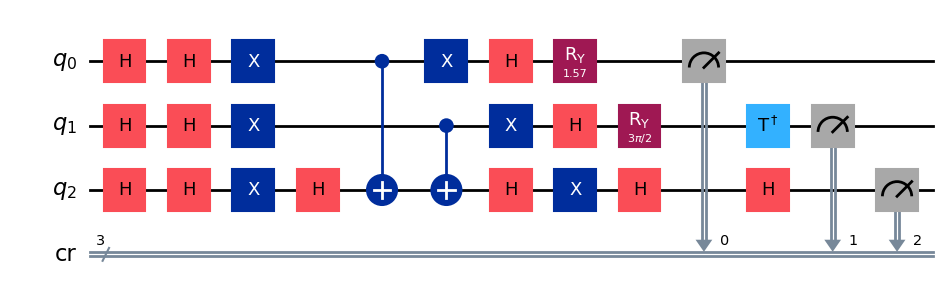

gen = 0 , Best fitness = (0.52,)
gen = 1 , Best fitness = (0.52,) , Number of invalids = 0

[Run 1 | Gen 73/99] Best Fitness: 0.5200 | Fidelity: 1.0000 | Gates: 26


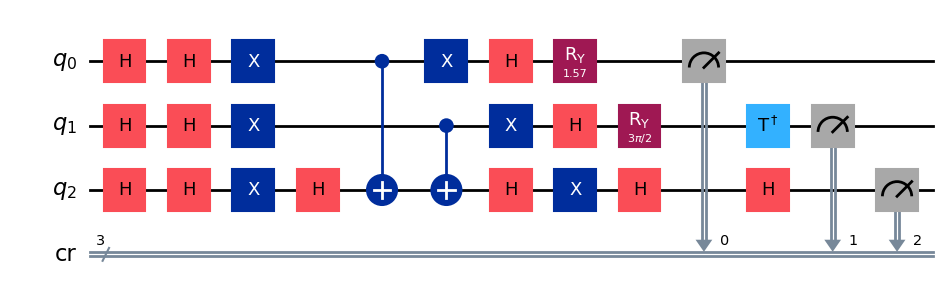

gen = 0 , Best fitness = (0.52,)
gen = 1 , Best fitness = (0.52,) , Number of invalids = 0

[Run 1 | Gen 74/99] Best Fitness: 0.5200 | Fidelity: 1.0000 | Gates: 26


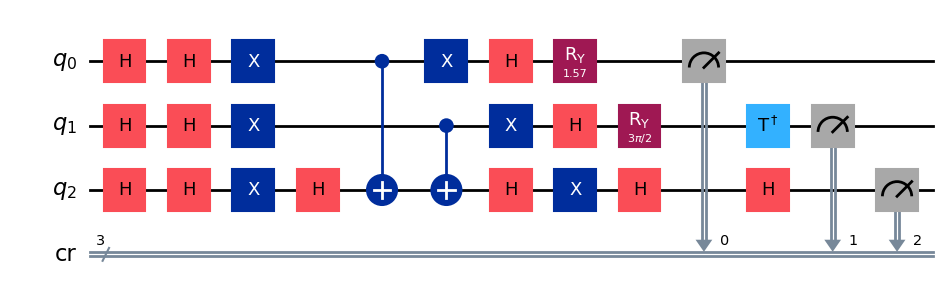

gen = 0 , Best fitness = (0.52,)
gen = 1 , Best fitness = (0.52,) , Number of invalids = 0

[Run 1 | Gen 75/99] Best Fitness: 0.5200 | Fidelity: 1.0000 | Gates: 26


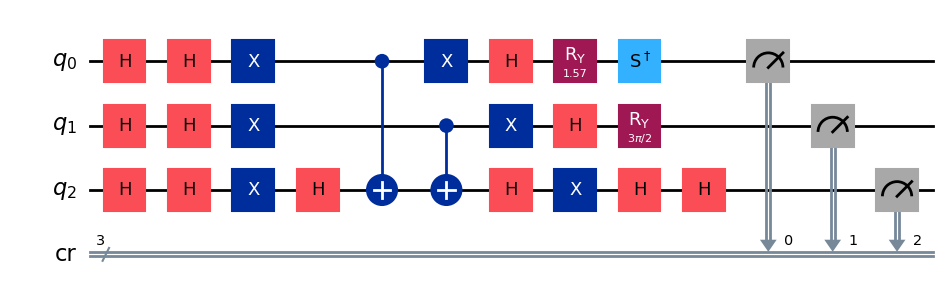

gen = 0 , Best fitness = (0.52,)
gen = 1 , Best fitness = (0.52,) , Number of invalids = 0

[Run 1 | Gen 76/99] Best Fitness: 0.5200 | Fidelity: 1.0000 | Gates: 26


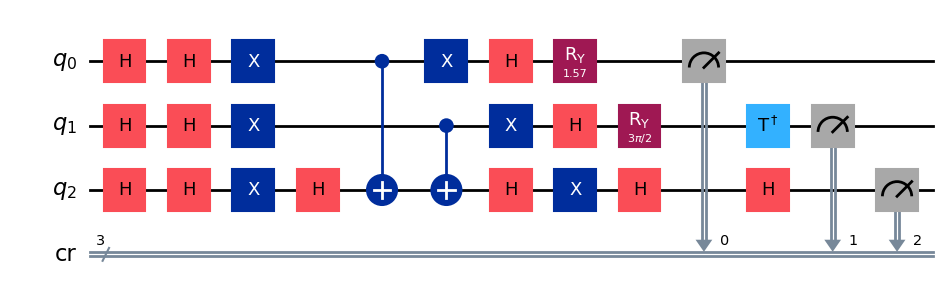

gen = 0 , Best fitness = (0.52,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 77/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


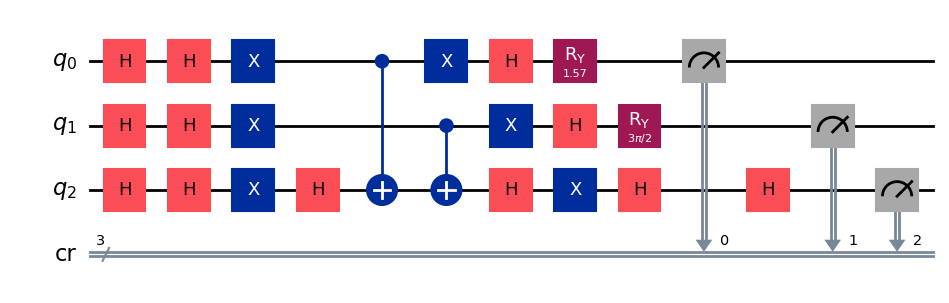

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 78/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


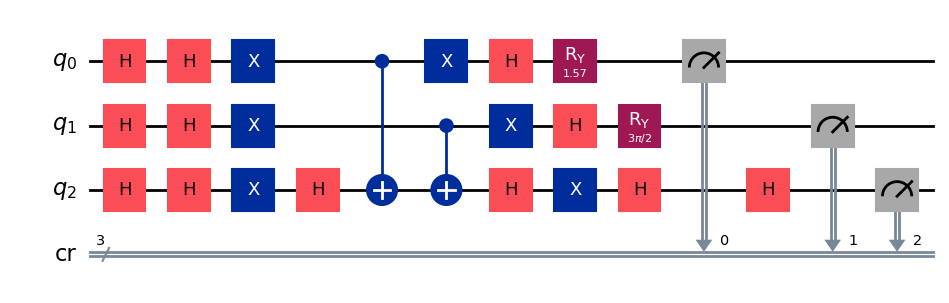

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 79/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


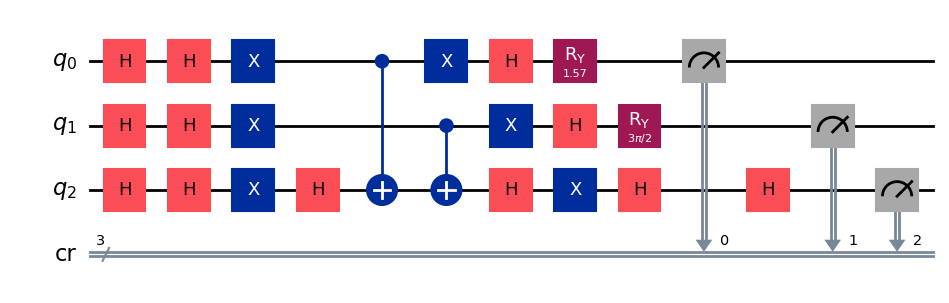

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 80/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


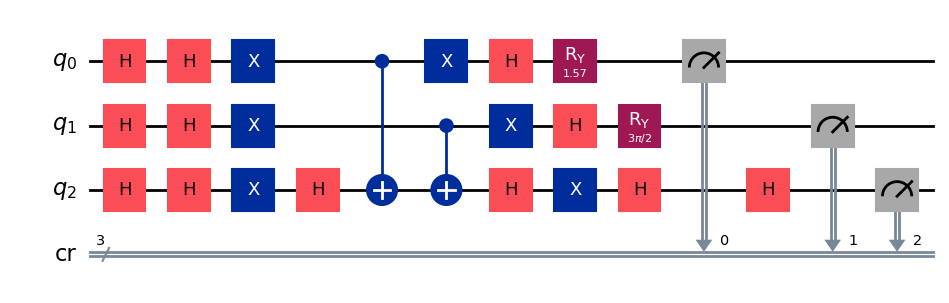

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 81/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


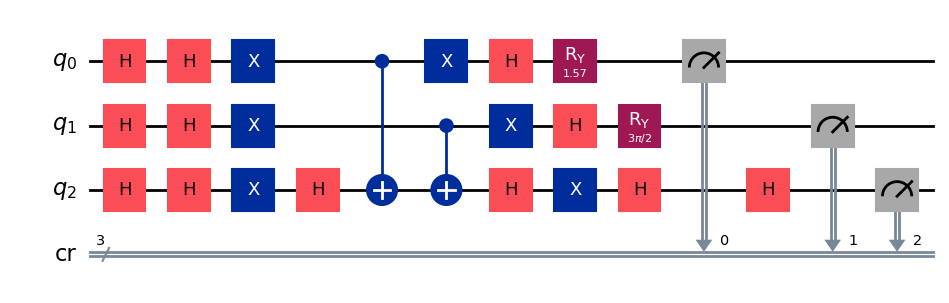

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 82/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


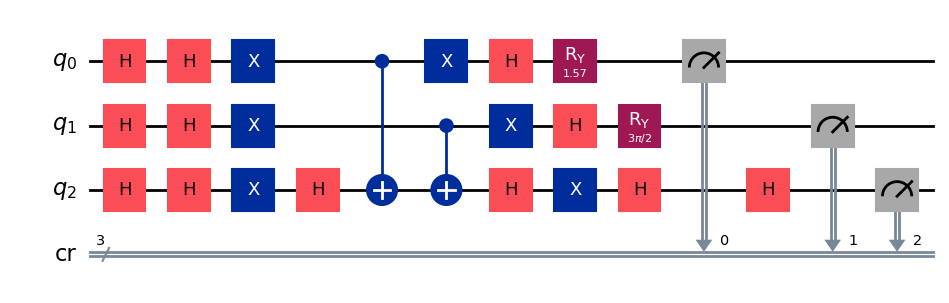

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 83/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


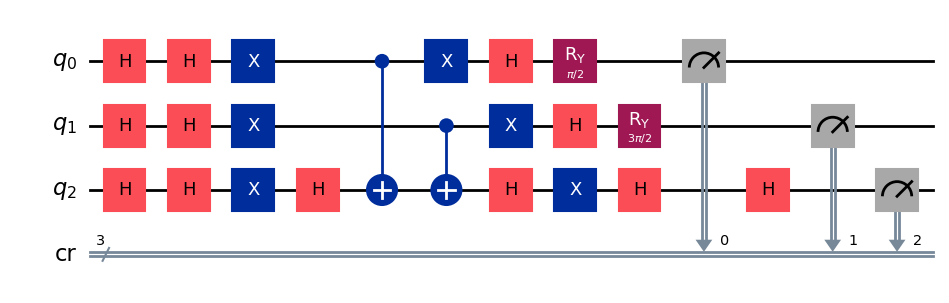

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 84/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


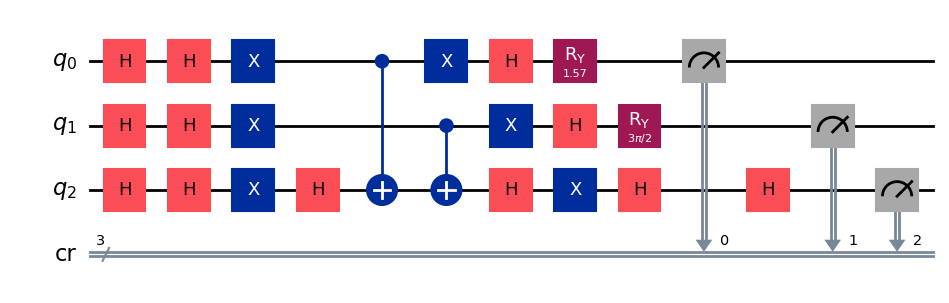

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 85/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


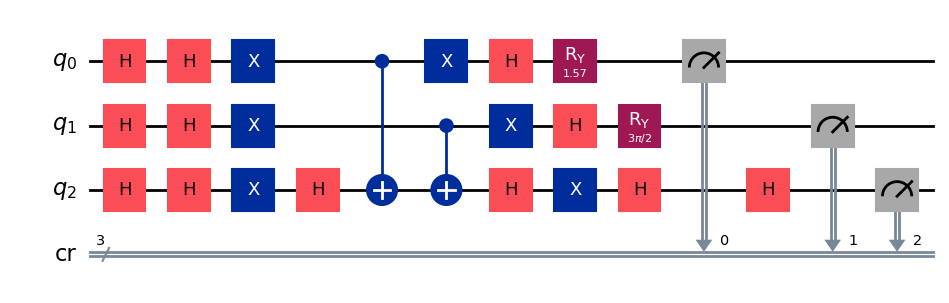

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 86/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


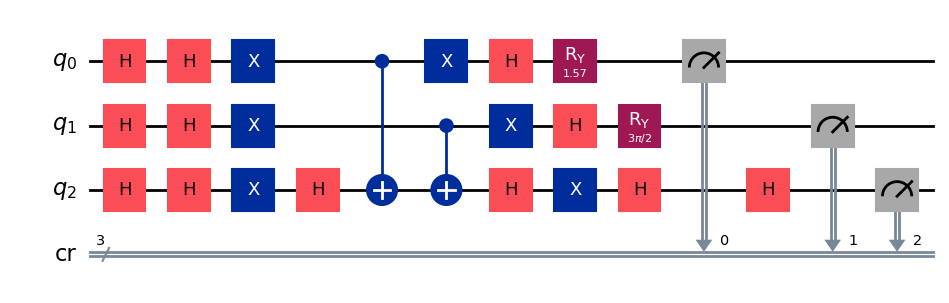

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 87/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


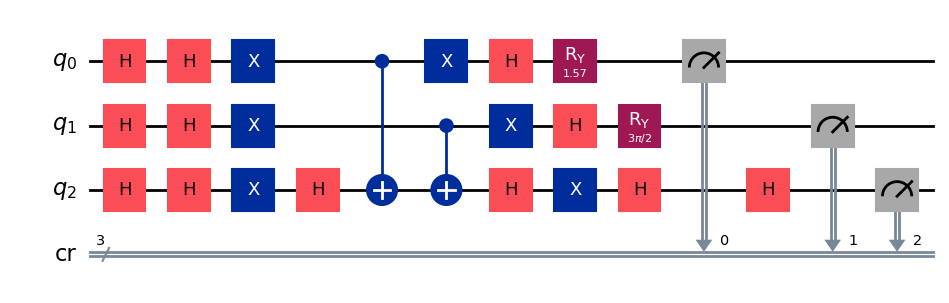

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 88/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


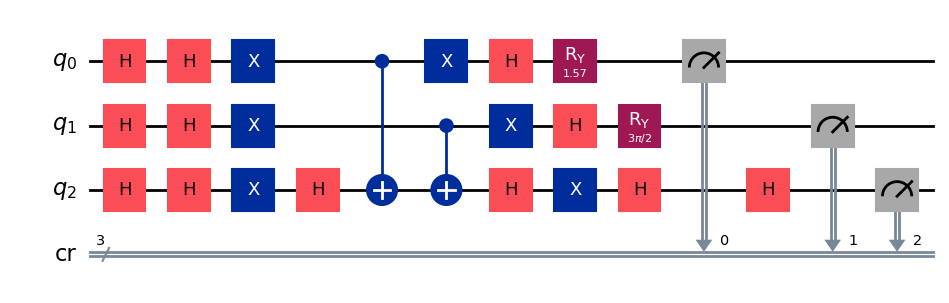

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 89/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


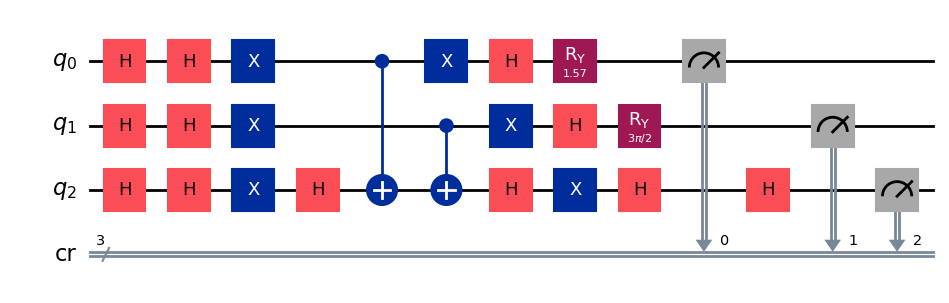

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 90/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


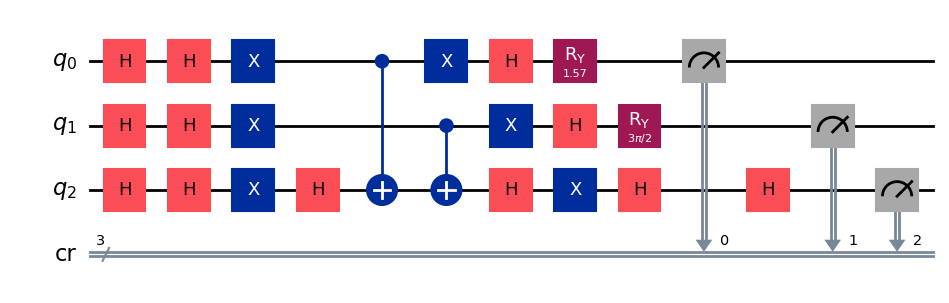

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 91/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


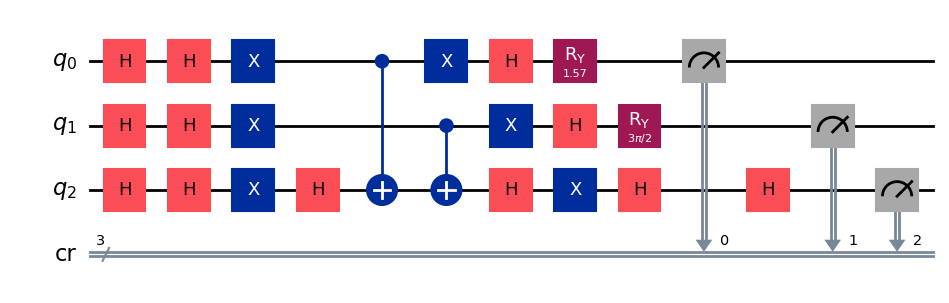

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 92/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


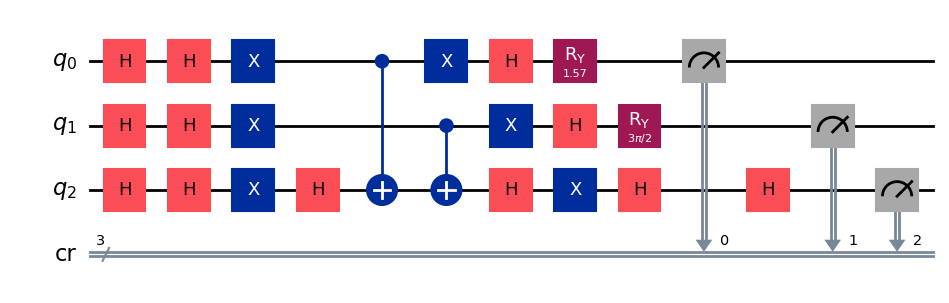

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 93/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


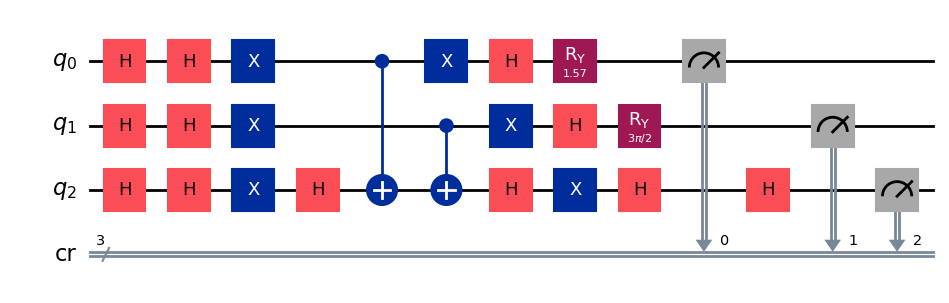

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 94/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


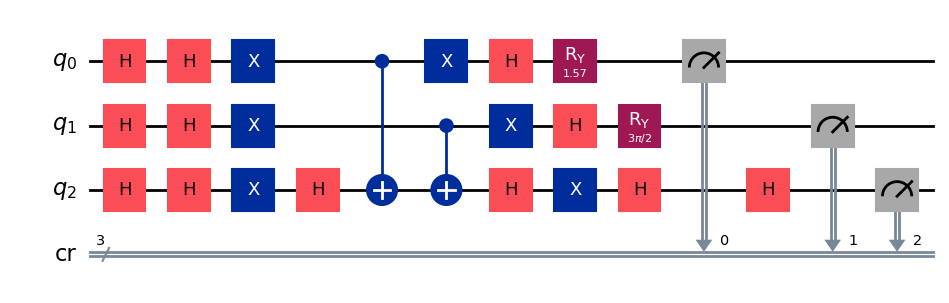

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 95/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


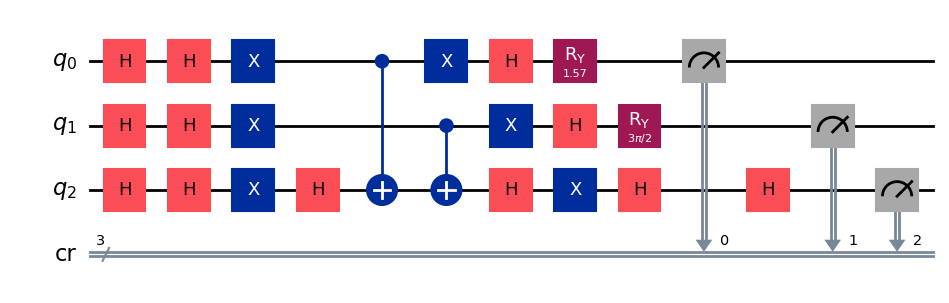

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 96/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


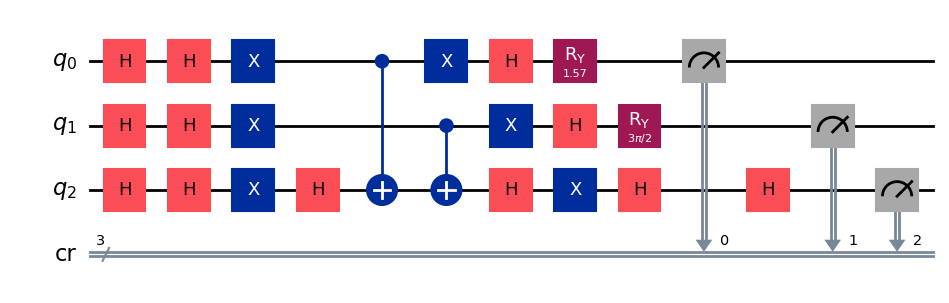

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 97/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


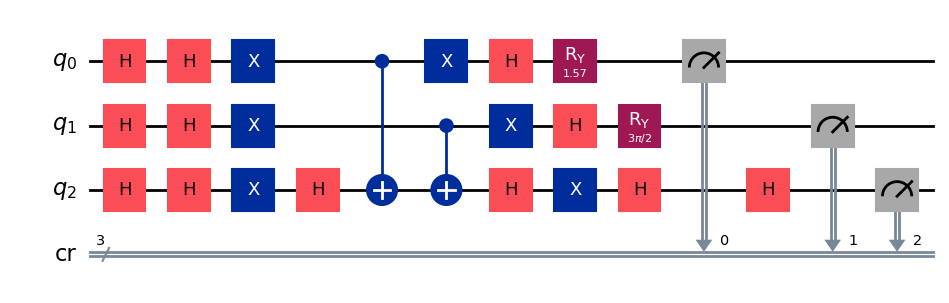

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 98/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


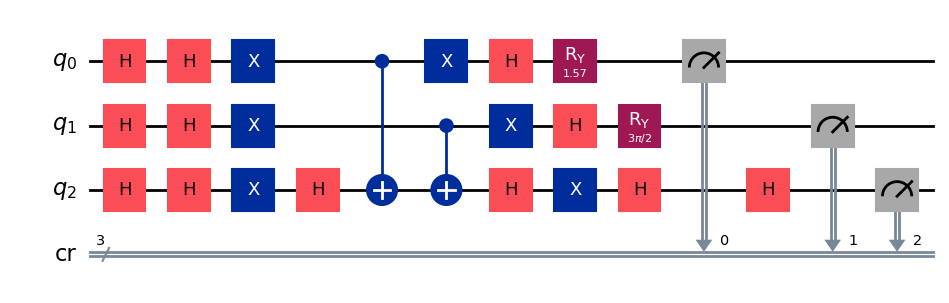

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 1 | Gen 99/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


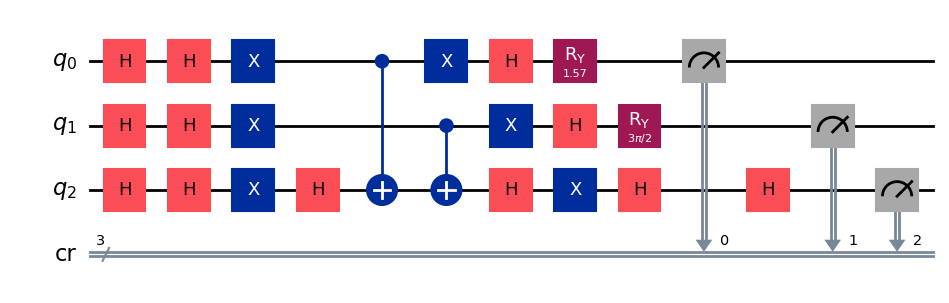


Generating evolution plots for Run 1...
✓ Plot saved to: experiments_state_100/run_1_seed_69681/evolution_metrics_run_1.png


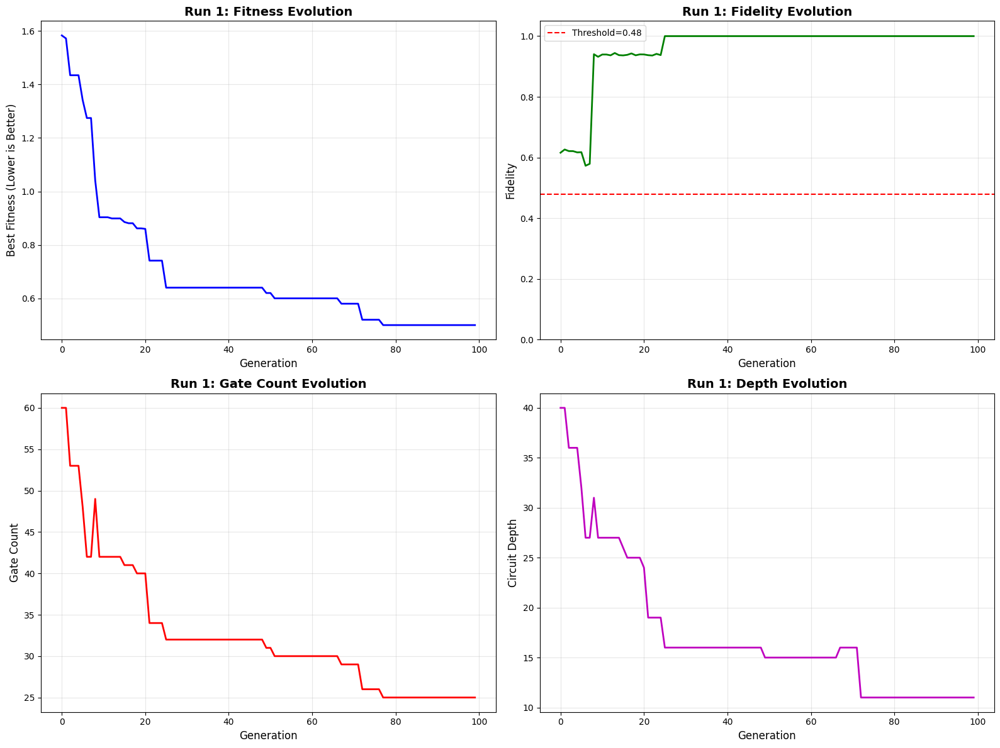


✓ Run 1 COMPLETE | Fidelity: 1.0000 | Gates: 25 | Depth: 11


RUN 2/5 | Target: 100 | Seed: 38083
✓ Logging to: experiments_state_100/run_2_seed_38083
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.5192,)
gen = 1 , Best fitness = (1.2126000000000001,) , Number of invalids = 141

[Run 2 | Gen 0/99] Best Fitness: 1.2126 | Fidelity: 0.5619 | Gates: 39


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


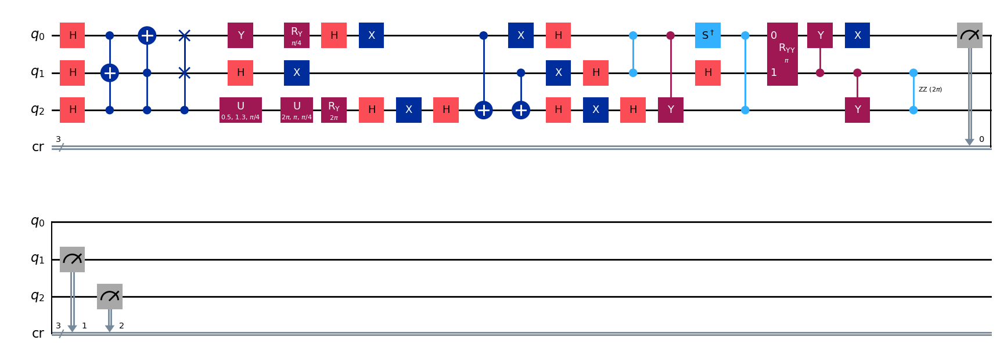

gen = 0 , Best fitness = (1.2126000000000001,)
gen = 1 , Best fitness = (1.2126000000000001,) , Number of invalids = 70

[Run 2 | Gen 1/99] Best Fitness: 1.2126 | Fidelity: 0.5596 | Gates: 39


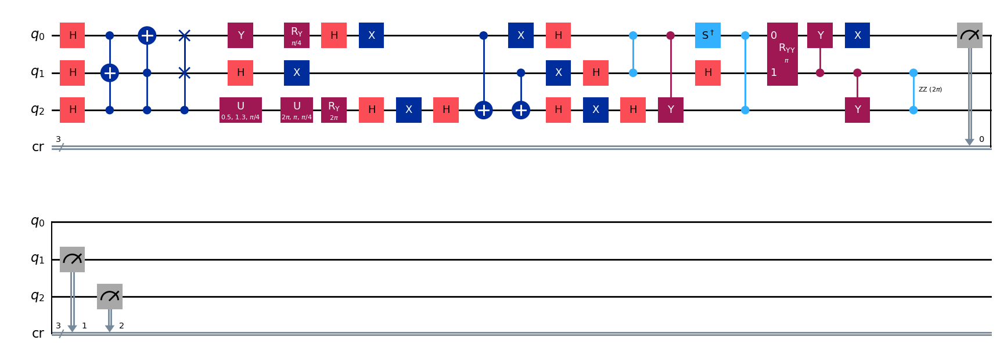

gen = 0 , Best fitness = (1.2126000000000001,)
gen = 1 , Best fitness = (1.2126000000000001,) , Number of invalids = 57

[Run 2 | Gen 2/99] Best Fitness: 1.2126 | Fidelity: 0.5697 | Gates: 39


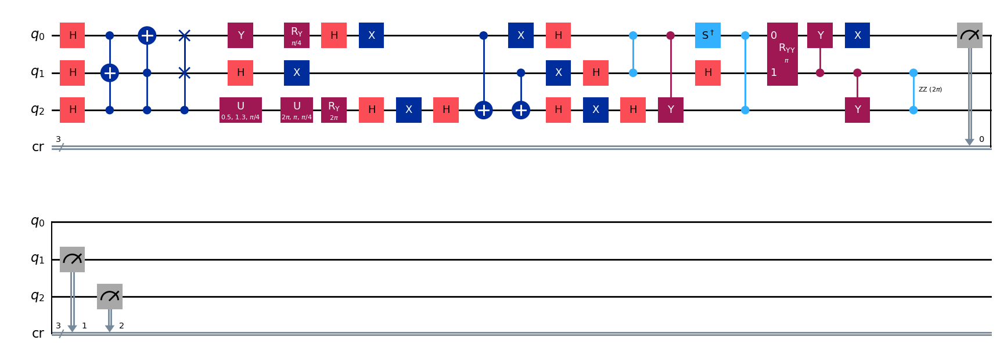

gen = 0 , Best fitness = (1.2126000000000001,)
gen = 1 , Best fitness = (1.2126000000000001,) , Number of invalids = 36

[Run 2 | Gen 3/99] Best Fitness: 1.2126 | Fidelity: 0.5612 | Gates: 39


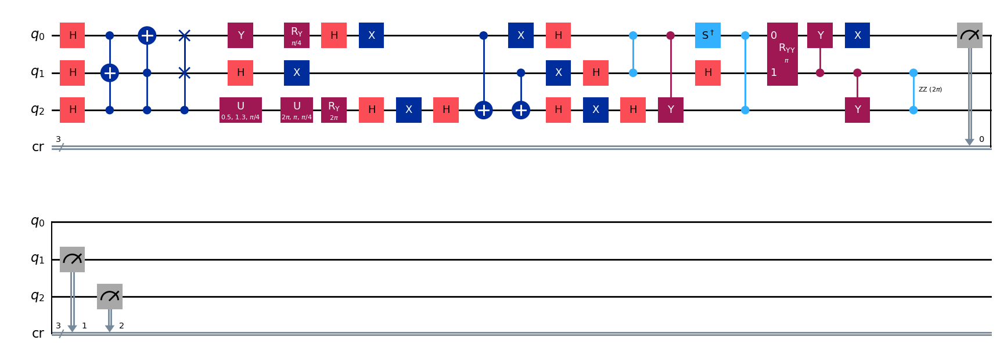

gen = 0 , Best fitness = (1.2126000000000001,)
gen = 1 , Best fitness = (1.1939,) , Number of invalids = 22

[Run 2 | Gen 4/99] Best Fitness: 1.1939 | Fidelity: 0.5669 | Gates: 38


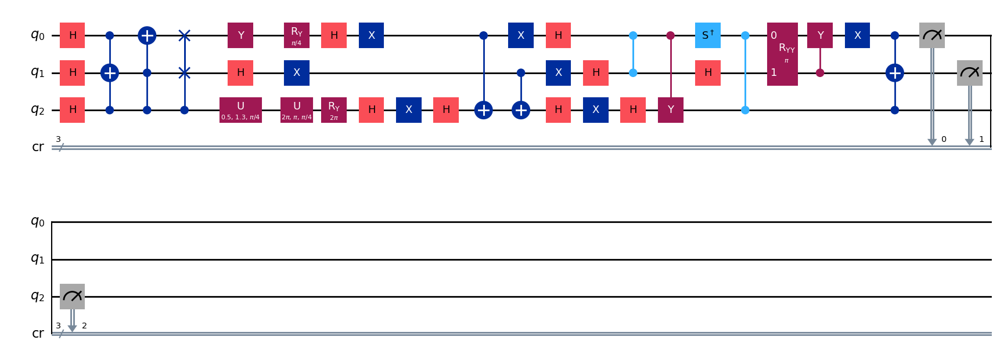

gen = 0 , Best fitness = (1.1939,)
gen = 1 , Best fitness = (1.1898,) , Number of invalids = 18

[Run 2 | Gen 5/99] Best Fitness: 1.1898 | Fidelity: 0.5516 | Gates: 38


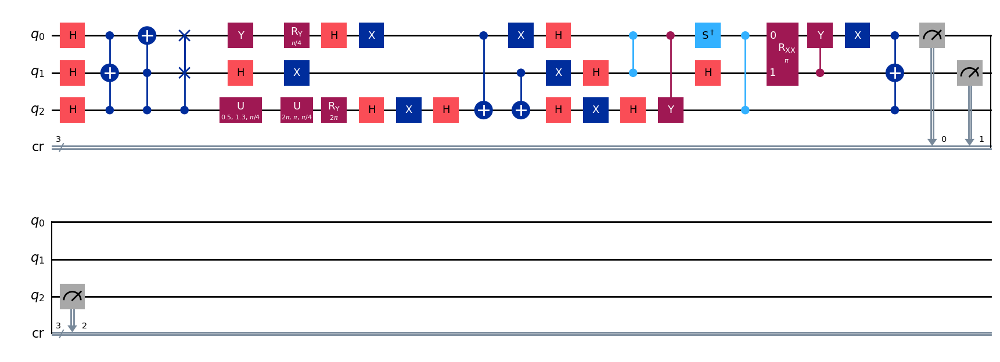

gen = 0 , Best fitness = (1.1898,)
gen = 1 , Best fitness = (1.1898,) , Number of invalids = 16

[Run 2 | Gen 6/99] Best Fitness: 1.1898 | Fidelity: 0.5685 | Gates: 38


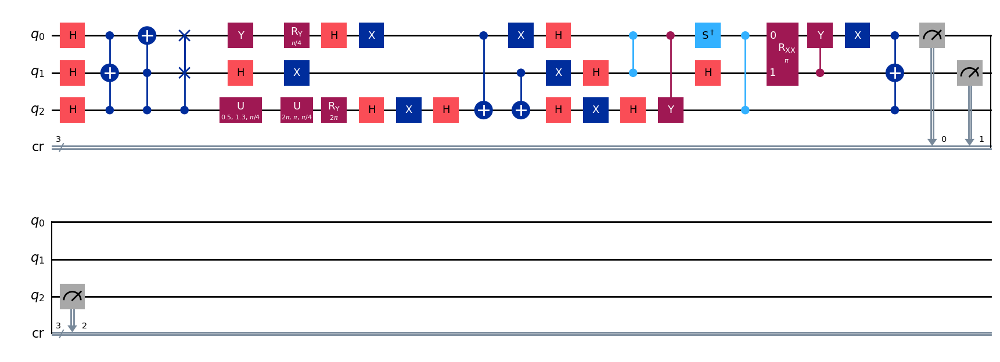

gen = 0 , Best fitness = (1.1898,)
gen = 1 , Best fitness = (1.1898,) , Number of invalids = 17

[Run 2 | Gen 7/99] Best Fitness: 1.1898 | Fidelity: 0.5673 | Gates: 38


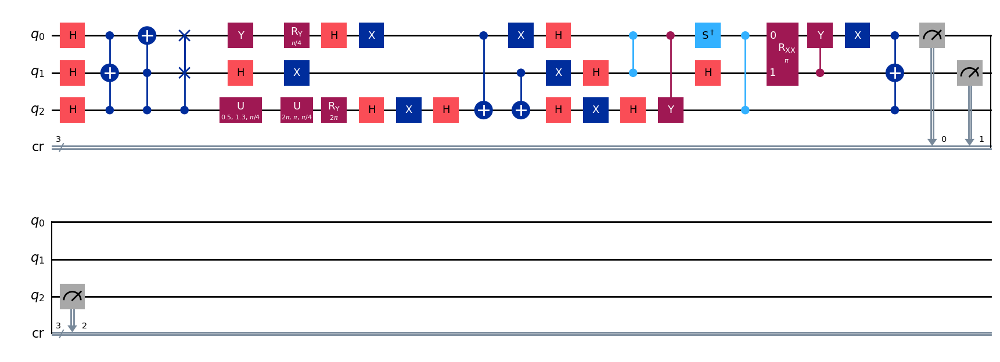

gen = 0 , Best fitness = (1.1898,)
gen = 1 , Best fitness = (1.0541,) , Number of invalids = 4

[Run 2 | Gen 8/99] Best Fitness: 1.0541 | Fidelity: 0.5646 | Gates: 31


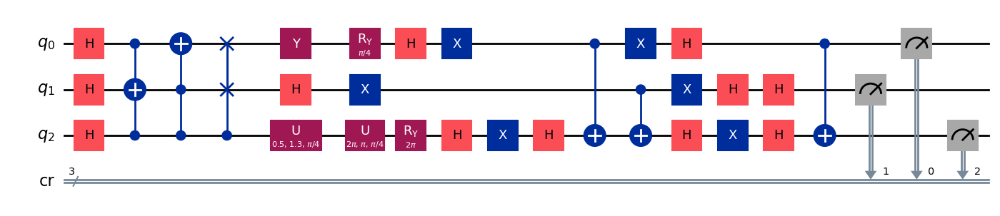

gen = 0 , Best fitness = (1.0541,)
gen = 1 , Best fitness = (1.0541,) , Number of invalids = 8

[Run 2 | Gen 9/99] Best Fitness: 1.0541 | Fidelity: 0.5614 | Gates: 31


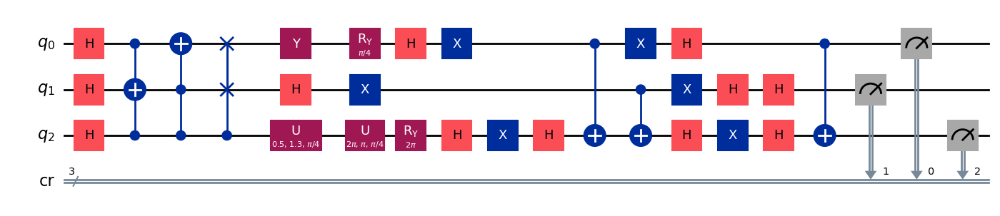

gen = 0 , Best fitness = (1.0541,)
gen = 1 , Best fitness = (1.0535,) , Number of invalids = 11

[Run 2 | Gen 10/99] Best Fitness: 1.0535 | Fidelity: 0.5671 | Gates: 31


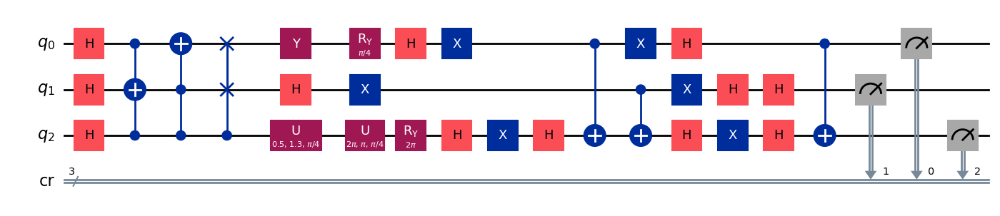

gen = 0 , Best fitness = (1.0535,)
gen = 1 , Best fitness = (1.0535,) , Number of invalids = 15

[Run 2 | Gen 11/99] Best Fitness: 1.0535 | Fidelity: 0.5702 | Gates: 31


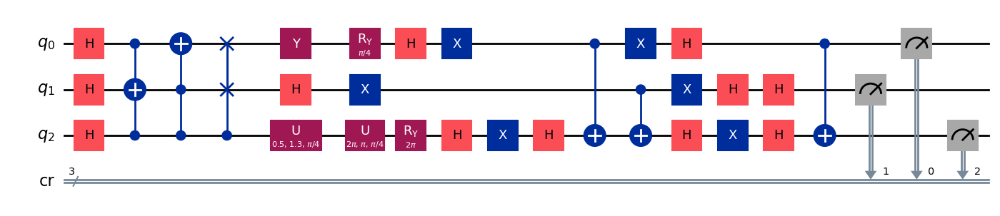

gen = 0 , Best fitness = (1.0535,)
gen = 1 , Best fitness = (1.0493999999999999,) , Number of invalids = 10

[Run 2 | Gen 12/99] Best Fitness: 1.0494 | Fidelity: 0.5631 | Gates: 31


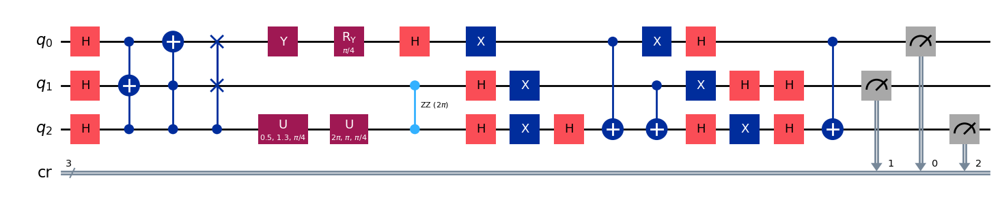

gen = 0 , Best fitness = (1.0493999999999999,)
gen = 1 , Best fitness = (1.0493999999999999,) , Number of invalids = 12

[Run 2 | Gen 13/99] Best Fitness: 1.0494 | Fidelity: 0.5654 | Gates: 31


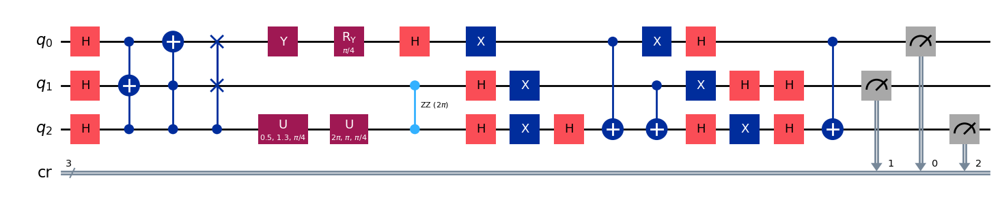

gen = 0 , Best fitness = (1.0493999999999999,)
gen = 1 , Best fitness = (1.0493999999999999,) , Number of invalids = 20

[Run 2 | Gen 14/99] Best Fitness: 1.0494 | Fidelity: 0.5591 | Gates: 31


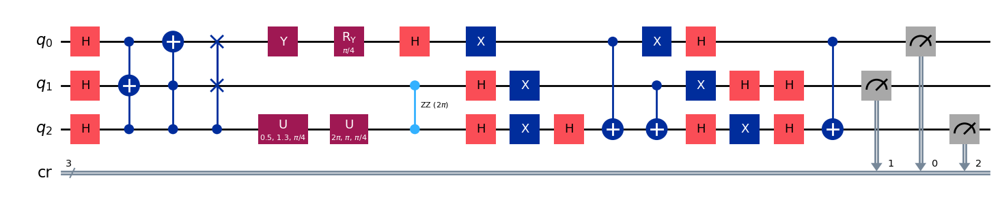

gen = 0 , Best fitness = (1.0493999999999999,)
gen = 1 , Best fitness = (1.0464,) , Number of invalids = 29

[Run 2 | Gen 15/99] Best Fitness: 1.0464 | Fidelity: 0.5631 | Gates: 31


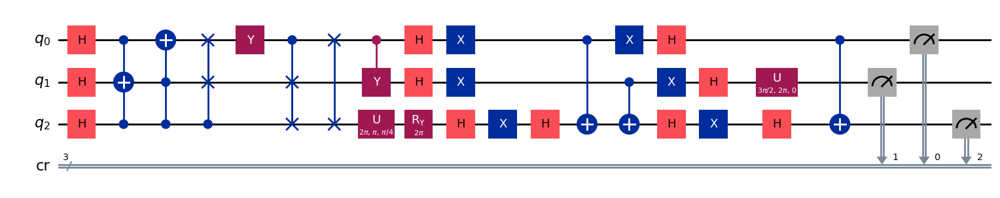

gen = 0 , Best fitness = (1.0464,)
gen = 1 , Best fitness = (1.0464,) , Number of invalids = 23

[Run 2 | Gen 16/99] Best Fitness: 1.0464 | Fidelity: 0.5656 | Gates: 31


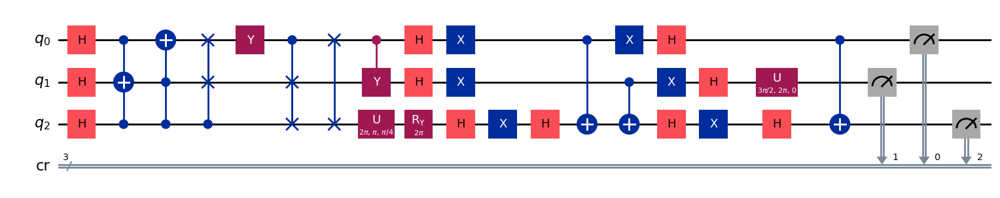

gen = 0 , Best fitness = (1.0464,)
gen = 1 , Best fitness = (1.0464,) , Number of invalids = 21

[Run 2 | Gen 17/99] Best Fitness: 1.0464 | Fidelity: 0.5564 | Gates: 31


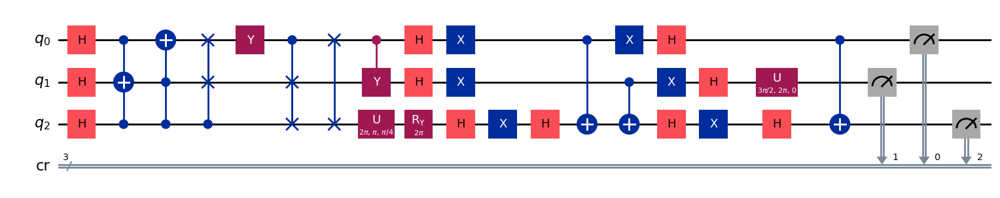

gen = 0 , Best fitness = (1.0464,)
gen = 1 , Best fitness = (1.0003,) , Number of invalids = 32

[Run 2 | Gen 18/99] Best Fitness: 1.0003 | Fidelity: 0.6323 | Gates: 31


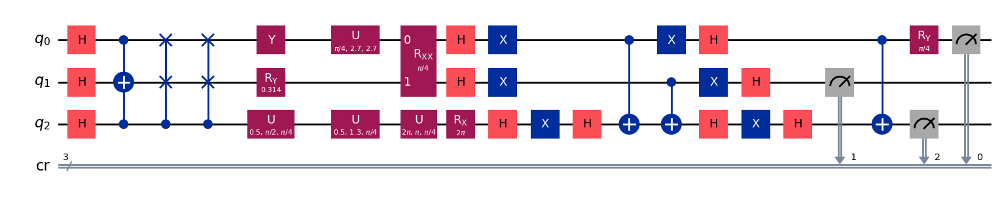

gen = 0 , Best fitness = (1.0003,)
gen = 1 , Best fitness = (1.0003,) , Number of invalids = 28

[Run 2 | Gen 19/99] Best Fitness: 1.0003 | Fidelity: 0.6167 | Gates: 31


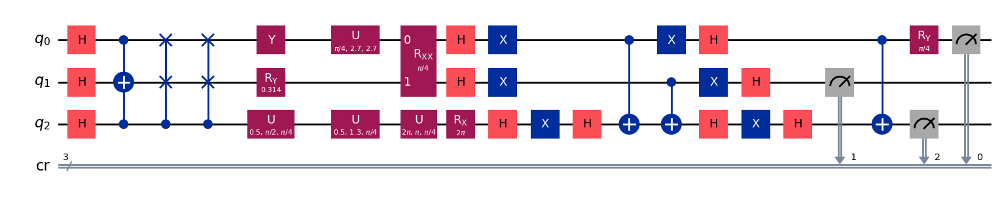

gen = 0 , Best fitness = (1.0003,)
gen = 1 , Best fitness = (1.0003,) , Number of invalids = 17

[Run 2 | Gen 20/99] Best Fitness: 1.0003 | Fidelity: 0.6126 | Gates: 31


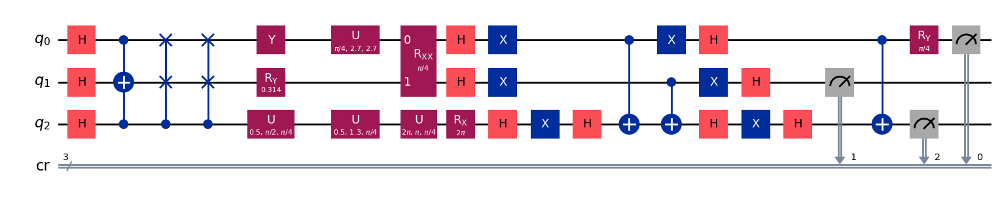

gen = 0 , Best fitness = (1.0003,)
gen = 1 , Best fitness = (0.9938,) , Number of invalids = 29

[Run 2 | Gen 21/99] Best Fitness: 0.9938 | Fidelity: 0.6239 | Gates: 31


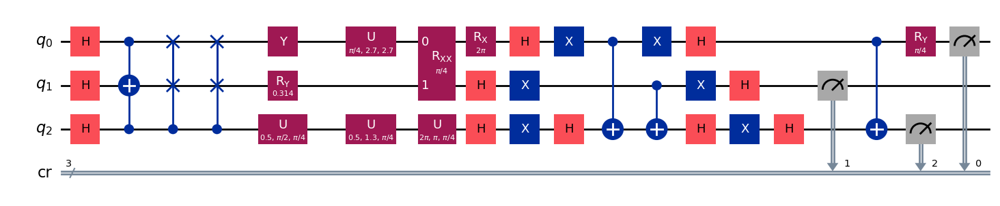

gen = 0 , Best fitness = (0.9938,)
gen = 1 , Best fitness = (0.9938,) , Number of invalids = 25

[Run 2 | Gen 22/99] Best Fitness: 0.9938 | Fidelity: 0.6188 | Gates: 31


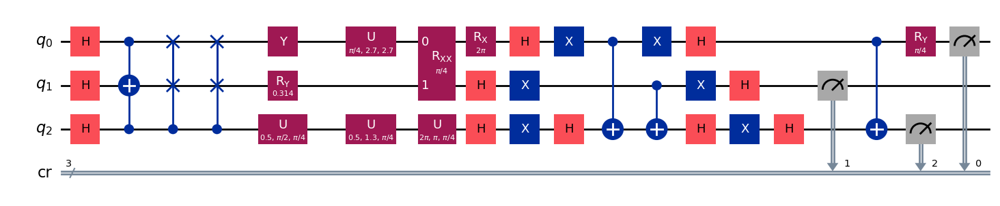

gen = 0 , Best fitness = (0.9938,)
gen = 1 , Best fitness = (0.9931,) , Number of invalids = 25

[Run 2 | Gen 23/99] Best Fitness: 0.9931 | Fidelity: 0.6281 | Gates: 31


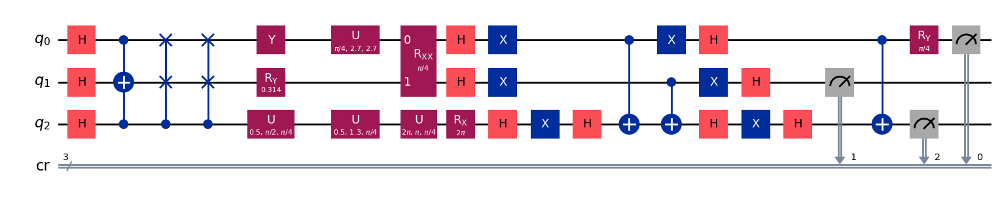

gen = 0 , Best fitness = (0.9931,)
gen = 1 , Best fitness = (0.9914,) , Number of invalids = 24

[Run 2 | Gen 24/99] Best Fitness: 0.9914 | Fidelity: 0.6301 | Gates: 31


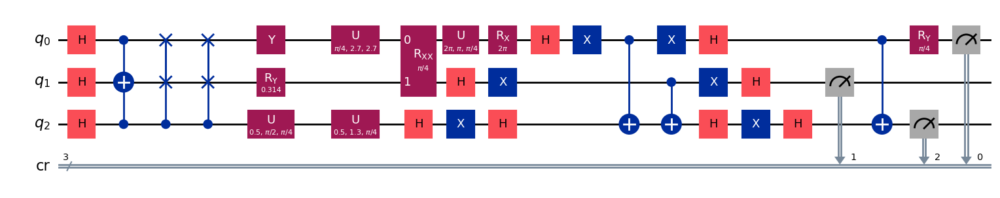

gen = 0 , Best fitness = (0.9914,)
gen = 1 , Best fitness = (0.9897,) , Number of invalids = 25

[Run 2 | Gen 25/99] Best Fitness: 0.9897 | Fidelity: 0.6305 | Gates: 31


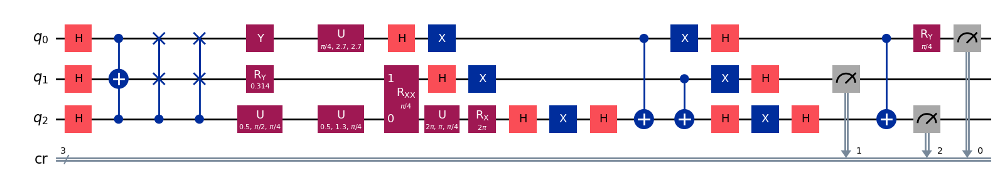

gen = 0 , Best fitness = (0.9897,)
gen = 1 , Best fitness = (0.9865,) , Number of invalids = 21

[Run 2 | Gen 26/99] Best Fitness: 0.9865 | Fidelity: 0.6179 | Gates: 31


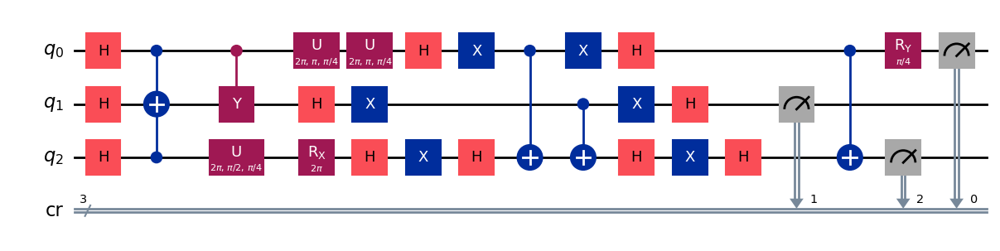

gen = 0 , Best fitness = (0.9865,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 14

[Run 2 | Gen 27/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


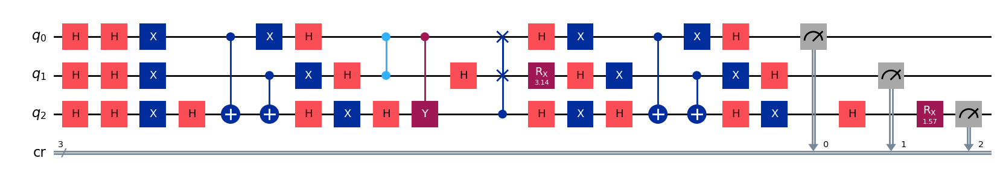

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 18

[Run 2 | Gen 28/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


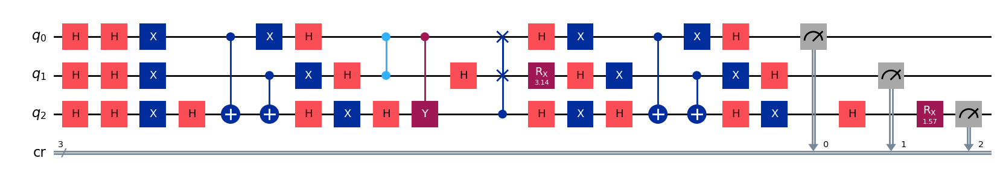

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 16

[Run 2 | Gen 29/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


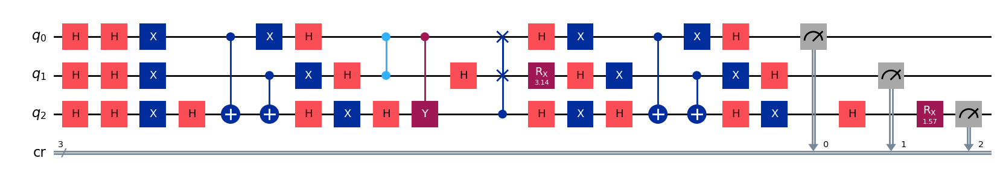

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 11

[Run 2 | Gen 30/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


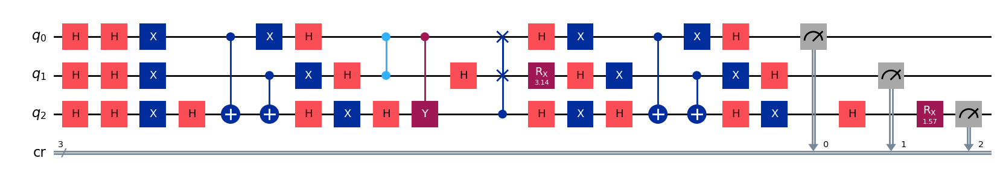

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 9

[Run 2 | Gen 31/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


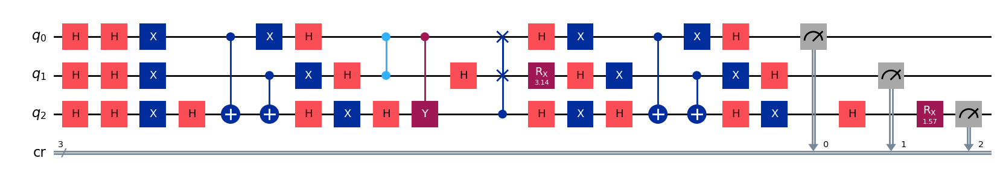

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 10

[Run 2 | Gen 32/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


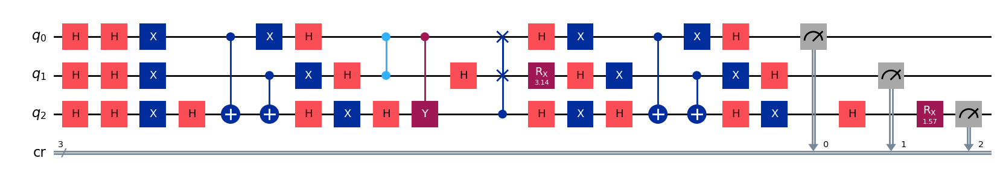

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 6

[Run 2 | Gen 33/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


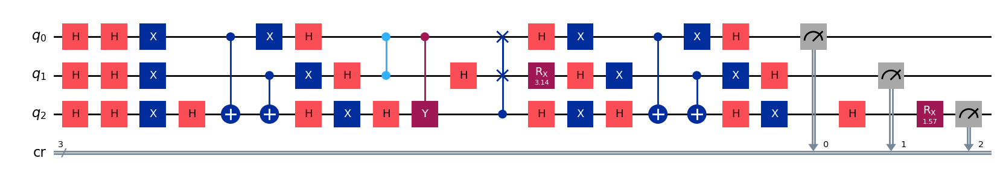

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 7

[Run 2 | Gen 34/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


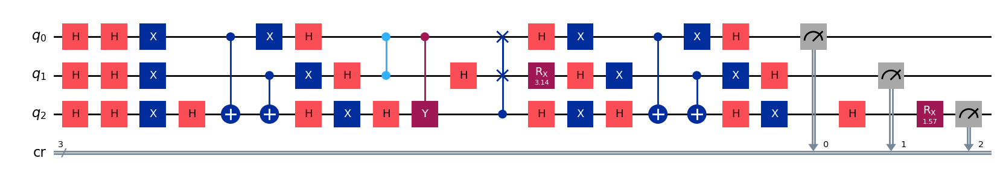

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 5

[Run 2 | Gen 35/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


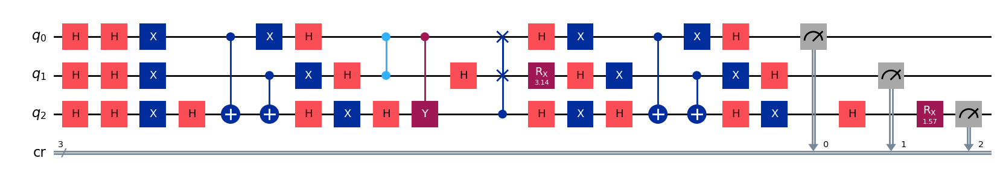

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 6

[Run 2 | Gen 36/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


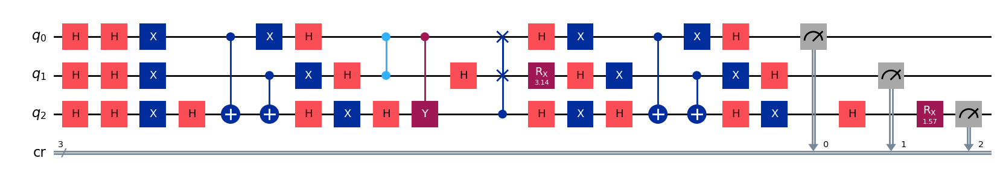

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 2

[Run 2 | Gen 37/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


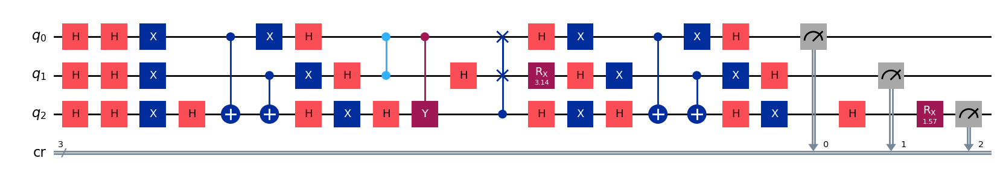

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 11

[Run 2 | Gen 38/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


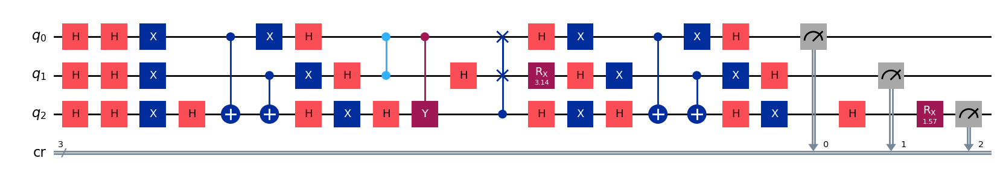

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 5

[Run 2 | Gen 39/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


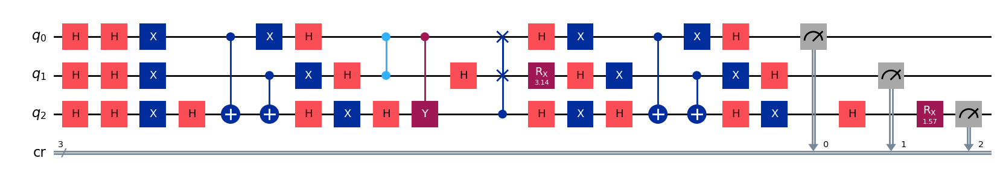

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 11

[Run 2 | Gen 40/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


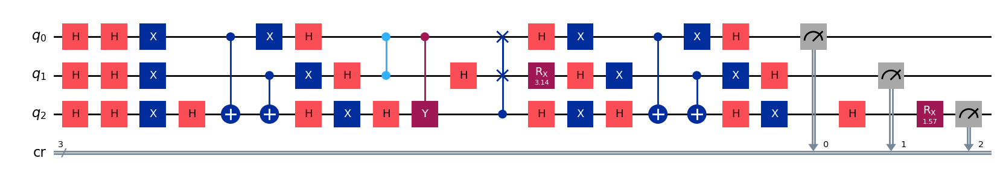

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 13

[Run 2 | Gen 41/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


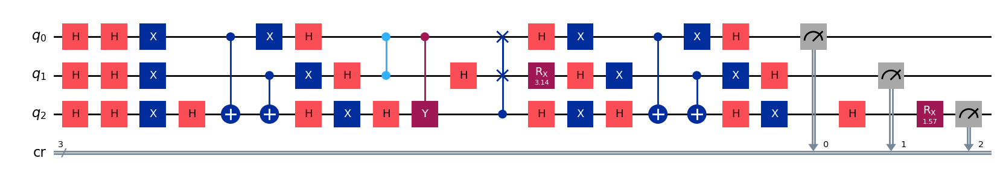

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 12

[Run 2 | Gen 42/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


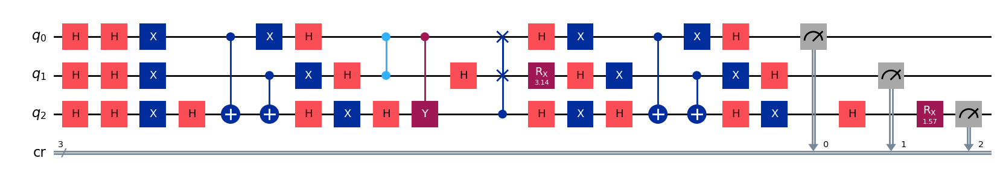

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 5

[Run 2 | Gen 43/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


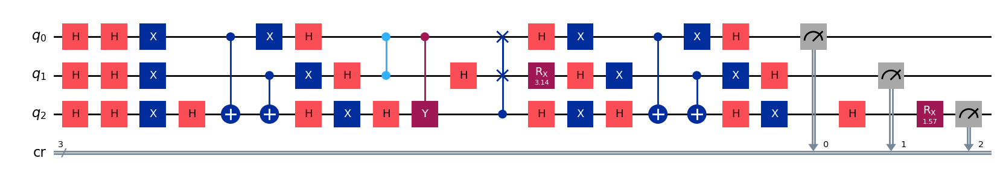

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 6

[Run 2 | Gen 44/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


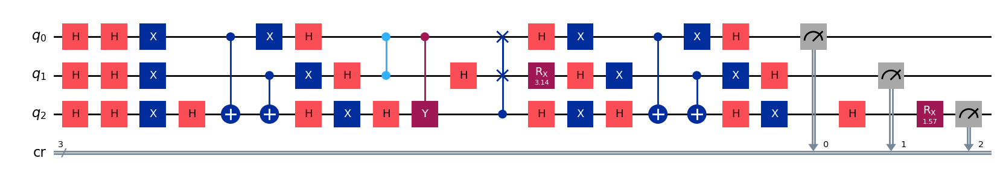

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 8

[Run 2 | Gen 45/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


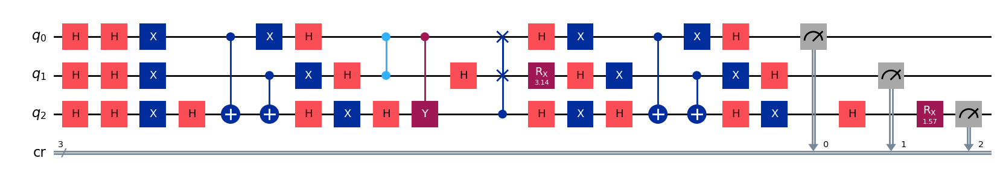

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 5

[Run 2 | Gen 46/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


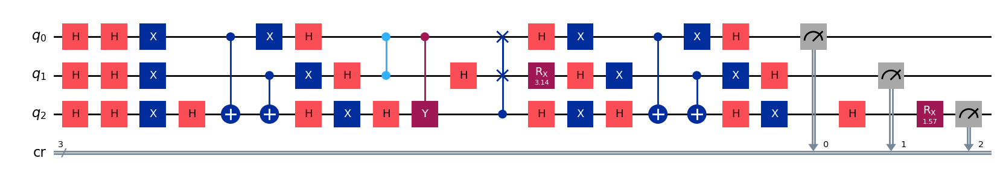

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 7

[Run 2 | Gen 47/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


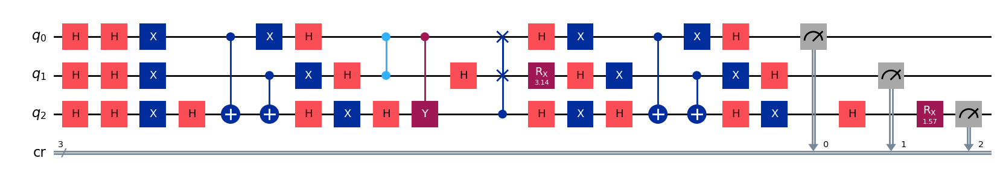

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 8

[Run 2 | Gen 48/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


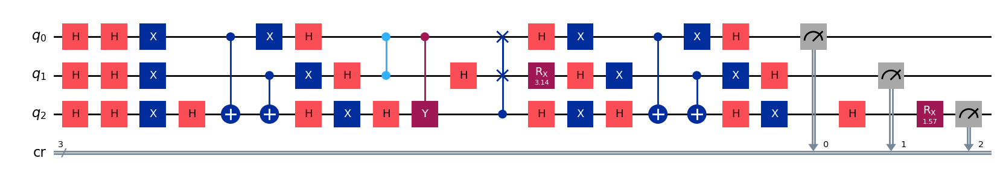

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.88,) , Number of invalids = 9

[Run 2 | Gen 49/99] Best Fitness: 0.8800 | Fidelity: 1.0000 | Gates: 44


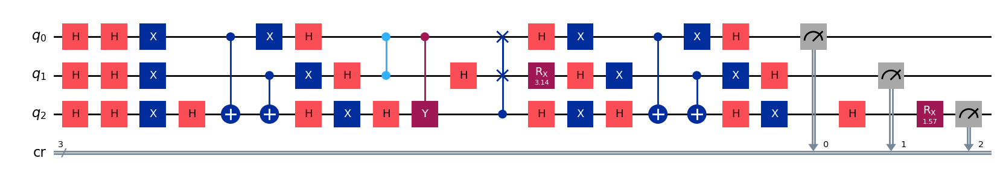

gen = 0 , Best fitness = (0.88,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 13

[Run 2 | Gen 50/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


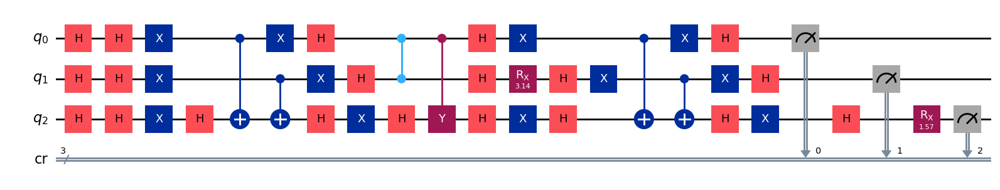

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 9

[Run 2 | Gen 51/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


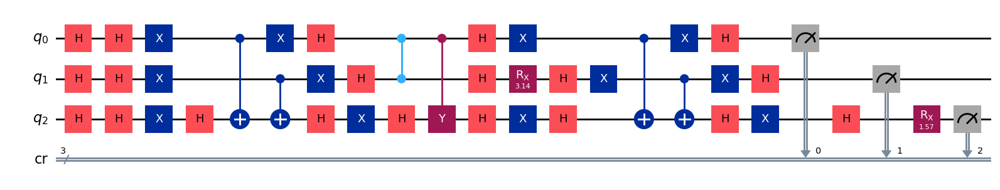

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 8

[Run 2 | Gen 52/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


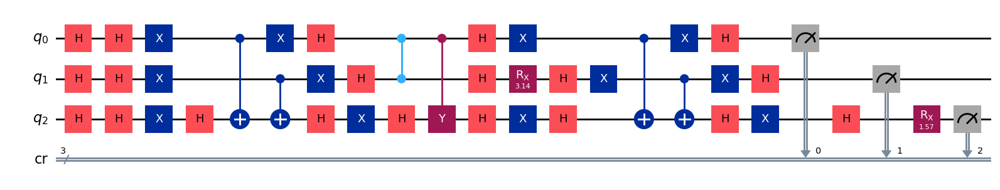

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 14

[Run 2 | Gen 53/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


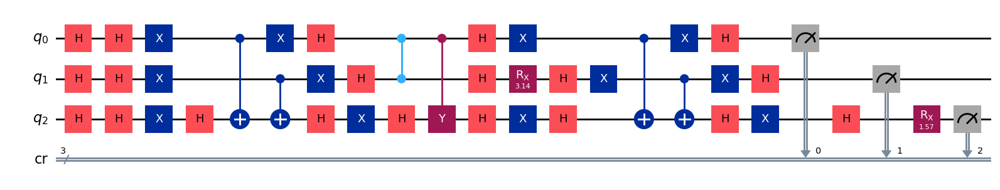

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 14

[Run 2 | Gen 54/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


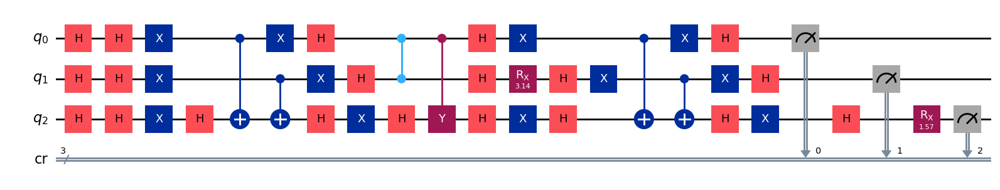

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 4

[Run 2 | Gen 55/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


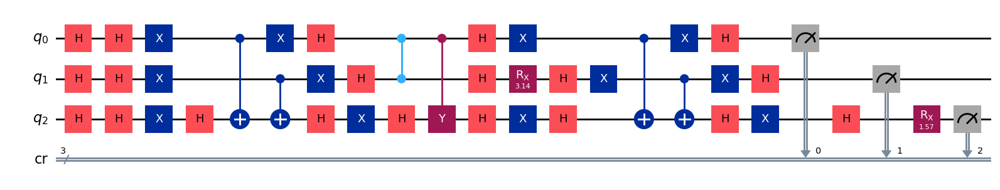

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 5

[Run 2 | Gen 56/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


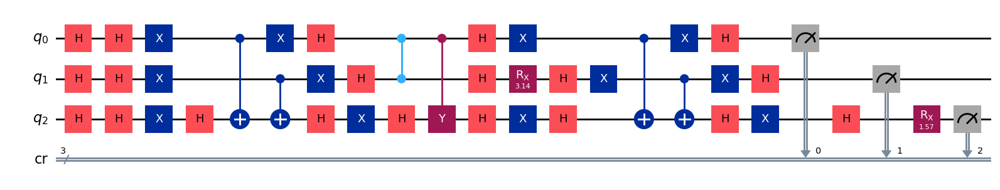

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 4

[Run 2 | Gen 57/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


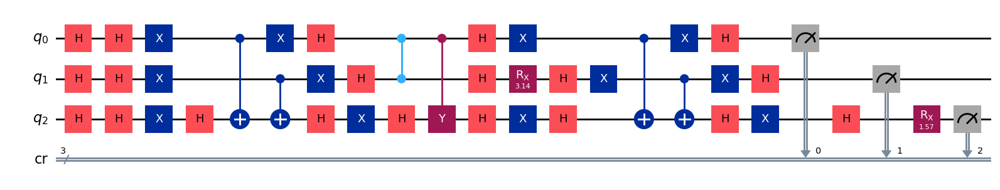

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 5

[Run 2 | Gen 58/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


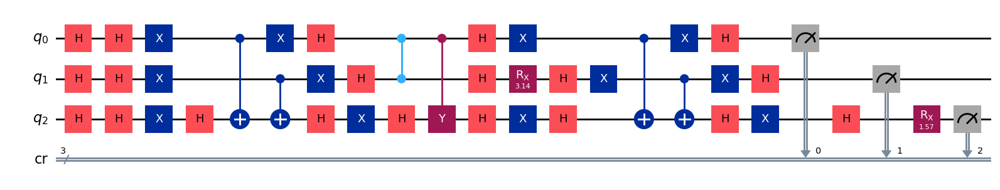

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 6

[Run 2 | Gen 59/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


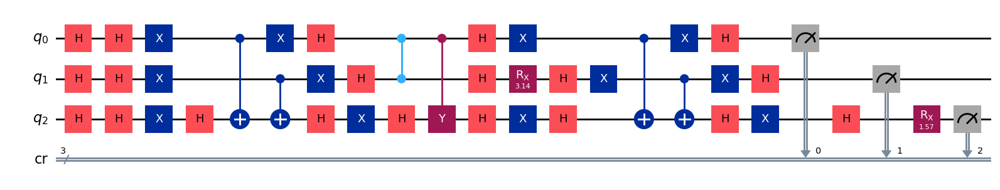

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 11

[Run 2 | Gen 60/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


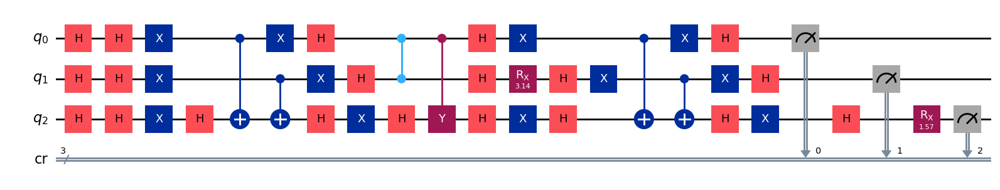

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 9

[Run 2 | Gen 61/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


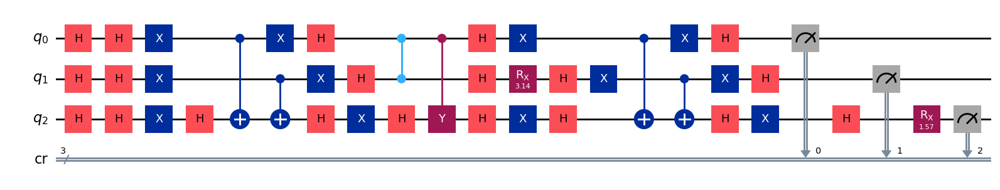

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 7

[Run 2 | Gen 62/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


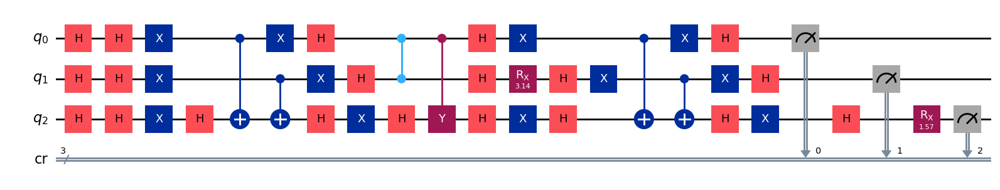

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 6

[Run 2 | Gen 63/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


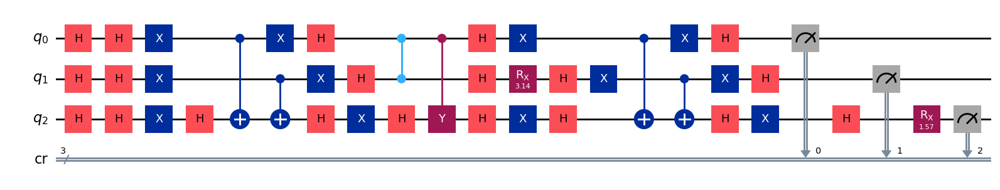

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 7

[Run 2 | Gen 64/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


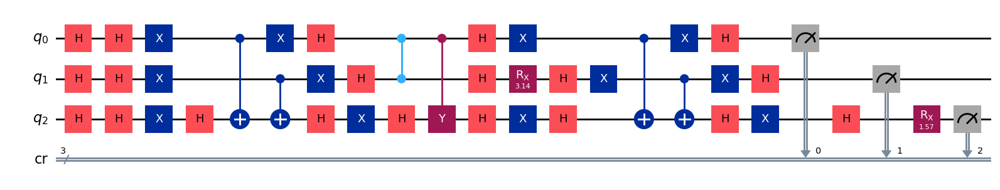

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 2

[Run 2 | Gen 65/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


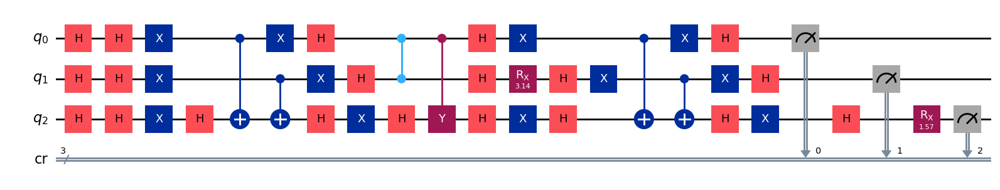

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 9

[Run 2 | Gen 66/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


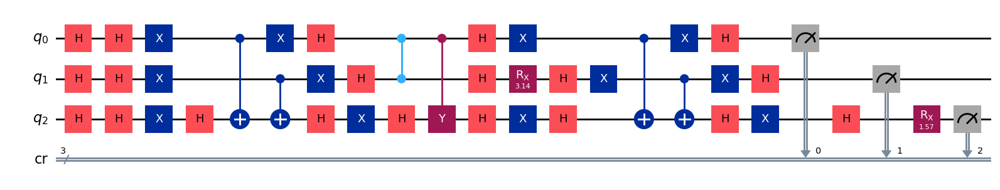

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 10

[Run 2 | Gen 67/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


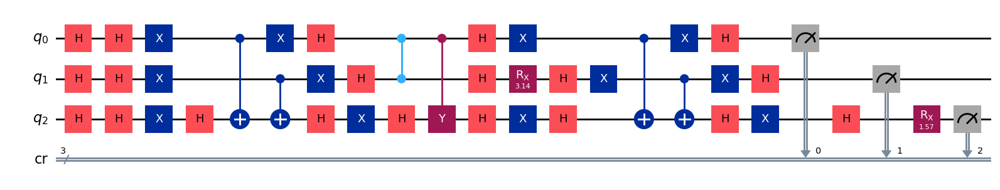

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 12

[Run 2 | Gen 68/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


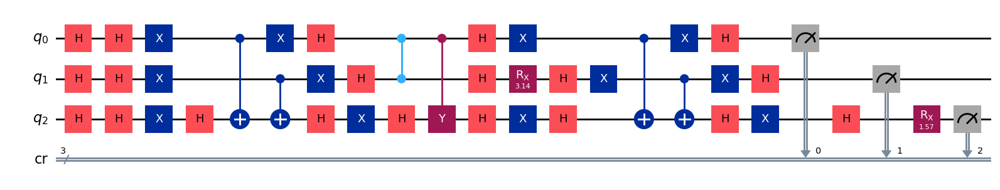

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 11

[Run 2 | Gen 69/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


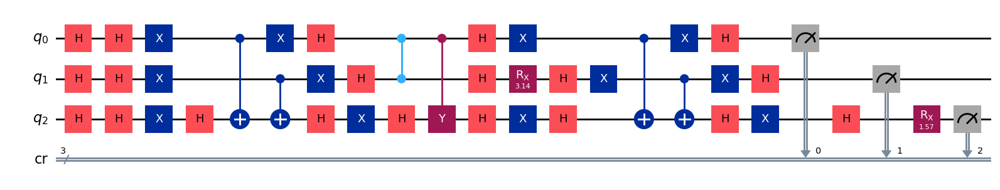

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 12

[Run 2 | Gen 70/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


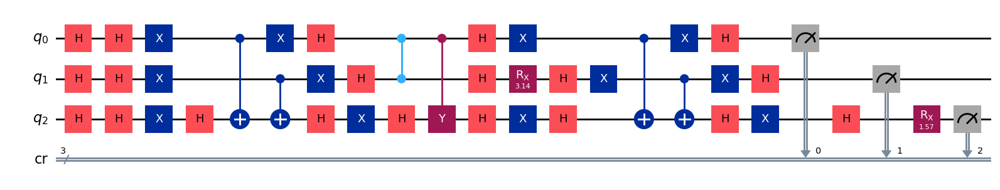

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 13

[Run 2 | Gen 71/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


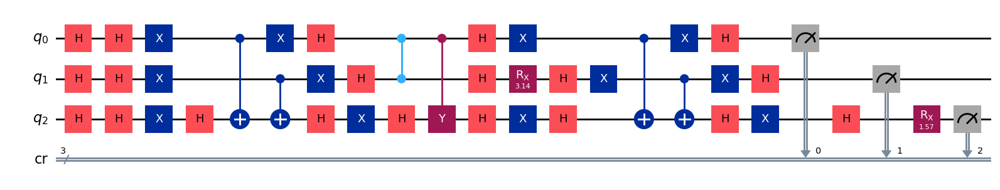

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 11

[Run 2 | Gen 72/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


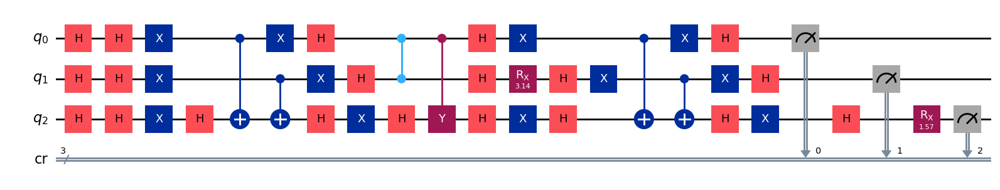

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 14

[Run 2 | Gen 73/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


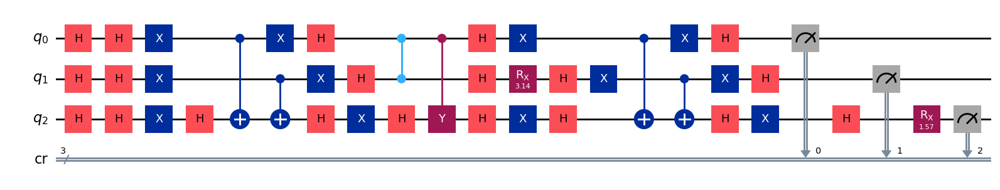

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 19

[Run 2 | Gen 74/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


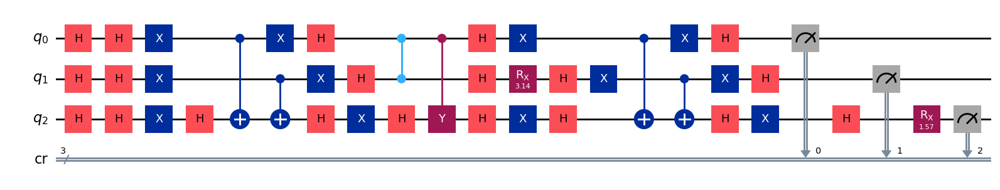

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 10

[Run 2 | Gen 75/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


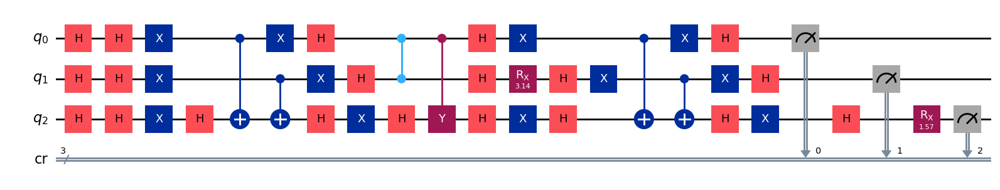

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 13

[Run 2 | Gen 76/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


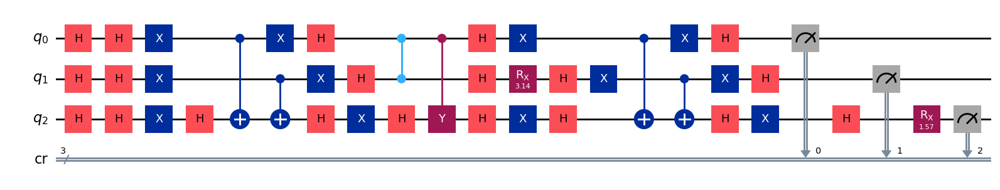

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 12

[Run 2 | Gen 77/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


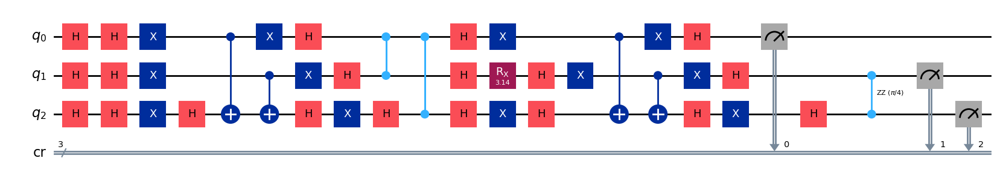

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 10

[Run 2 | Gen 78/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


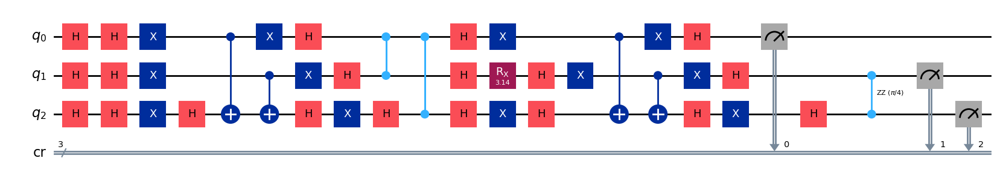

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 19

[Run 2 | Gen 79/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


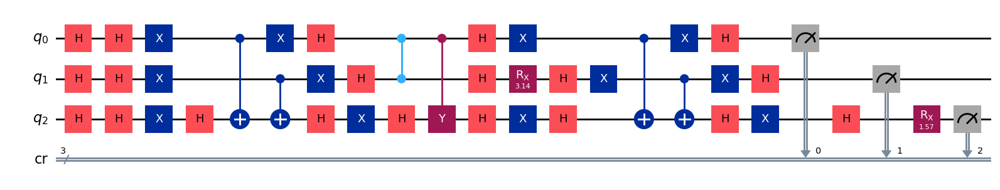

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 9

[Run 2 | Gen 80/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


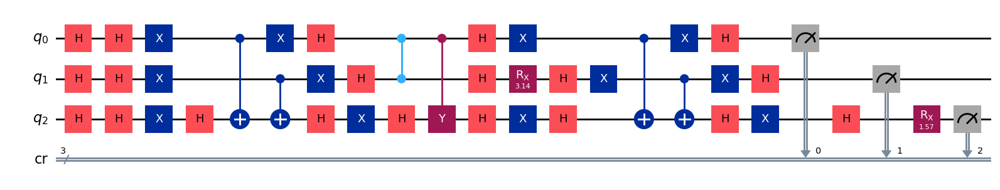

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 8

[Run 2 | Gen 81/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


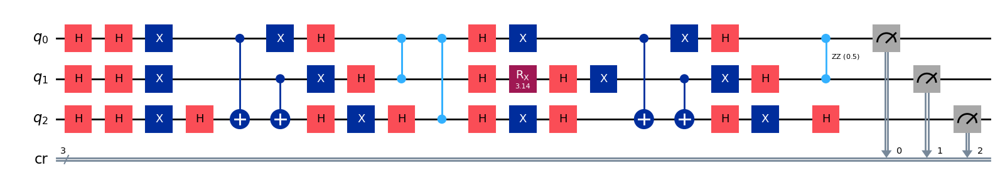

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 9

[Run 2 | Gen 82/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


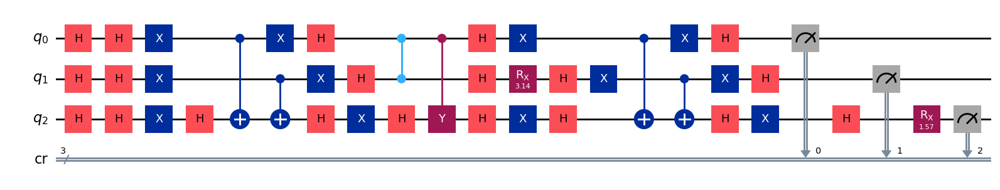

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 2

[Run 2 | Gen 83/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


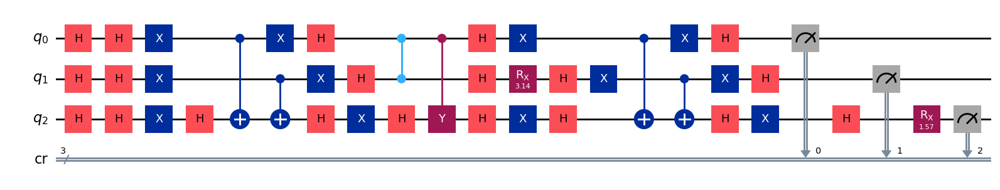

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 7

[Run 2 | Gen 84/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


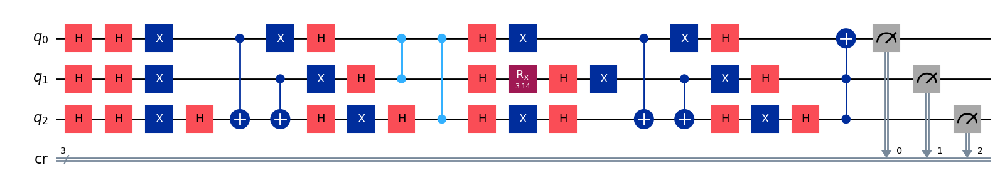

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 3

[Run 2 | Gen 85/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


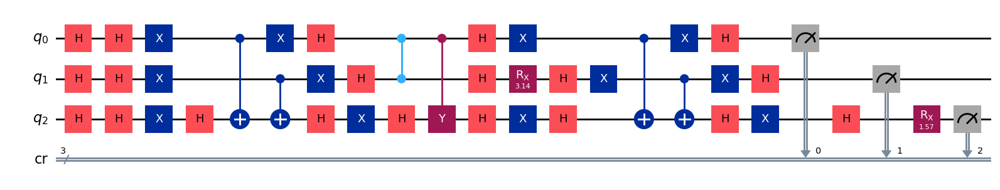

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 3

[Run 2 | Gen 86/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


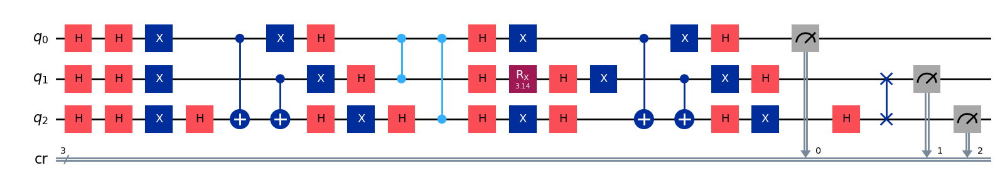

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 2

[Run 2 | Gen 87/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


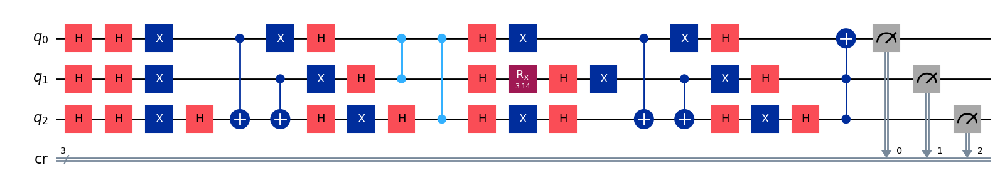

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 3

[Run 2 | Gen 88/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


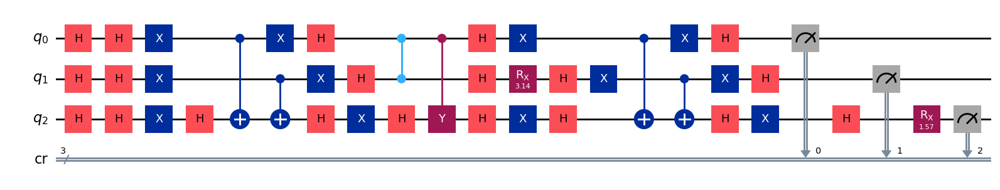

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 5

[Run 2 | Gen 89/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


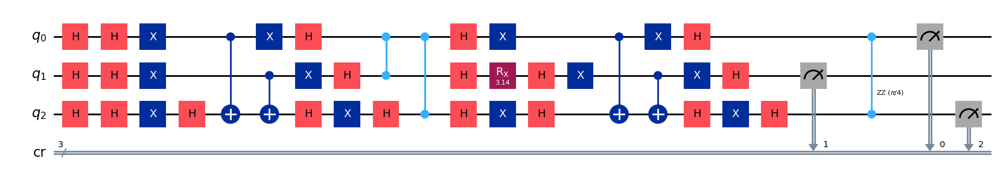

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.86,) , Number of invalids = 2

[Run 2 | Gen 90/99] Best Fitness: 0.8600 | Fidelity: 1.0000 | Gates: 43


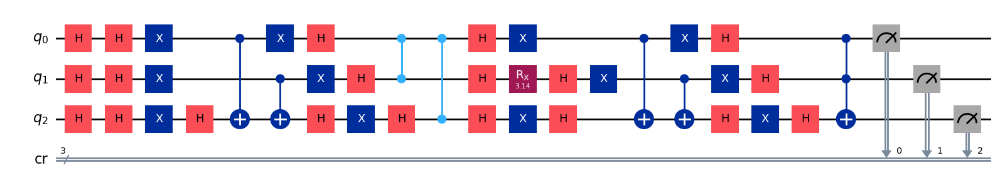

gen = 0 , Best fitness = (0.86,)
gen = 1 , Best fitness = (0.8200000000000001,) , Number of invalids = 7

[Run 2 | Gen 91/99] Best Fitness: 0.8200 | Fidelity: 1.0000 | Gates: 41


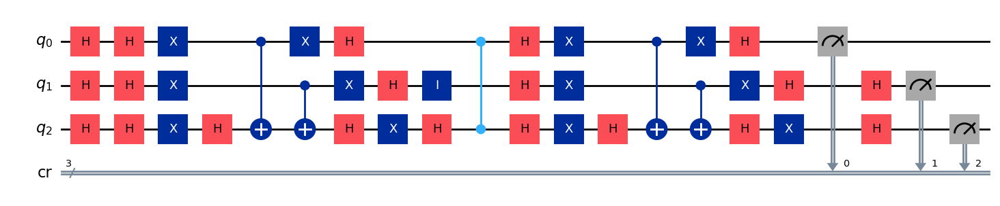

gen = 0 , Best fitness = (0.8200000000000001,)
gen = 1 , Best fitness = (0.8200000000000001,) , Number of invalids = 7

[Run 2 | Gen 92/99] Best Fitness: 0.8200 | Fidelity: 1.0000 | Gates: 41


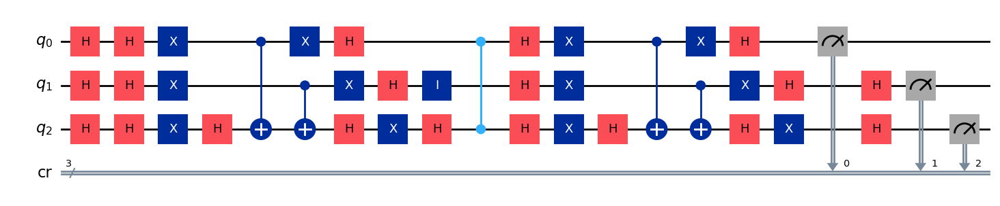

gen = 0 , Best fitness = (0.8200000000000001,)
gen = 1 , Best fitness = (0.8200000000000001,) , Number of invalids = 7

[Run 2 | Gen 93/99] Best Fitness: 0.8200 | Fidelity: 1.0000 | Gates: 41


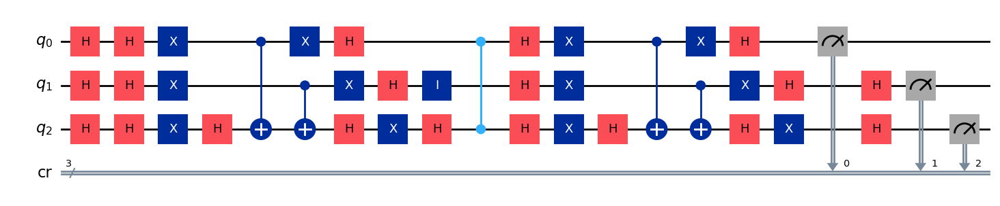

gen = 0 , Best fitness = (0.8200000000000001,)
gen = 1 , Best fitness = (0.8200000000000001,) , Number of invalids = 8

[Run 2 | Gen 94/99] Best Fitness: 0.8200 | Fidelity: 1.0000 | Gates: 41


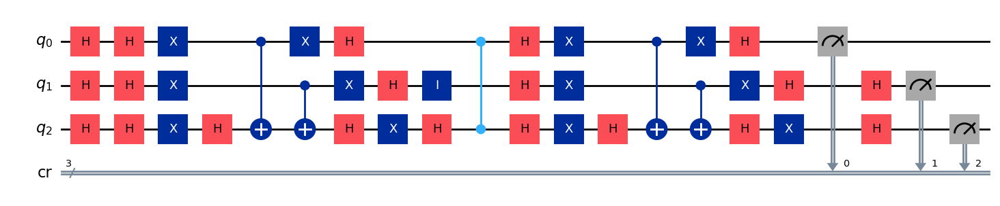

gen = 0 , Best fitness = (0.8200000000000001,)
gen = 1 , Best fitness = (0.8,) , Number of invalids = 3

[Run 2 | Gen 95/99] Best Fitness: 0.8000 | Fidelity: 1.0000 | Gates: 40


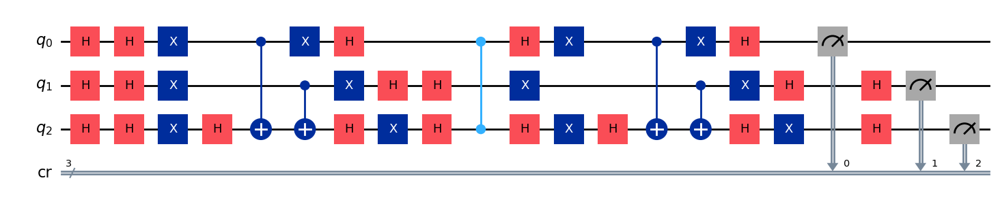

gen = 0 , Best fitness = (0.8,)
gen = 1 , Best fitness = (0.8,) , Number of invalids = 3

[Run 2 | Gen 96/99] Best Fitness: 0.8000 | Fidelity: 1.0000 | Gates: 40


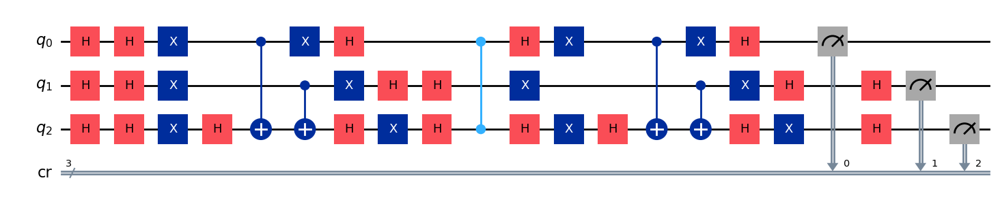

gen = 0 , Best fitness = (0.8,)
gen = 1 , Best fitness = (0.8,) , Number of invalids = 0

[Run 2 | Gen 97/99] Best Fitness: 0.8000 | Fidelity: 1.0000 | Gates: 40


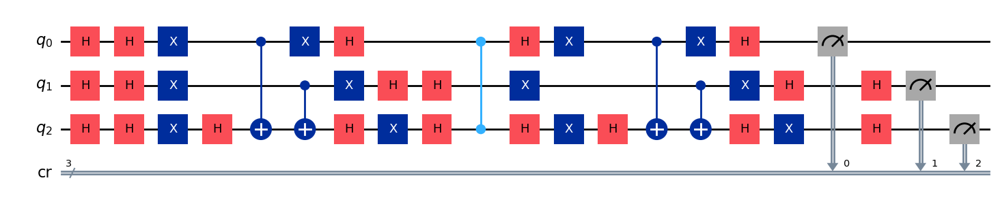

gen = 0 , Best fitness = (0.8,)
gen = 1 , Best fitness = (0.8,) , Number of invalids = 0

[Run 2 | Gen 98/99] Best Fitness: 0.8000 | Fidelity: 1.0000 | Gates: 40


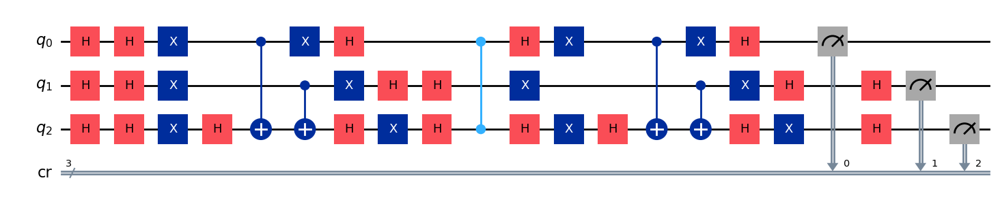

gen = 0 , Best fitness = (0.8,)
gen = 1 , Best fitness = (0.8,) , Number of invalids = 3

[Run 2 | Gen 99/99] Best Fitness: 0.8000 | Fidelity: 1.0000 | Gates: 40


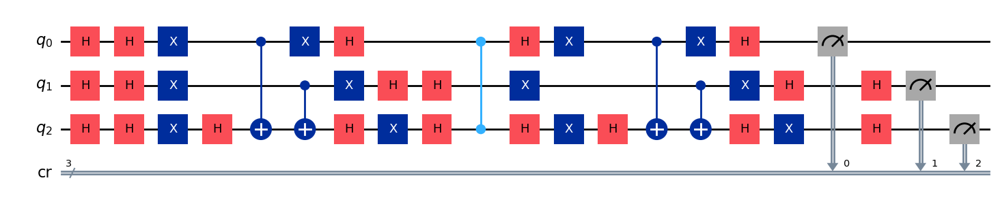


Generating evolution plots for Run 2...
✓ Plot saved to: experiments_state_100/run_2_seed_38083/evolution_metrics_run_2.png


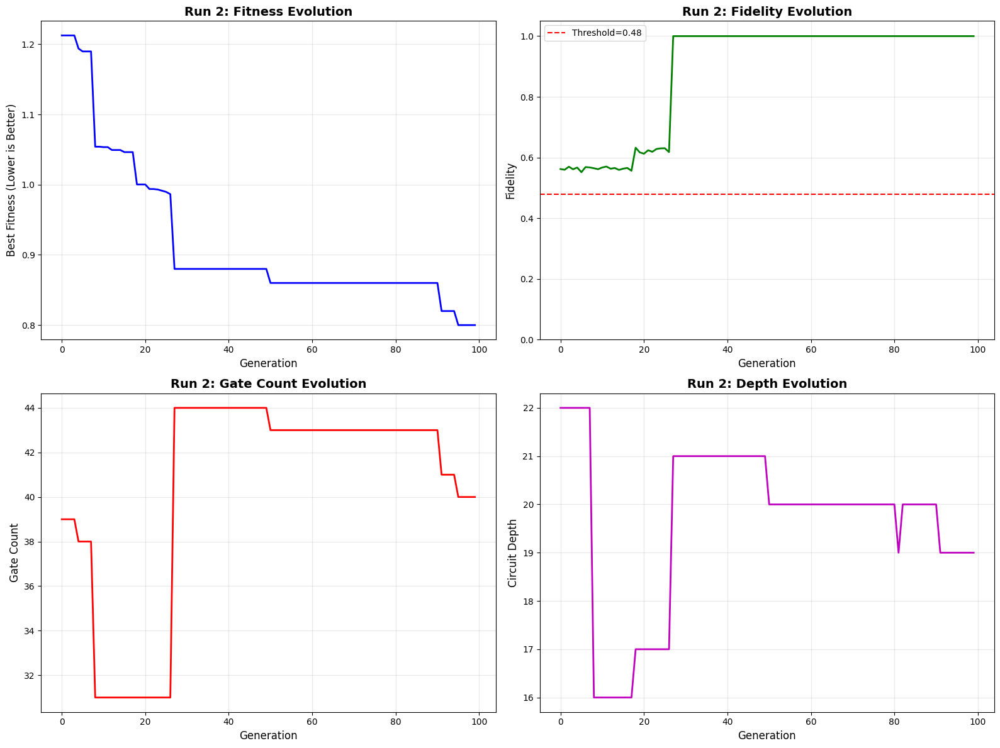


✓ Run 2 COMPLETE | Fidelity: 1.0000 | Gates: 40 | Depth: 19


RUN 3/5 | Target: 100 | Seed: 68853
✓ Logging to: experiments_state_100/run_3_seed_68853
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (11.1039,)
gen = 1 , Best fitness = (11.1039,) , Number of invalids = 138

[Run 3 | Gen 0/99] Best Fitness: 11.1039 | Fidelity: 0.4907 | Gates: 30


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


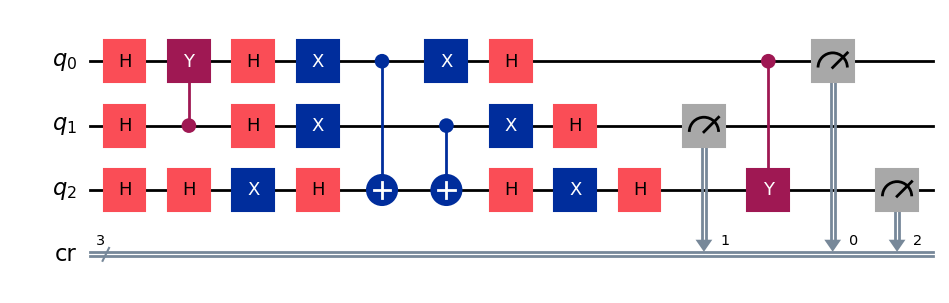

gen = 0 , Best fitness = (11.1039,)
gen = 1 , Best fitness = (1.2008999999999999,) , Number of invalids = 85

[Run 3 | Gen 1/99] Best Fitness: 1.2009 | Fidelity: 0.5636 | Gates: 38


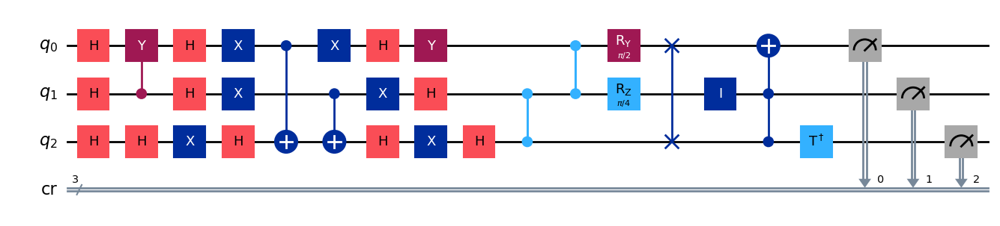

gen = 0 , Best fitness = (1.2008999999999999,)
gen = 1 , Best fitness = (1.1933,) , Number of invalids = 96

[Run 3 | Gen 2/99] Best Fitness: 1.1933 | Fidelity: 0.5654 | Gates: 38


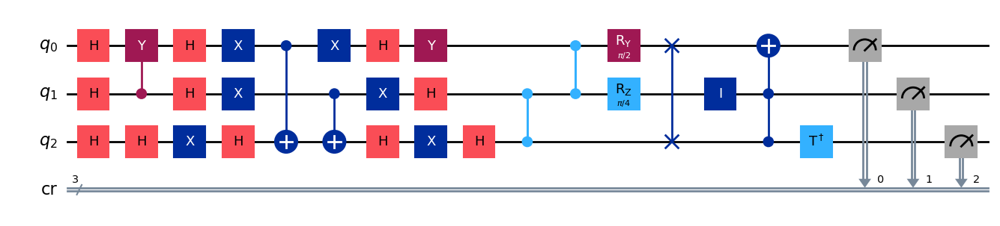

gen = 0 , Best fitness = (1.1933,)
gen = 1 , Best fitness = (1.191,) , Number of invalids = 89

[Run 3 | Gen 3/99] Best Fitness: 1.1910 | Fidelity: 0.5671 | Gates: 38


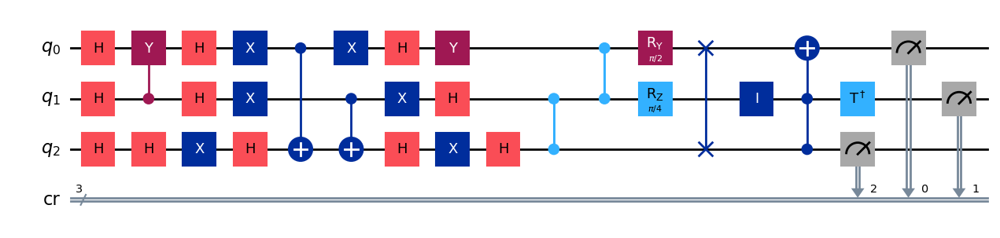

gen = 0 , Best fitness = (1.191,)
gen = 1 , Best fitness = (1.1399,) , Number of invalids = 70

[Run 3 | Gen 4/99] Best Fitness: 1.1399 | Fidelity: 0.5625 | Gates: 35


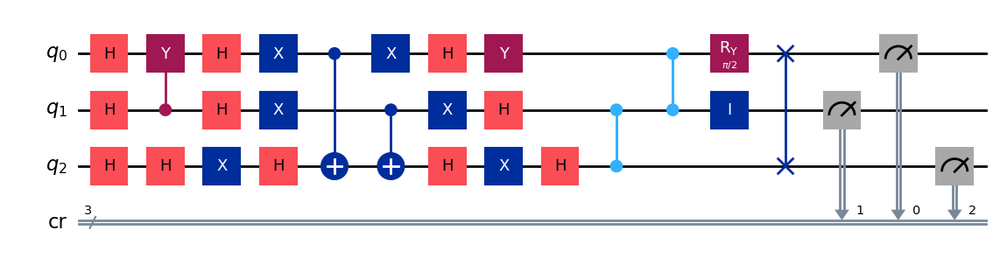

gen = 0 , Best fitness = (1.1399,)
gen = 1 , Best fitness = (1.1399,) , Number of invalids = 75

[Run 3 | Gen 5/99] Best Fitness: 1.1399 | Fidelity: 0.5628 | Gates: 35


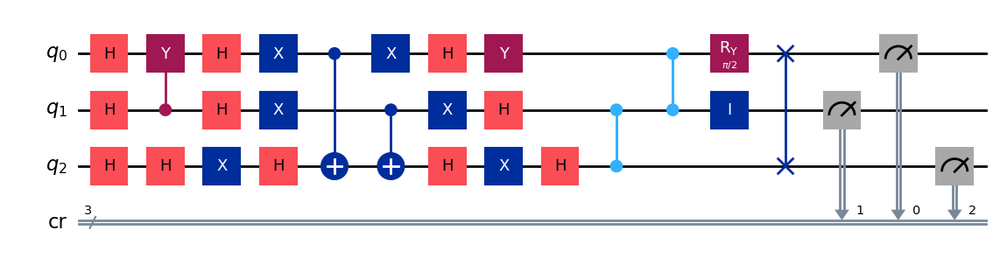

gen = 0 , Best fitness = (1.1399,)
gen = 1 , Best fitness = (1.1274000000000002,) , Number of invalids = 79

[Run 3 | Gen 6/99] Best Fitness: 1.1274 | Fidelity: 0.5664 | Gates: 35


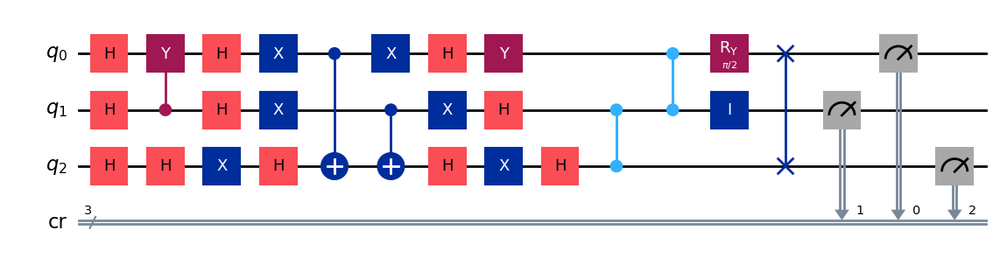

gen = 0 , Best fitness = (1.1274000000000002,)
gen = 1 , Best fitness = (1.1274000000000002,) , Number of invalids = 56

[Run 3 | Gen 7/99] Best Fitness: 1.1274 | Fidelity: 0.5583 | Gates: 35


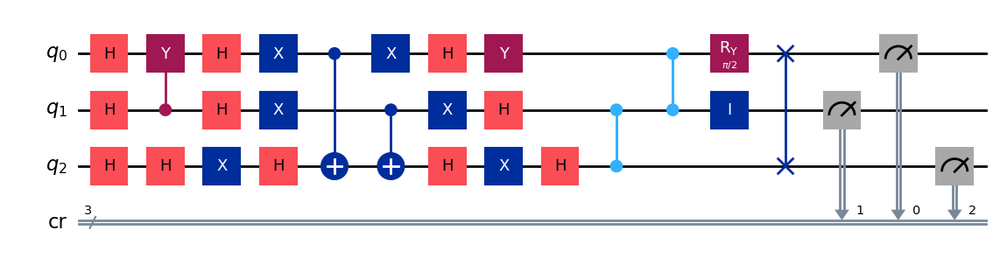

gen = 0 , Best fitness = (1.1274000000000002,)
gen = 1 , Best fitness = (1.1274000000000002,) , Number of invalids = 62

[Run 3 | Gen 8/99] Best Fitness: 1.1274 | Fidelity: 0.5594 | Gates: 35


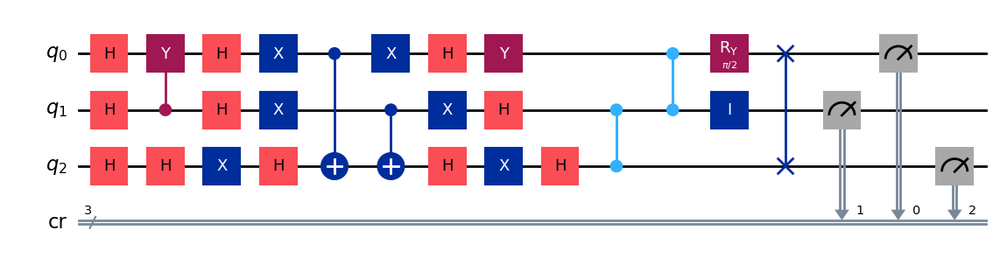

gen = 0 , Best fitness = (1.1274000000000002,)
gen = 1 , Best fitness = (1.1274000000000002,) , Number of invalids = 74

[Run 3 | Gen 9/99] Best Fitness: 1.1274 | Fidelity: 0.5711 | Gates: 35


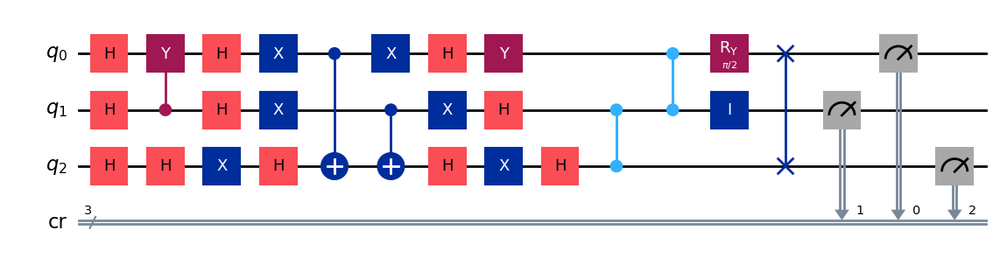

gen = 0 , Best fitness = (1.1274000000000002,)
gen = 1 , Best fitness = (1.0794000000000001,) , Number of invalids = 66

[Run 3 | Gen 10/99] Best Fitness: 1.0794 | Fidelity: 0.6268 | Gates: 35


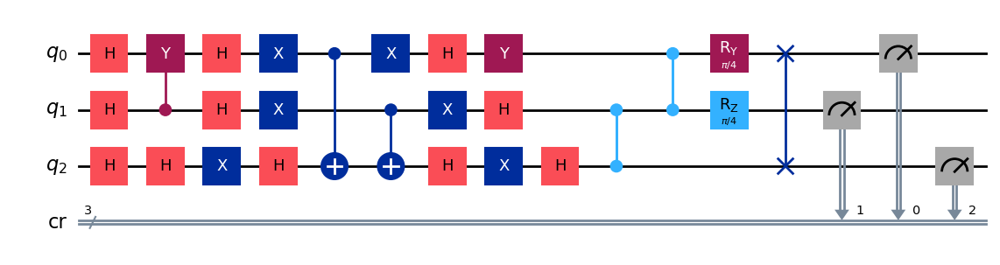

gen = 0 , Best fitness = (1.0794000000000001,)
gen = 1 , Best fitness = (1.0769000000000002,) , Number of invalids = 66

[Run 3 | Gen 11/99] Best Fitness: 1.0769 | Fidelity: 0.6163 | Gates: 35


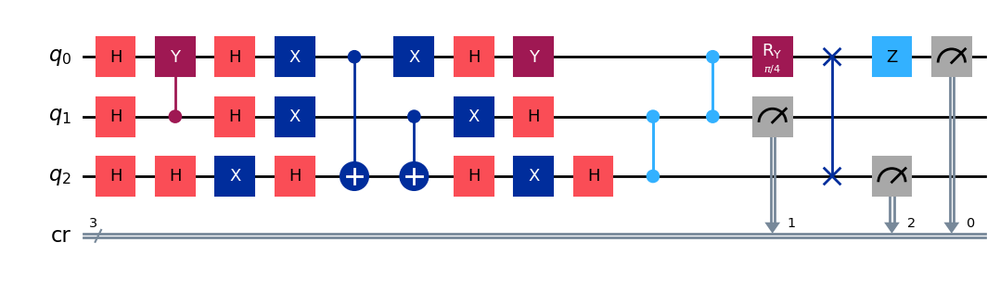

gen = 0 , Best fitness = (1.0769000000000002,)
gen = 1 , Best fitness = (1.0739,) , Number of invalids = 60

[Run 3 | Gen 12/99] Best Fitness: 1.0739 | Fidelity: 0.6262 | Gates: 35


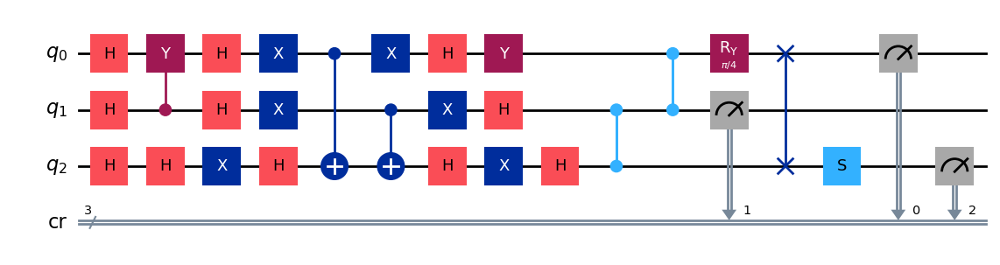

gen = 0 , Best fitness = (1.0739,)
gen = 1 , Best fitness = (1.0554999999999999,) , Number of invalids = 36

[Run 3 | Gen 13/99] Best Fitness: 1.0555 | Fidelity: 0.6224 | Gates: 34


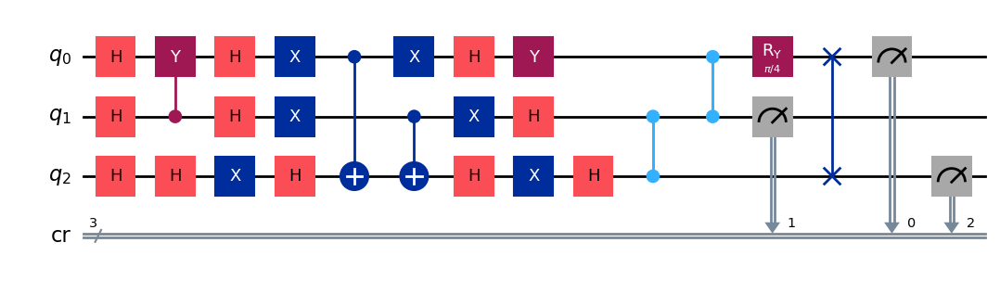

gen = 0 , Best fitness = (1.0554999999999999,)
gen = 1 , Best fitness = (1.0554999999999999,) , Number of invalids = 37

[Run 3 | Gen 14/99] Best Fitness: 1.0555 | Fidelity: 0.6150 | Gates: 34


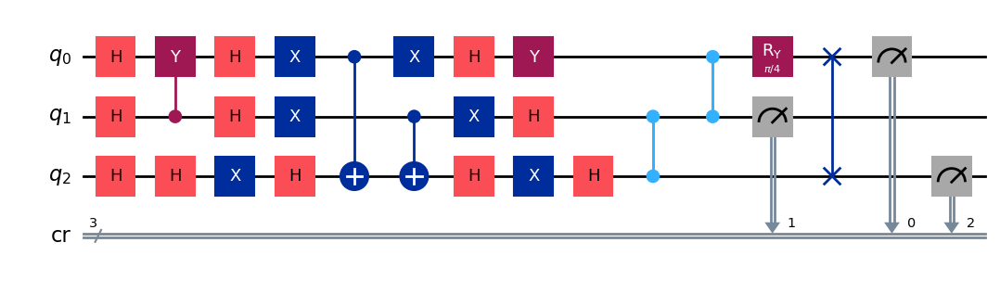

gen = 0 , Best fitness = (1.0554999999999999,)
gen = 1 , Best fitness = (1.0034,) , Number of invalids = 44

[Run 3 | Gen 15/99] Best Fitness: 1.0034 | Fidelity: 0.7122 | Gates: 36


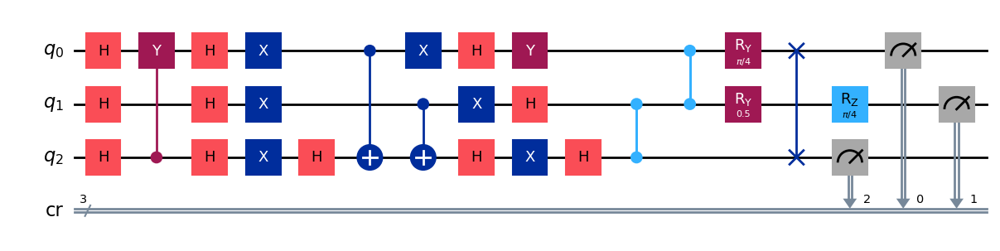

gen = 0 , Best fitness = (1.0034,)
gen = 1 , Best fitness = (0.9814,) , Number of invalids = 51

[Run 3 | Gen 16/99] Best Fitness: 0.9814 | Fidelity: 0.7099 | Gates: 35


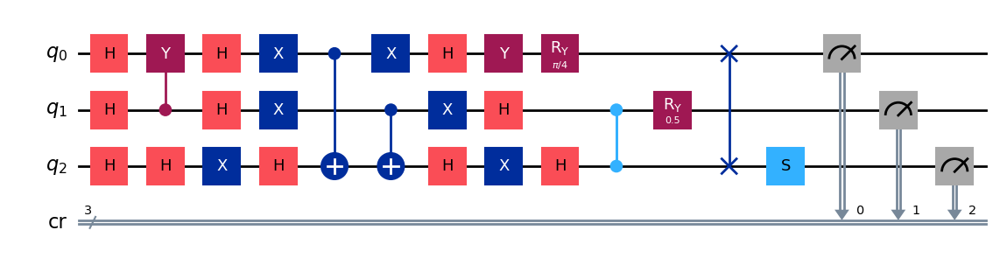

gen = 0 , Best fitness = (0.9814,)
gen = 1 , Best fitness = (0.9809000000000001,) , Number of invalids = 35

[Run 3 | Gen 17/99] Best Fitness: 0.9809 | Fidelity: 0.7164 | Gates: 35


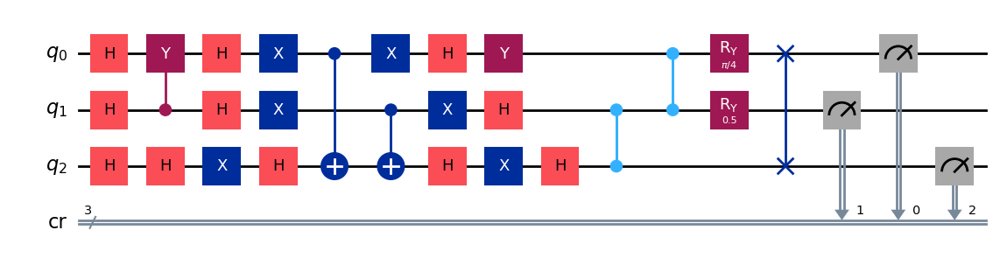

gen = 0 , Best fitness = (0.9809000000000001,)
gen = 1 , Best fitness = (0.9786,) , Number of invalids = 44

[Run 3 | Gen 18/99] Best Fitness: 0.9786 | Fidelity: 0.7227 | Gates: 35


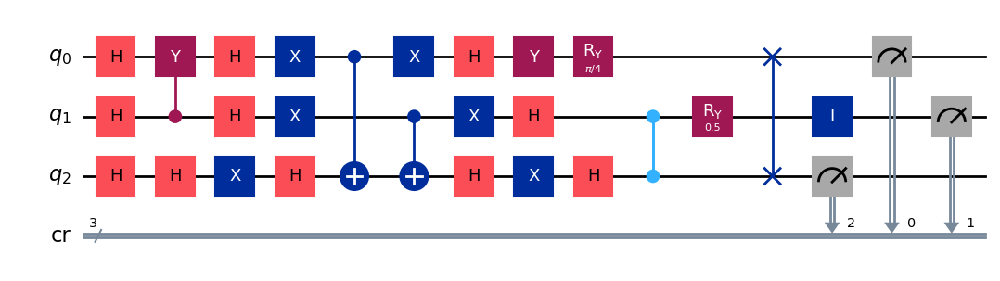

gen = 0 , Best fitness = (0.9786,)
gen = 1 , Best fitness = (0.9733,) , Number of invalids = 27

[Run 3 | Gen 19/99] Best Fitness: 0.9733 | Fidelity: 0.7140 | Gates: 35


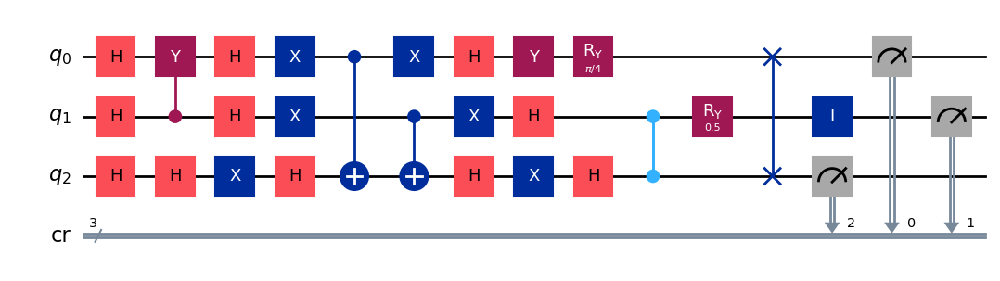

gen = 0 , Best fitness = (0.9733,)
gen = 1 , Best fitness = (0.9733,) , Number of invalids = 13

[Run 3 | Gen 20/99] Best Fitness: 0.9733 | Fidelity: 0.7186 | Gates: 35


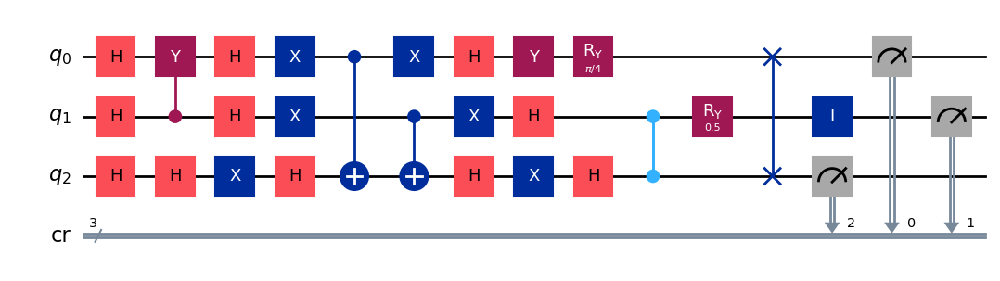

gen = 0 , Best fitness = (0.9733,)
gen = 1 , Best fitness = (0.9685,) , Number of invalids = 11

[Run 3 | Gen 21/99] Best Fitness: 0.9685 | Fidelity: 0.7167 | Gates: 34


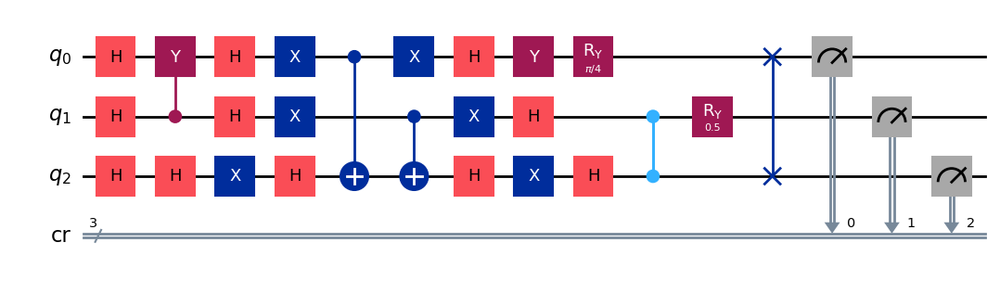

gen = 0 , Best fitness = (0.9685,)
gen = 1 , Best fitness = (0.9507000000000001,) , Number of invalids = 13

[Run 3 | Gen 22/99] Best Fitness: 0.9507 | Fidelity: 0.7266 | Gates: 34


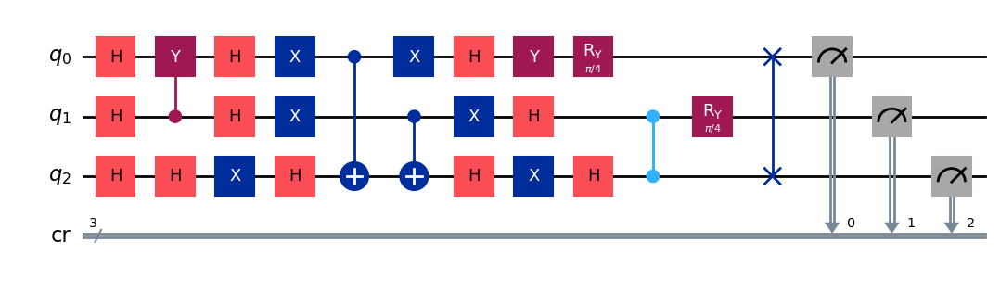

gen = 0 , Best fitness = (0.9507000000000001,)
gen = 1 , Best fitness = (0.9507000000000001,) , Number of invalids = 15

[Run 3 | Gen 23/99] Best Fitness: 0.9507 | Fidelity: 0.7310 | Gates: 34


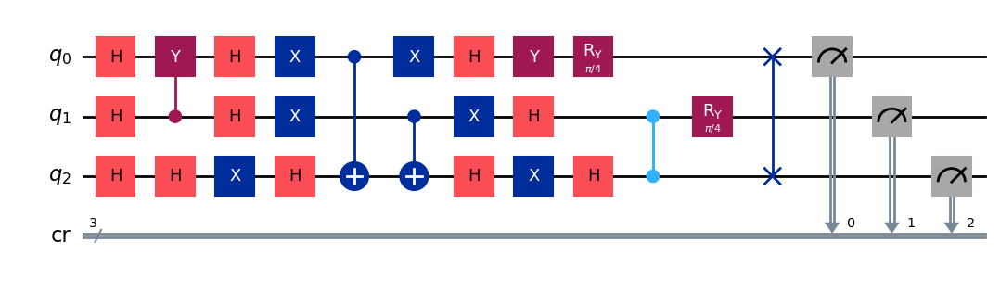

gen = 0 , Best fitness = (0.9507000000000001,)
gen = 1 , Best fitness = (0.9507000000000001,) , Number of invalids = 10

[Run 3 | Gen 24/99] Best Fitness: 0.9507 | Fidelity: 0.7232 | Gates: 34


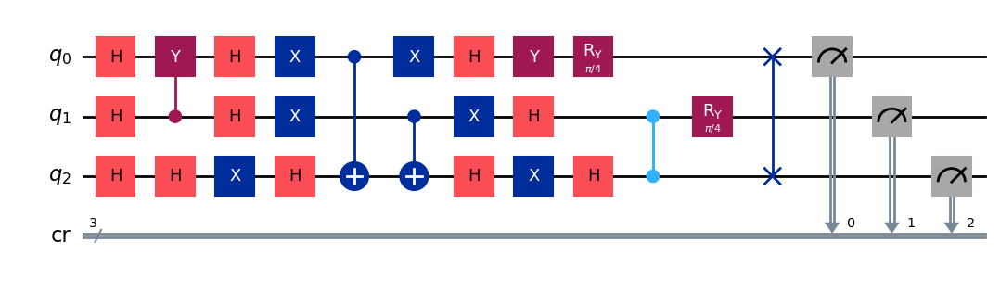

gen = 0 , Best fitness = (0.9507000000000001,)
gen = 1 , Best fitness = (0.9507000000000001,) , Number of invalids = 10

[Run 3 | Gen 25/99] Best Fitness: 0.9507 | Fidelity: 0.7318 | Gates: 34


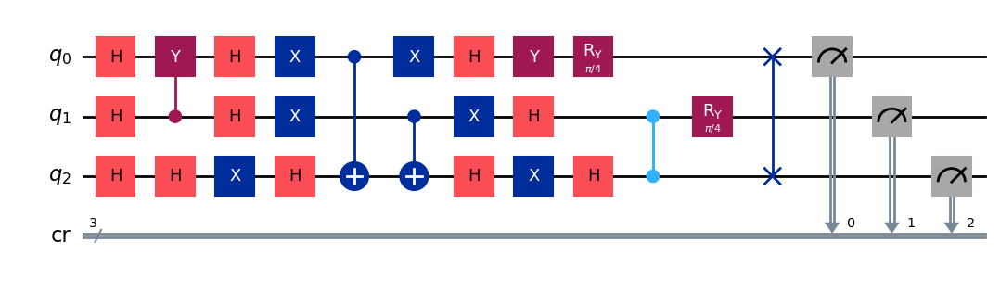

gen = 0 , Best fitness = (0.9507000000000001,)
gen = 1 , Best fitness = (0.9493,) , Number of invalids = 4

[Run 3 | Gen 26/99] Best Fitness: 0.9493 | Fidelity: 0.7343 | Gates: 34


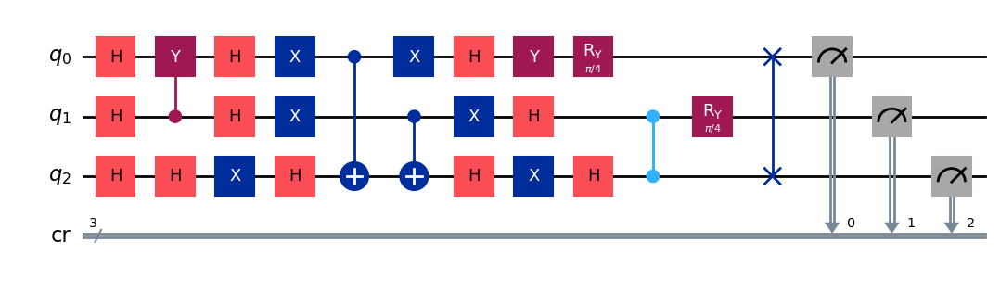

gen = 0 , Best fitness = (0.9493,)
gen = 1 , Best fitness = (0.9493,) , Number of invalids = 8

[Run 3 | Gen 27/99] Best Fitness: 0.9493 | Fidelity: 0.7318 | Gates: 34


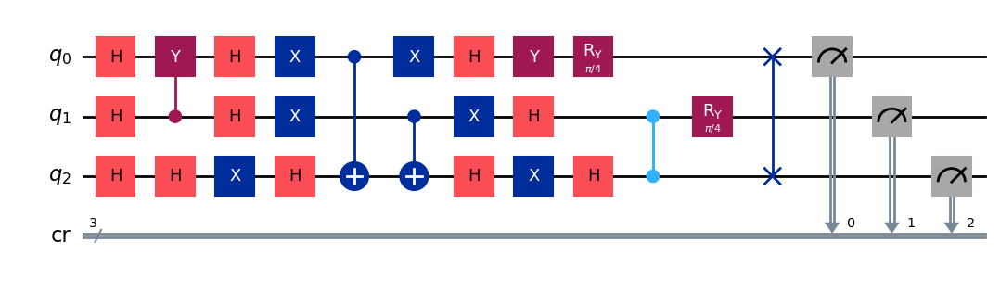

gen = 0 , Best fitness = (0.9493,)
gen = 1 , Best fitness = (0.9493,) , Number of invalids = 11

[Run 3 | Gen 28/99] Best Fitness: 0.9493 | Fidelity: 0.7284 | Gates: 34


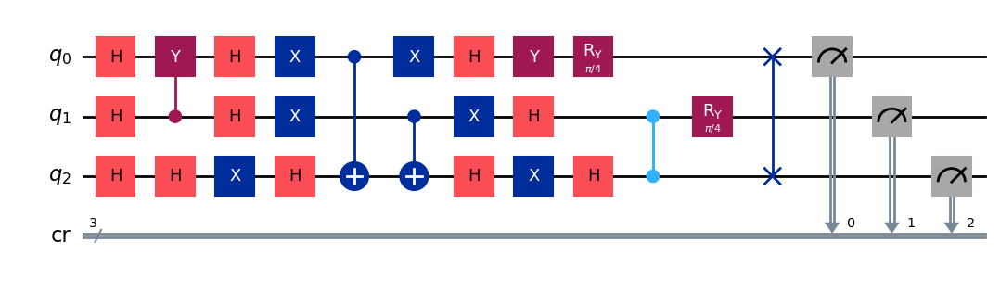

gen = 0 , Best fitness = (0.9493,)
gen = 1 , Best fitness = (0.9493,) , Number of invalids = 9

[Run 3 | Gen 29/99] Best Fitness: 0.9493 | Fidelity: 0.7292 | Gates: 34


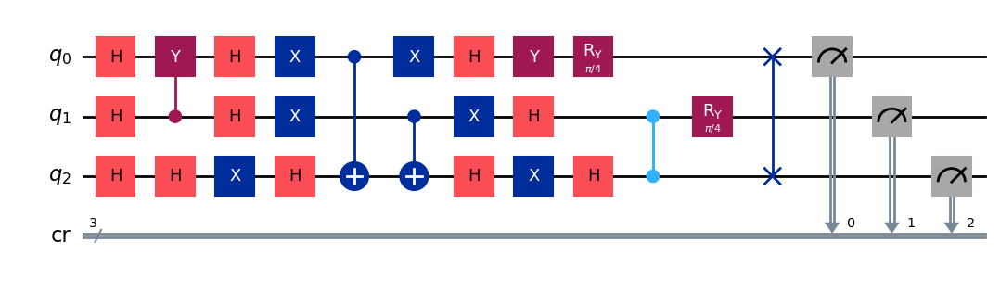

gen = 0 , Best fitness = (0.9493,)
gen = 1 , Best fitness = (0.9460000000000001,) , Number of invalids = 11

[Run 3 | Gen 30/99] Best Fitness: 0.9460 | Fidelity: 0.7256 | Gates: 34


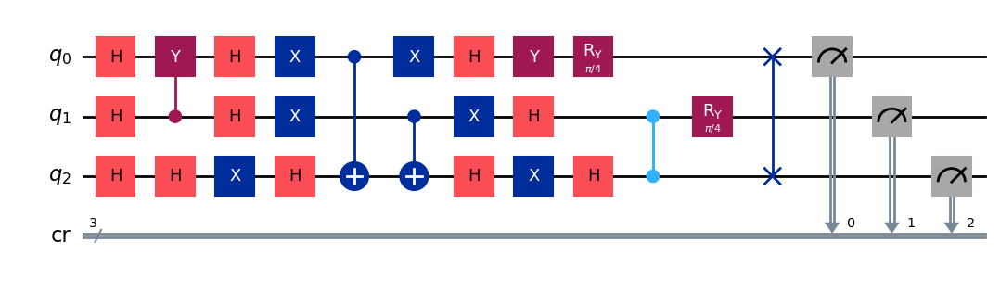

gen = 0 , Best fitness = (0.9460000000000001,)
gen = 1 , Best fitness = (0.9460000000000001,) , Number of invalids = 15

[Run 3 | Gen 31/99] Best Fitness: 0.9460 | Fidelity: 0.7328 | Gates: 34


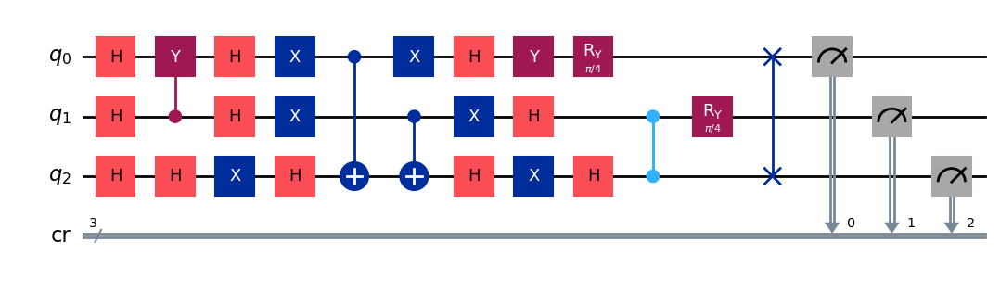

gen = 0 , Best fitness = (0.9460000000000001,)
gen = 1 , Best fitness = (0.9460000000000001,) , Number of invalids = 5

[Run 3 | Gen 32/99] Best Fitness: 0.9460 | Fidelity: 0.7310 | Gates: 34


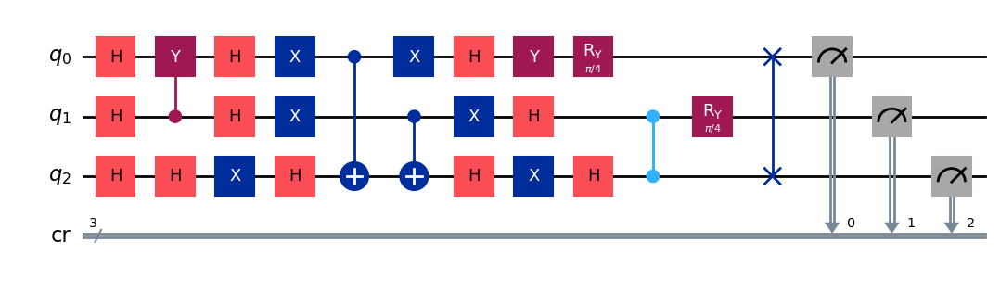

gen = 0 , Best fitness = (0.9460000000000001,)
gen = 1 , Best fitness = (0.9460000000000001,) , Number of invalids = 8

[Run 3 | Gen 33/99] Best Fitness: 0.9460 | Fidelity: 0.7209 | Gates: 34


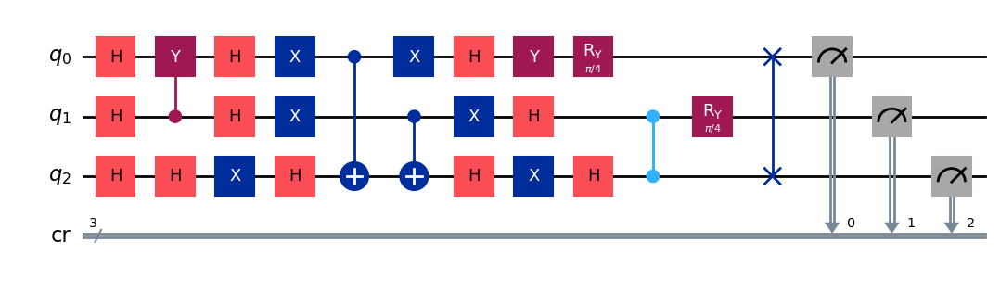

gen = 0 , Best fitness = (0.9460000000000001,)
gen = 1 , Best fitness = (0.9456,) , Number of invalids = 7

[Run 3 | Gen 34/99] Best Fitness: 0.9456 | Fidelity: 0.7315 | Gates: 34


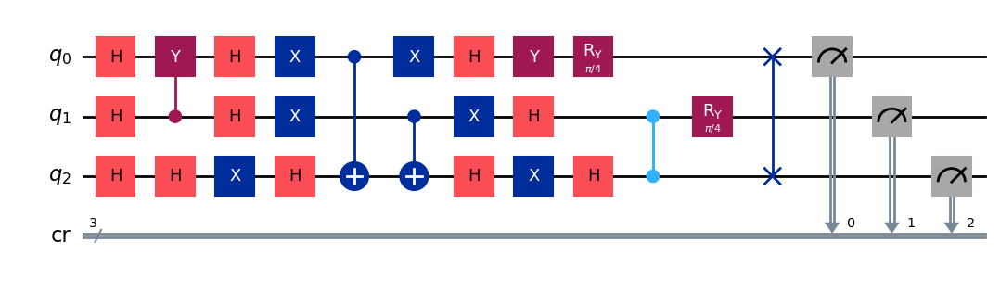

gen = 0 , Best fitness = (0.9456,)
gen = 1 , Best fitness = (0.9456,) , Number of invalids = 0

[Run 3 | Gen 35/99] Best Fitness: 0.9456 | Fidelity: 0.7372 | Gates: 34


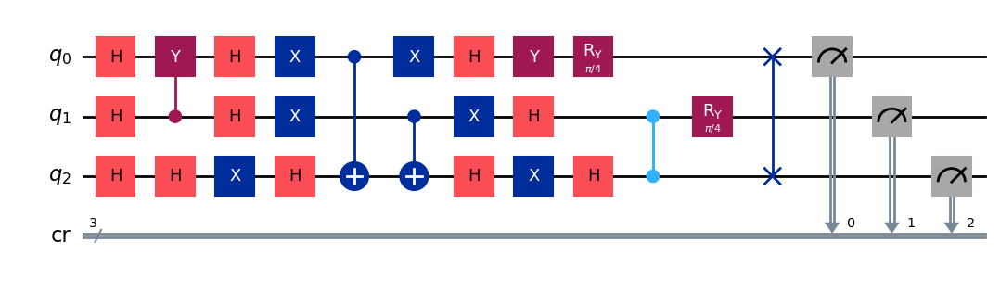

gen = 0 , Best fitness = (0.9456,)
gen = 1 , Best fitness = (0.9437000000000001,) , Number of invalids = 4

[Run 3 | Gen 36/99] Best Fitness: 0.9437 | Fidelity: 0.7280 | Gates: 34


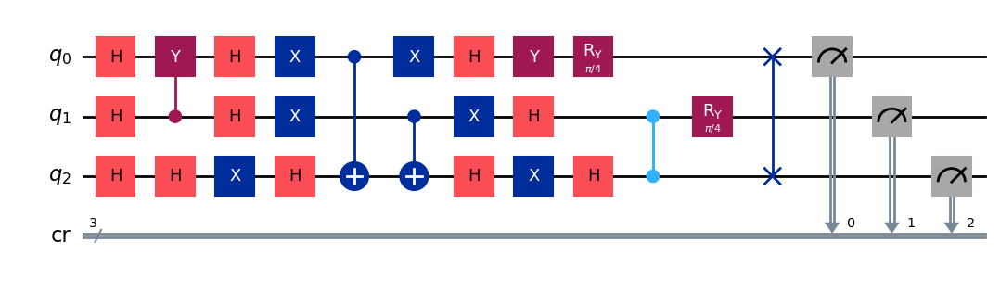

gen = 0 , Best fitness = (0.9437000000000001,)
gen = 1 , Best fitness = (0.9437000000000001,) , Number of invalids = 2

[Run 3 | Gen 37/99] Best Fitness: 0.9437 | Fidelity: 0.7272 | Gates: 34


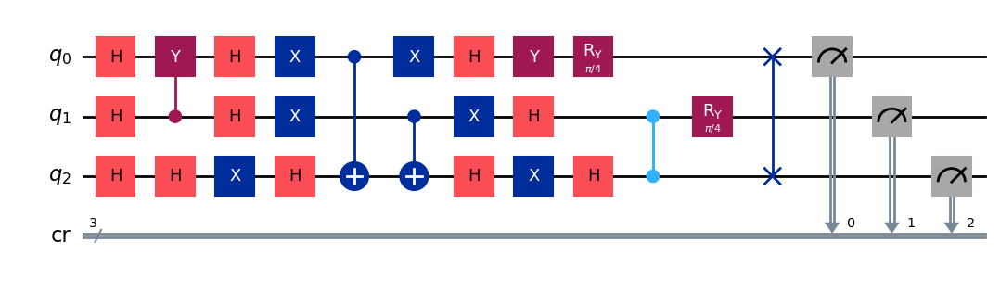

gen = 0 , Best fitness = (0.9437000000000001,)
gen = 1 , Best fitness = (0.9436,) , Number of invalids = 3

[Run 3 | Gen 38/99] Best Fitness: 0.9436 | Fidelity: 0.7310 | Gates: 34


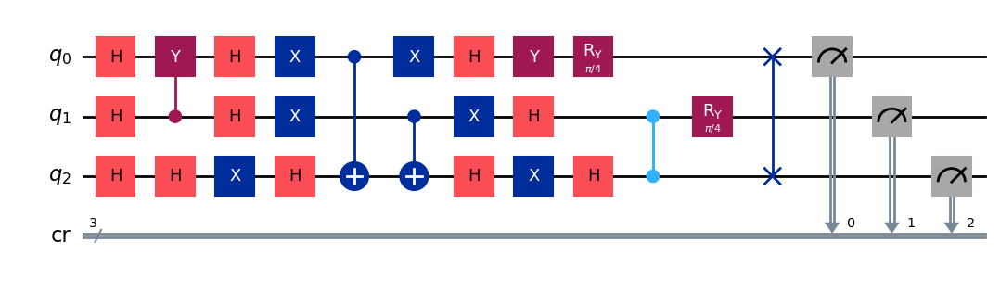

gen = 0 , Best fitness = (0.9436,)
gen = 1 , Best fitness = (0.9436,) , Number of invalids = 4

[Run 3 | Gen 39/99] Best Fitness: 0.9436 | Fidelity: 0.7253 | Gates: 34


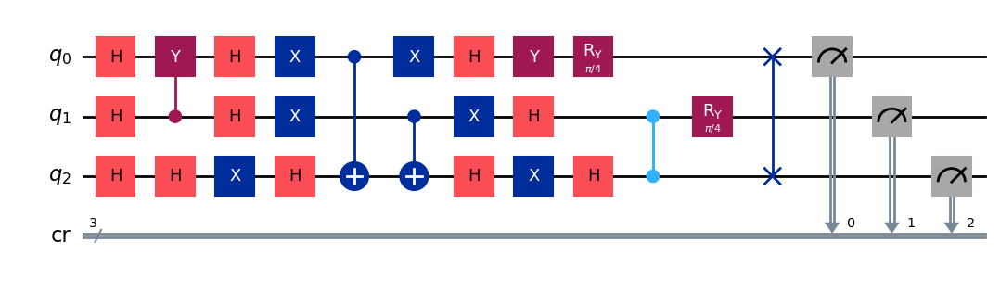

gen = 0 , Best fitness = (0.9436,)
gen = 1 , Best fitness = (0.9434,) , Number of invalids = 4

[Run 3 | Gen 40/99] Best Fitness: 0.9434 | Fidelity: 0.7307 | Gates: 34


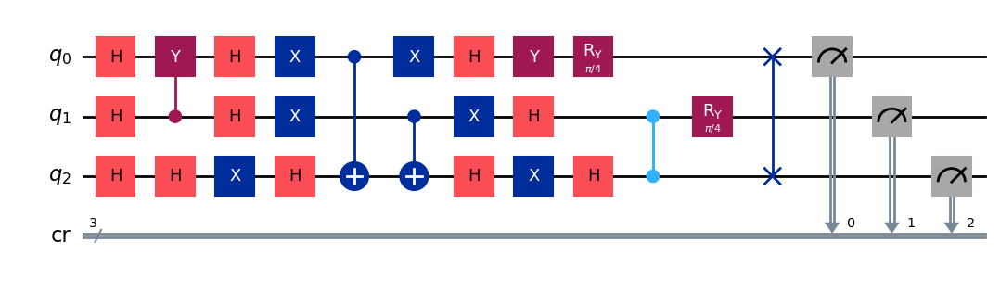

gen = 0 , Best fitness = (0.9434,)
gen = 1 , Best fitness = (0.9434,) , Number of invalids = 5

[Run 3 | Gen 41/99] Best Fitness: 0.9434 | Fidelity: 0.7305 | Gates: 34


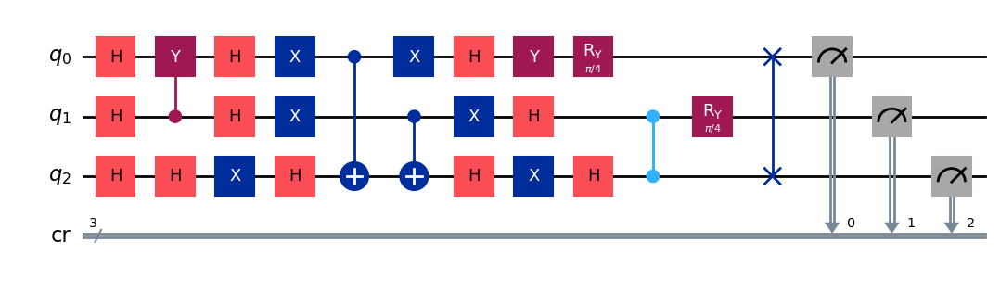

gen = 0 , Best fitness = (0.9434,)
gen = 1 , Best fitness = (0.9434,) , Number of invalids = 1

[Run 3 | Gen 42/99] Best Fitness: 0.9434 | Fidelity: 0.7302 | Gates: 34


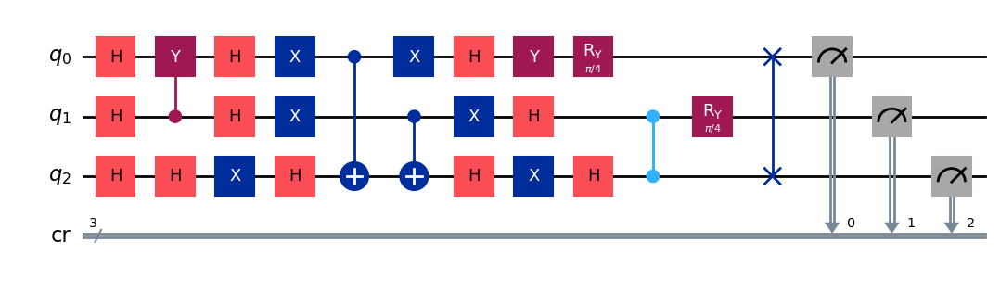

gen = 0 , Best fitness = (0.9434,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 0

[Run 3 | Gen 43/99] Best Fitness: 0.9397 | Fidelity: 0.7337 | Gates: 34


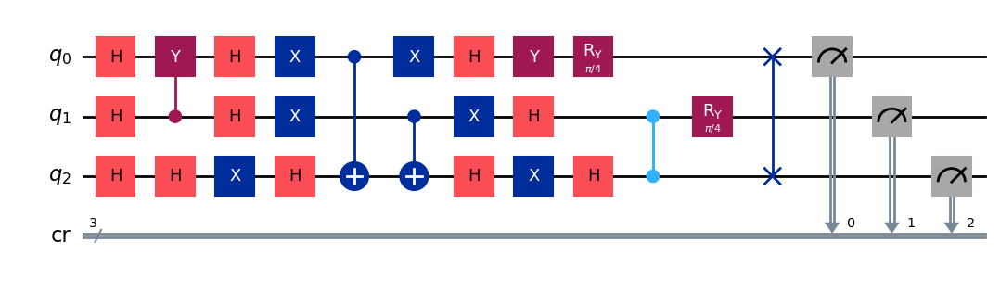

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 0

[Run 3 | Gen 44/99] Best Fitness: 0.9397 | Fidelity: 0.7335 | Gates: 34


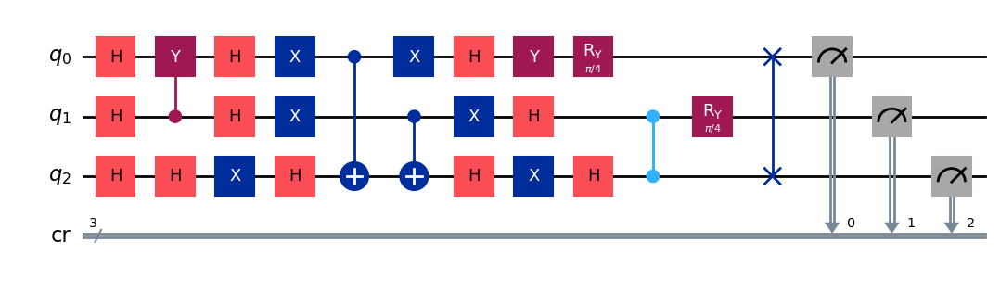

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 0

[Run 3 | Gen 45/99] Best Fitness: 0.9397 | Fidelity: 0.7289 | Gates: 34


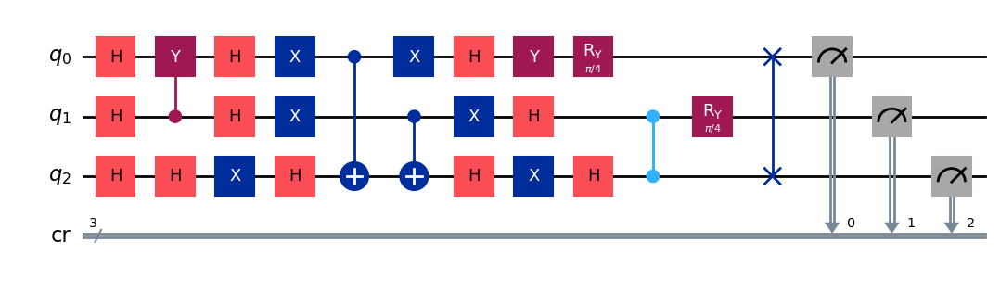

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 3

[Run 3 | Gen 46/99] Best Fitness: 0.9397 | Fidelity: 0.7333 | Gates: 34


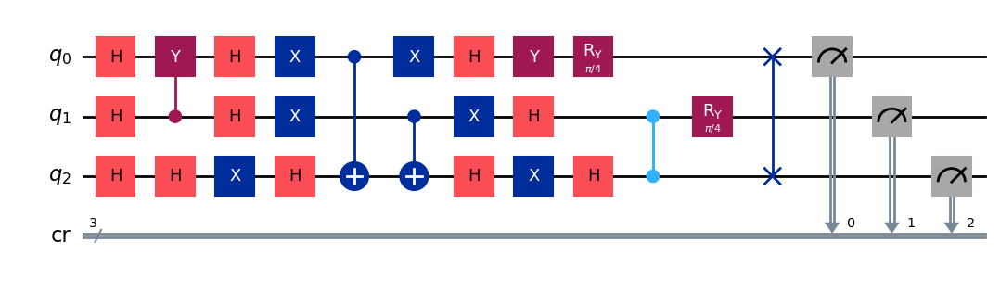

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 0

[Run 3 | Gen 47/99] Best Fitness: 0.9397 | Fidelity: 0.7372 | Gates: 34


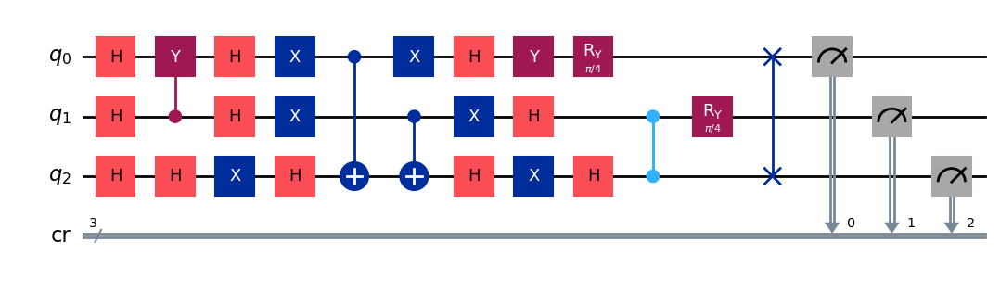

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 4

[Run 3 | Gen 48/99] Best Fitness: 0.9397 | Fidelity: 0.7231 | Gates: 34


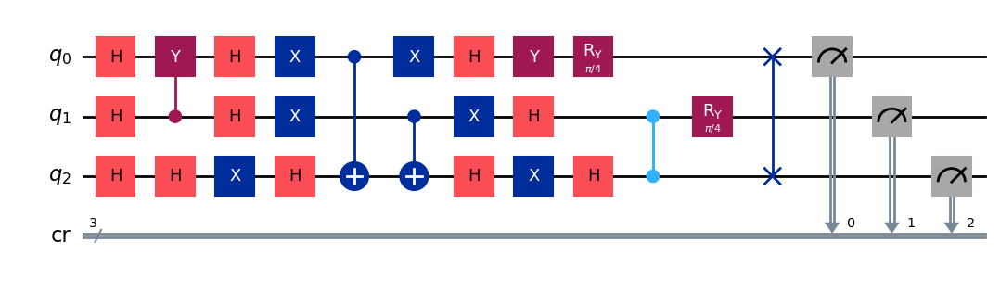

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 3

[Run 3 | Gen 49/99] Best Fitness: 0.9397 | Fidelity: 0.7354 | Gates: 34


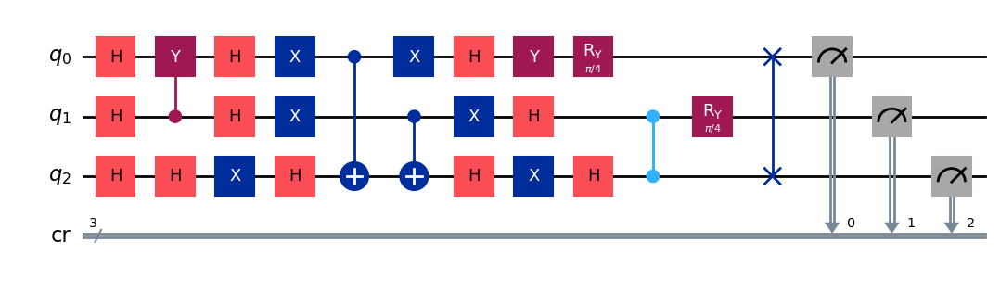

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 6

[Run 3 | Gen 50/99] Best Fitness: 0.9397 | Fidelity: 0.7199 | Gates: 34


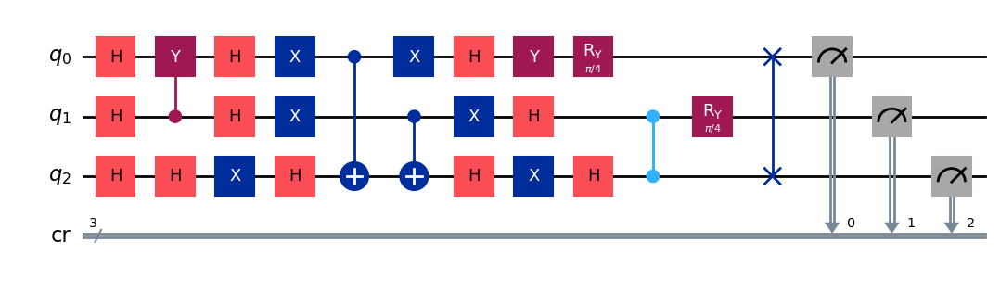

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 8

[Run 3 | Gen 51/99] Best Fitness: 0.9397 | Fidelity: 0.7237 | Gates: 34


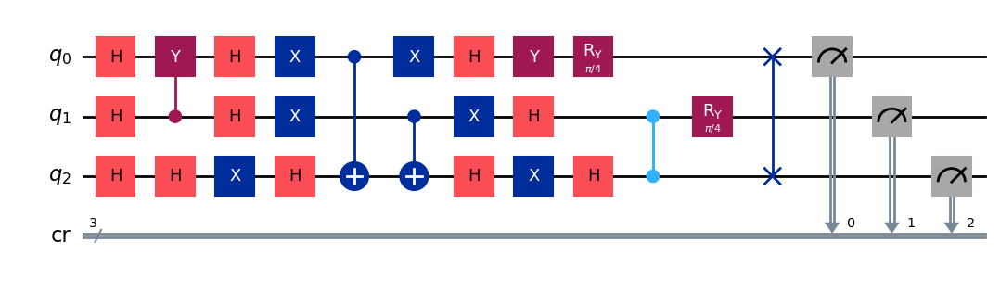

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 6

[Run 3 | Gen 52/99] Best Fitness: 0.9397 | Fidelity: 0.7269 | Gates: 34


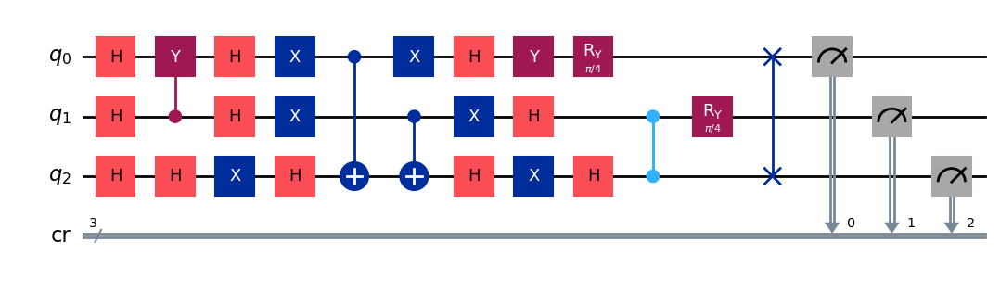

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 4

[Run 3 | Gen 53/99] Best Fitness: 0.9397 | Fidelity: 0.7310 | Gates: 34


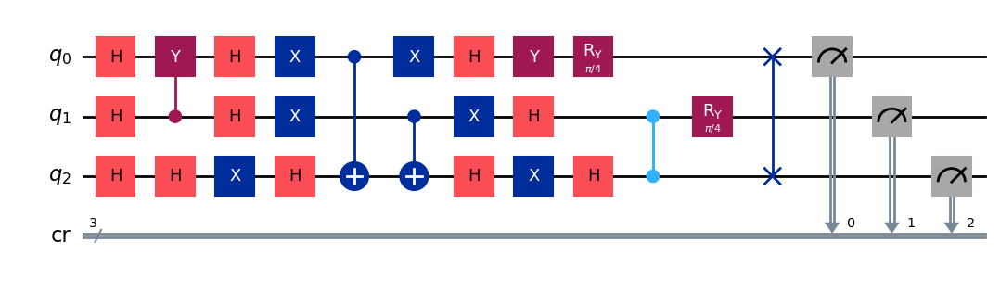

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 5

[Run 3 | Gen 54/99] Best Fitness: 0.9397 | Fidelity: 0.7347 | Gates: 34


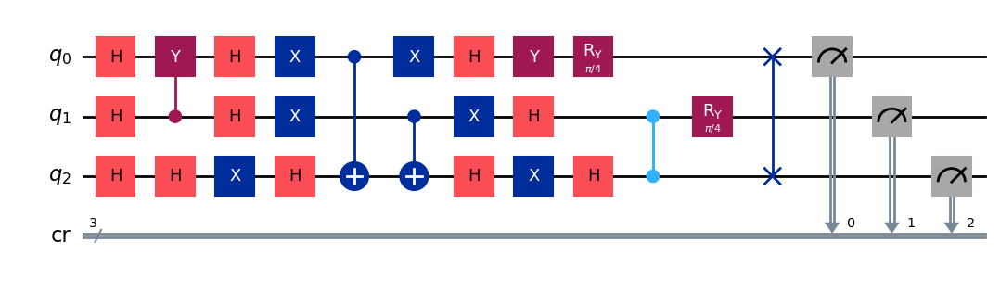

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 3

[Run 3 | Gen 55/99] Best Fitness: 0.9397 | Fidelity: 0.7315 | Gates: 34


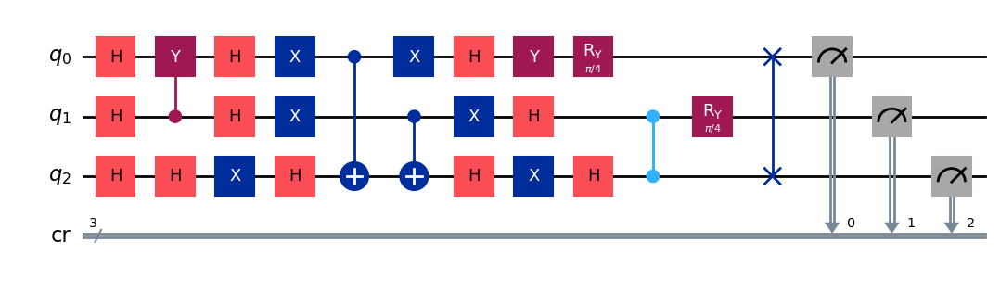

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 7

[Run 3 | Gen 56/99] Best Fitness: 0.9397 | Fidelity: 0.7343 | Gates: 34


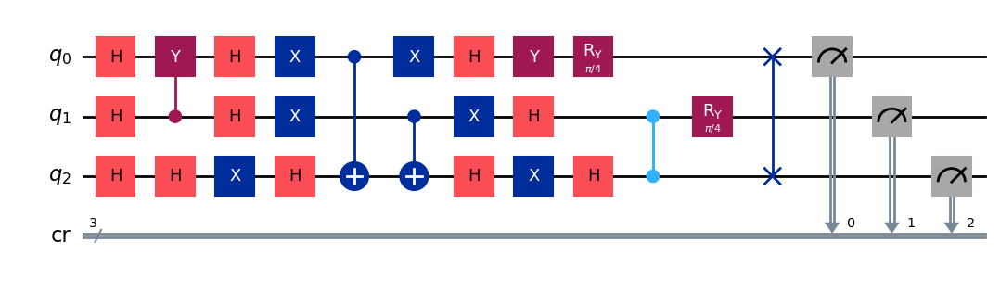

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 7

[Run 3 | Gen 57/99] Best Fitness: 0.9397 | Fidelity: 0.7340 | Gates: 34


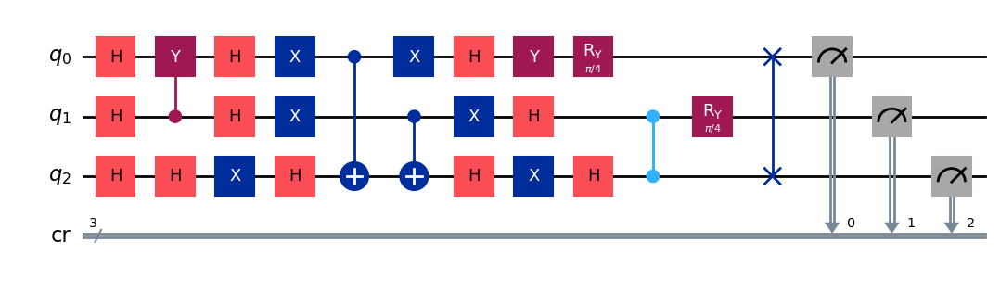

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 3

[Run 3 | Gen 58/99] Best Fitness: 0.9397 | Fidelity: 0.7281 | Gates: 34


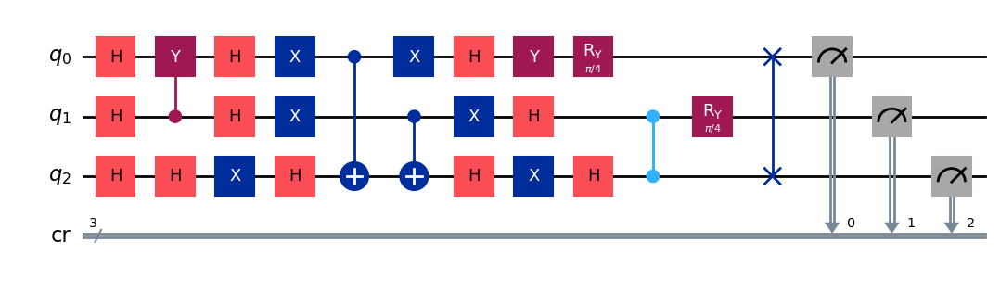

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 9

[Run 3 | Gen 59/99] Best Fitness: 0.9397 | Fidelity: 0.7318 | Gates: 34


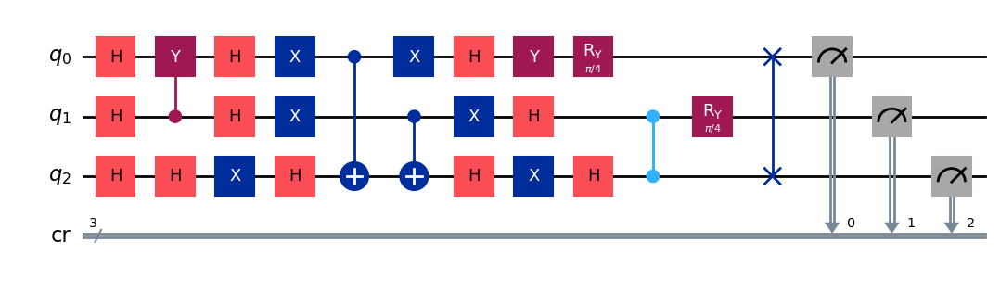

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 6

[Run 3 | Gen 60/99] Best Fitness: 0.9397 | Fidelity: 0.7309 | Gates: 34


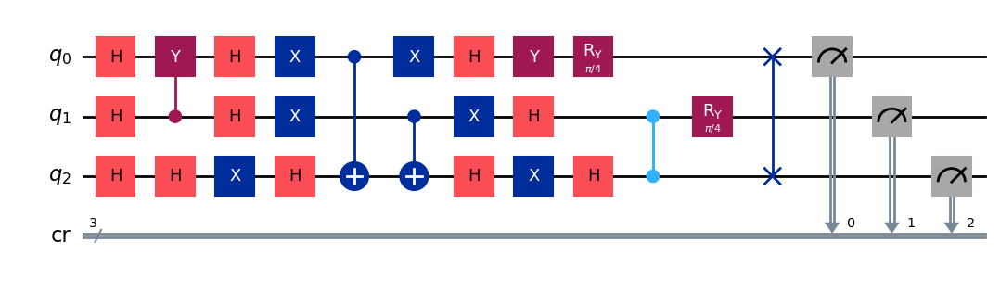

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 6

[Run 3 | Gen 61/99] Best Fitness: 0.9397 | Fidelity: 0.7262 | Gates: 34


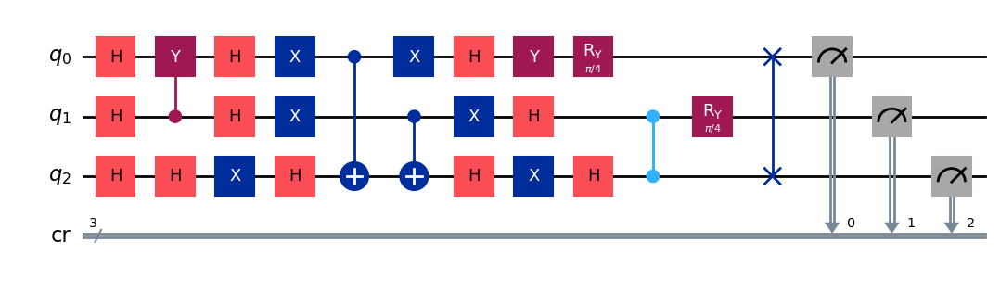

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.9397000000000001,) , Number of invalids = 4

[Run 3 | Gen 62/99] Best Fitness: 0.9397 | Fidelity: 0.7293 | Gates: 34


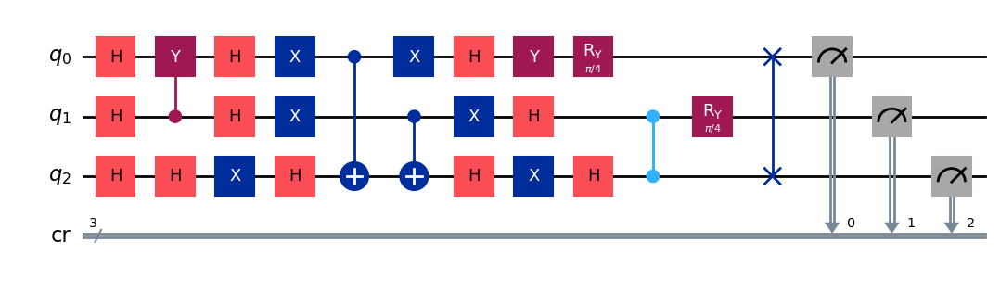

gen = 0 , Best fitness = (0.9397000000000001,)
gen = 1 , Best fitness = (0.8701,) , Number of invalids = 2

[Run 3 | Gen 63/99] Best Fitness: 0.8701 | Fidelity: 0.8589 | Gates: 36


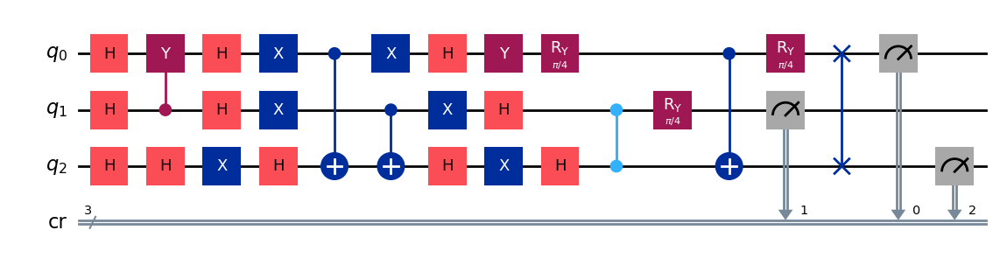

gen = 0 , Best fitness = (0.8701,)
gen = 1 , Best fitness = (0.8701,) , Number of invalids = 1

[Run 3 | Gen 64/99] Best Fitness: 0.8701 | Fidelity: 0.8495 | Gates: 36


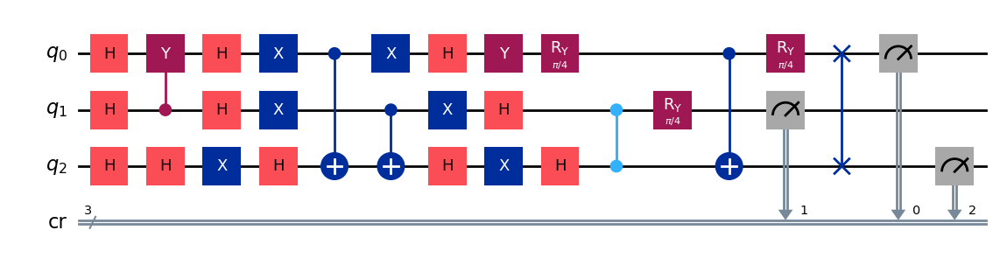

gen = 0 , Best fitness = (0.8701,)
gen = 1 , Best fitness = (0.8701,) , Number of invalids = 5

[Run 3 | Gen 65/99] Best Fitness: 0.8701 | Fidelity: 0.8466 | Gates: 36


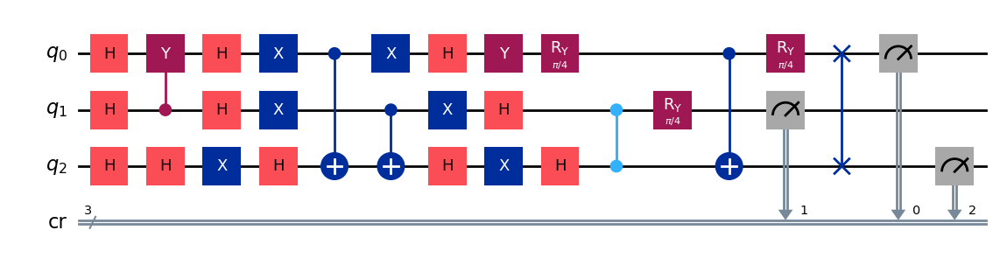

gen = 0 , Best fitness = (0.8701,)
gen = 1 , Best fitness = (0.8701,) , Number of invalids = 2

[Run 3 | Gen 66/99] Best Fitness: 0.8701 | Fidelity: 0.8522 | Gates: 36


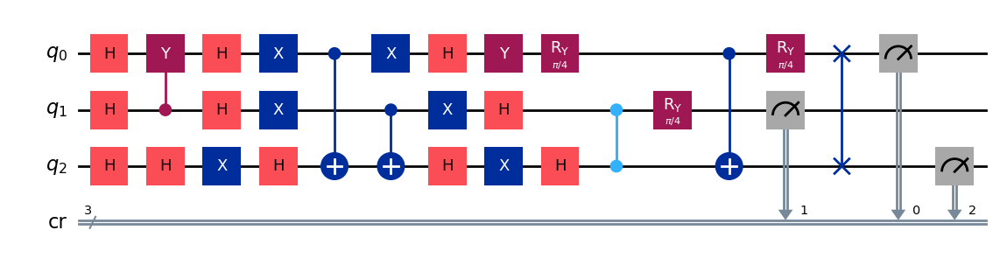

gen = 0 , Best fitness = (0.8701,)
gen = 1 , Best fitness = (0.8669,) , Number of invalids = 7

[Run 3 | Gen 67/99] Best Fitness: 0.8669 | Fidelity: 0.8596 | Gates: 36


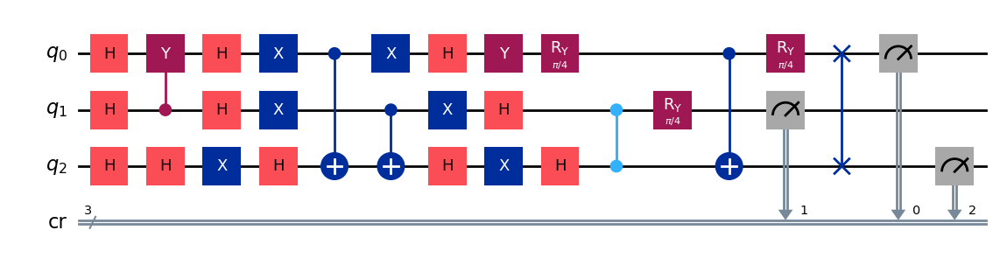

gen = 0 , Best fitness = (0.8669,)
gen = 1 , Best fitness = (0.8662,) , Number of invalids = 5

[Run 3 | Gen 68/99] Best Fitness: 0.8662 | Fidelity: 0.8581 | Gates: 36


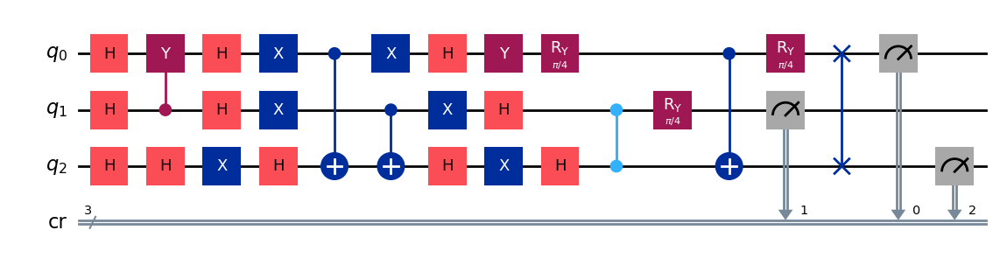

gen = 0 , Best fitness = (0.8662,)
gen = 1 , Best fitness = (0.8662,) , Number of invalids = 3

[Run 3 | Gen 69/99] Best Fitness: 0.8662 | Fidelity: 0.8549 | Gates: 36


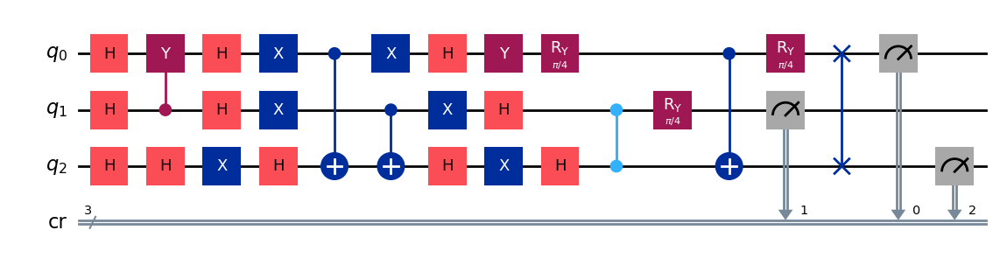

gen = 0 , Best fitness = (0.8662,)
gen = 1 , Best fitness = (0.8662,) , Number of invalids = 5

[Run 3 | Gen 70/99] Best Fitness: 0.8662 | Fidelity: 0.8542 | Gates: 36


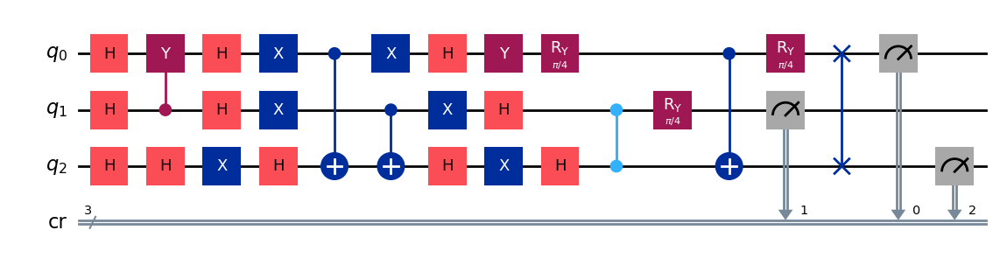

gen = 0 , Best fitness = (0.8662,)
gen = 1 , Best fitness = (0.8603999999999999,) , Number of invalids = 6

[Run 3 | Gen 71/99] Best Fitness: 0.8604 | Fidelity: 0.8486 | Gates: 36


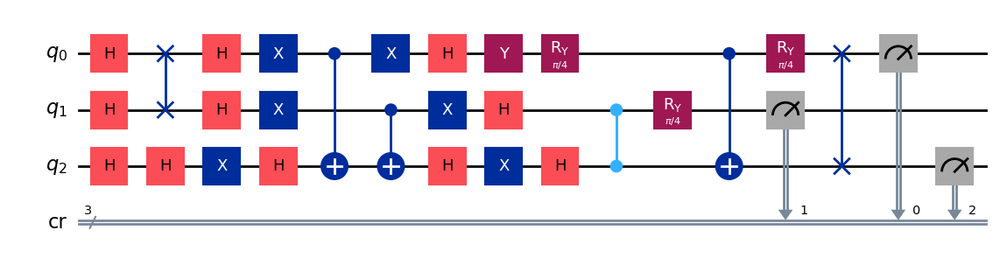

gen = 0 , Best fitness = (0.8603999999999999,)
gen = 1 , Best fitness = (0.8603999999999999,) , Number of invalids = 6

[Run 3 | Gen 72/99] Best Fitness: 0.8604 | Fidelity: 0.8462 | Gates: 36


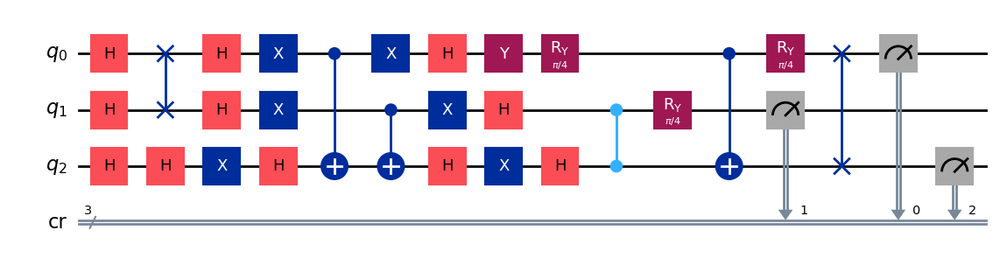

gen = 0 , Best fitness = (0.8603999999999999,)
gen = 1 , Best fitness = (0.8603999999999999,) , Number of invalids = 7

[Run 3 | Gen 73/99] Best Fitness: 0.8604 | Fidelity: 0.8524 | Gates: 36


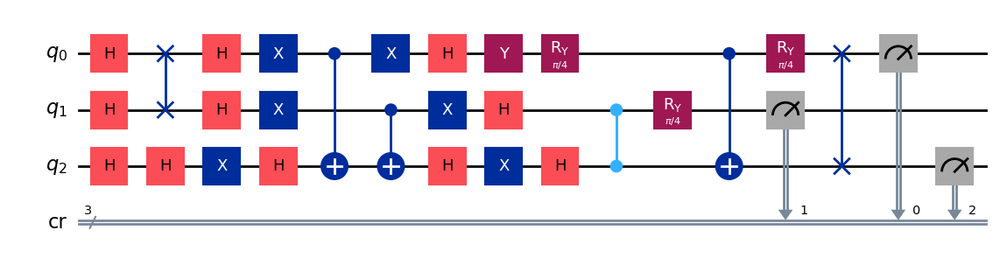

gen = 0 , Best fitness = (0.8603999999999999,)
gen = 1 , Best fitness = (0.8603999999999999,) , Number of invalids = 4

[Run 3 | Gen 74/99] Best Fitness: 0.8604 | Fidelity: 0.8518 | Gates: 36


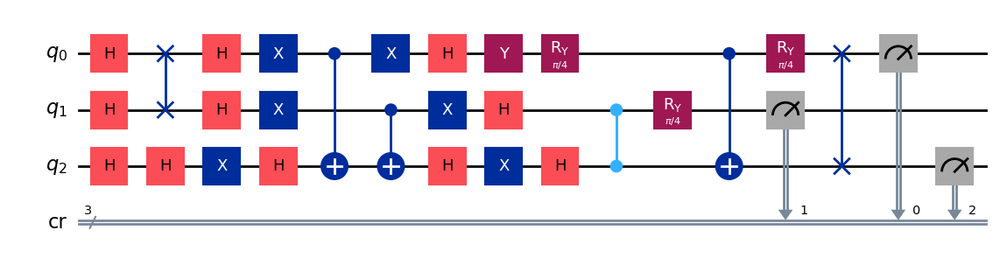

gen = 0 , Best fitness = (0.8603999999999999,)
gen = 1 , Best fitness = (0.8603999999999999,) , Number of invalids = 1

[Run 3 | Gen 75/99] Best Fitness: 0.8604 | Fidelity: 0.8530 | Gates: 36


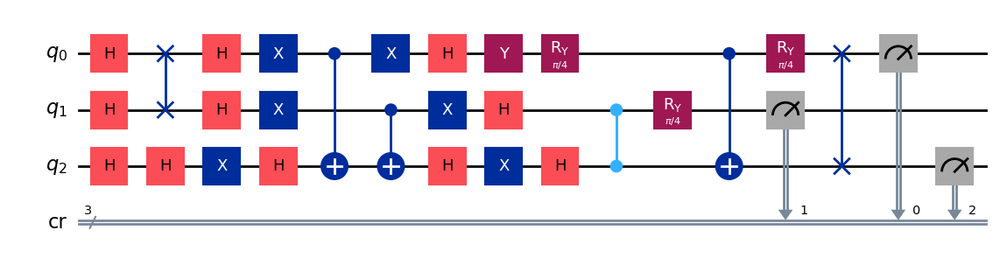

gen = 0 , Best fitness = (0.8603999999999999,)
gen = 1 , Best fitness = (0.8603999999999999,) , Number of invalids = 2

[Run 3 | Gen 76/99] Best Fitness: 0.8604 | Fidelity: 0.8579 | Gates: 36


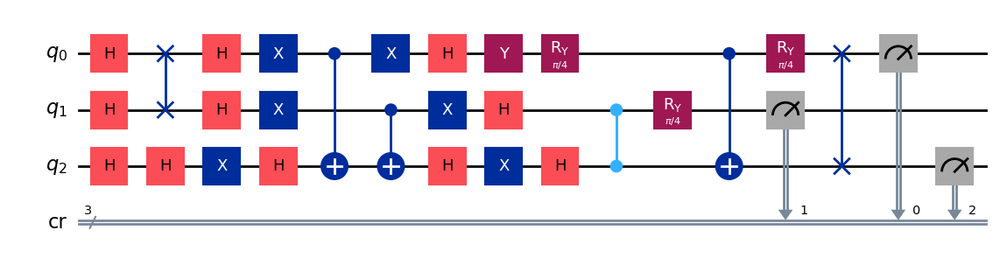

gen = 0 , Best fitness = (0.8603999999999999,)
gen = 1 , Best fitness = (0.8603999999999999,) , Number of invalids = 0

[Run 3 | Gen 77/99] Best Fitness: 0.8604 | Fidelity: 0.8588 | Gates: 36


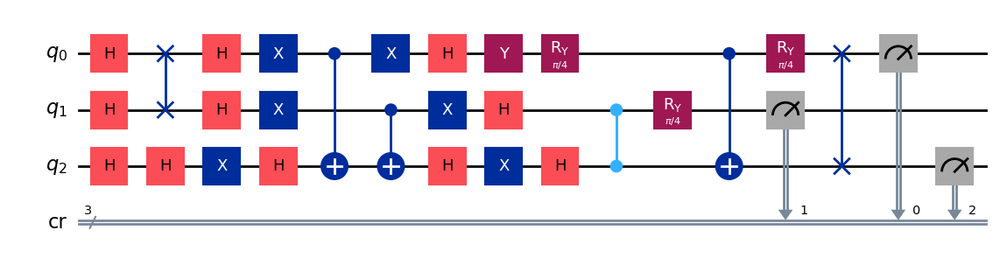

gen = 0 , Best fitness = (0.8603999999999999,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 0

[Run 3 | Gen 78/99] Best Fitness: 0.8601 | Fidelity: 0.8493 | Gates: 36


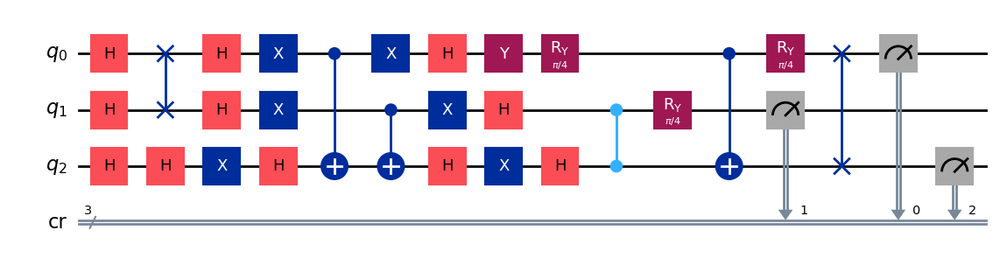

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 2

[Run 3 | Gen 79/99] Best Fitness: 0.8601 | Fidelity: 0.8544 | Gates: 36


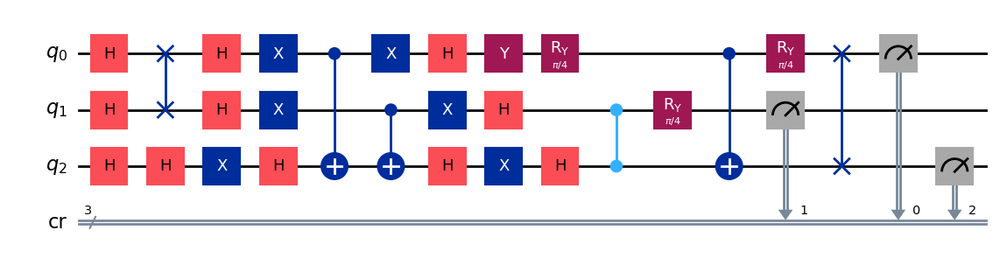

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 0

[Run 3 | Gen 80/99] Best Fitness: 0.8601 | Fidelity: 0.8560 | Gates: 36


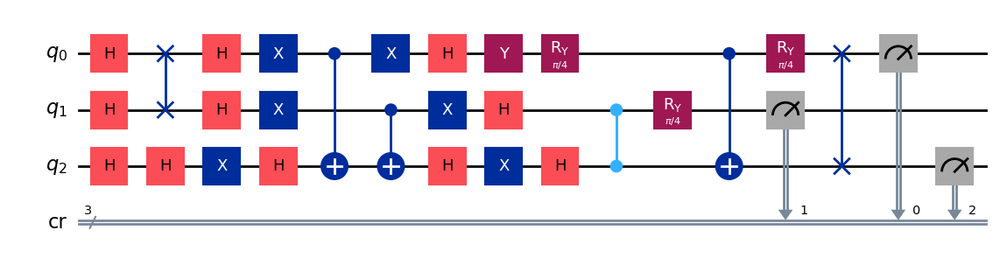

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 1

[Run 3 | Gen 81/99] Best Fitness: 0.8601 | Fidelity: 0.8498 | Gates: 36


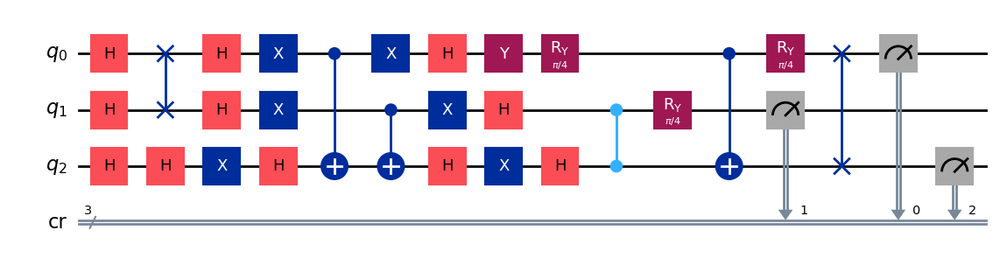

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 1

[Run 3 | Gen 82/99] Best Fitness: 0.8601 | Fidelity: 0.8531 | Gates: 36


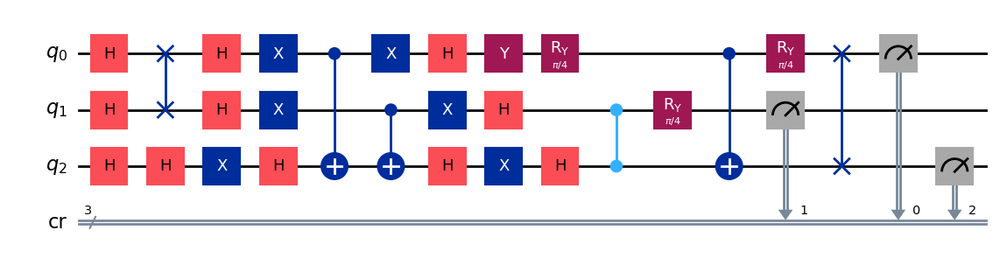

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 2

[Run 3 | Gen 83/99] Best Fitness: 0.8601 | Fidelity: 0.8565 | Gates: 36


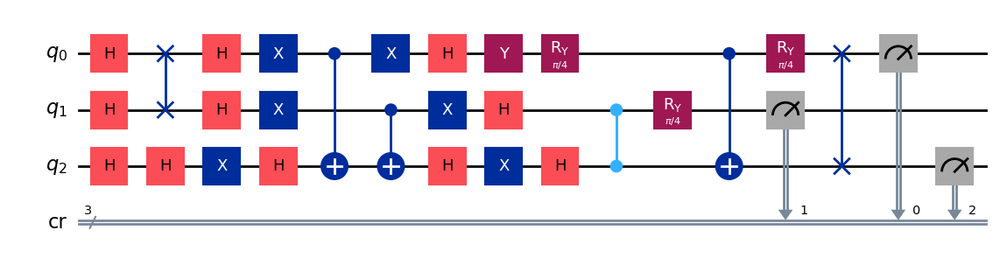

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 0

[Run 3 | Gen 84/99] Best Fitness: 0.8601 | Fidelity: 0.8528 | Gates: 36


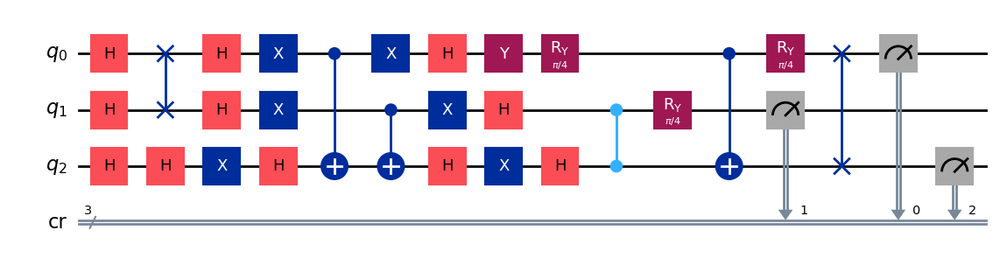

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 0

[Run 3 | Gen 85/99] Best Fitness: 0.8601 | Fidelity: 0.8549 | Gates: 36


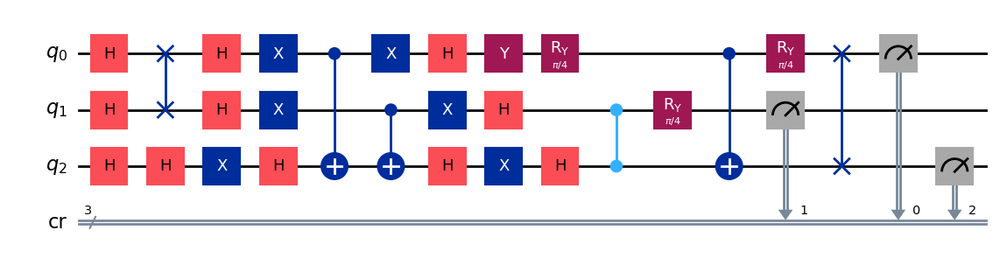

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 1

[Run 3 | Gen 86/99] Best Fitness: 0.8601 | Fidelity: 0.8527 | Gates: 36


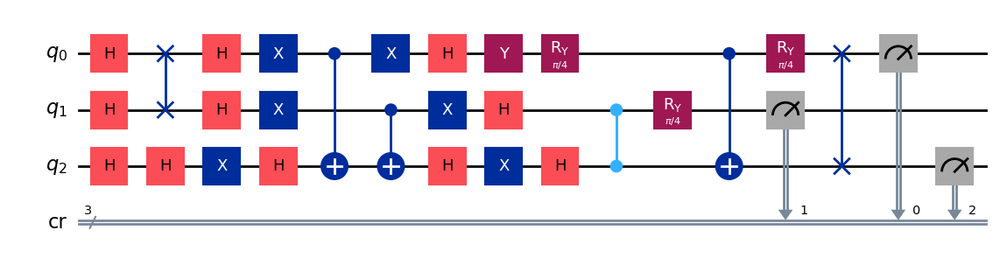

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8601,) , Number of invalids = 0

[Run 3 | Gen 87/99] Best Fitness: 0.8601 | Fidelity: 0.8528 | Gates: 36


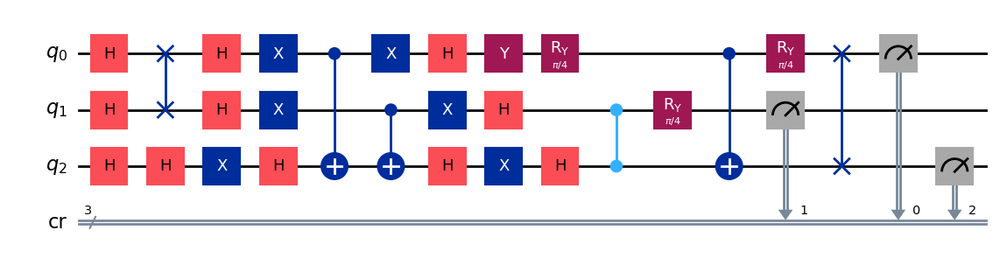

gen = 0 , Best fitness = (0.8601,)
gen = 1 , Best fitness = (0.8577,) , Number of invalids = 1

[Run 3 | Gen 88/99] Best Fitness: 0.8577 | Fidelity: 0.8565 | Gates: 36


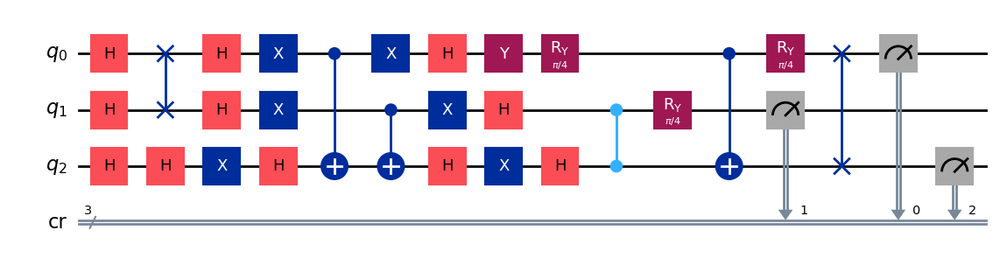

gen = 0 , Best fitness = (0.8577,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 1

[Run 3 | Gen 89/99] Best Fitness: 0.8515 | Fidelity: 0.9084 | Gates: 38


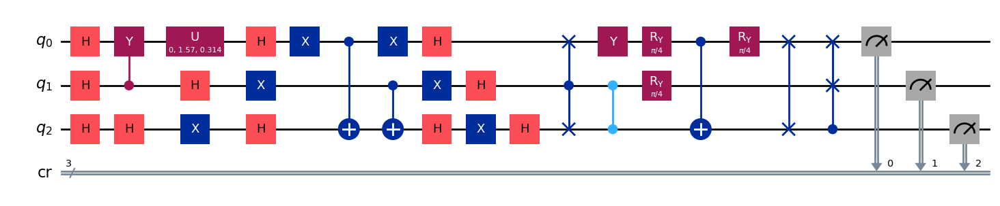

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 1

[Run 3 | Gen 90/99] Best Fitness: 0.8515 | Fidelity: 0.9063 | Gates: 38


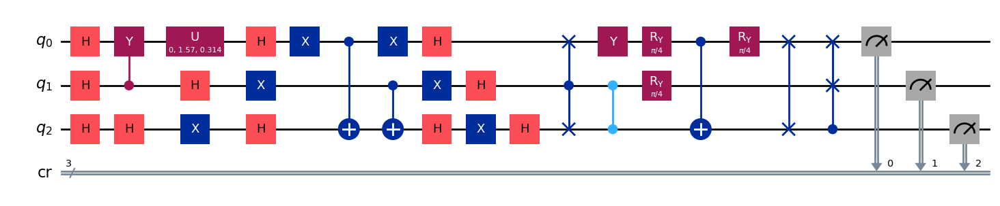

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 1

[Run 3 | Gen 91/99] Best Fitness: 0.8515 | Fidelity: 0.9015 | Gates: 38


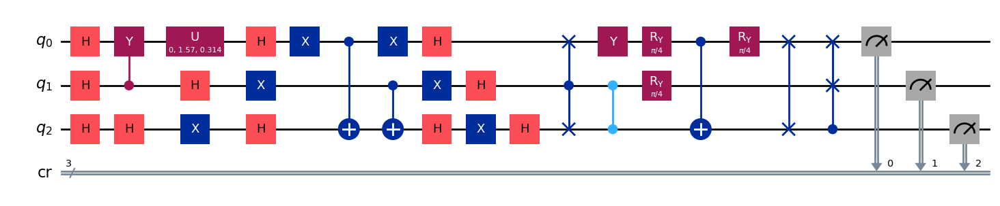

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 0

[Run 3 | Gen 92/99] Best Fitness: 0.8515 | Fidelity: 0.9036 | Gates: 38


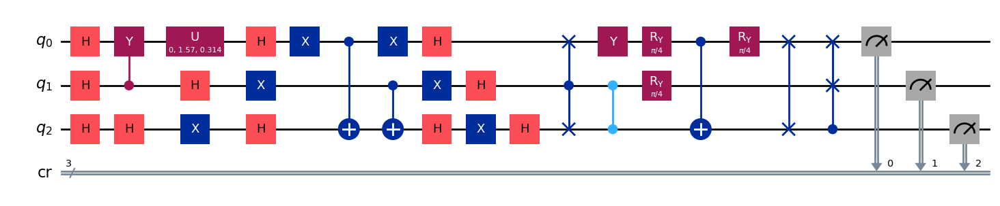

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 0

[Run 3 | Gen 93/99] Best Fitness: 0.8515 | Fidelity: 0.9069 | Gates: 38


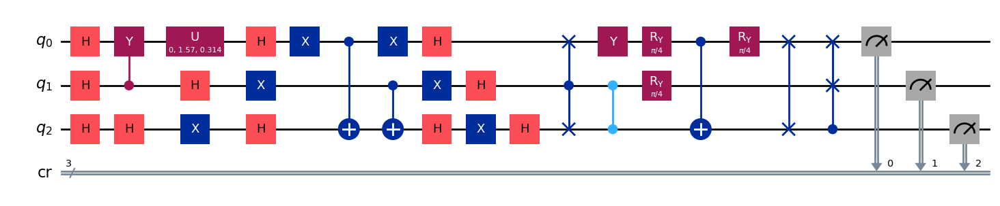

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 0

[Run 3 | Gen 94/99] Best Fitness: 0.8515 | Fidelity: 0.9079 | Gates: 38


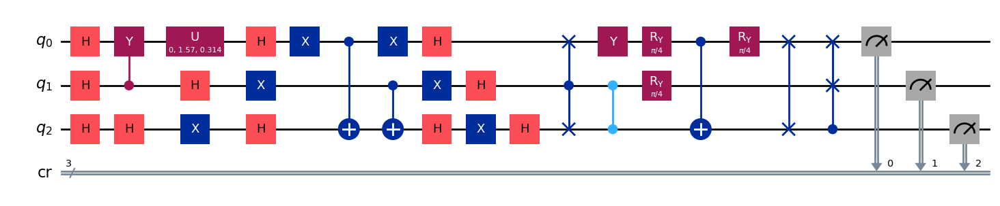

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 0

[Run 3 | Gen 95/99] Best Fitness: 0.8515 | Fidelity: 0.9085 | Gates: 38


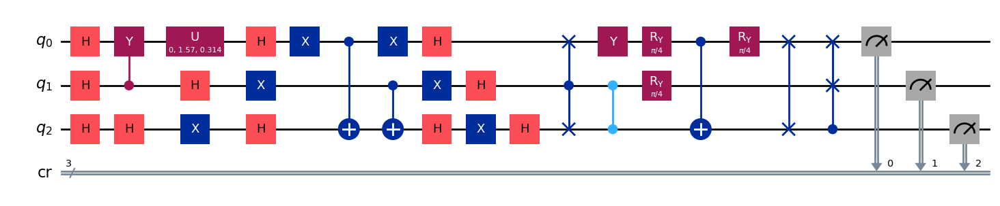

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 0

[Run 3 | Gen 96/99] Best Fitness: 0.8515 | Fidelity: 0.9099 | Gates: 38


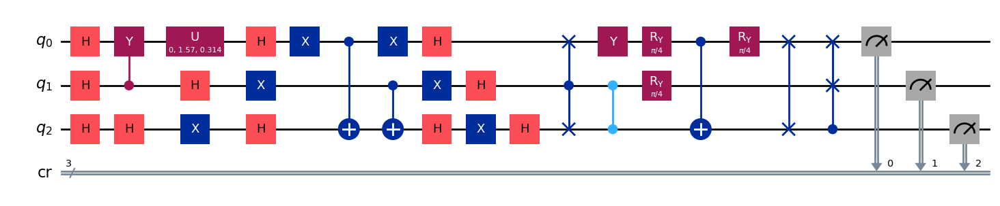

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 1

[Run 3 | Gen 97/99] Best Fitness: 0.8515 | Fidelity: 0.9108 | Gates: 38


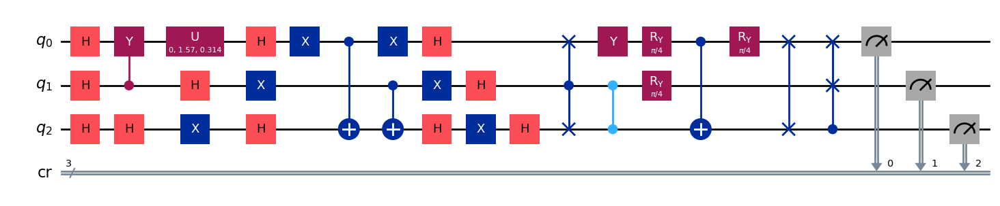

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 0

[Run 3 | Gen 98/99] Best Fitness: 0.8515 | Fidelity: 0.9041 | Gates: 38


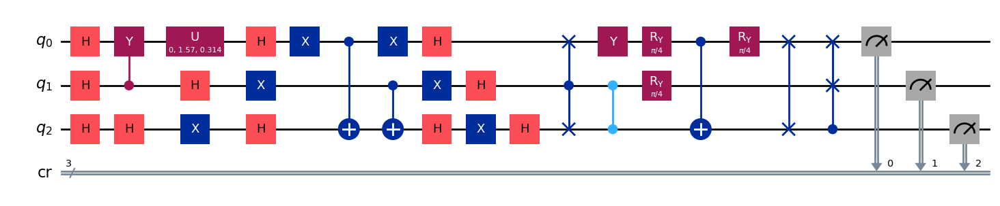

gen = 0 , Best fitness = (0.8515,)
gen = 1 , Best fitness = (0.8515,) , Number of invalids = 0

[Run 3 | Gen 99/99] Best Fitness: 0.8515 | Fidelity: 0.9085 | Gates: 38


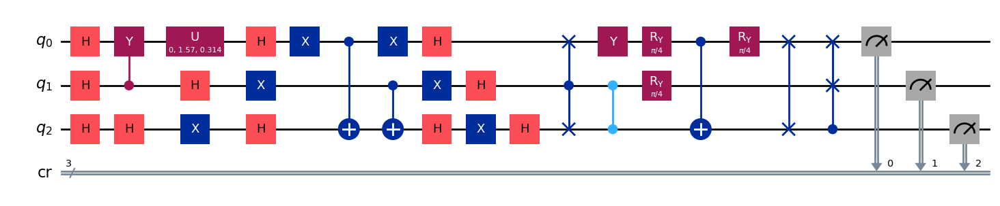


Generating evolution plots for Run 3...
✓ Plot saved to: experiments_state_100/run_3_seed_68853/evolution_metrics_run_3.png


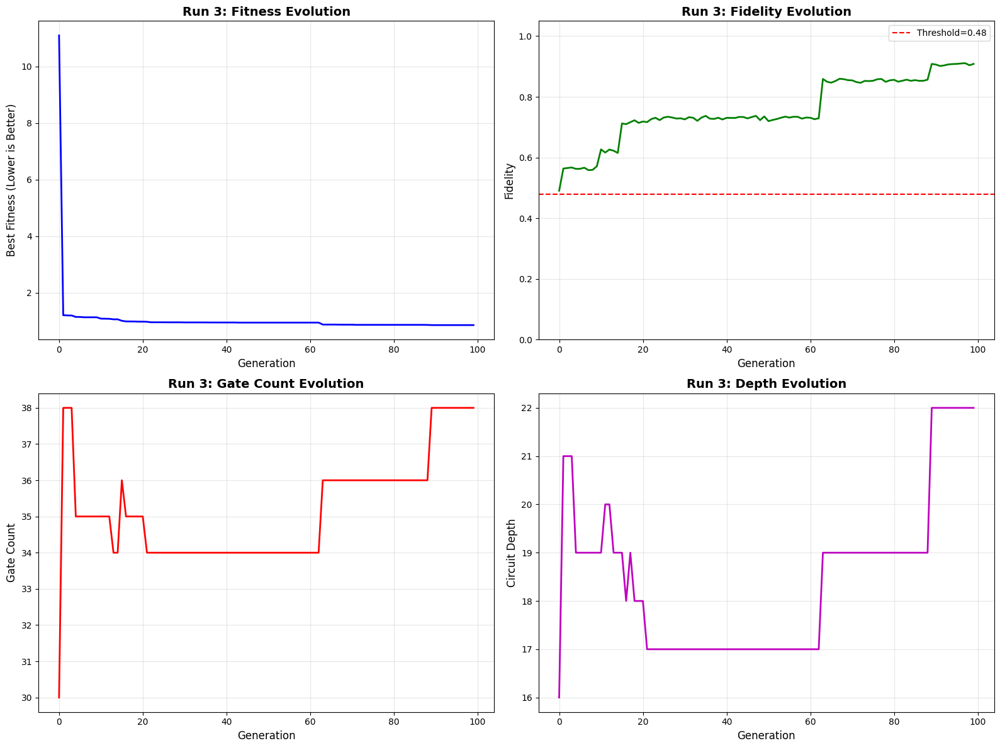


✓ Run 3 COMPLETE | Fidelity: 0.9094 | Gates: 38 | Depth: 22


RUN 4/5 | Target: 100 | Seed: 81245
✓ Logging to: experiments_state_100/run_4_seed_81245
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.3443,)
gen = 1 , Best fitness = (1.3443,) , Number of invalids = 166

[Run 4 | Gen 0/99] Best Fitness: 1.3443 | Fidelity: 0.7242 | Gates: 53


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


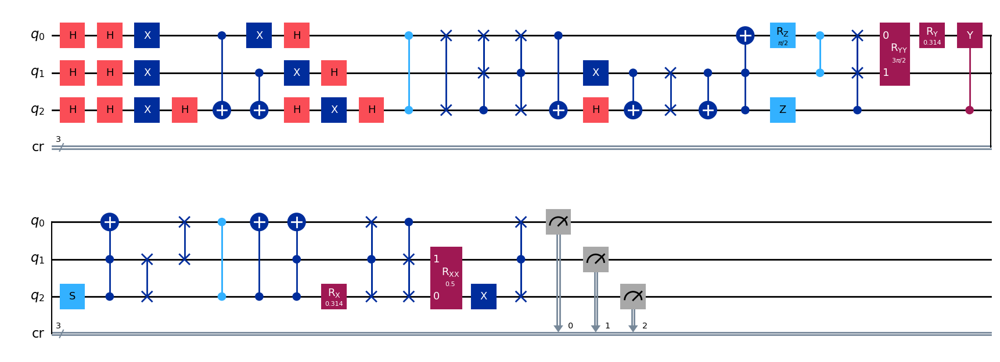

gen = 0 , Best fitness = (1.3443,)
gen = 1 , Best fitness = (1.3443,) , Number of invalids = 64

[Run 4 | Gen 1/99] Best Fitness: 1.3443 | Fidelity: 0.7202 | Gates: 53


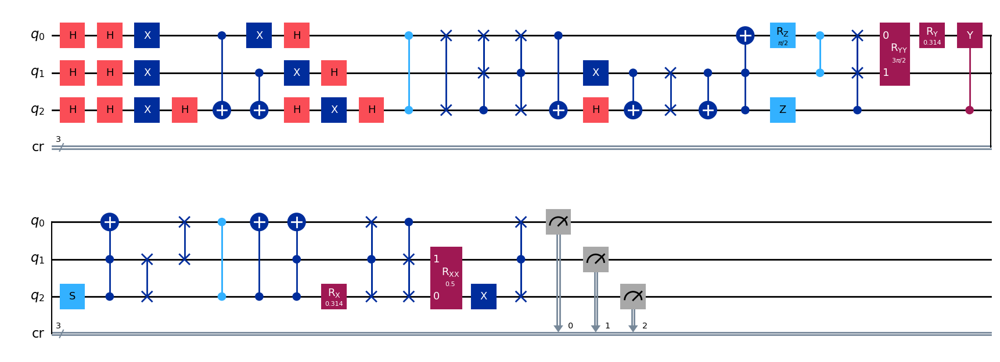

gen = 0 , Best fitness = (1.3443,)
gen = 1 , Best fitness = (1.1601,) , Number of invalids = 63

[Run 4 | Gen 2/99] Best Fitness: 1.1601 | Fidelity: 0.5616 | Gates: 36


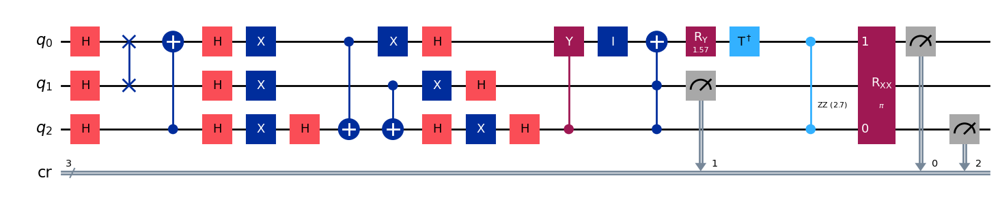

gen = 0 , Best fitness = (1.1601,)
gen = 1 , Best fitness = (1.1183,) , Number of invalids = 46

[Run 4 | Gen 3/99] Best Fitness: 1.1183 | Fidelity: 0.5619 | Gates: 34


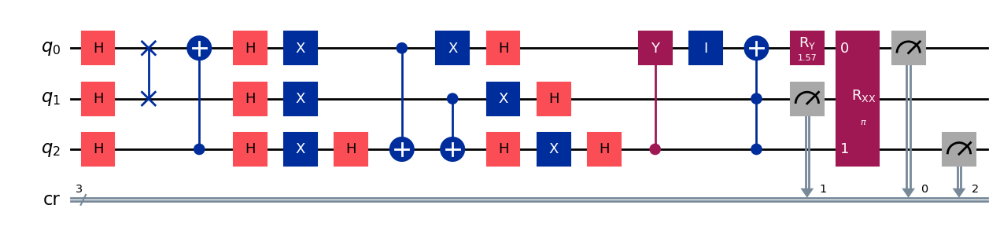

gen = 0 , Best fitness = (1.1183,)
gen = 1 , Best fitness = (1.1183,) , Number of invalids = 23

[Run 4 | Gen 4/99] Best Fitness: 1.1183 | Fidelity: 0.5573 | Gates: 34


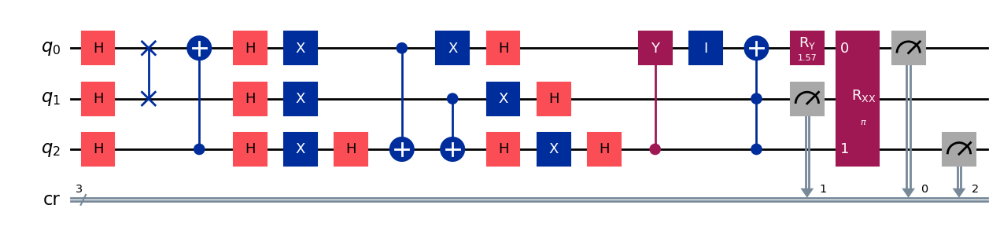

gen = 0 , Best fitness = (1.1183,)
gen = 1 , Best fitness = (1.1176,) , Number of invalids = 22

[Run 4 | Gen 5/99] Best Fitness: 1.1176 | Fidelity: 0.5675 | Gates: 34


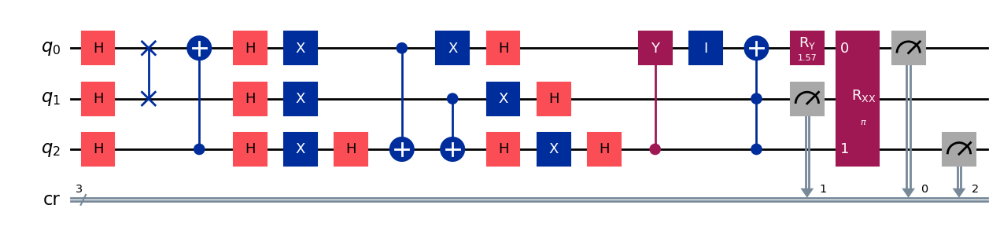

gen = 0 , Best fitness = (1.1176,)
gen = 1 , Best fitness = (1.1149,) , Number of invalids = 31

[Run 4 | Gen 6/99] Best Fitness: 1.1149 | Fidelity: 0.5651 | Gates: 34


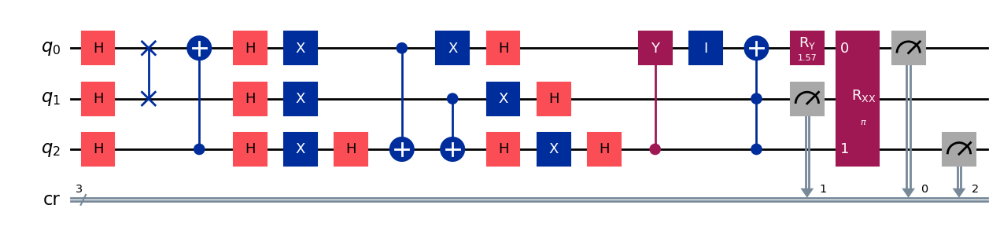

gen = 0 , Best fitness = (1.1149,)
gen = 1 , Best fitness = (1.1082,) , Number of invalids = 21

[Run 4 | Gen 7/99] Best Fitness: 1.1082 | Fidelity: 0.5705 | Gates: 34


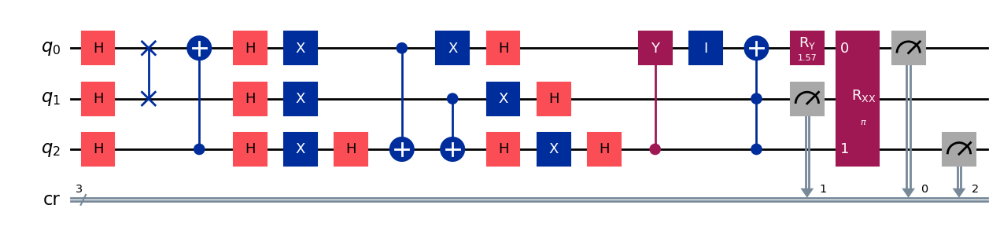

gen = 0 , Best fitness = (1.1082,)
gen = 1 , Best fitness = (1.0564,) , Number of invalids = 20

[Run 4 | Gen 8/99] Best Fitness: 1.0564 | Fidelity: 0.5618 | Gates: 31


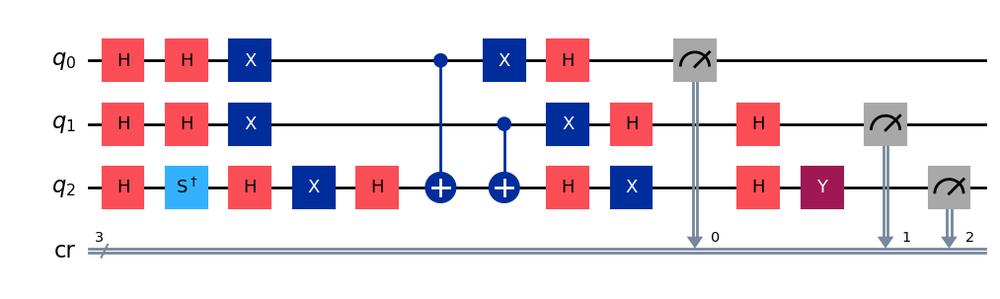

gen = 0 , Best fitness = (1.0564,)
gen = 1 , Best fitness = (1.0451000000000001,) , Number of invalids = 25

[Run 4 | Gen 9/99] Best Fitness: 1.0451 | Fidelity: 0.5578 | Gates: 31


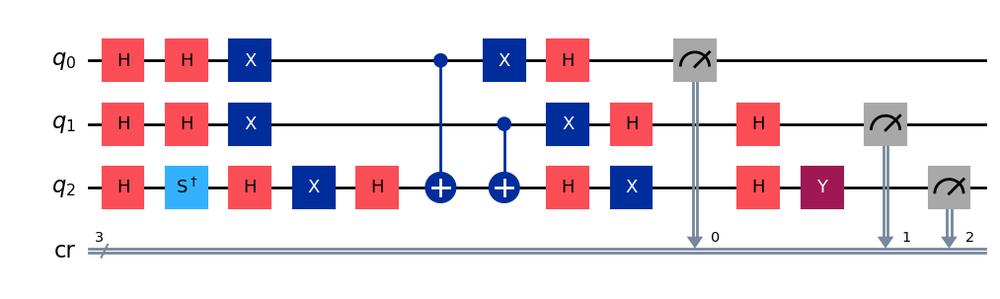

gen = 0 , Best fitness = (1.0451000000000001,)
gen = 1 , Best fitness = (1.0142,) , Number of invalids = 20

[Run 4 | Gen 10/99] Best Fitness: 1.0142 | Fidelity: 0.6048 | Gates: 31


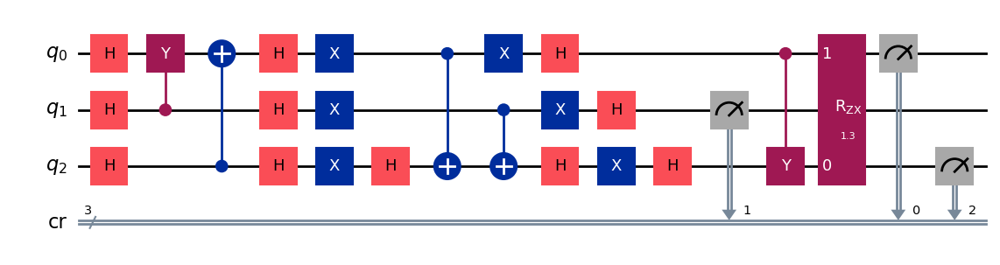

gen = 0 , Best fitness = (1.0142,)
gen = 1 , Best fitness = (1.012,) , Number of invalids = 22

[Run 4 | Gen 11/99] Best Fitness: 1.0120 | Fidelity: 0.6166 | Gates: 31


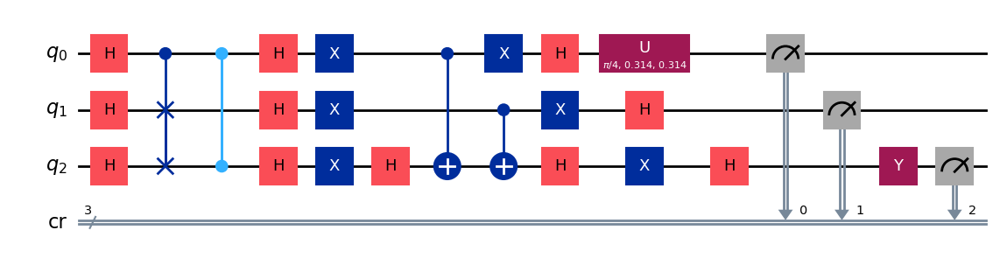

gen = 0 , Best fitness = (1.012,)
gen = 1 , Best fitness = (1.012,) , Number of invalids = 25

[Run 4 | Gen 12/99] Best Fitness: 1.0120 | Fidelity: 0.6116 | Gates: 31


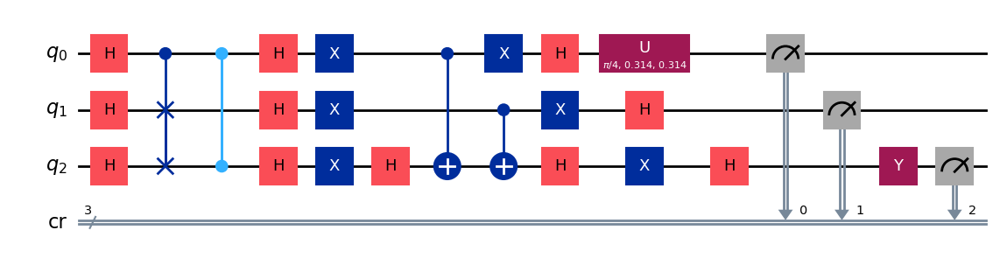

gen = 0 , Best fitness = (1.012,)
gen = 1 , Best fitness = (1.012,) , Number of invalids = 20

[Run 4 | Gen 13/99] Best Fitness: 1.0120 | Fidelity: 0.6165 | Gates: 31


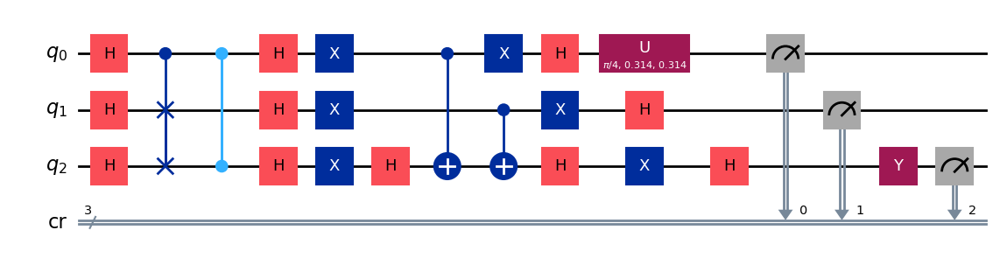

gen = 0 , Best fitness = (1.012,)
gen = 1 , Best fitness = (1.012,) , Number of invalids = 22

[Run 4 | Gen 14/99] Best Fitness: 1.0120 | Fidelity: 0.6223 | Gates: 31


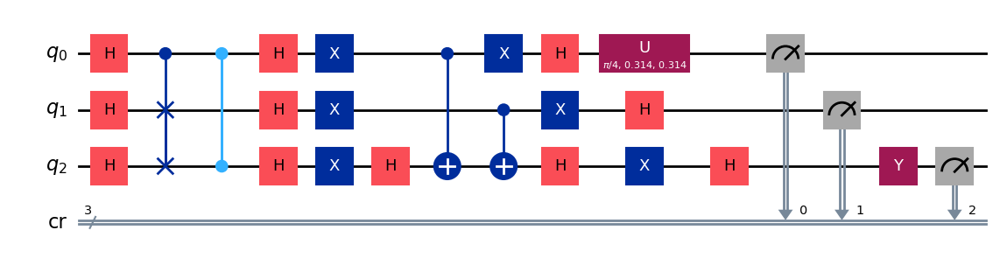

gen = 0 , Best fitness = (1.012,)
gen = 1 , Best fitness = (1.0,) , Number of invalids = 13

[Run 4 | Gen 15/99] Best Fitness: 1.0000 | Fidelity: 0.6277 | Gates: 31


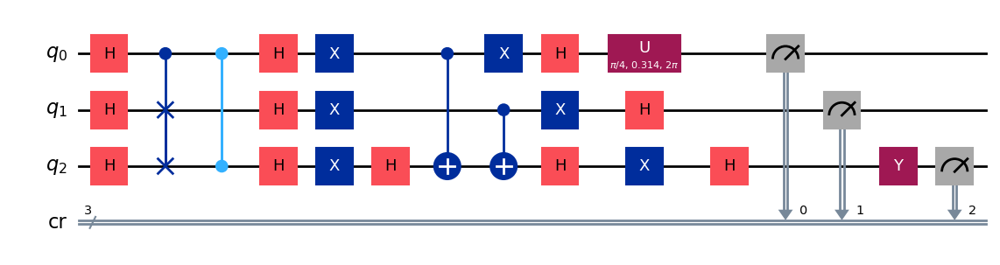

gen = 0 , Best fitness = (1.0,)
gen = 1 , Best fitness = (0.9932,) , Number of invalids = 10

[Run 4 | Gen 16/99] Best Fitness: 0.9932 | Fidelity: 0.6157 | Gates: 31


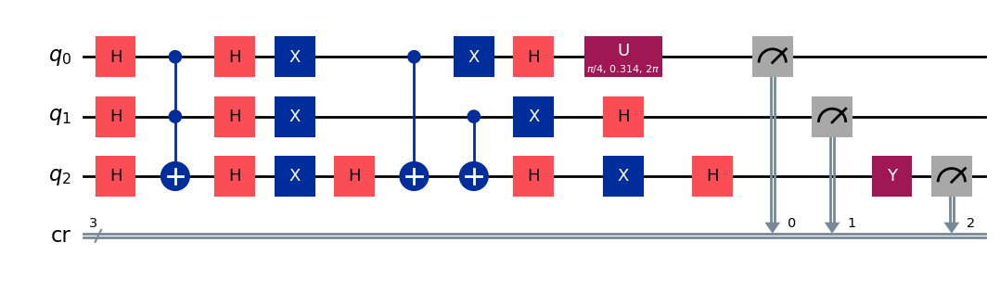

gen = 0 , Best fitness = (0.9932,)
gen = 1 , Best fitness = (0.9932,) , Number of invalids = 5

[Run 4 | Gen 17/99] Best Fitness: 0.9932 | Fidelity: 0.6225 | Gates: 31


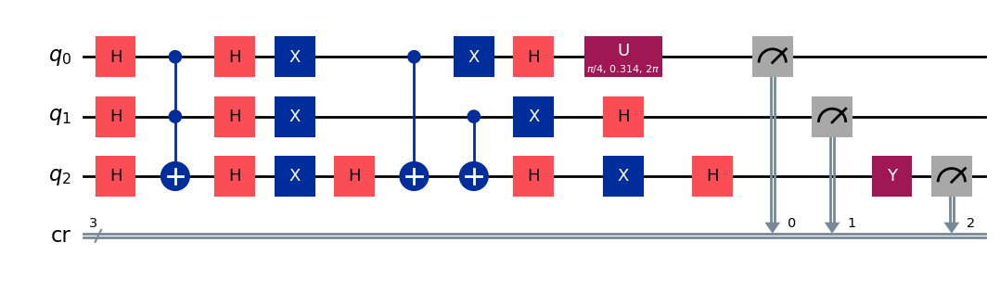

gen = 0 , Best fitness = (0.9932,)
gen = 1 , Best fitness = (0.9932,) , Number of invalids = 3

[Run 4 | Gen 18/99] Best Fitness: 0.9932 | Fidelity: 0.6309 | Gates: 31


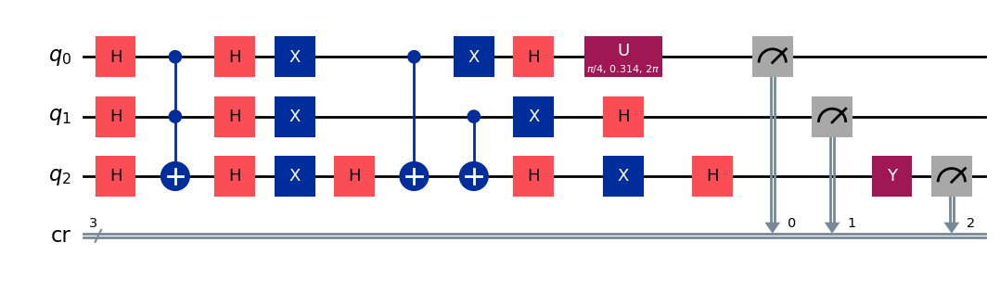

gen = 0 , Best fitness = (0.9932,)
gen = 1 , Best fitness = (0.9932,) , Number of invalids = 5

[Run 4 | Gen 19/99] Best Fitness: 0.9932 | Fidelity: 0.6242 | Gates: 31


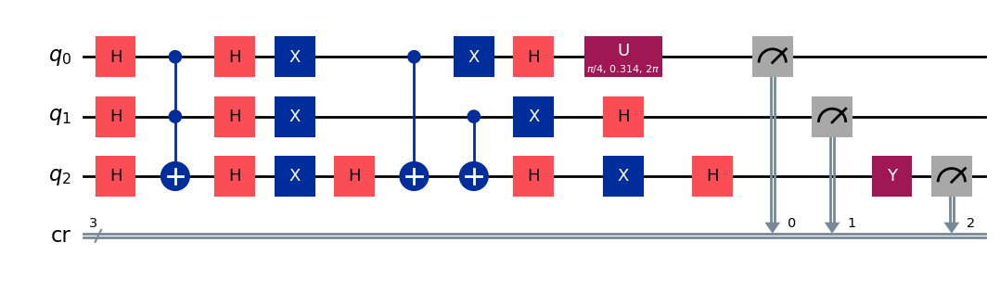

gen = 0 , Best fitness = (0.9932,)
gen = 1 , Best fitness = (0.9932,) , Number of invalids = 3

[Run 4 | Gen 20/99] Best Fitness: 0.9932 | Fidelity: 0.6215 | Gates: 31


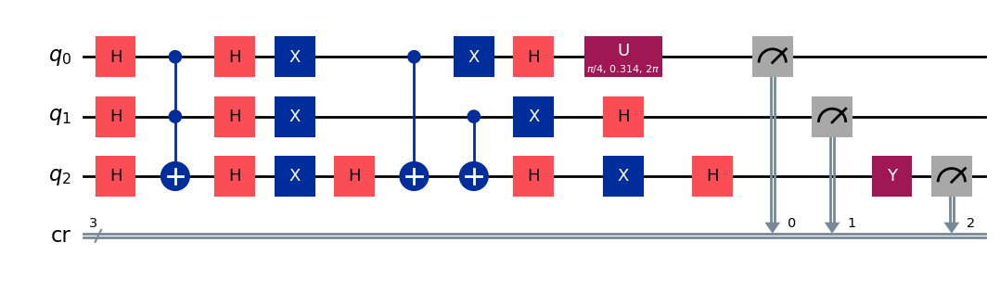

gen = 0 , Best fitness = (0.9932,)
gen = 1 , Best fitness = (0.9898,) , Number of invalids = 5

[Run 4 | Gen 21/99] Best Fitness: 0.9898 | Fidelity: 0.6194 | Gates: 31


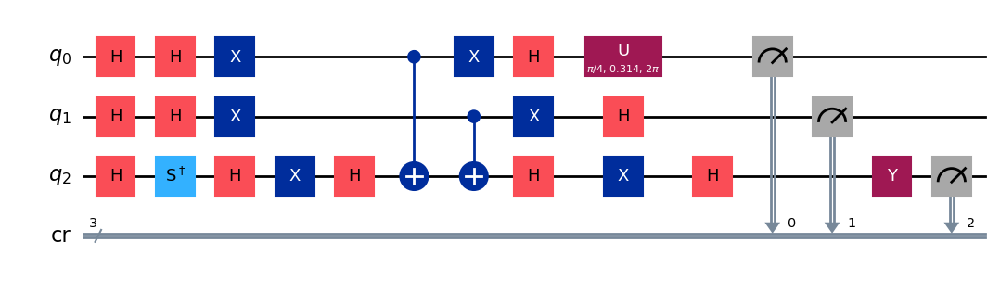

gen = 0 , Best fitness = (0.9898,)
gen = 1 , Best fitness = (0.9898,) , Number of invalids = 5

[Run 4 | Gen 22/99] Best Fitness: 0.9898 | Fidelity: 0.6360 | Gates: 31


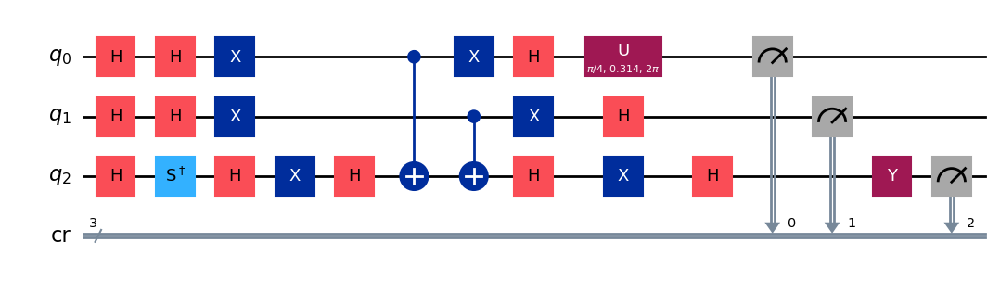

gen = 0 , Best fitness = (0.9898,)
gen = 1 , Best fitness = (0.9881,) , Number of invalids = 2

[Run 4 | Gen 23/99] Best Fitness: 0.9881 | Fidelity: 0.6128 | Gates: 31


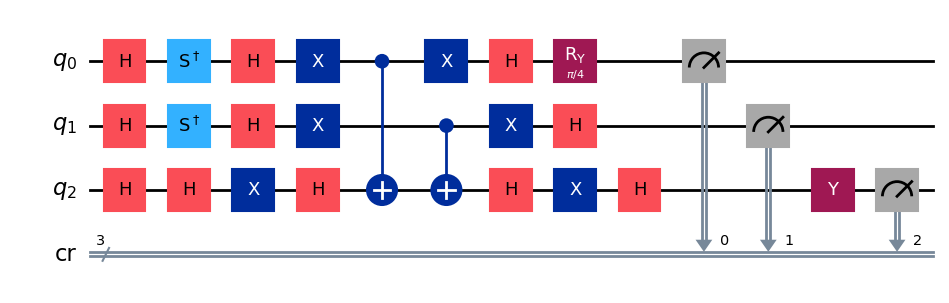

gen = 0 , Best fitness = (0.9881,)
gen = 1 , Best fitness = (0.9594,) , Number of invalids = 2

[Run 4 | Gen 24/99] Best Fitness: 0.9594 | Fidelity: 0.6738 | Gates: 32


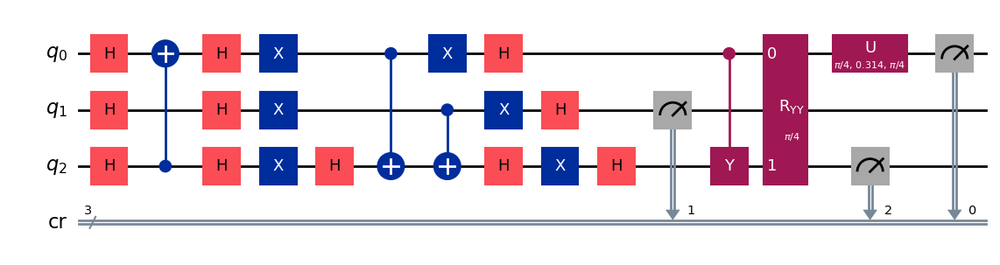

gen = 0 , Best fitness = (0.9594,)
gen = 1 , Best fitness = (0.9313,) , Number of invalids = 1

[Run 4 | Gen 25/99] Best Fitness: 0.9313 | Fidelity: 0.7127 | Gates: 32


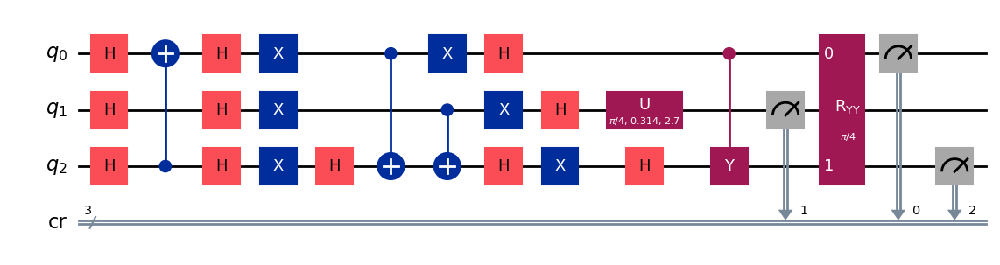

gen = 0 , Best fitness = (0.9313,)
gen = 1 , Best fitness = (0.9313,) , Number of invalids = 5

[Run 4 | Gen 26/99] Best Fitness: 0.9313 | Fidelity: 0.7212 | Gates: 32


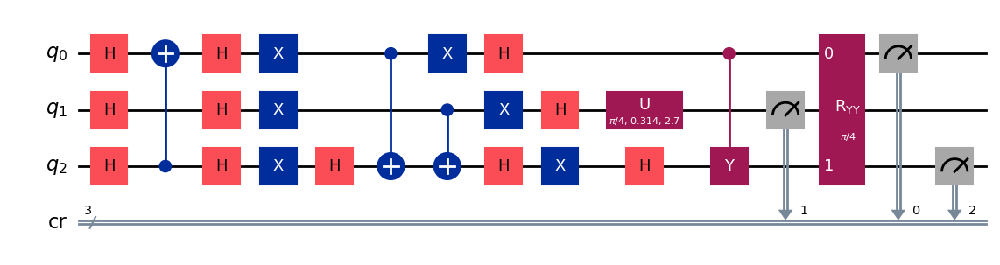

gen = 0 , Best fitness = (0.9313,)
gen = 1 , Best fitness = (0.9253,) , Number of invalids = 0

[Run 4 | Gen 27/99] Best Fitness: 0.9253 | Fidelity: 0.7074 | Gates: 32


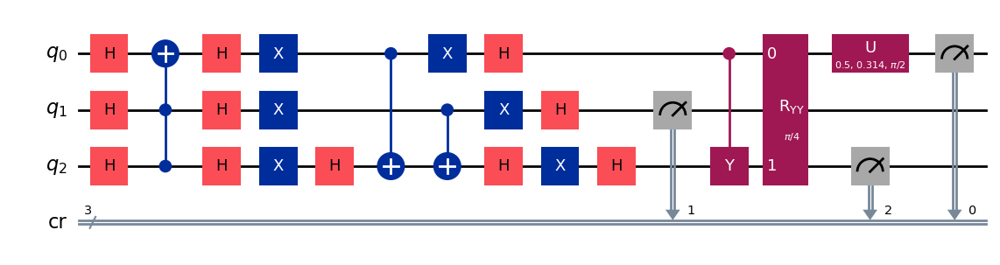

gen = 0 , Best fitness = (0.9253,)
gen = 1 , Best fitness = (0.904,) , Number of invalids = 0

[Run 4 | Gen 28/99] Best Fitness: 0.9040 | Fidelity: 0.7251 | Gates: 32


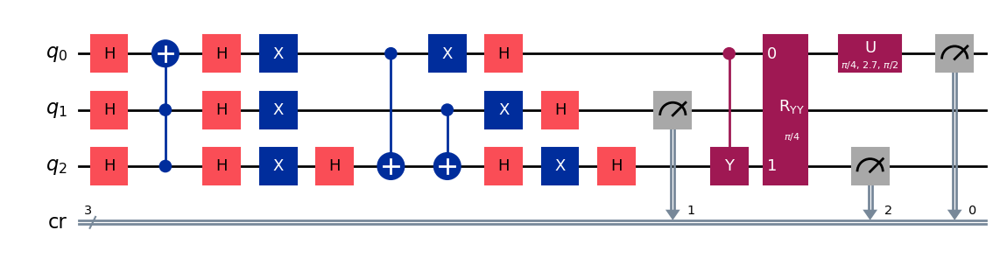

gen = 0 , Best fitness = (0.904,)
gen = 1 , Best fitness = (0.904,) , Number of invalids = 1

[Run 4 | Gen 29/99] Best Fitness: 0.9040 | Fidelity: 0.7281 | Gates: 32


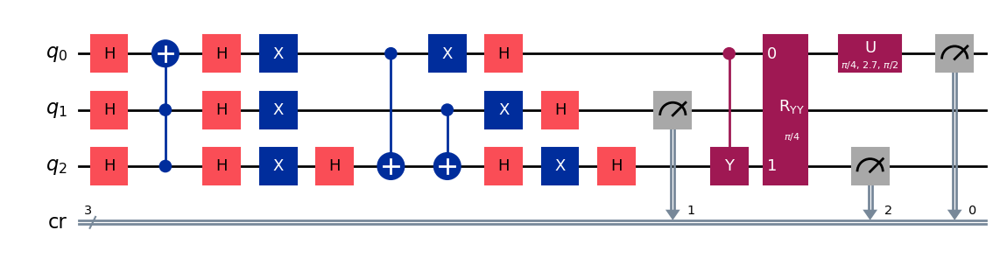

gen = 0 , Best fitness = (0.904,)
gen = 1 , Best fitness = (0.904,) , Number of invalids = 3

[Run 4 | Gen 30/99] Best Fitness: 0.9040 | Fidelity: 0.7303 | Gates: 32


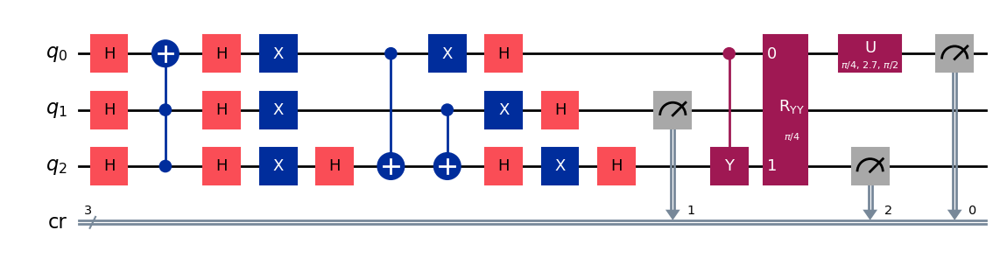

gen = 0 , Best fitness = (0.904,)
gen = 1 , Best fitness = (0.904,) , Number of invalids = 0

[Run 4 | Gen 31/99] Best Fitness: 0.9040 | Fidelity: 0.7268 | Gates: 32


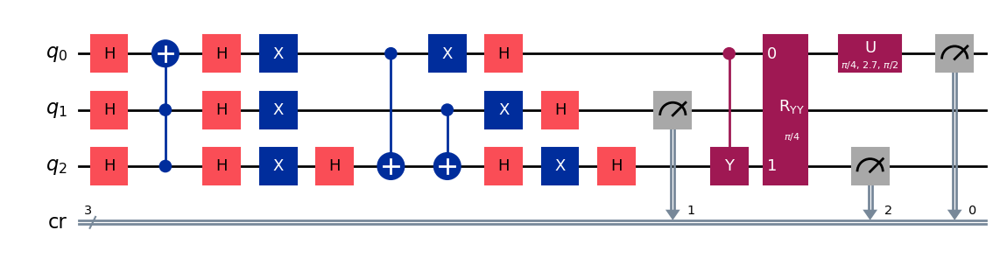

gen = 0 , Best fitness = (0.904,)
gen = 1 , Best fitness = (0.904,) , Number of invalids = 0

[Run 4 | Gen 32/99] Best Fitness: 0.9040 | Fidelity: 0.7325 | Gates: 32


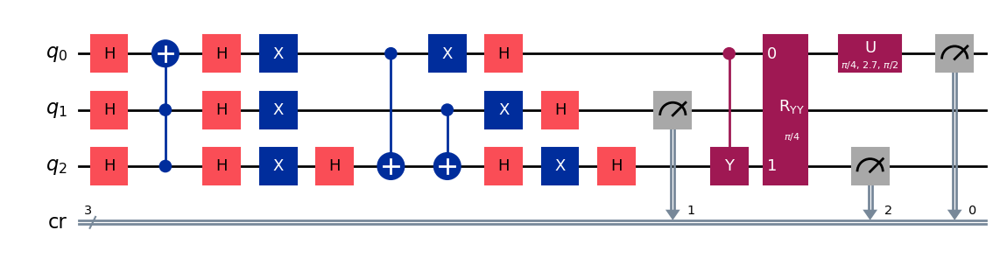

gen = 0 , Best fitness = (0.904,)
gen = 1 , Best fitness = (0.904,) , Number of invalids = 0

[Run 4 | Gen 33/99] Best Fitness: 0.9040 | Fidelity: 0.7343 | Gates: 32


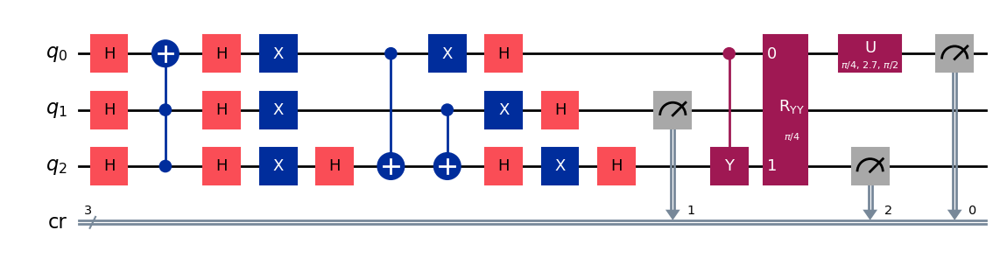

gen = 0 , Best fitness = (0.904,)
gen = 1 , Best fitness = (0.9004,) , Number of invalids = 0

[Run 4 | Gen 34/99] Best Fitness: 0.9004 | Fidelity: 0.7256 | Gates: 32


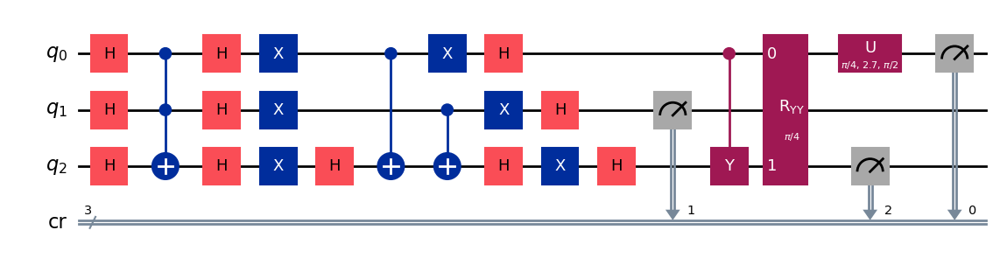

gen = 0 , Best fitness = (0.9004,)
gen = 1 , Best fitness = (0.9004,) , Number of invalids = 0

[Run 4 | Gen 35/99] Best Fitness: 0.9004 | Fidelity: 0.7272 | Gates: 32


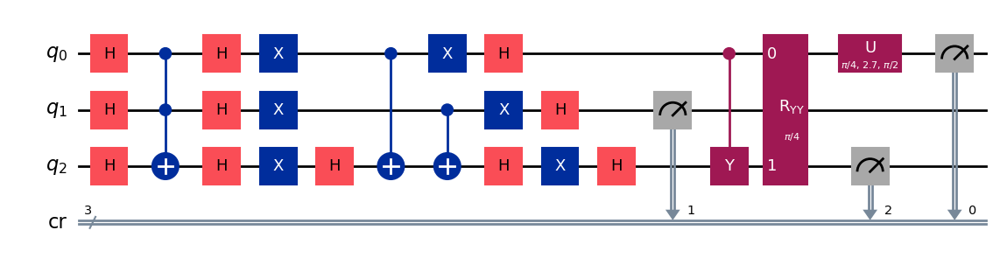

gen = 0 , Best fitness = (0.9004,)
gen = 1 , Best fitness = (0.9002,) , Number of invalids = 0

[Run 4 | Gen 36/99] Best Fitness: 0.9002 | Fidelity: 0.7302 | Gates: 32


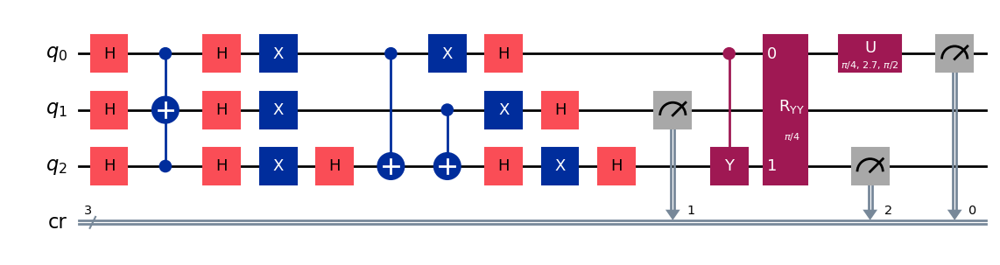

gen = 0 , Best fitness = (0.9002,)
gen = 1 , Best fitness = (0.9002,) , Number of invalids = 0

[Run 4 | Gen 37/99] Best Fitness: 0.9002 | Fidelity: 0.7329 | Gates: 32


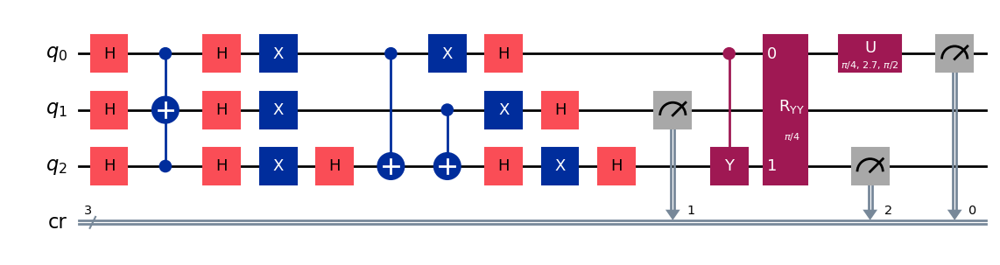

gen = 0 , Best fitness = (0.9002,)
gen = 1 , Best fitness = (0.9002,) , Number of invalids = 0

[Run 4 | Gen 38/99] Best Fitness: 0.9002 | Fidelity: 0.7302 | Gates: 32


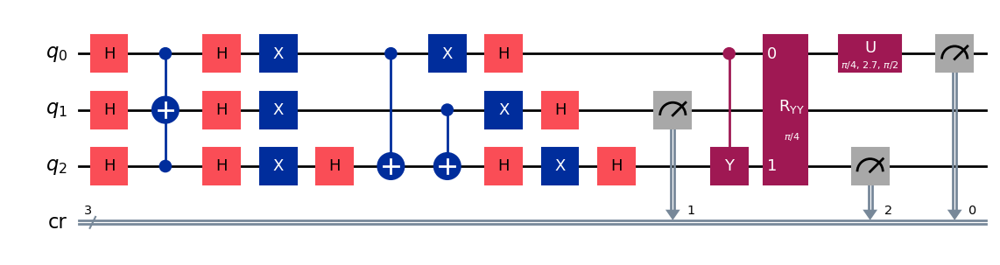

gen = 0 , Best fitness = (0.9002,)
gen = 1 , Best fitness = (0.9002,) , Number of invalids = 0

[Run 4 | Gen 39/99] Best Fitness: 0.9002 | Fidelity: 0.7317 | Gates: 32


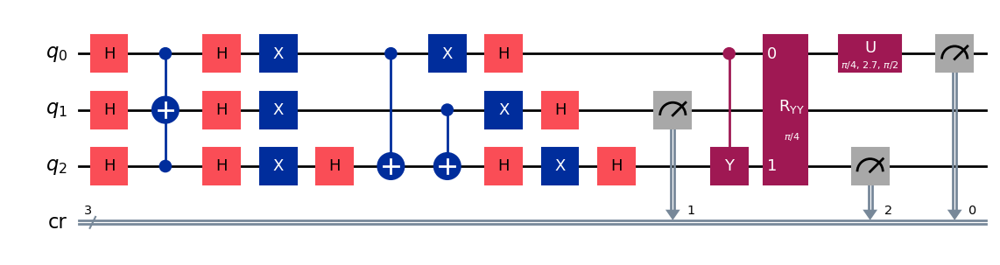

gen = 0 , Best fitness = (0.9002,)
gen = 1 , Best fitness = (0.9002,) , Number of invalids = 0

[Run 4 | Gen 40/99] Best Fitness: 0.9002 | Fidelity: 0.7298 | Gates: 32


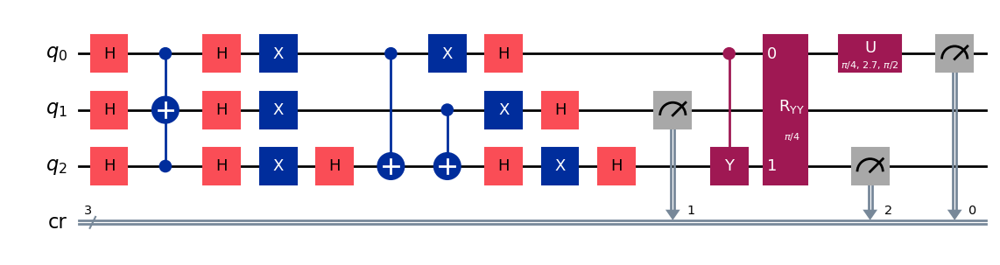

gen = 0 , Best fitness = (0.9002,)
gen = 1 , Best fitness = (0.8995,) , Number of invalids = 0

[Run 4 | Gen 41/99] Best Fitness: 0.8995 | Fidelity: 0.7321 | Gates: 32


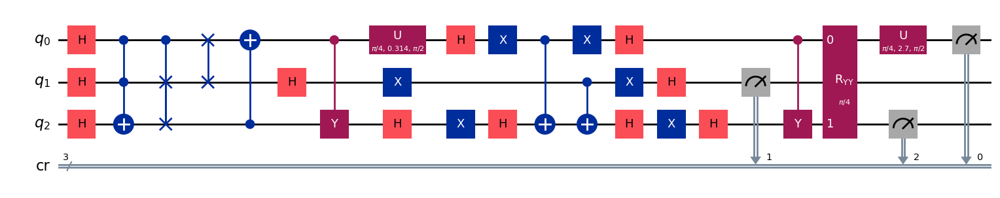

gen = 0 , Best fitness = (0.8995,)
gen = 1 , Best fitness = (0.897,) , Number of invalids = 0

[Run 4 | Gen 42/99] Best Fitness: 0.8970 | Fidelity: 0.7308 | Gates: 32


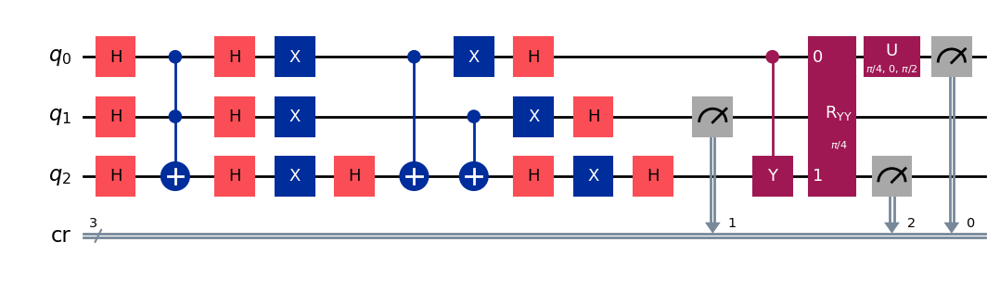

gen = 0 , Best fitness = (0.897,)
gen = 1 , Best fitness = (0.897,) , Number of invalids = 0

[Run 4 | Gen 43/99] Best Fitness: 0.8970 | Fidelity: 0.7304 | Gates: 32


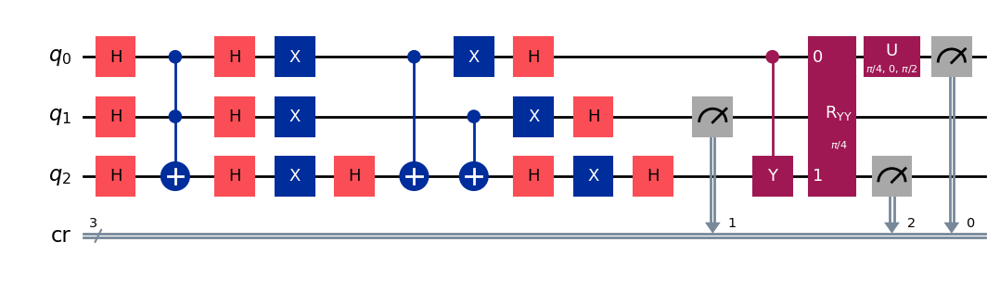

gen = 0 , Best fitness = (0.897,)
gen = 1 , Best fitness = (0.897,) , Number of invalids = 0

[Run 4 | Gen 44/99] Best Fitness: 0.8970 | Fidelity: 0.7332 | Gates: 32


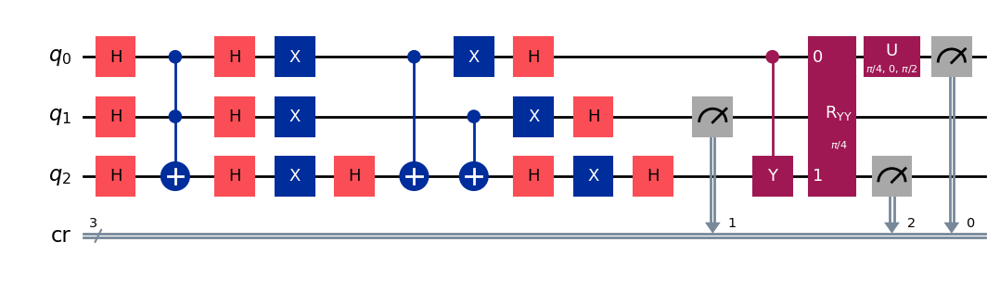

gen = 0 , Best fitness = (0.897,)
gen = 1 , Best fitness = (0.897,) , Number of invalids = 0

[Run 4 | Gen 45/99] Best Fitness: 0.8970 | Fidelity: 0.7367 | Gates: 32


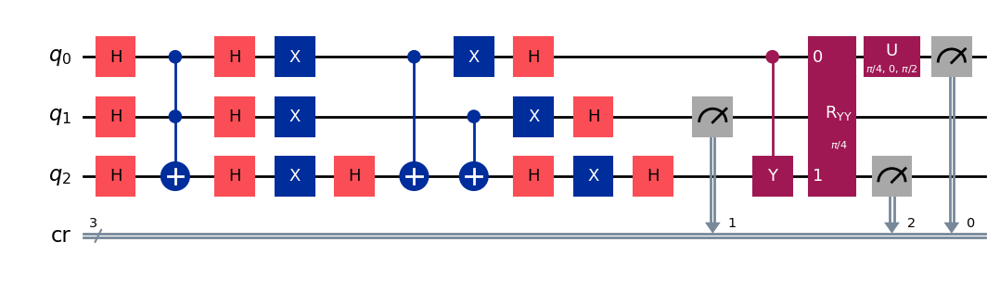

gen = 0 , Best fitness = (0.897,)
gen = 1 , Best fitness = (0.897,) , Number of invalids = 0

[Run 4 | Gen 46/99] Best Fitness: 0.8970 | Fidelity: 0.7246 | Gates: 32


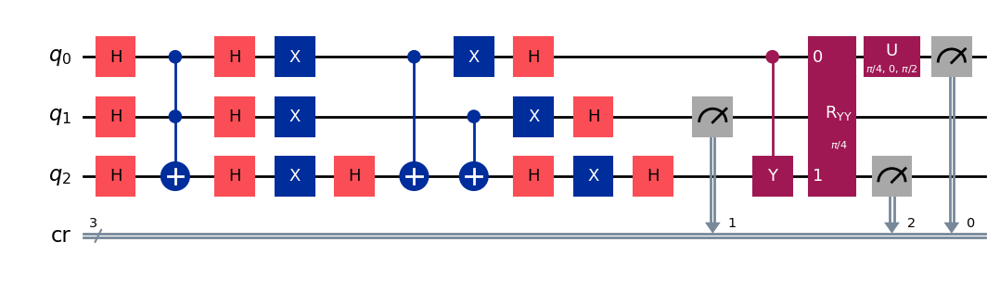

gen = 0 , Best fitness = (0.897,)
gen = 1 , Best fitness = (0.897,) , Number of invalids = 0

[Run 4 | Gen 47/99] Best Fitness: 0.8970 | Fidelity: 0.7326 | Gates: 32


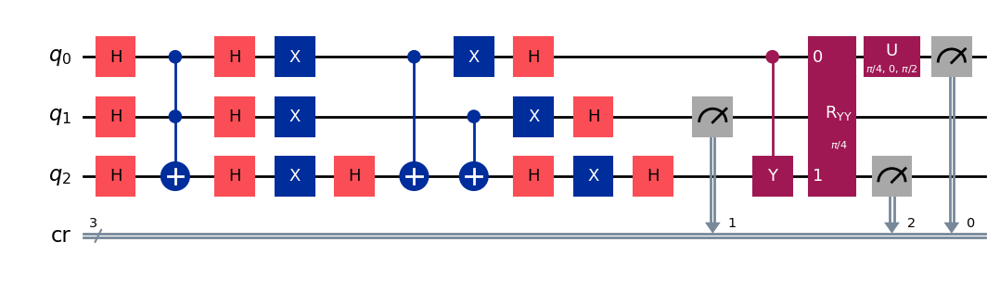

gen = 0 , Best fitness = (0.897,)
gen = 1 , Best fitness = (0.8594,) , Number of invalids = 0

[Run 4 | Gen 48/99] Best Fitness: 0.8594 | Fidelity: 0.8234 | Gates: 34


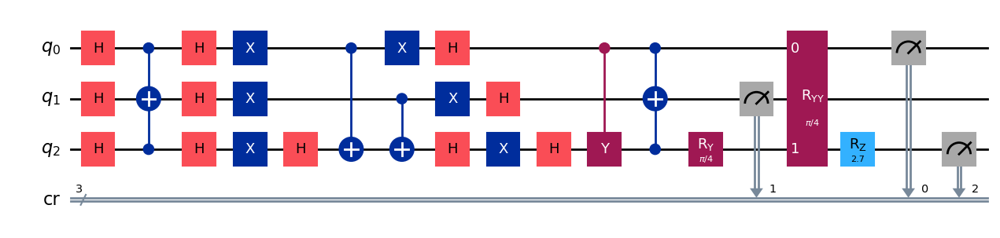

gen = 0 , Best fitness = (0.8594,)
gen = 1 , Best fitness = (0.8594,) , Number of invalids = 0

[Run 4 | Gen 49/99] Best Fitness: 0.8594 | Fidelity: 0.8203 | Gates: 34


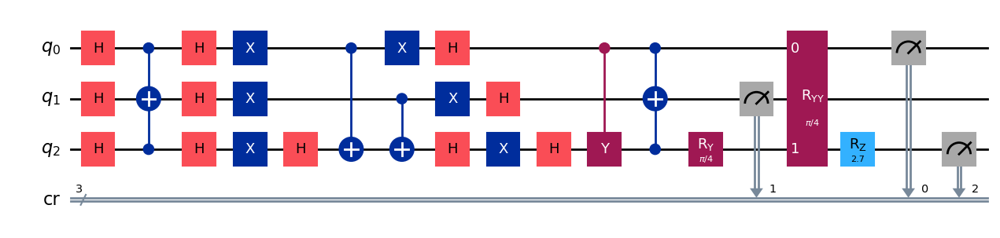

gen = 0 , Best fitness = (0.8594,)
gen = 1 , Best fitness = (0.8578,) , Number of invalids = 0

[Run 4 | Gen 50/99] Best Fitness: 0.8578 | Fidelity: 0.8162 | Gates: 34


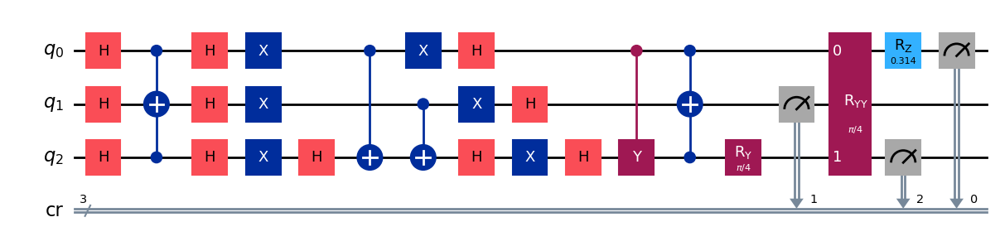

gen = 0 , Best fitness = (0.8578,)
gen = 1 , Best fitness = (0.8555,) , Number of invalids = 0

[Run 4 | Gen 51/99] Best Fitness: 0.8555 | Fidelity: 0.8123 | Gates: 34


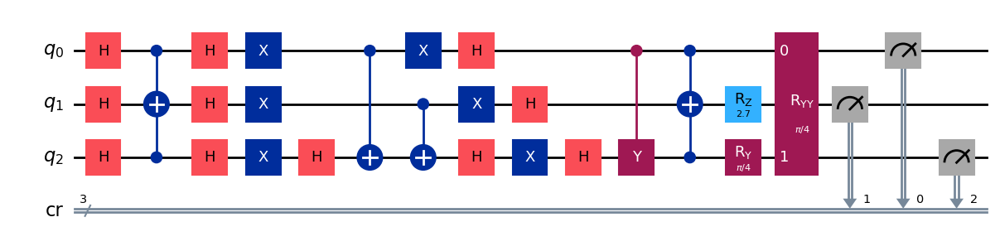

gen = 0 , Best fitness = (0.8555,)
gen = 1 , Best fitness = (0.8555,) , Number of invalids = 0

[Run 4 | Gen 52/99] Best Fitness: 0.8555 | Fidelity: 0.8265 | Gates: 34


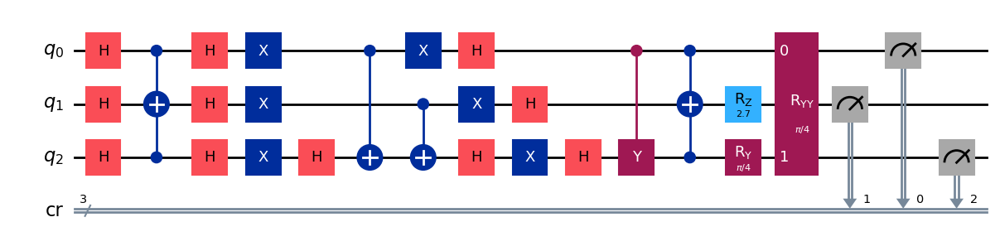

gen = 0 , Best fitness = (0.8555,)
gen = 1 , Best fitness = (0.8555,) , Number of invalids = 0

[Run 4 | Gen 53/99] Best Fitness: 0.8555 | Fidelity: 0.8238 | Gates: 34


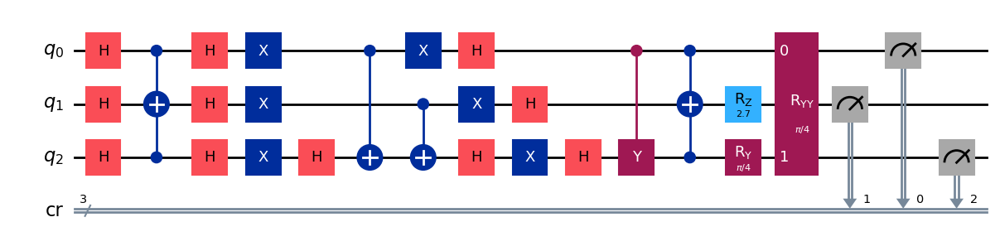

gen = 0 , Best fitness = (0.8555,)
gen = 1 , Best fitness = (0.8547,) , Number of invalids = 0

[Run 4 | Gen 54/99] Best Fitness: 0.8547 | Fidelity: 0.8223 | Gates: 34


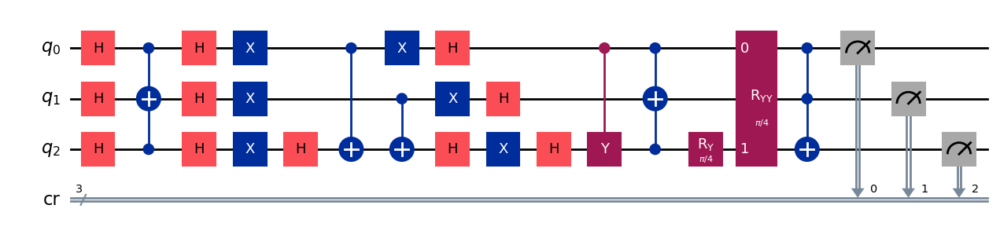

gen = 0 , Best fitness = (0.8547,)
gen = 1 , Best fitness = (0.8547,) , Number of invalids = 0

[Run 4 | Gen 55/99] Best Fitness: 0.8547 | Fidelity: 0.8240 | Gates: 34


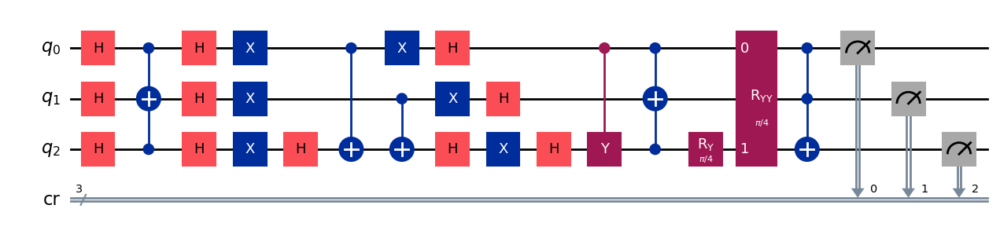

gen = 0 , Best fitness = (0.8547,)
gen = 1 , Best fitness = (0.8468,) , Number of invalids = 0

[Run 4 | Gen 56/99] Best Fitness: 0.8468 | Fidelity: 0.8445 | Gates: 34


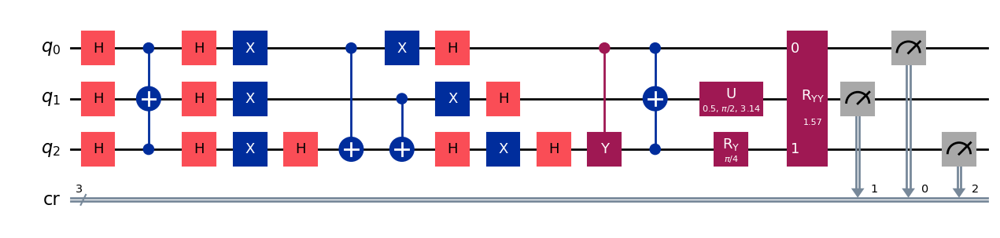

gen = 0 , Best fitness = (0.8468,)
gen = 1 , Best fitness = (0.8339000000000001,) , Number of invalids = 0

[Run 4 | Gen 57/99] Best Fitness: 0.8339 | Fidelity: 0.8203 | Gates: 33


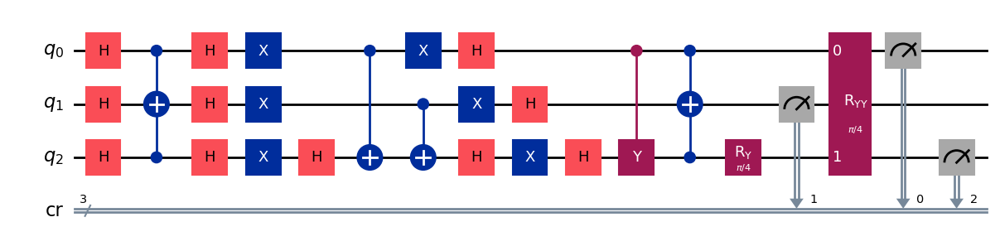

gen = 0 , Best fitness = (0.8339000000000001,)
gen = 1 , Best fitness = (0.8339000000000001,) , Number of invalids = 0

[Run 4 | Gen 58/99] Best Fitness: 0.8339 | Fidelity: 0.8153 | Gates: 33


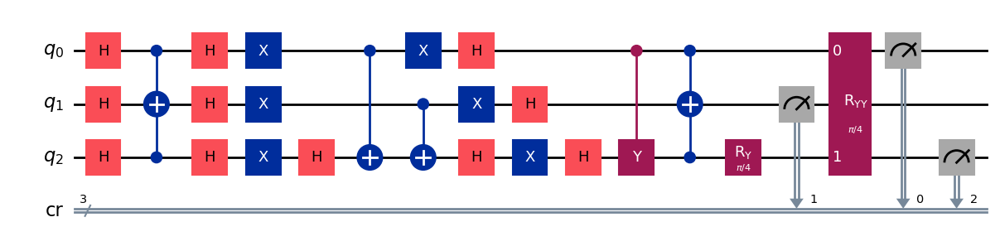

gen = 0 , Best fitness = (0.8339000000000001,)
gen = 1 , Best fitness = (0.8339000000000001,) , Number of invalids = 0

[Run 4 | Gen 59/99] Best Fitness: 0.8339 | Fidelity: 0.8208 | Gates: 33


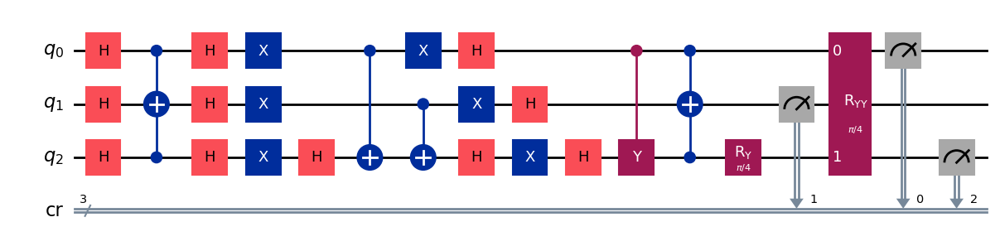

gen = 0 , Best fitness = (0.8339000000000001,)
gen = 1 , Best fitness = (0.8339000000000001,) , Number of invalids = 0

[Run 4 | Gen 60/99] Best Fitness: 0.8339 | Fidelity: 0.8150 | Gates: 33


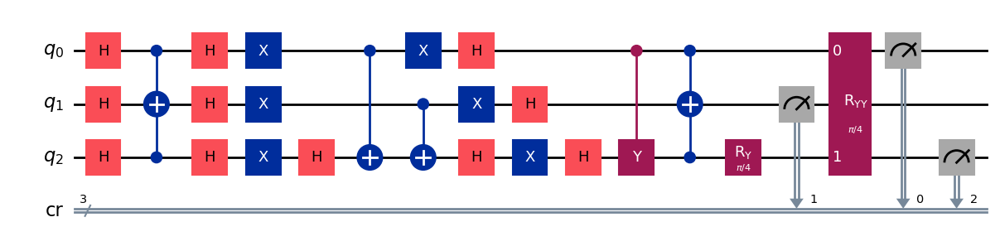

gen = 0 , Best fitness = (0.8339000000000001,)
gen = 1 , Best fitness = (0.8339000000000001,) , Number of invalids = 0

[Run 4 | Gen 61/99] Best Fitness: 0.8339 | Fidelity: 0.8171 | Gates: 33


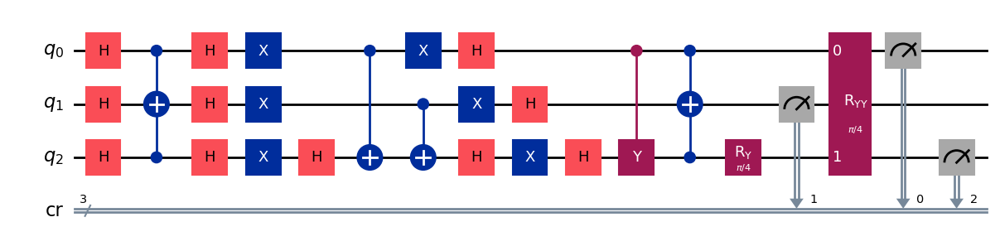

gen = 0 , Best fitness = (0.8339000000000001,)
gen = 1 , Best fitness = (0.8339000000000001,) , Number of invalids = 0

[Run 4 | Gen 62/99] Best Fitness: 0.8339 | Fidelity: 0.8197 | Gates: 33


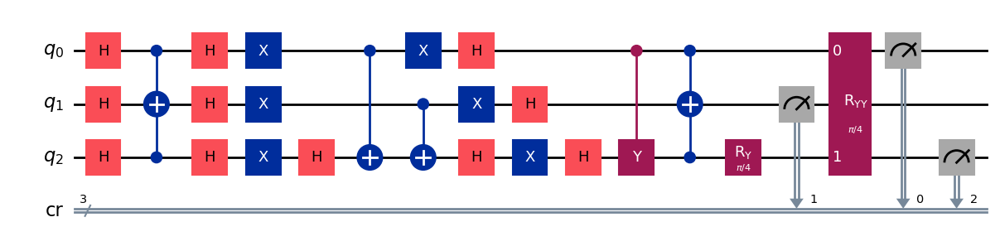

gen = 0 , Best fitness = (0.8339000000000001,)
gen = 1 , Best fitness = (0.8315,) , Number of invalids = 0

[Run 4 | Gen 63/99] Best Fitness: 0.8315 | Fidelity: 0.8453 | Gates: 34


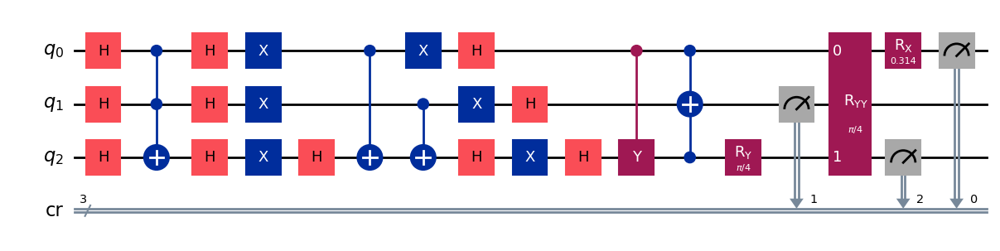

gen = 0 , Best fitness = (0.8315,)
gen = 1 , Best fitness = (0.8315,) , Number of invalids = 0

[Run 4 | Gen 64/99] Best Fitness: 0.8315 | Fidelity: 0.8348 | Gates: 34


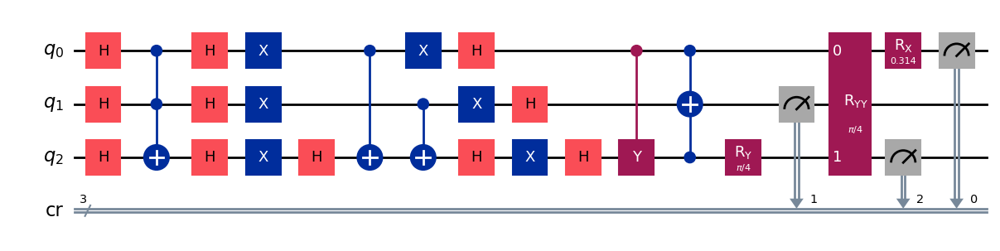

gen = 0 , Best fitness = (0.8315,)
gen = 1 , Best fitness = (0.8315,) , Number of invalids = 0

[Run 4 | Gen 65/99] Best Fitness: 0.8315 | Fidelity: 0.8323 | Gates: 34


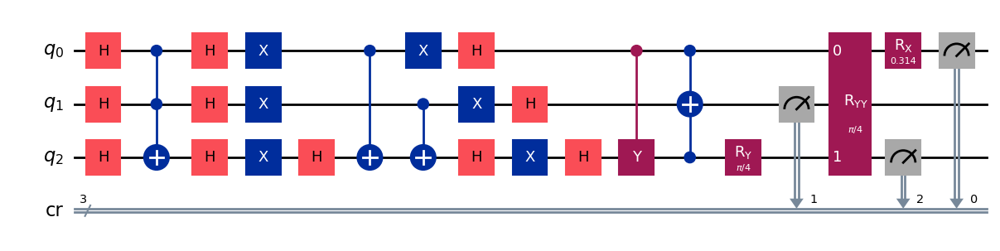

gen = 0 , Best fitness = (0.8315,)
gen = 1 , Best fitness = (0.8315,) , Number of invalids = 0

[Run 4 | Gen 66/99] Best Fitness: 0.8315 | Fidelity: 0.8445 | Gates: 34


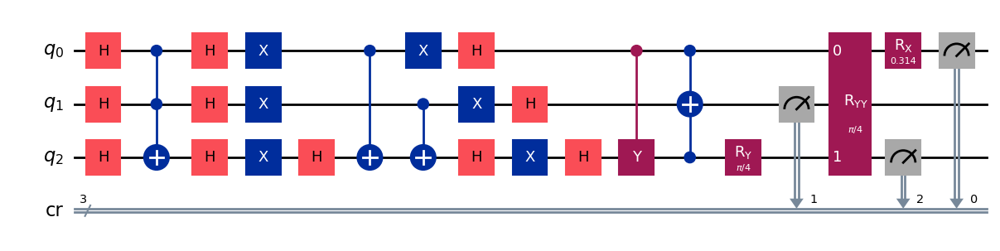

gen = 0 , Best fitness = (0.8315,)
gen = 1 , Best fitness = (0.7957000000000001,) , Number of invalids = 0

[Run 4 | Gen 67/99] Best Fitness: 0.7957 | Fidelity: 0.9115 | Gates: 35


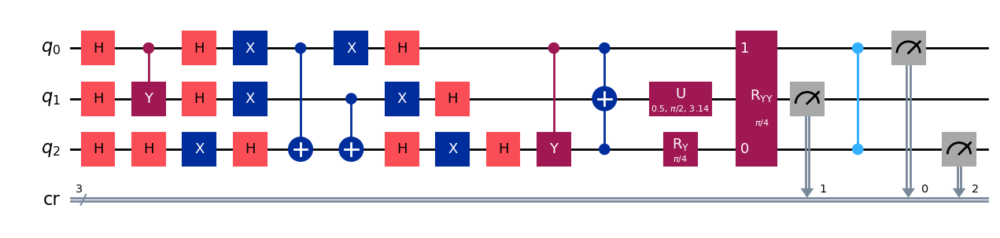

gen = 0 , Best fitness = (0.7957000000000001,)
gen = 1 , Best fitness = (0.7957000000000001,) , Number of invalids = 0

[Run 4 | Gen 68/99] Best Fitness: 0.7957 | Fidelity: 0.9047 | Gates: 35


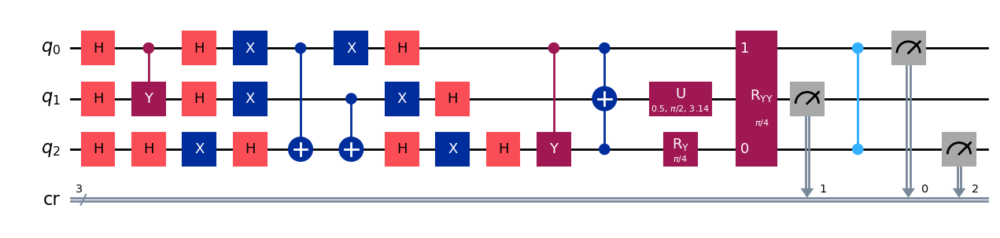

gen = 0 , Best fitness = (0.7957000000000001,)
gen = 1 , Best fitness = (0.7919,) , Number of invalids = 0

[Run 4 | Gen 69/99] Best Fitness: 0.7919 | Fidelity: 0.9019 | Gates: 35


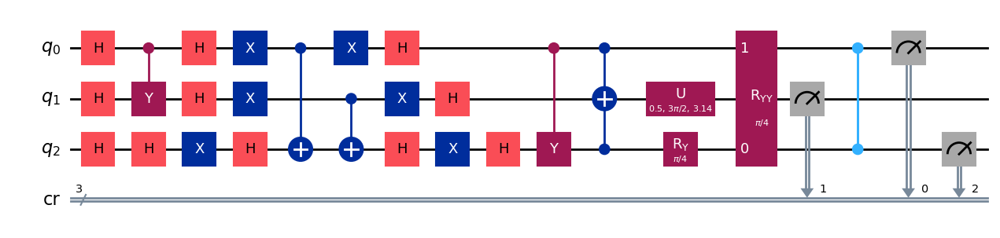

gen = 0 , Best fitness = (0.7919,)
gen = 1 , Best fitness = (0.7726000000000001,) , Number of invalids = 0

[Run 4 | Gen 70/99] Best Fitness: 0.7726 | Fidelity: 0.9045 | Gates: 34


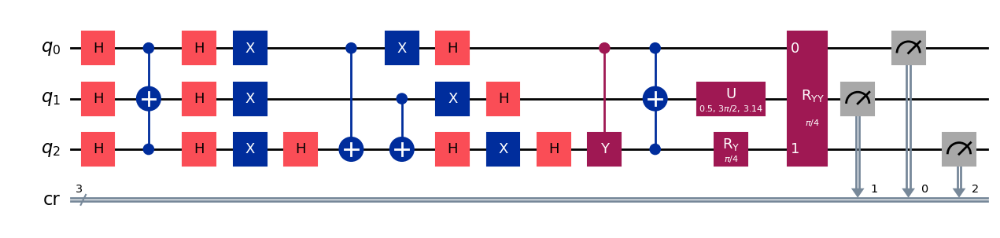

gen = 0 , Best fitness = (0.7726000000000001,)
gen = 1 , Best fitness = (0.7726000000000001,) , Number of invalids = 0

[Run 4 | Gen 71/99] Best Fitness: 0.7726 | Fidelity: 0.9070 | Gates: 34


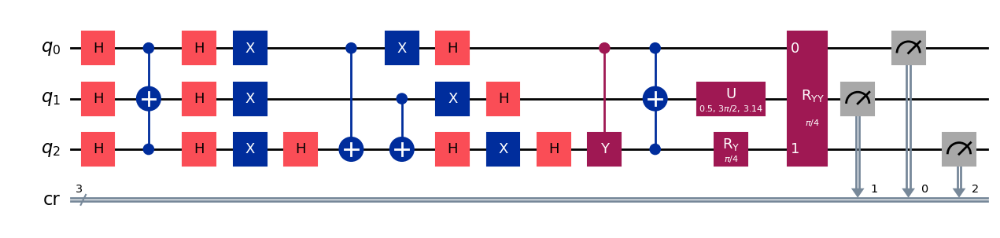

gen = 0 , Best fitness = (0.7726000000000001,)
gen = 1 , Best fitness = (0.7726000000000001,) , Number of invalids = 0

[Run 4 | Gen 72/99] Best Fitness: 0.7726 | Fidelity: 0.9064 | Gates: 34


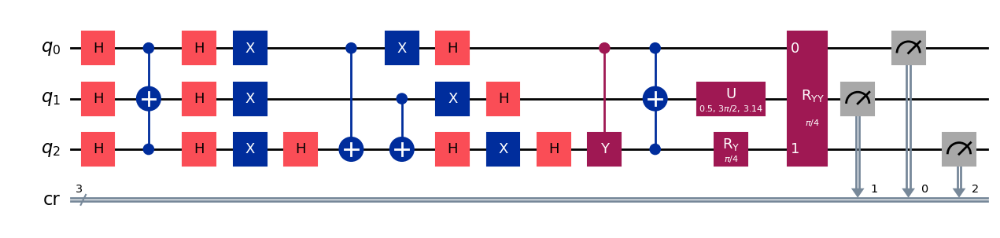

gen = 0 , Best fitness = (0.7726000000000001,)
gen = 1 , Best fitness = (0.7726000000000001,) , Number of invalids = 0

[Run 4 | Gen 73/99] Best Fitness: 0.7726 | Fidelity: 0.9014 | Gates: 34


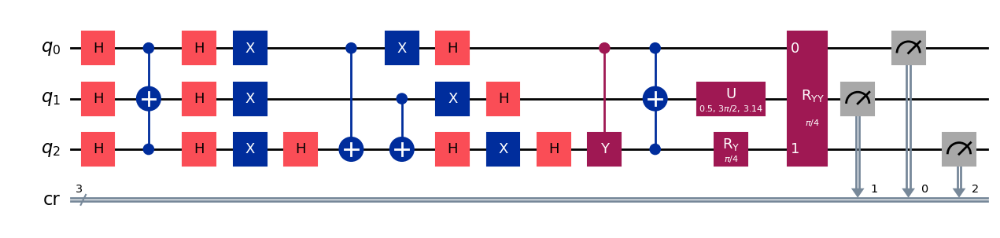

gen = 0 , Best fitness = (0.7726000000000001,)
gen = 1 , Best fitness = (0.7701,) , Number of invalids = 0

[Run 4 | Gen 74/99] Best Fitness: 0.7701 | Fidelity: 0.9054 | Gates: 34


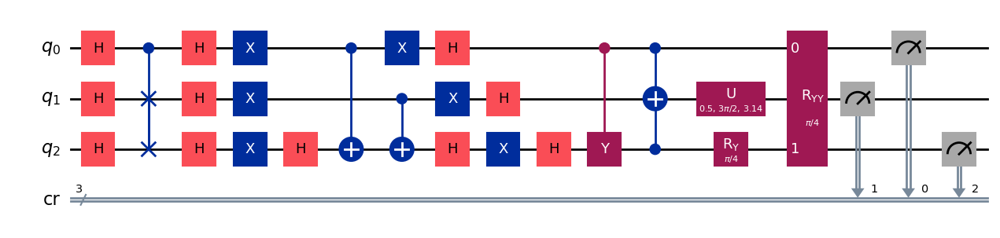

gen = 0 , Best fitness = (0.7701,)
gen = 1 , Best fitness = (0.7697,) , Number of invalids = 0

[Run 4 | Gen 75/99] Best Fitness: 0.7697 | Fidelity: 0.9066 | Gates: 34


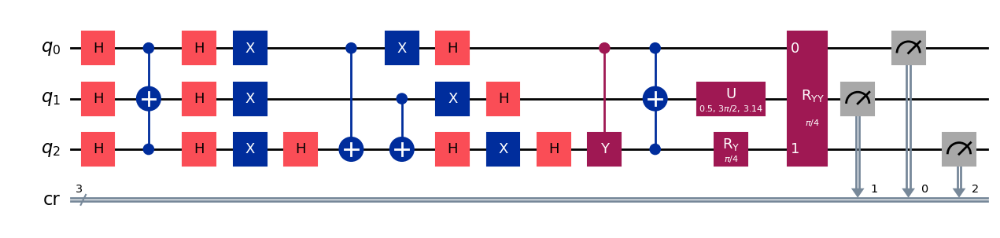

gen = 0 , Best fitness = (0.7697,)
gen = 1 , Best fitness = (0.7697,) , Number of invalids = 0

[Run 4 | Gen 76/99] Best Fitness: 0.7697 | Fidelity: 0.9115 | Gates: 34


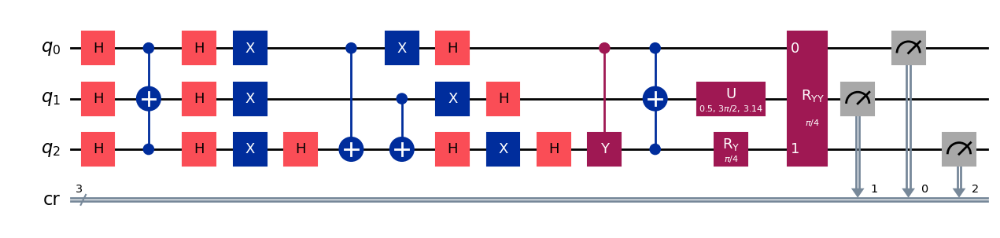

gen = 0 , Best fitness = (0.7697,)
gen = 1 , Best fitness = (0.7697,) , Number of invalids = 0

[Run 4 | Gen 77/99] Best Fitness: 0.7697 | Fidelity: 0.9075 | Gates: 34


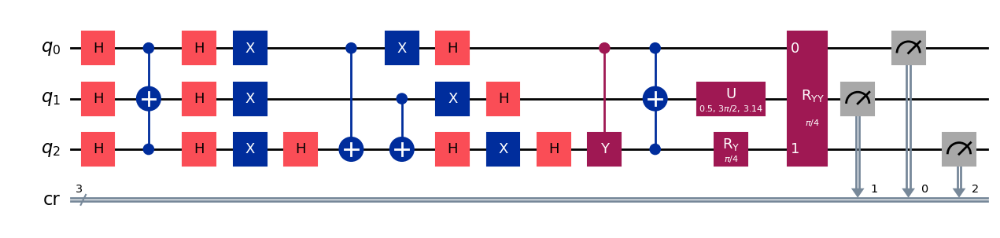

gen = 0 , Best fitness = (0.7697,)
gen = 1 , Best fitness = (0.7697,) , Number of invalids = 0

[Run 4 | Gen 78/99] Best Fitness: 0.7697 | Fidelity: 0.9097 | Gates: 34


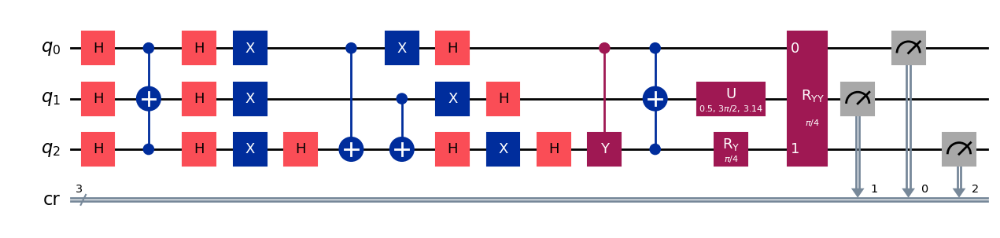

gen = 0 , Best fitness = (0.7697,)
gen = 1 , Best fitness = (0.7697,) , Number of invalids = 0

[Run 4 | Gen 79/99] Best Fitness: 0.7697 | Fidelity: 0.9120 | Gates: 34


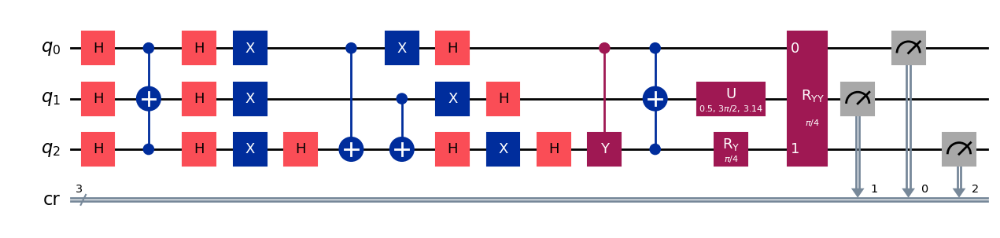

gen = 0 , Best fitness = (0.7697,)
gen = 1 , Best fitness = (0.7697,) , Number of invalids = 0

[Run 4 | Gen 80/99] Best Fitness: 0.7697 | Fidelity: 0.9118 | Gates: 34


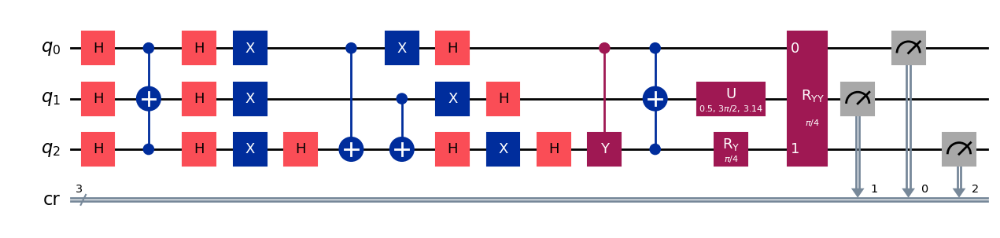

gen = 0 , Best fitness = (0.7697,)
gen = 1 , Best fitness = (0.767,) , Number of invalids = 0

[Run 4 | Gen 81/99] Best Fitness: 0.7670 | Fidelity: 0.9066 | Gates: 34


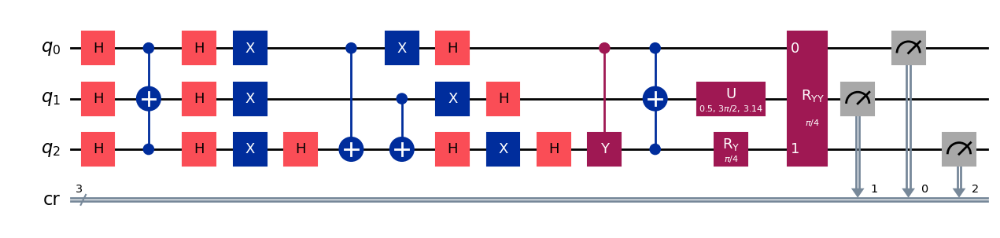

gen = 0 , Best fitness = (0.767,)
gen = 1 , Best fitness = (0.767,) , Number of invalids = 0

[Run 4 | Gen 82/99] Best Fitness: 0.7670 | Fidelity: 0.9055 | Gates: 34


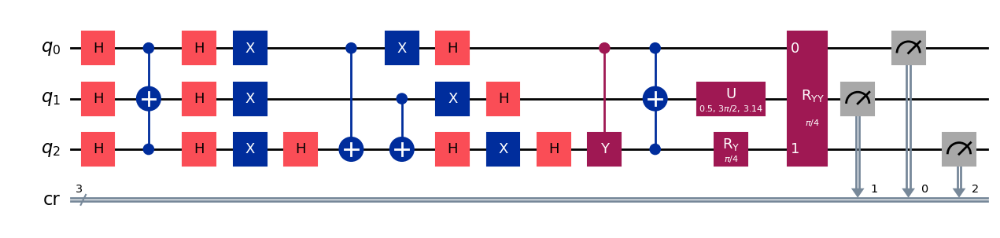

gen = 0 , Best fitness = (0.767,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 83/99] Best Fitness: 0.7669 | Fidelity: 0.9088 | Gates: 34


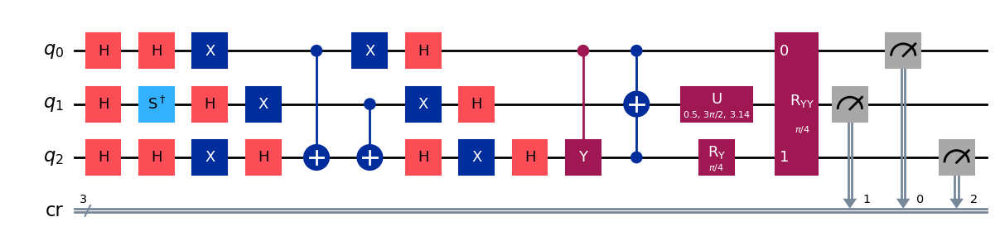

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 84/99] Best Fitness: 0.7669 | Fidelity: 0.9023 | Gates: 34


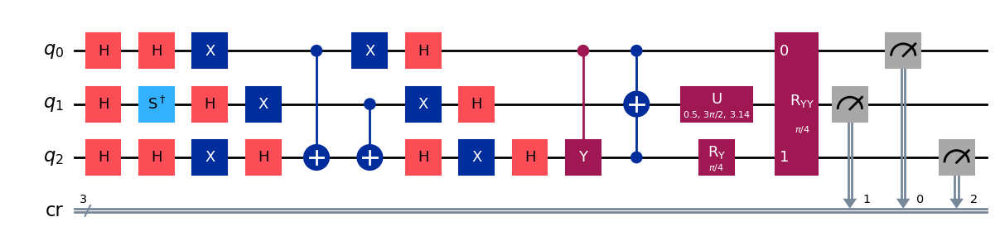

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 85/99] Best Fitness: 0.7669 | Fidelity: 0.8992 | Gates: 34


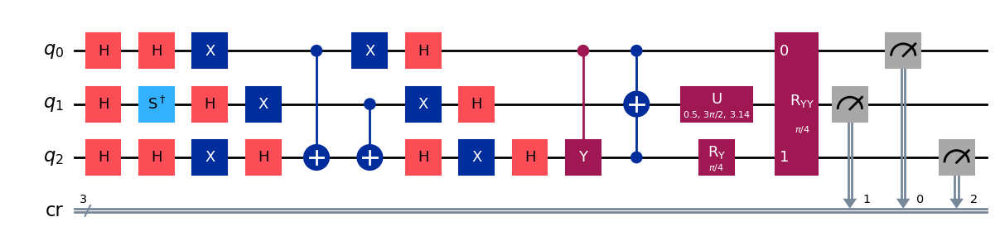

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 86/99] Best Fitness: 0.7669 | Fidelity: 0.9051 | Gates: 34


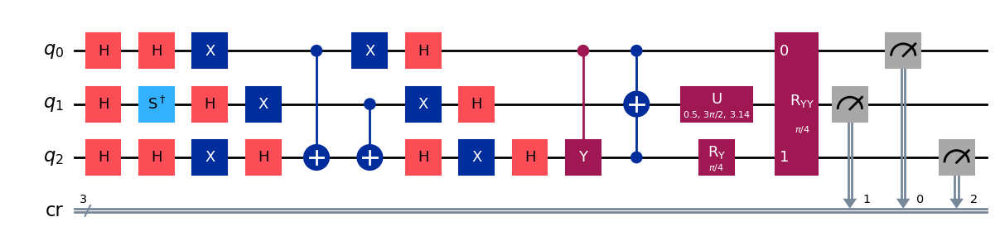

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 87/99] Best Fitness: 0.7669 | Fidelity: 0.9016 | Gates: 34


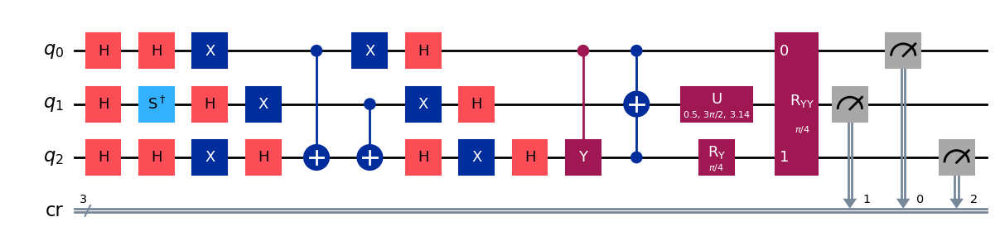

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 88/99] Best Fitness: 0.7669 | Fidelity: 0.9059 | Gates: 34


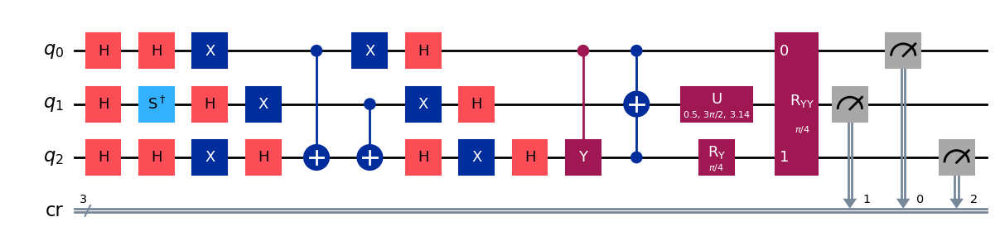

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 89/99] Best Fitness: 0.7669 | Fidelity: 0.9038 | Gates: 34


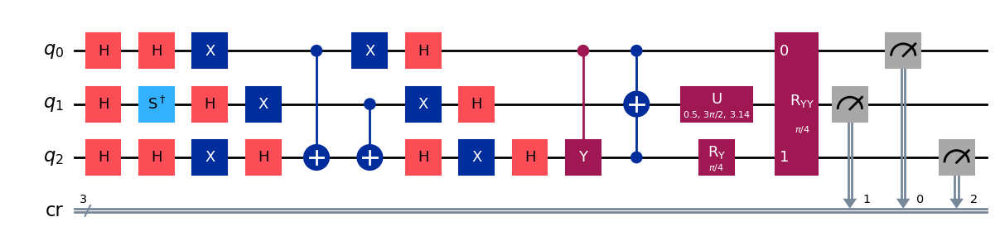

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 90/99] Best Fitness: 0.7669 | Fidelity: 0.8971 | Gates: 34


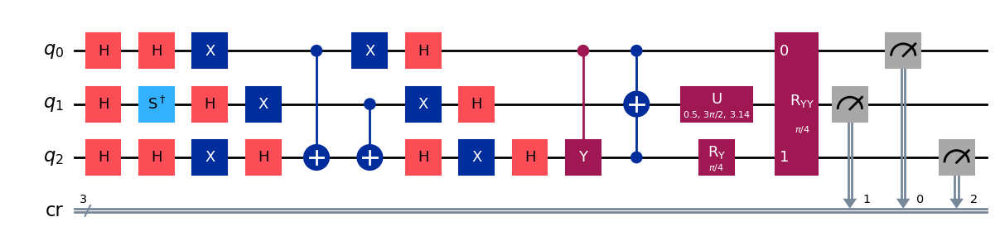

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 91/99] Best Fitness: 0.7669 | Fidelity: 0.9085 | Gates: 34


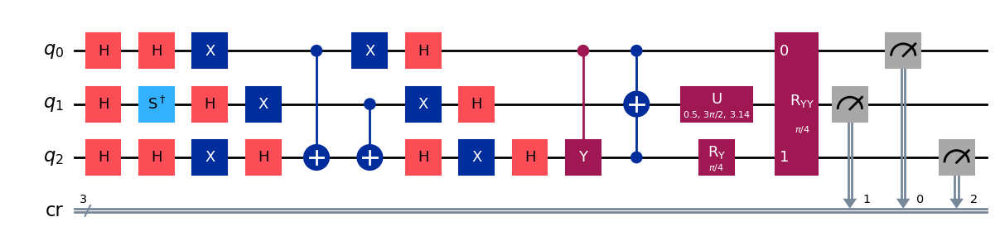

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 92/99] Best Fitness: 0.7669 | Fidelity: 0.9050 | Gates: 34


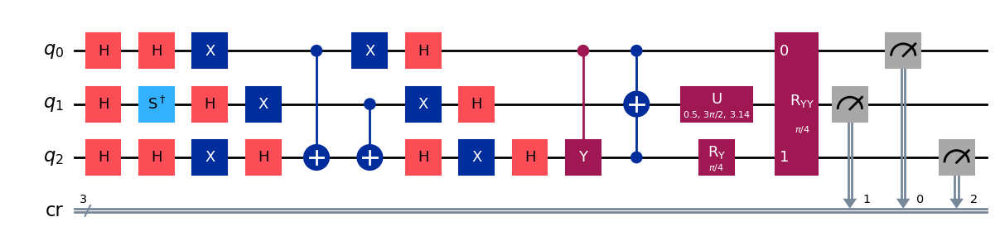

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 93/99] Best Fitness: 0.7669 | Fidelity: 0.9079 | Gates: 34


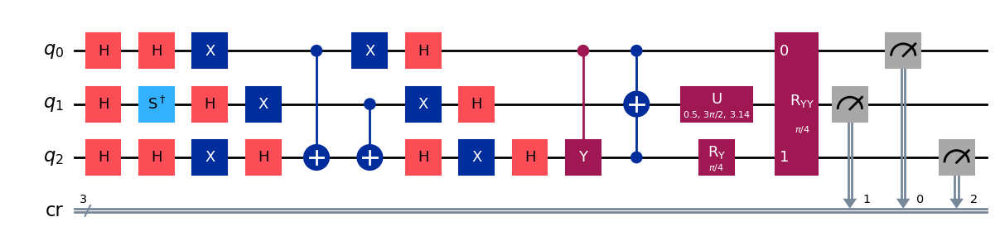

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 94/99] Best Fitness: 0.7669 | Fidelity: 0.9050 | Gates: 34


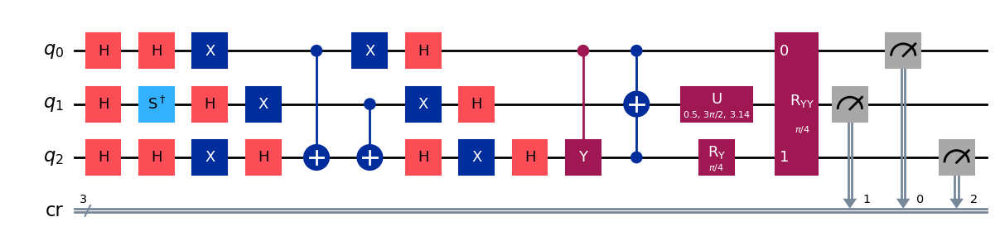

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 95/99] Best Fitness: 0.7669 | Fidelity: 0.9084 | Gates: 34


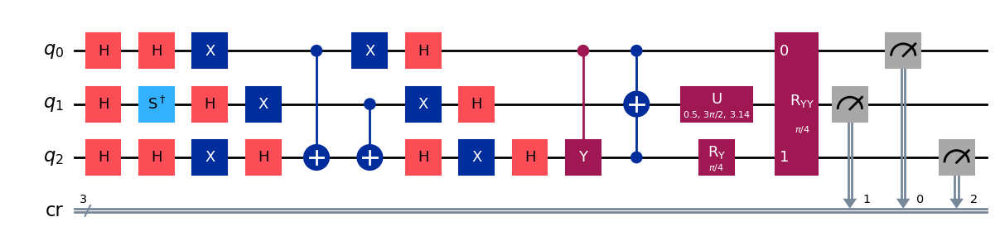

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 96/99] Best Fitness: 0.7669 | Fidelity: 0.9070 | Gates: 34


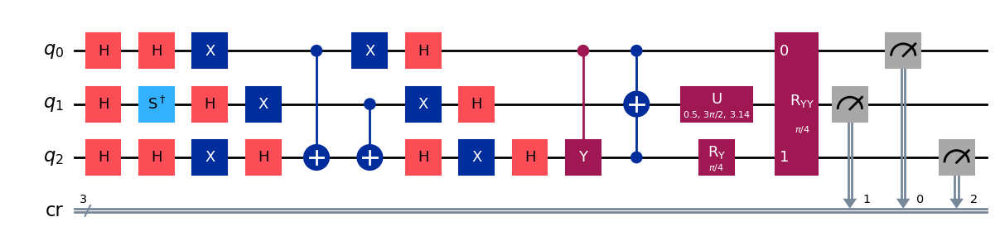

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7669,) , Number of invalids = 0

[Run 4 | Gen 97/99] Best Fitness: 0.7669 | Fidelity: 0.9059 | Gates: 34


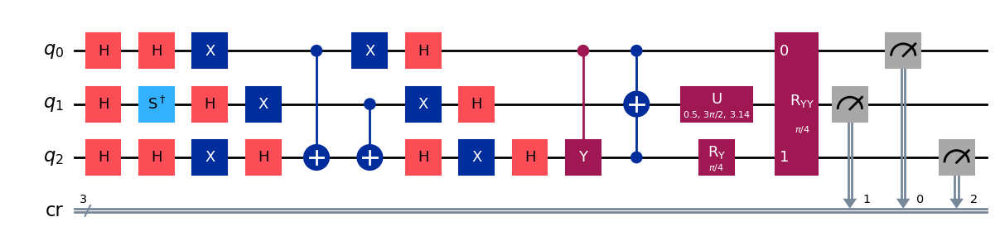

gen = 0 , Best fitness = (0.7669,)
gen = 1 , Best fitness = (0.7664000000000001,) , Number of invalids = 0

[Run 4 | Gen 98/99] Best Fitness: 0.7664 | Fidelity: 0.9098 | Gates: 34


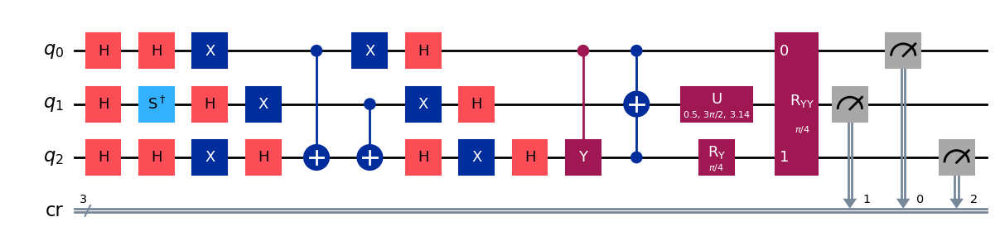

gen = 0 , Best fitness = (0.7664000000000001,)
gen = 1 , Best fitness = (0.7656000000000001,) , Number of invalids = 0

[Run 4 | Gen 99/99] Best Fitness: 0.7656 | Fidelity: 0.9061 | Gates: 34


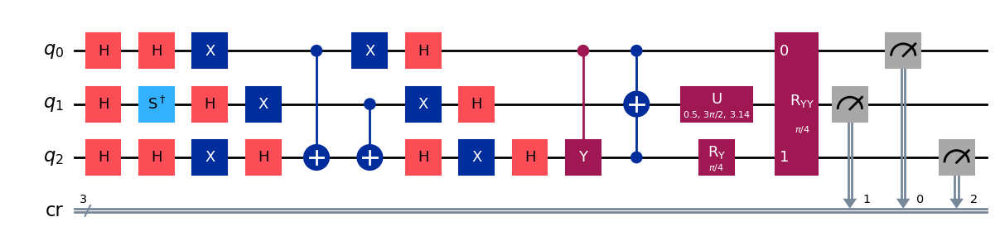


Generating evolution plots for Run 4...
✓ Plot saved to: experiments_state_100/run_4_seed_81245/evolution_metrics_run_4.png


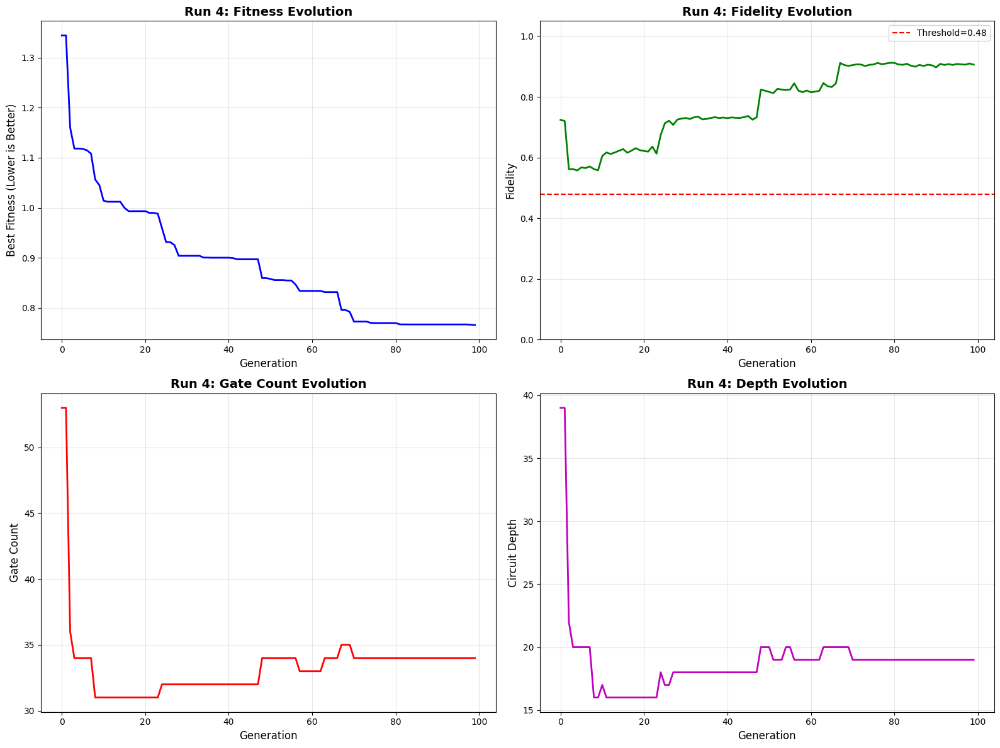


✓ Run 4 COMPLETE | Fidelity: 0.9036 | Gates: 34 | Depth: 19


RUN 5/5 | Target: 100 | Seed: 30112
✓ Logging to: experiments_state_100/run_5_seed_30112
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.1357,)
gen = 1 , Best fitness = (1.1357,) , Number of invalids = 153

[Run 5 | Gen 0/99] Best Fitness: 1.1357 | Fidelity: 0.5622 | Gates: 35


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


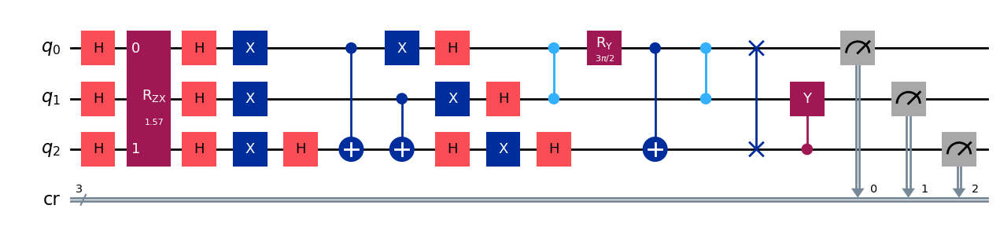

gen = 0 , Best fitness = (1.1357,)
gen = 1 , Best fitness = (1.1035,) , Number of invalids = 95

[Run 5 | Gen 1/99] Best Fitness: 1.1035 | Fidelity: 0.5685 | Gates: 33


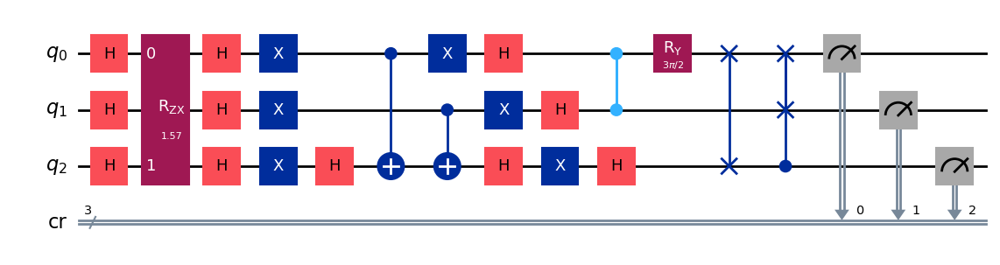

gen = 0 , Best fitness = (1.1035,)
gen = 1 , Best fitness = (1.1035,) , Number of invalids = 58

[Run 5 | Gen 2/99] Best Fitness: 1.1035 | Fidelity: 0.5572 | Gates: 33


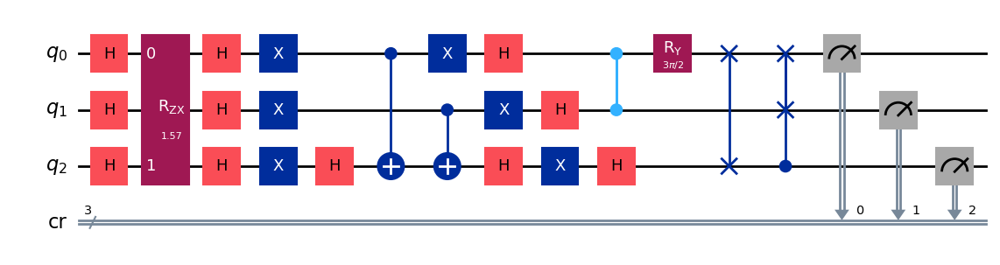

gen = 0 , Best fitness = (1.1035,)
gen = 1 , Best fitness = (1.1035,) , Number of invalids = 65

[Run 5 | Gen 3/99] Best Fitness: 1.1035 | Fidelity: 0.5618 | Gates: 33


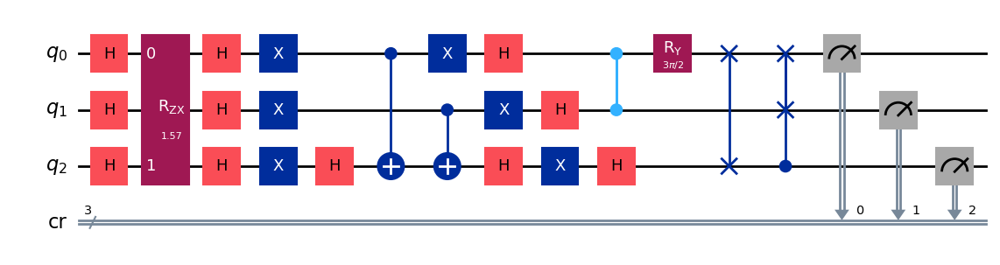

gen = 0 , Best fitness = (1.1035,)
gen = 1 , Best fitness = (1.0955,) , Number of invalids = 62

[Run 5 | Gen 4/99] Best Fitness: 1.0955 | Fidelity: 0.5615 | Gates: 33


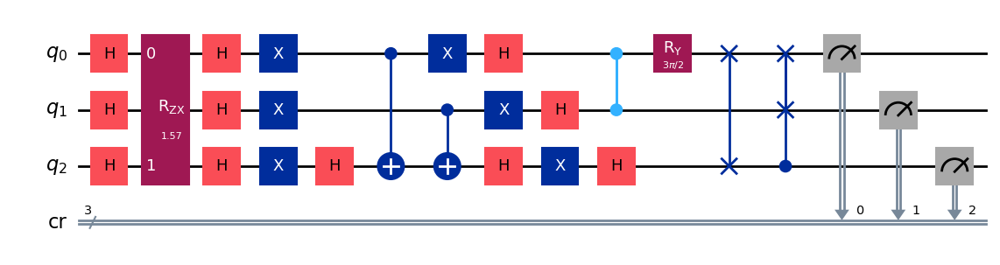

gen = 0 , Best fitness = (1.0955,)
gen = 1 , Best fitness = (1.0943,) , Number of invalids = 56

[Run 5 | Gen 5/99] Best Fitness: 1.0943 | Fidelity: 0.5683 | Gates: 33


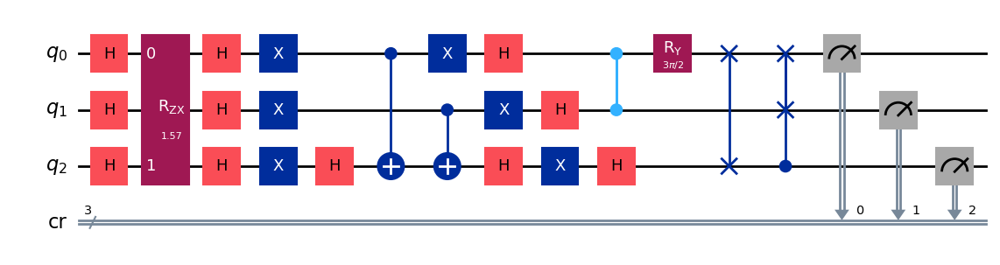

gen = 0 , Best fitness = (1.0943,)
gen = 1 , Best fitness = (1.0655999999999999,) , Number of invalids = 61

[Run 5 | Gen 6/99] Best Fitness: 1.0656 | Fidelity: 0.5656 | Gates: 32


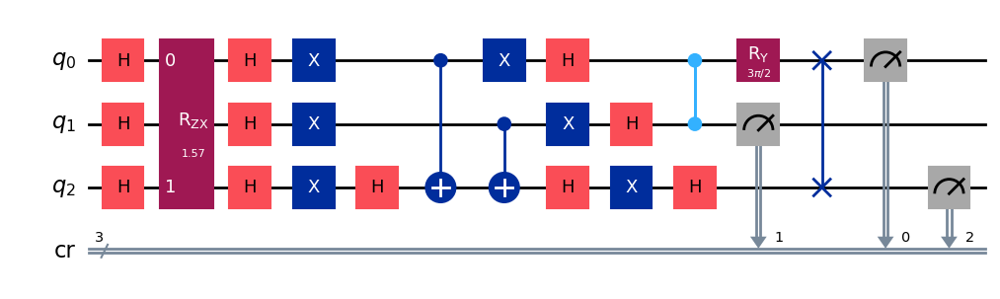

gen = 0 , Best fitness = (1.0655999999999999,)
gen = 1 , Best fitness = (1.0655999999999999,) , Number of invalids = 31

[Run 5 | Gen 7/99] Best Fitness: 1.0656 | Fidelity: 0.5692 | Gates: 32


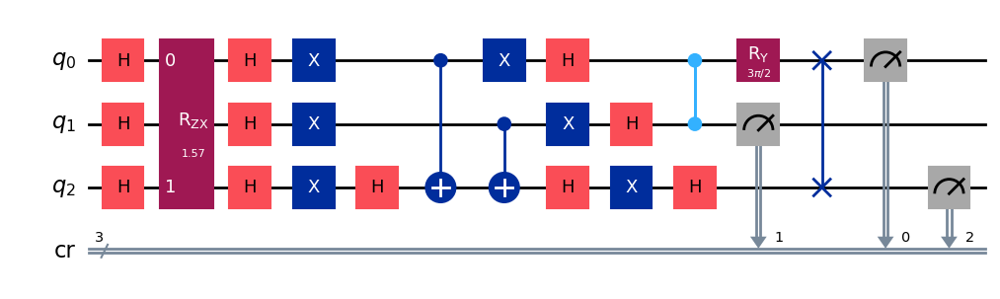

gen = 0 , Best fitness = (1.0655999999999999,)
gen = 1 , Best fitness = (1.0655999999999999,) , Number of invalids = 42

[Run 5 | Gen 8/99] Best Fitness: 1.0656 | Fidelity: 0.5711 | Gates: 32


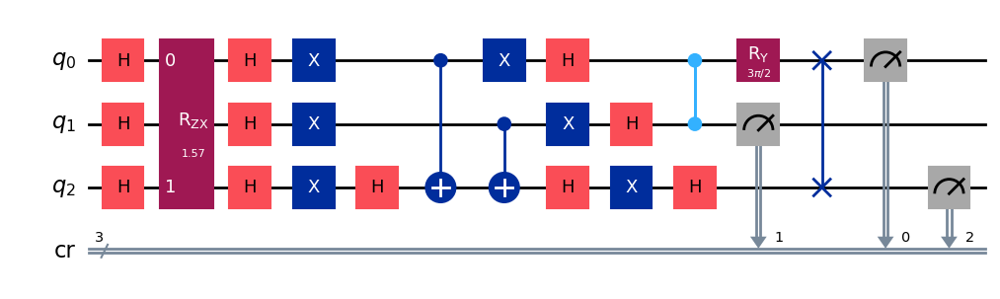

gen = 0 , Best fitness = (1.0655999999999999,)
gen = 1 , Best fitness = (1.0655999999999999,) , Number of invalids = 39

[Run 5 | Gen 9/99] Best Fitness: 1.0656 | Fidelity: 0.5653 | Gates: 32


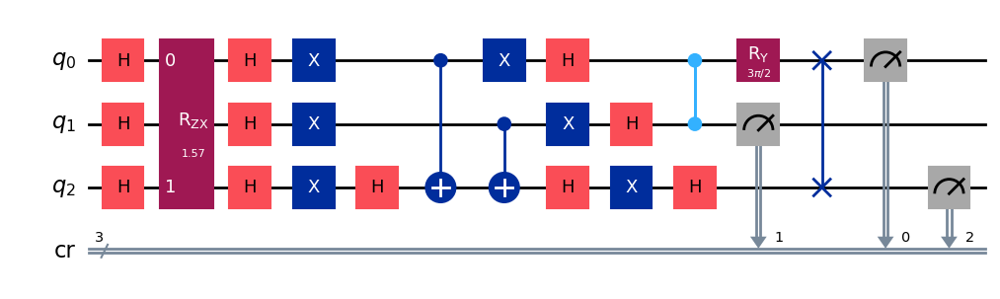

gen = 0 , Best fitness = (1.0655999999999999,)
gen = 1 , Best fitness = (1.0655999999999999,) , Number of invalids = 37

[Run 5 | Gen 10/99] Best Fitness: 1.0656 | Fidelity: 0.5526 | Gates: 32


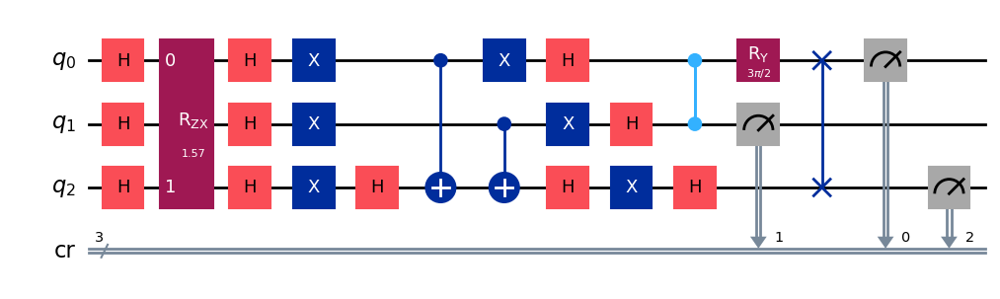

gen = 0 , Best fitness = (1.0655999999999999,)
gen = 1 , Best fitness = (1.0655999999999999,) , Number of invalids = 24

[Run 5 | Gen 11/99] Best Fitness: 1.0656 | Fidelity: 0.5672 | Gates: 32


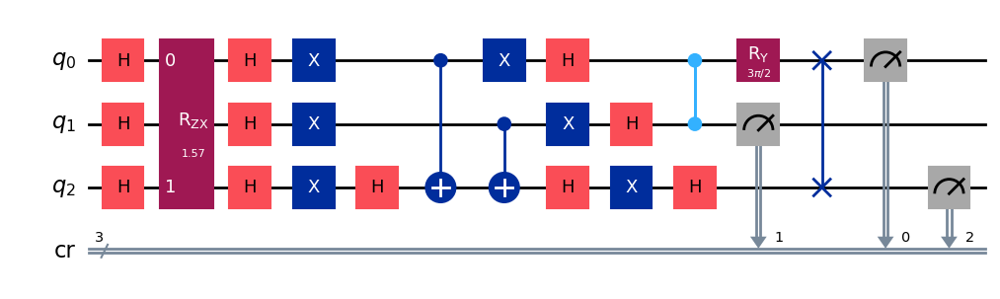

gen = 0 , Best fitness = (1.0655999999999999,)
gen = 1 , Best fitness = (1.0623,) , Number of invalids = 20

[Run 5 | Gen 12/99] Best Fitness: 1.0623 | Fidelity: 0.6282 | Gates: 34


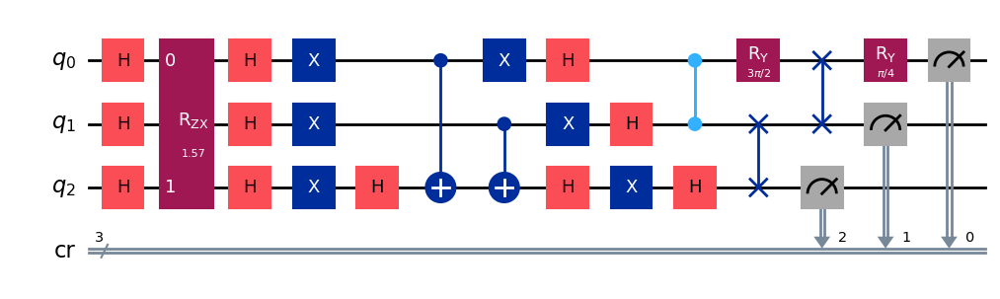

gen = 0 , Best fitness = (1.0623,)
gen = 1 , Best fitness = (1.0489000000000002,) , Number of invalids = 20

[Run 5 | Gen 13/99] Best Fitness: 1.0489 | Fidelity: 0.6056 | Gates: 33


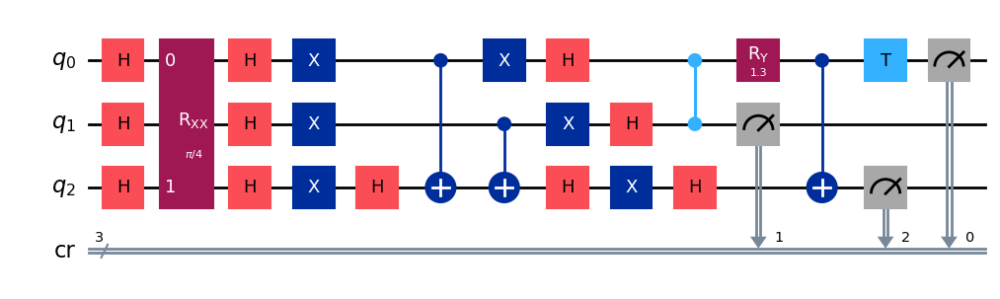

gen = 0 , Best fitness = (1.0489000000000002,)
gen = 1 , Best fitness = (1.0343,) , Number of invalids = 25

[Run 5 | Gen 14/99] Best Fitness: 1.0343 | Fidelity: 0.6212 | Gates: 33


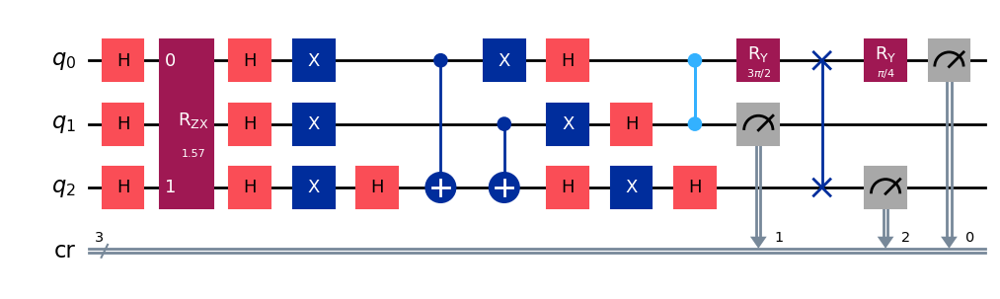

gen = 0 , Best fitness = (1.0343,)
gen = 1 , Best fitness = (1.0326,) , Number of invalids = 19

[Run 5 | Gen 15/99] Best Fitness: 1.0326 | Fidelity: 0.6186 | Gates: 33


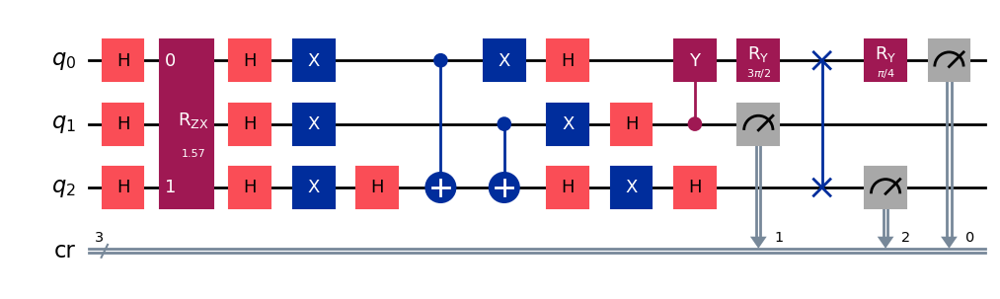

gen = 0 , Best fitness = (1.0326,)
gen = 1 , Best fitness = (1.0312000000000001,) , Number of invalids = 26

[Run 5 | Gen 16/99] Best Fitness: 1.0312 | Fidelity: 0.6201 | Gates: 33


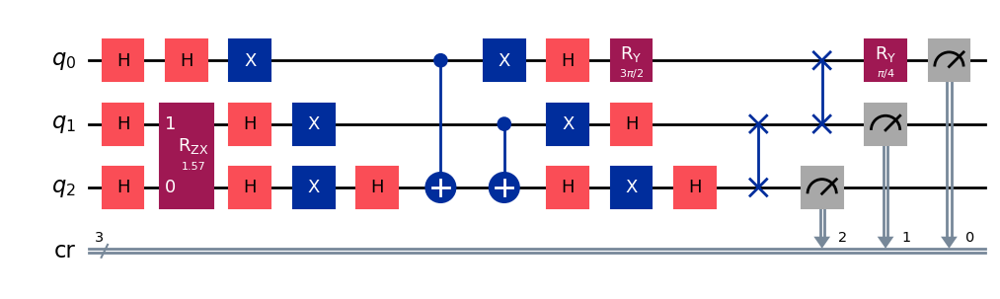

gen = 0 , Best fitness = (1.0312000000000001,)
gen = 1 , Best fitness = (1.0312000000000001,) , Number of invalids = 24

[Run 5 | Gen 17/99] Best Fitness: 1.0312 | Fidelity: 0.6109 | Gates: 33


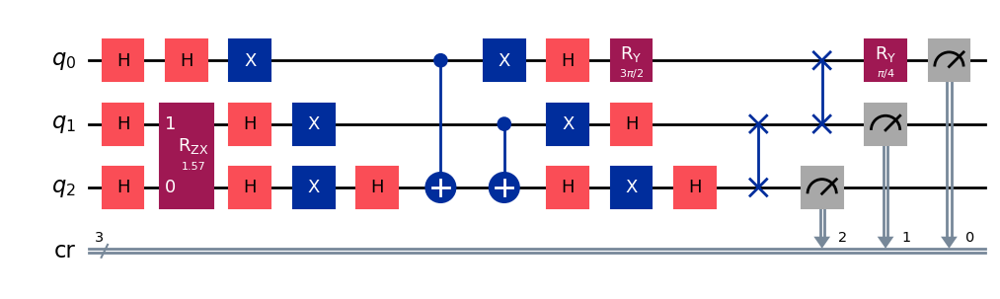

gen = 0 , Best fitness = (1.0312000000000001,)
gen = 1 , Best fitness = (1.0312000000000001,) , Number of invalids = 26

[Run 5 | Gen 18/99] Best Fitness: 1.0312 | Fidelity: 0.6278 | Gates: 33


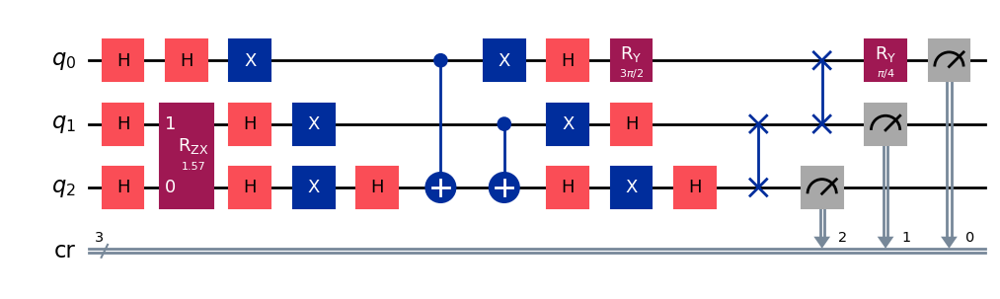

gen = 0 , Best fitness = (1.0312000000000001,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 41

[Run 5 | Gen 19/99] Best Fitness: 0.9394 | Fidelity: 0.7194 | Gates: 34


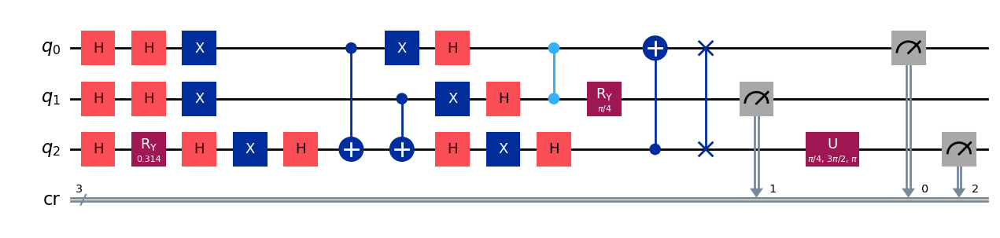

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 25

[Run 5 | Gen 20/99] Best Fitness: 0.9394 | Fidelity: 0.7276 | Gates: 34


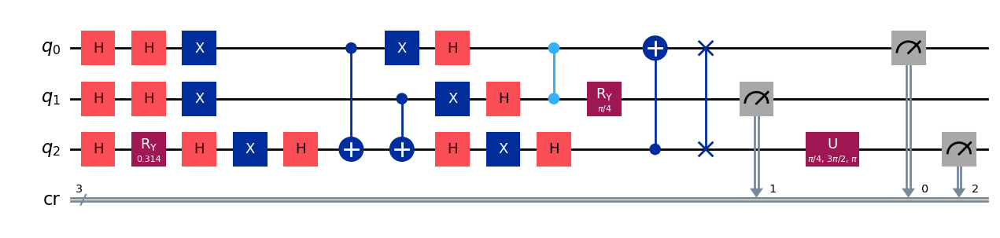

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 16

[Run 5 | Gen 21/99] Best Fitness: 0.9394 | Fidelity: 0.7340 | Gates: 34


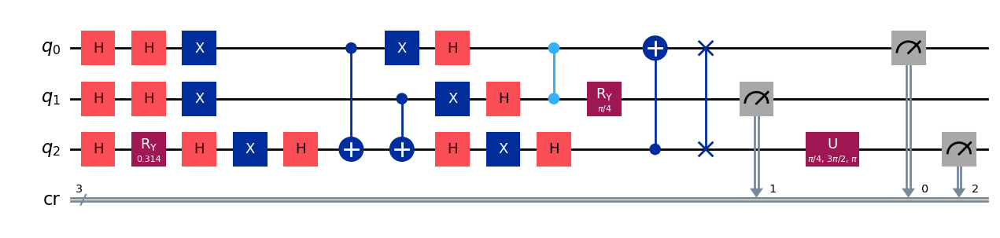

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 18

[Run 5 | Gen 22/99] Best Fitness: 0.9394 | Fidelity: 0.7299 | Gates: 34


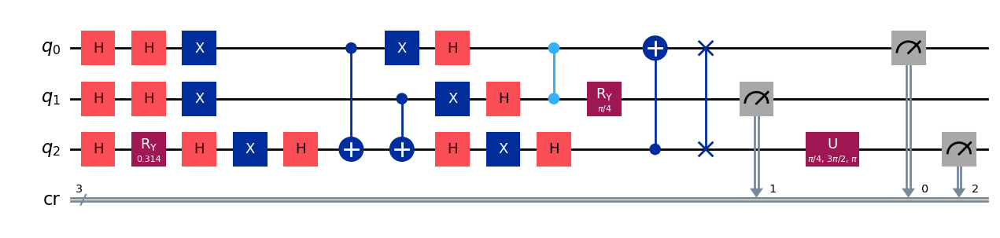

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 13

[Run 5 | Gen 23/99] Best Fitness: 0.9394 | Fidelity: 0.7300 | Gates: 34


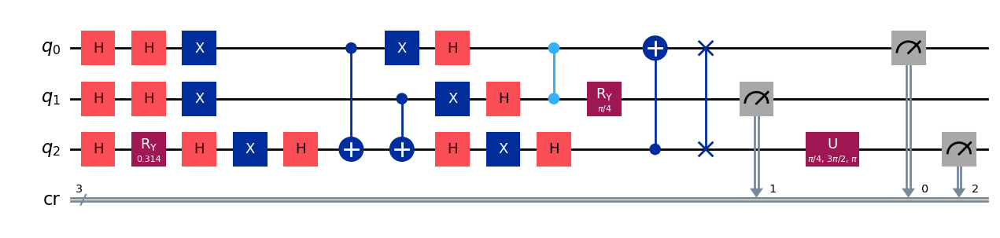

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 12

[Run 5 | Gen 24/99] Best Fitness: 0.9394 | Fidelity: 0.7268 | Gates: 34


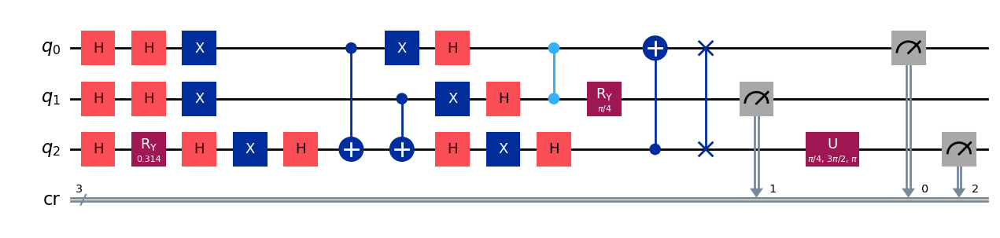

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 16

[Run 5 | Gen 25/99] Best Fitness: 0.9394 | Fidelity: 0.7286 | Gates: 34


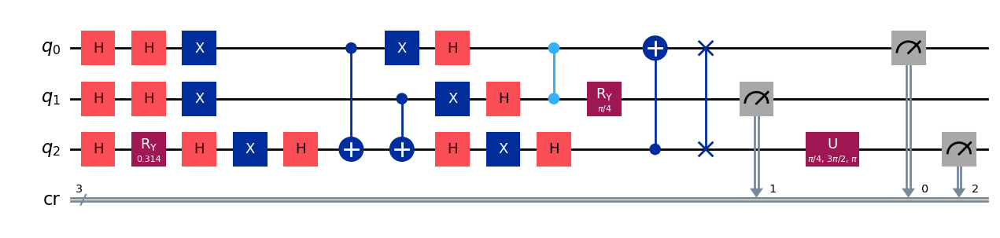

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 19

[Run 5 | Gen 26/99] Best Fitness: 0.9394 | Fidelity: 0.7337 | Gates: 34


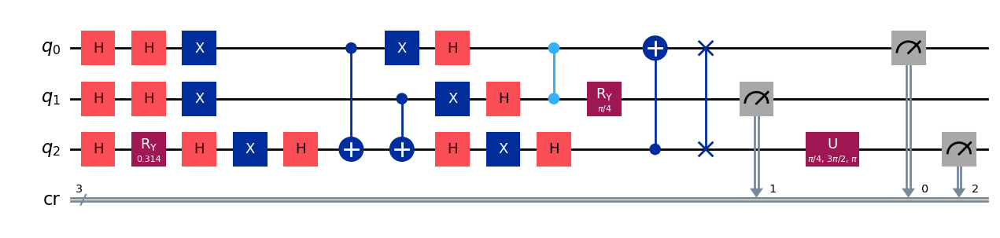

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 13

[Run 5 | Gen 27/99] Best Fitness: 0.9394 | Fidelity: 0.7281 | Gates: 34


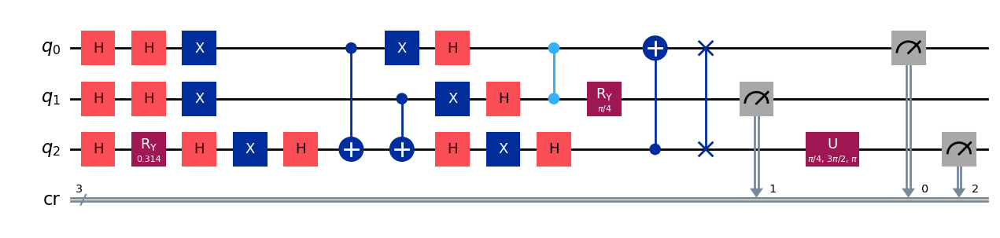

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 18

[Run 5 | Gen 28/99] Best Fitness: 0.9394 | Fidelity: 0.7261 | Gates: 34


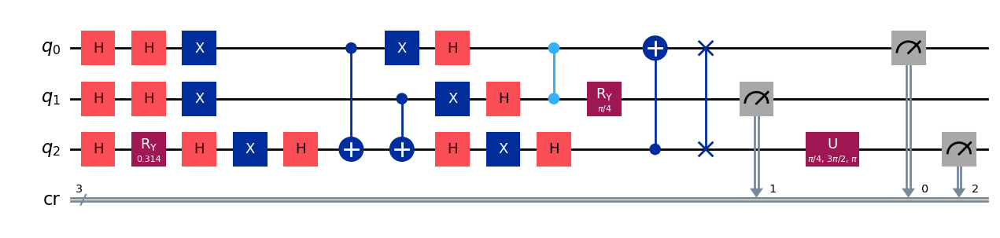

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 10

[Run 5 | Gen 29/99] Best Fitness: 0.9394 | Fidelity: 0.7290 | Gates: 34


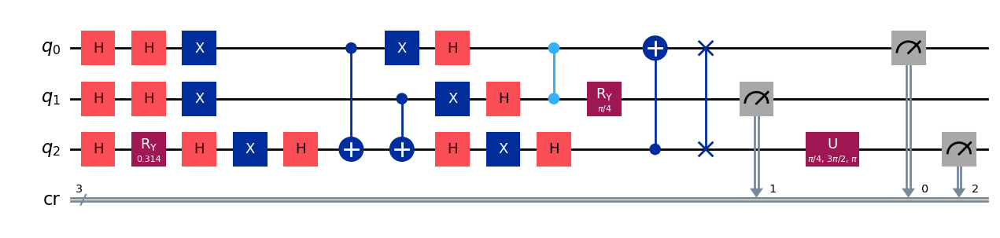

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 11

[Run 5 | Gen 30/99] Best Fitness: 0.9394 | Fidelity: 0.7317 | Gates: 34


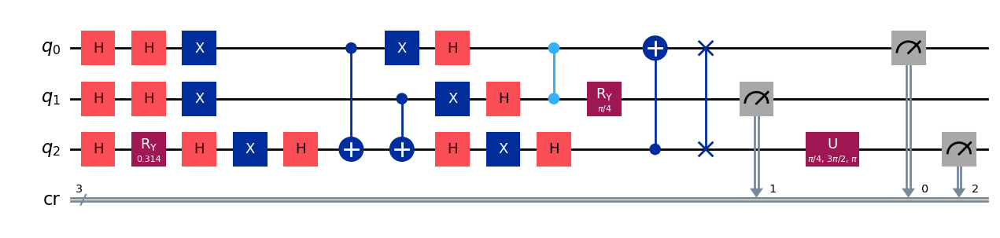

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9394,) , Number of invalids = 3

[Run 5 | Gen 31/99] Best Fitness: 0.9394 | Fidelity: 0.7254 | Gates: 34


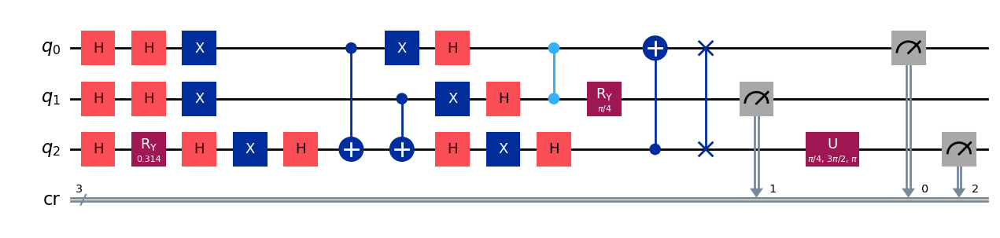

gen = 0 , Best fitness = (0.9394,)
gen = 1 , Best fitness = (0.9231,) , Number of invalids = 7

[Run 5 | Gen 32/99] Best Fitness: 0.9231 | Fidelity: 0.7539 | Gates: 34


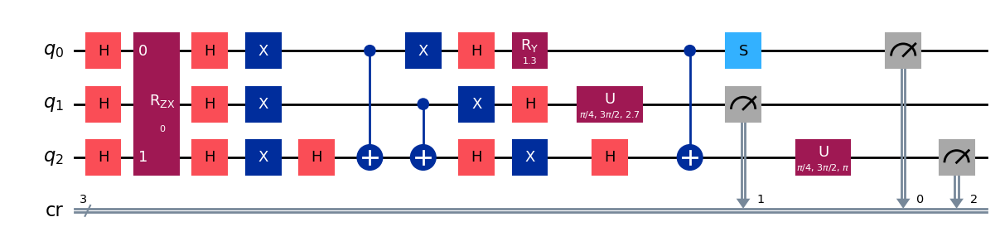

gen = 0 , Best fitness = (0.9231,)
gen = 1 , Best fitness = (0.9079,) , Number of invalids = 10

[Run 5 | Gen 33/99] Best Fitness: 0.9079 | Fidelity: 0.7727 | Gates: 34


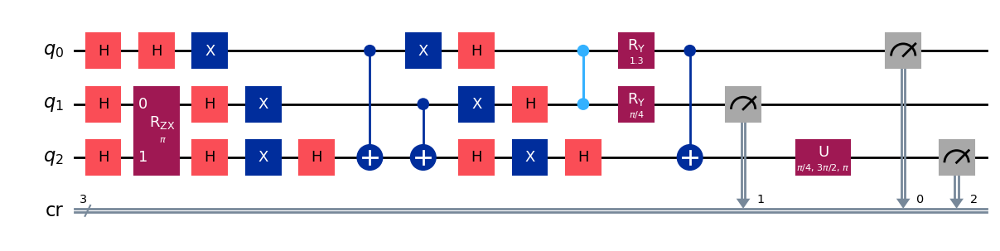

gen = 0 , Best fitness = (0.9079,)
gen = 1 , Best fitness = (0.905,) , Number of invalids = 2

[Run 5 | Gen 34/99] Best Fitness: 0.9050 | Fidelity: 0.7739 | Gates: 34


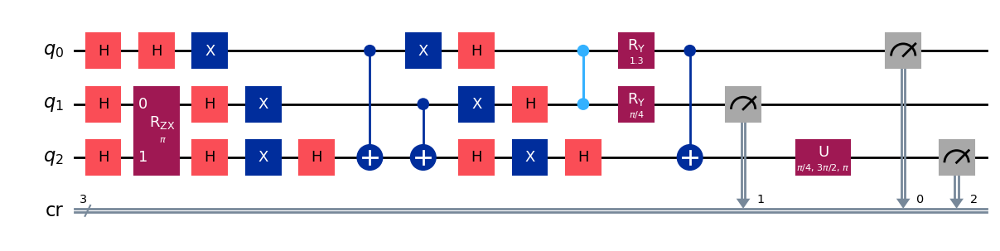

gen = 0 , Best fitness = (0.905,)
gen = 1 , Best fitness = (0.905,) , Number of invalids = 3

[Run 5 | Gen 35/99] Best Fitness: 0.9050 | Fidelity: 0.7751 | Gates: 34


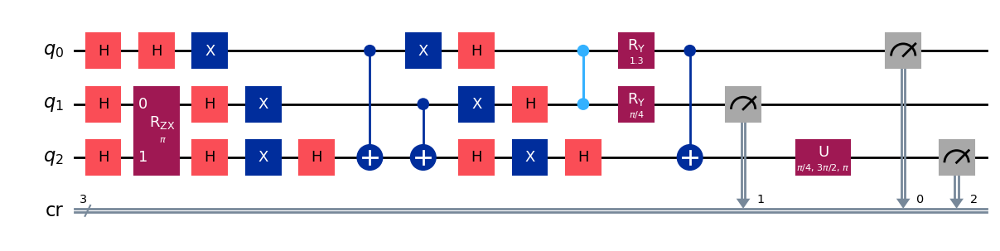

gen = 0 , Best fitness = (0.905,)
gen = 1 , Best fitness = (0.905,) , Number of invalids = 3

[Run 5 | Gen 36/99] Best Fitness: 0.9050 | Fidelity: 0.7681 | Gates: 34


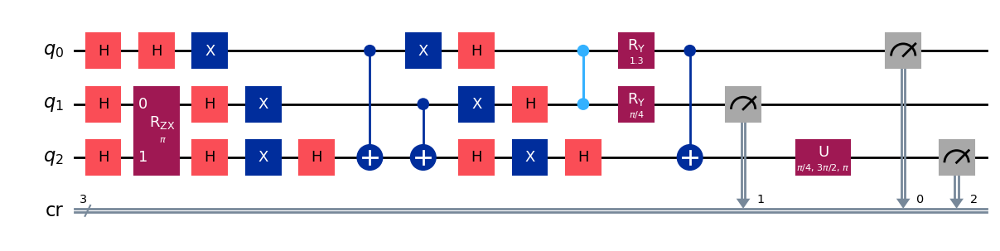

gen = 0 , Best fitness = (0.905,)
gen = 1 , Best fitness = (0.905,) , Number of invalids = 1

[Run 5 | Gen 37/99] Best Fitness: 0.9050 | Fidelity: 0.7736 | Gates: 34


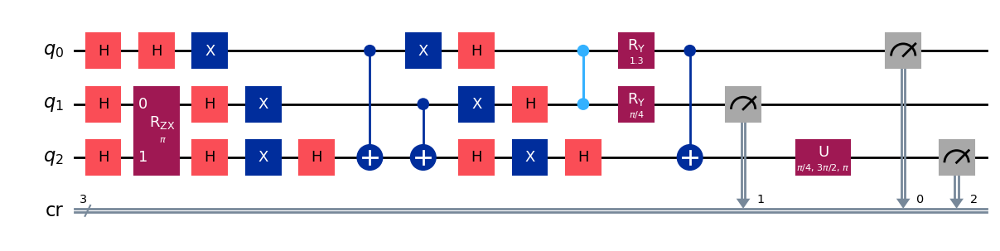

gen = 0 , Best fitness = (0.905,)
gen = 1 , Best fitness = (0.905,) , Number of invalids = 5

[Run 5 | Gen 38/99] Best Fitness: 0.9050 | Fidelity: 0.7672 | Gates: 34


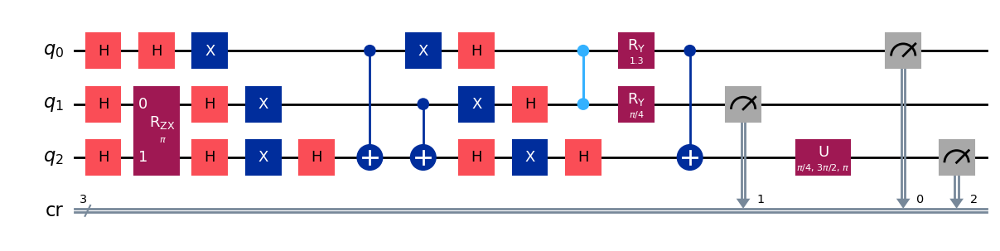

gen = 0 , Best fitness = (0.905,)
gen = 1 , Best fitness = (0.9029,) , Number of invalids = 13

[Run 5 | Gen 39/99] Best Fitness: 0.9029 | Fidelity: 0.7720 | Gates: 34


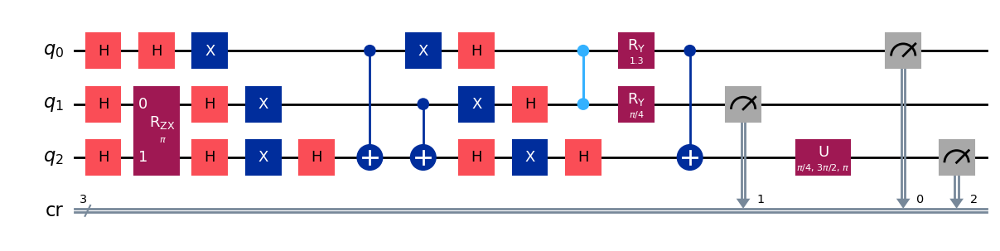

gen = 0 , Best fitness = (0.9029,)
gen = 1 , Best fitness = (0.9029,) , Number of invalids = 8

[Run 5 | Gen 40/99] Best Fitness: 0.9029 | Fidelity: 0.7667 | Gates: 34


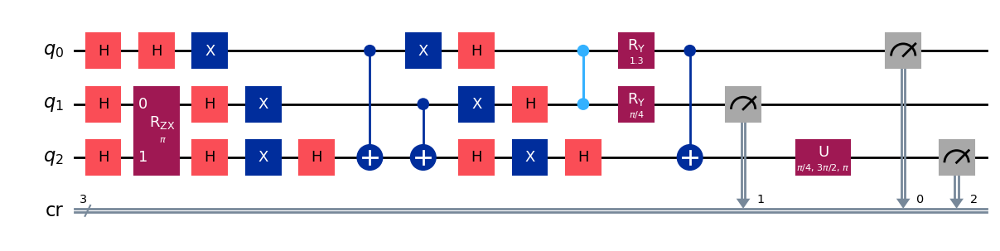

gen = 0 , Best fitness = (0.9029,)
gen = 1 , Best fitness = (0.9029,) , Number of invalids = 6

[Run 5 | Gen 41/99] Best Fitness: 0.9029 | Fidelity: 0.7752 | Gates: 34


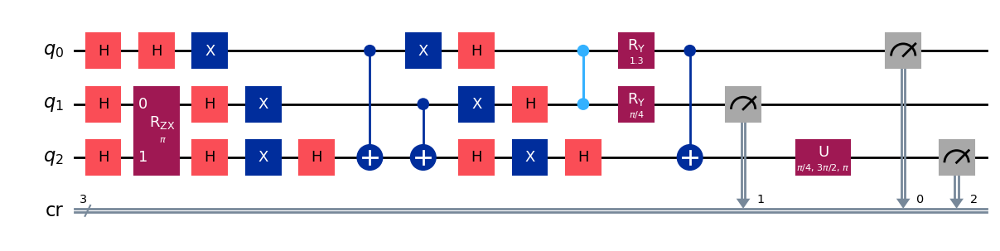

gen = 0 , Best fitness = (0.9029,)
gen = 1 , Best fitness = (0.9029,) , Number of invalids = 11

[Run 5 | Gen 42/99] Best Fitness: 0.9029 | Fidelity: 0.7702 | Gates: 34


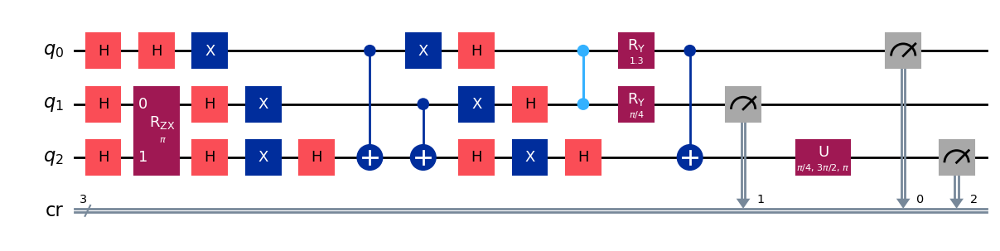

gen = 0 , Best fitness = (0.9029,)
gen = 1 , Best fitness = (0.9029,) , Number of invalids = 7

[Run 5 | Gen 43/99] Best Fitness: 0.9029 | Fidelity: 0.7680 | Gates: 34


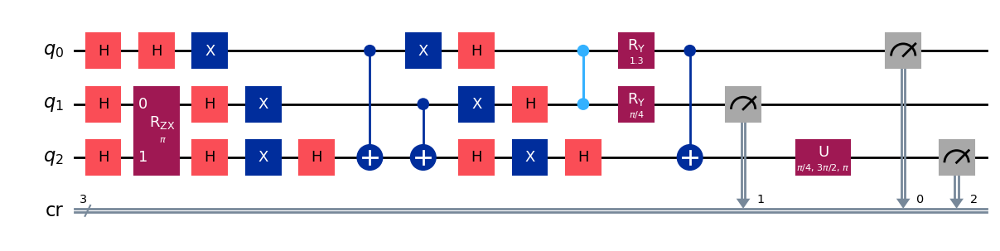

gen = 0 , Best fitness = (0.9029,)
gen = 1 , Best fitness = (0.9029,) , Number of invalids = 13

[Run 5 | Gen 44/99] Best Fitness: 0.9029 | Fidelity: 0.7668 | Gates: 34


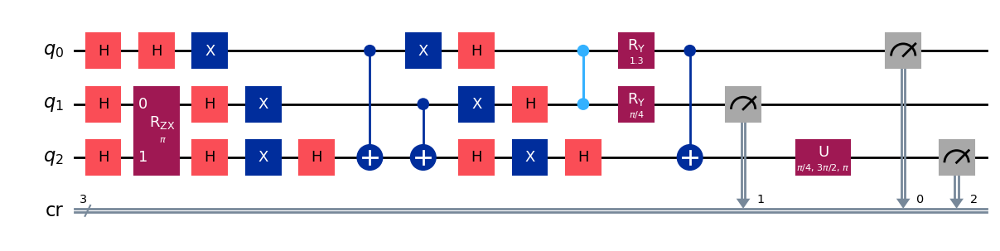

gen = 0 , Best fitness = (0.9029,)
gen = 1 , Best fitness = (0.9029,) , Number of invalids = 11

[Run 5 | Gen 45/99] Best Fitness: 0.9029 | Fidelity: 0.7666 | Gates: 34


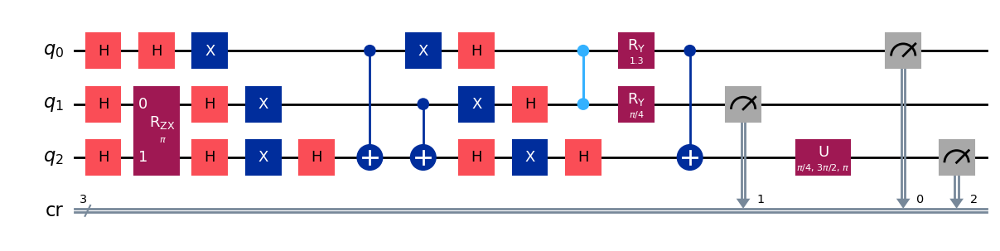

gen = 0 , Best fitness = (0.9029,)
gen = 1 , Best fitness = (0.9027000000000001,) , Number of invalids = 13

[Run 5 | Gen 46/99] Best Fitness: 0.9027 | Fidelity: 0.7748 | Gates: 34


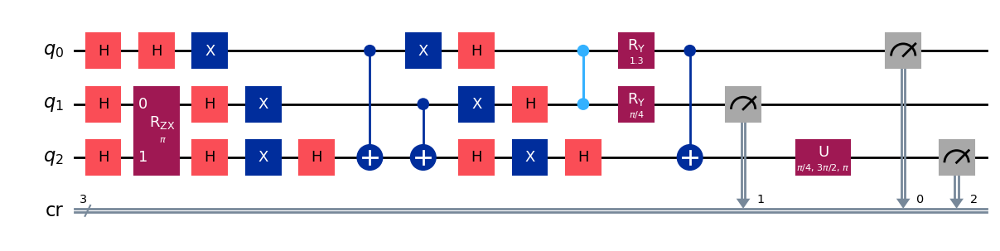

gen = 0 , Best fitness = (0.9027000000000001,)
gen = 1 , Best fitness = (0.8654000000000001,) , Number of invalids = 15

[Run 5 | Gen 47/99] Best Fitness: 0.8654 | Fidelity: 0.8354 | Gates: 35


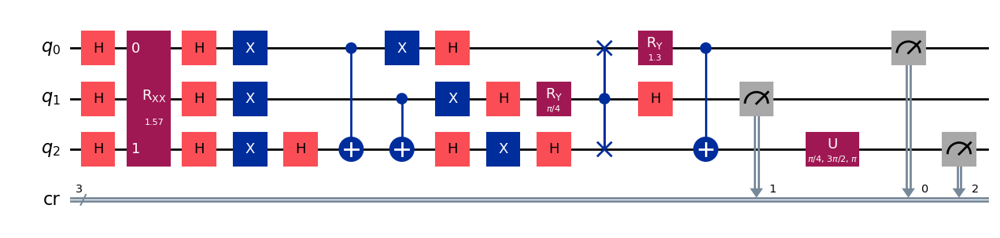

gen = 0 , Best fitness = (0.8654000000000001,)
gen = 1 , Best fitness = (0.8654000000000001,) , Number of invalids = 16

[Run 5 | Gen 48/99] Best Fitness: 0.8654 | Fidelity: 0.8397 | Gates: 35


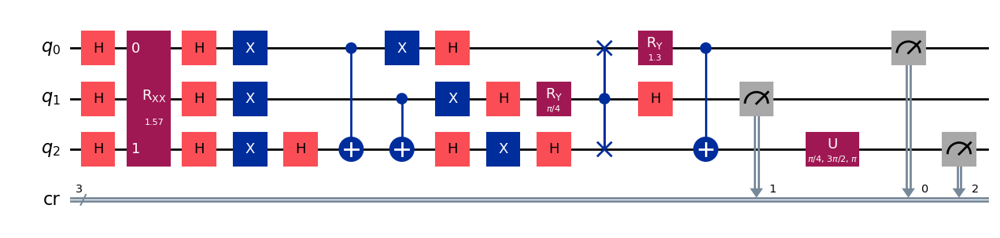

gen = 0 , Best fitness = (0.8654000000000001,)
gen = 1 , Best fitness = (0.8654000000000001,) , Number of invalids = 13

[Run 5 | Gen 49/99] Best Fitness: 0.8654 | Fidelity: 0.8357 | Gates: 35


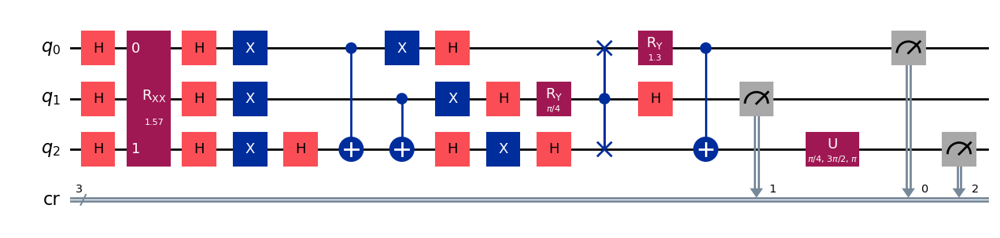

gen = 0 , Best fitness = (0.8654000000000001,)
gen = 1 , Best fitness = (0.8585,) , Number of invalids = 14

[Run 5 | Gen 50/99] Best Fitness: 0.8585 | Fidelity: 0.8325 | Gates: 35


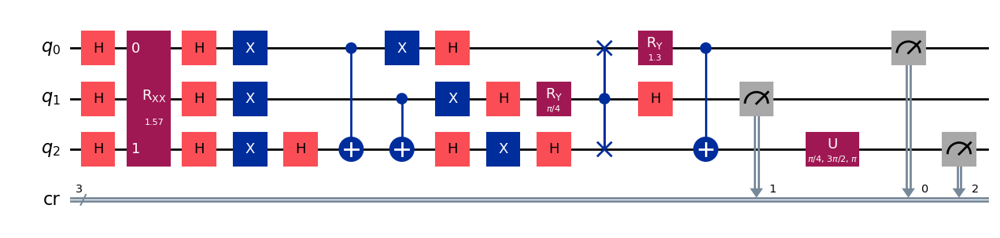

gen = 0 , Best fitness = (0.8585,)
gen = 1 , Best fitness = (0.8585,) , Number of invalids = 11

[Run 5 | Gen 51/99] Best Fitness: 0.8585 | Fidelity: 0.8312 | Gates: 35


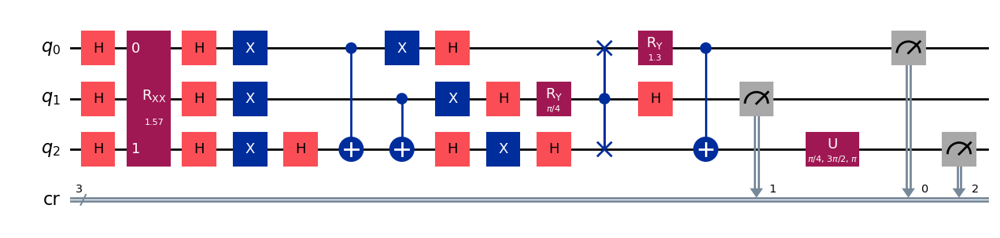

gen = 0 , Best fitness = (0.8585,)
gen = 1 , Best fitness = (0.8585,) , Number of invalids = 10

[Run 5 | Gen 52/99] Best Fitness: 0.8585 | Fidelity: 0.8377 | Gates: 35


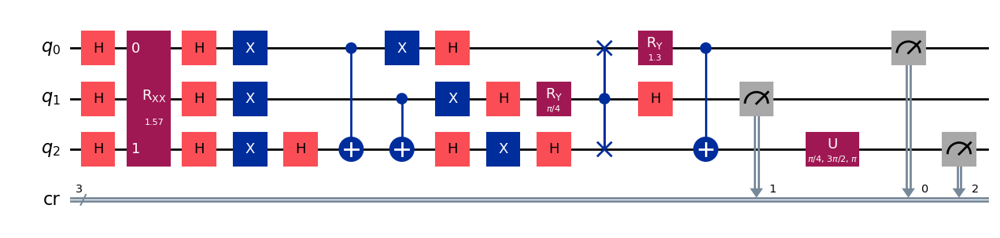

gen = 0 , Best fitness = (0.8585,)
gen = 1 , Best fitness = (0.8585,) , Number of invalids = 11

[Run 5 | Gen 53/99] Best Fitness: 0.8585 | Fidelity: 0.8306 | Gates: 35


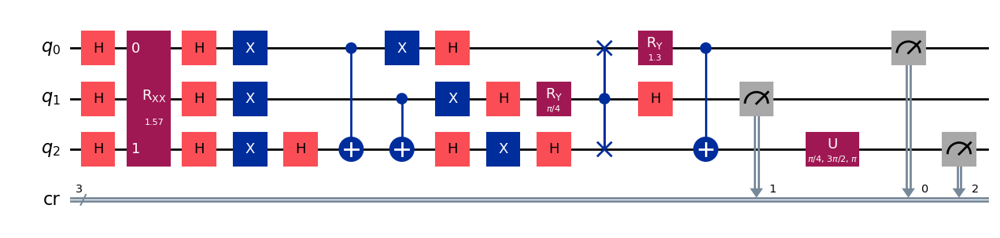

gen = 0 , Best fitness = (0.8585,)
gen = 1 , Best fitness = (0.8585,) , Number of invalids = 10

[Run 5 | Gen 54/99] Best Fitness: 0.8585 | Fidelity: 0.8317 | Gates: 35


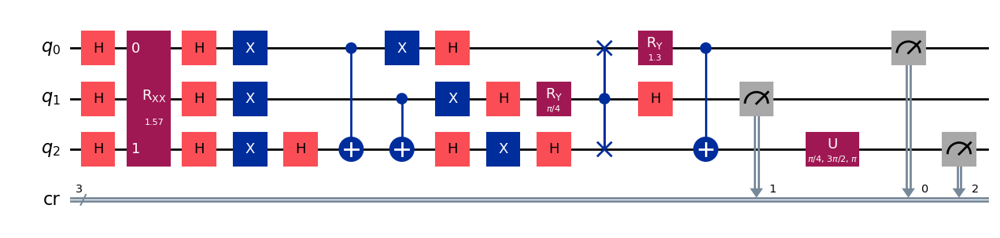

gen = 0 , Best fitness = (0.8585,)
gen = 1 , Best fitness = (0.8585,) , Number of invalids = 8

[Run 5 | Gen 55/99] Best Fitness: 0.8585 | Fidelity: 0.8330 | Gates: 35


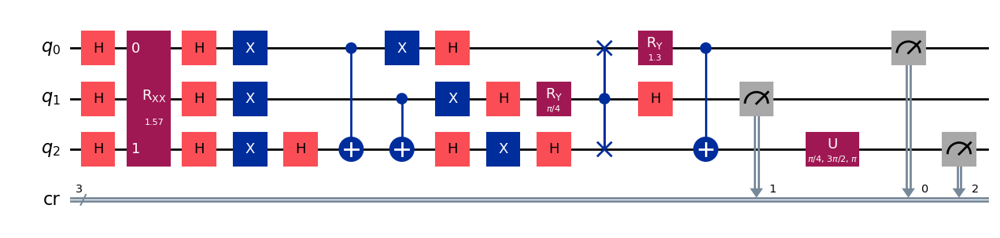

gen = 0 , Best fitness = (0.8585,)
gen = 1 , Best fitness = (0.8585,) , Number of invalids = 4

[Run 5 | Gen 56/99] Best Fitness: 0.8585 | Fidelity: 0.8285 | Gates: 35


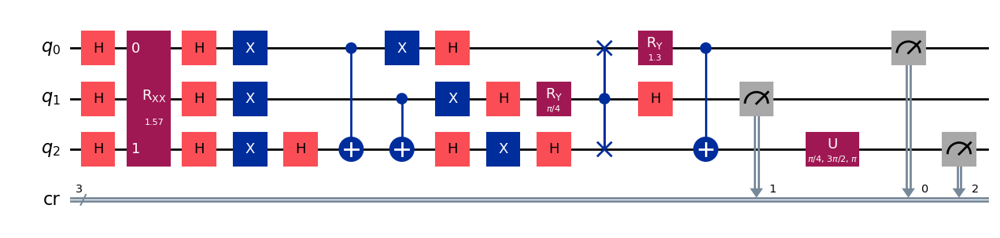

gen = 0 , Best fitness = (0.8585,)
gen = 1 , Best fitness = (0.7021000000000001,) , Number of invalids = 8

[Run 5 | Gen 57/99] Best Fitness: 0.7021 | Fidelity: 0.8320 | Gates: 27


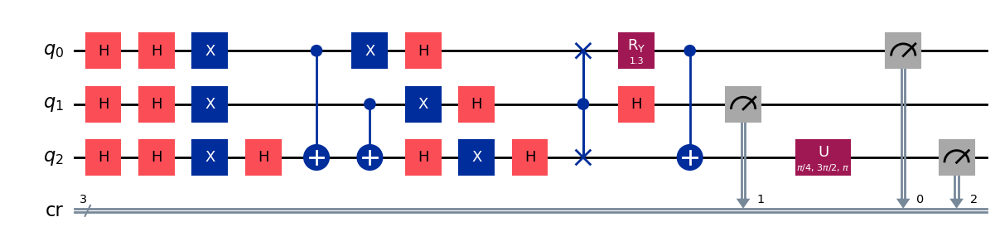

gen = 0 , Best fitness = (0.7021000000000001,)
gen = 1 , Best fitness = (0.7021000000000001,) , Number of invalids = 5

[Run 5 | Gen 58/99] Best Fitness: 0.7021 | Fidelity: 0.8373 | Gates: 27


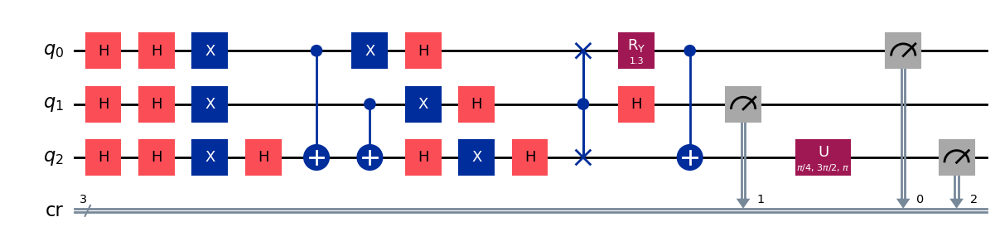

gen = 0 , Best fitness = (0.7021000000000001,)
gen = 1 , Best fitness = (0.7021000000000001,) , Number of invalids = 6

[Run 5 | Gen 59/99] Best Fitness: 0.7021 | Fidelity: 0.8381 | Gates: 27


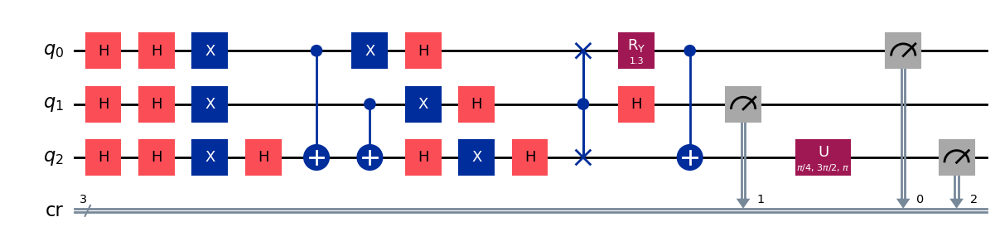

gen = 0 , Best fitness = (0.7021000000000001,)
gen = 1 , Best fitness = (0.7021000000000001,) , Number of invalids = 2

[Run 5 | Gen 60/99] Best Fitness: 0.7021 | Fidelity: 0.8379 | Gates: 27


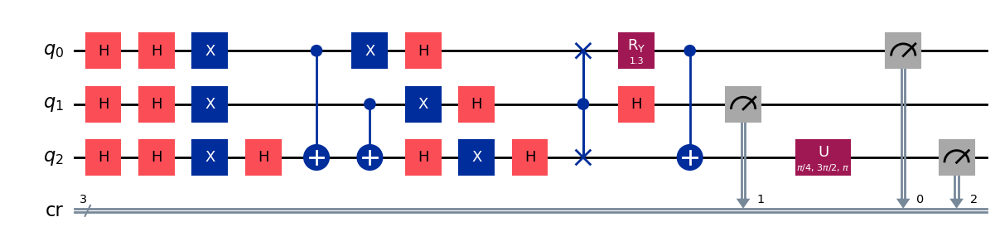

gen = 0 , Best fitness = (0.7021000000000001,)
gen = 1 , Best fitness = (0.7021000000000001,) , Number of invalids = 1

[Run 5 | Gen 61/99] Best Fitness: 0.7021 | Fidelity: 0.8367 | Gates: 27


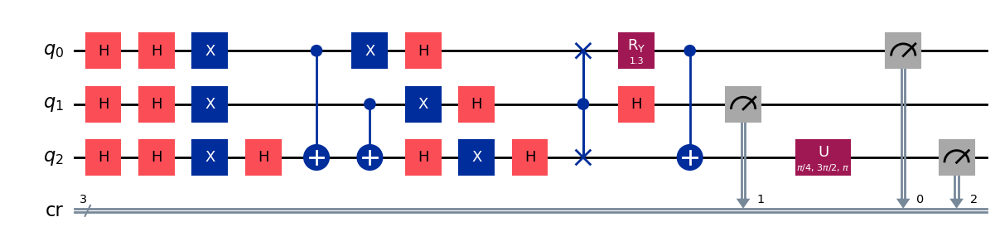

gen = 0 , Best fitness = (0.7021000000000001,)
gen = 1 , Best fitness = (0.6014,) , Number of invalids = 0

[Run 5 | Gen 62/99] Best Fitness: 0.6014 | Fidelity: 0.9578 | Gates: 28


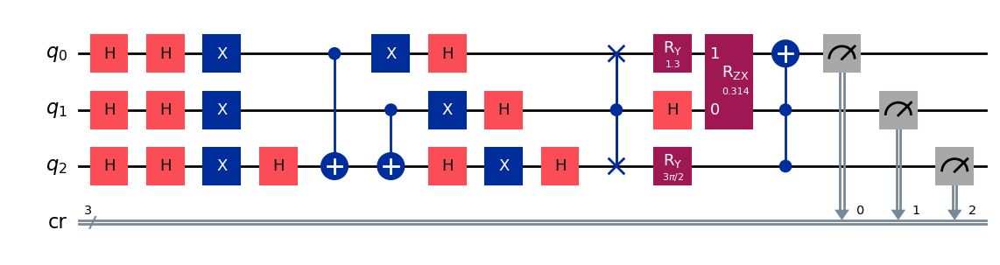

gen = 0 , Best fitness = (0.6014,)
gen = 1 , Best fitness = (0.538,) , Number of invalids = 3

[Run 5 | Gen 63/99] Best Fitness: 0.5380 | Fidelity: 0.9816 | Gates: 26


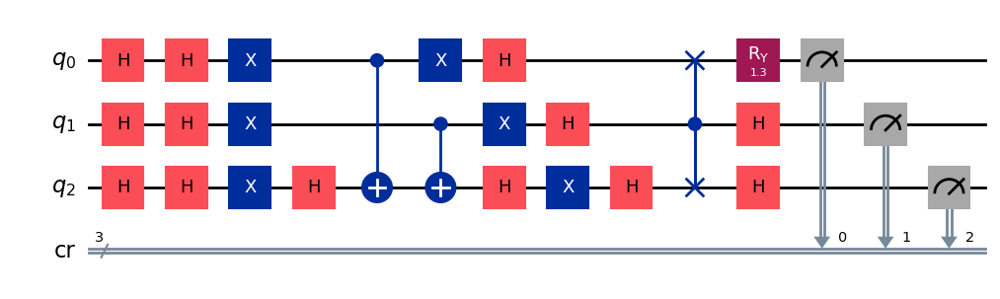

gen = 0 , Best fitness = (0.538,)
gen = 1 , Best fitness = (0.538,) , Number of invalids = 1

[Run 5 | Gen 64/99] Best Fitness: 0.5380 | Fidelity: 0.9791 | Gates: 26


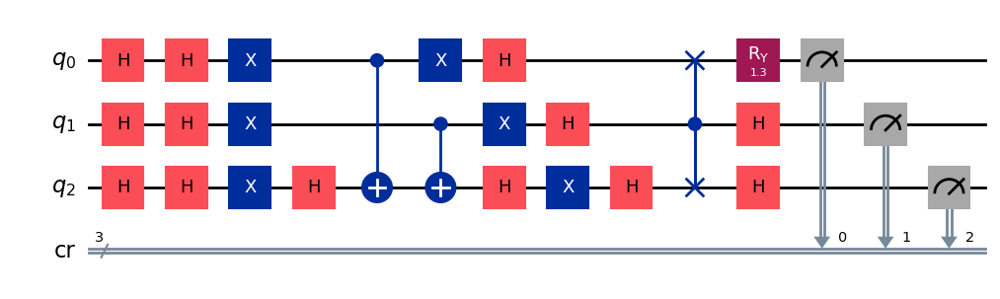

gen = 0 , Best fitness = (0.538,)
gen = 1 , Best fitness = (0.538,) , Number of invalids = 1

[Run 5 | Gen 65/99] Best Fitness: 0.5380 | Fidelity: 0.9800 | Gates: 26


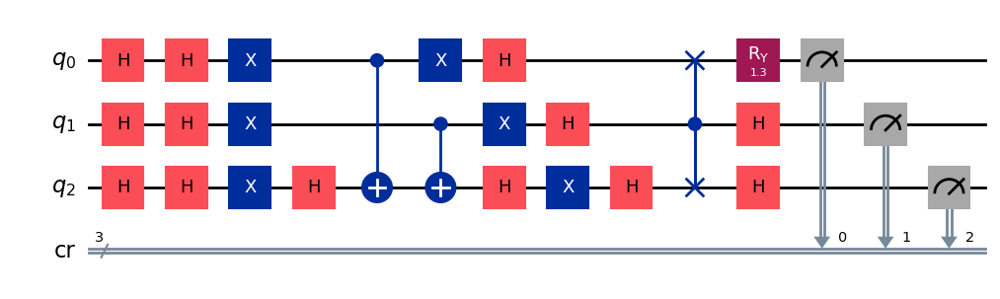

gen = 0 , Best fitness = (0.538,)
gen = 1 , Best fitness = (0.5373,) , Number of invalids = 0

[Run 5 | Gen 66/99] Best Fitness: 0.5373 | Fidelity: 0.9845 | Gates: 26


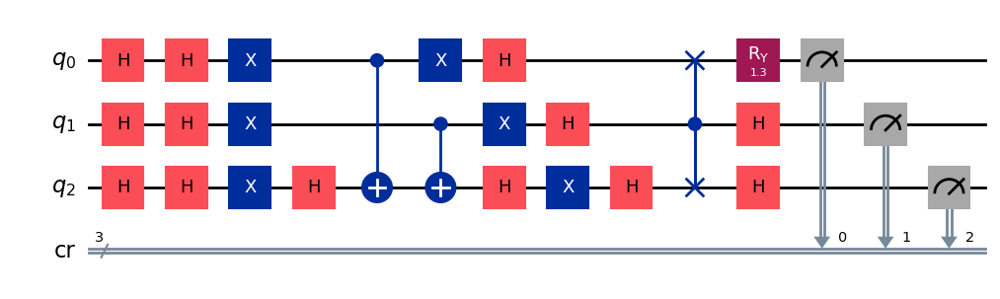

gen = 0 , Best fitness = (0.5373,)
gen = 1 , Best fitness = (0.5364,) , Number of invalids = 1

[Run 5 | Gen 67/99] Best Fitness: 0.5364 | Fidelity: 0.9815 | Gates: 26


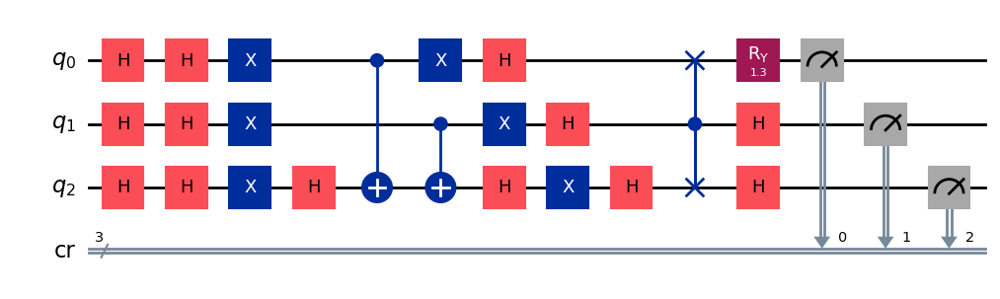

gen = 0 , Best fitness = (0.5364,)
gen = 1 , Best fitness = (0.5364,) , Number of invalids = 0

[Run 5 | Gen 68/99] Best Fitness: 0.5364 | Fidelity: 0.9821 | Gates: 26


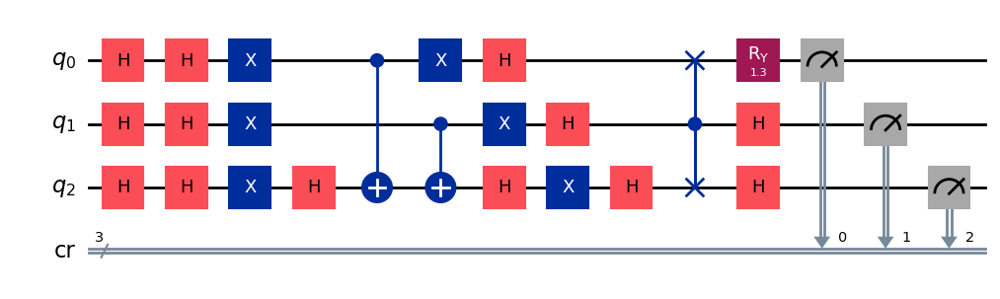

gen = 0 , Best fitness = (0.5364,)
gen = 1 , Best fitness = (0.5364,) , Number of invalids = 0

[Run 5 | Gen 69/99] Best Fitness: 0.5364 | Fidelity: 0.9828 | Gates: 26


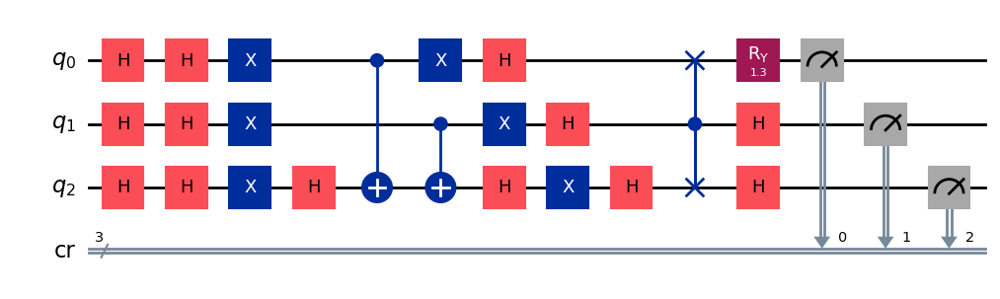

gen = 0 , Best fitness = (0.5364,)
gen = 1 , Best fitness = (0.5355,) , Number of invalids = 1

[Run 5 | Gen 70/99] Best Fitness: 0.5355 | Fidelity: 0.9829 | Gates: 26


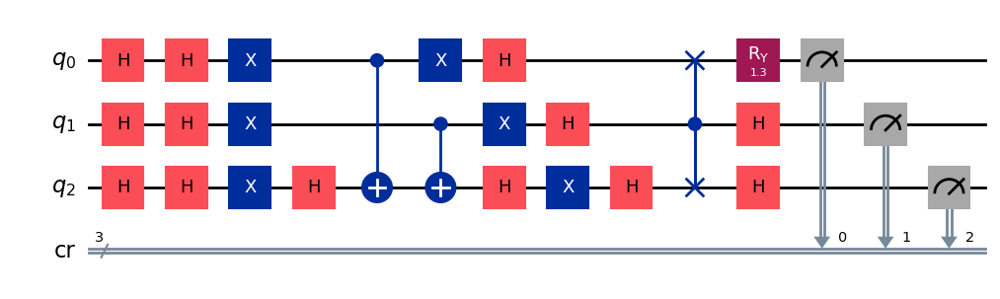

gen = 0 , Best fitness = (0.5355,)
gen = 1 , Best fitness = (0.5355,) , Number of invalids = 0

[Run 5 | Gen 71/99] Best Fitness: 0.5355 | Fidelity: 0.9809 | Gates: 26


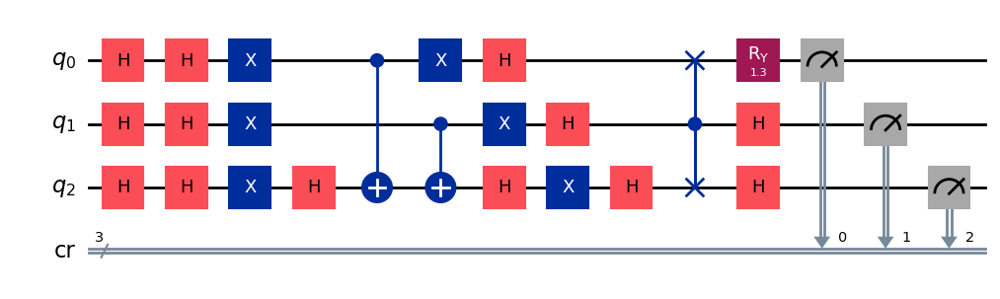

gen = 0 , Best fitness = (0.5355,)
gen = 1 , Best fitness = (0.5355,) , Number of invalids = 0

[Run 5 | Gen 72/99] Best Fitness: 0.5355 | Fidelity: 0.9820 | Gates: 26


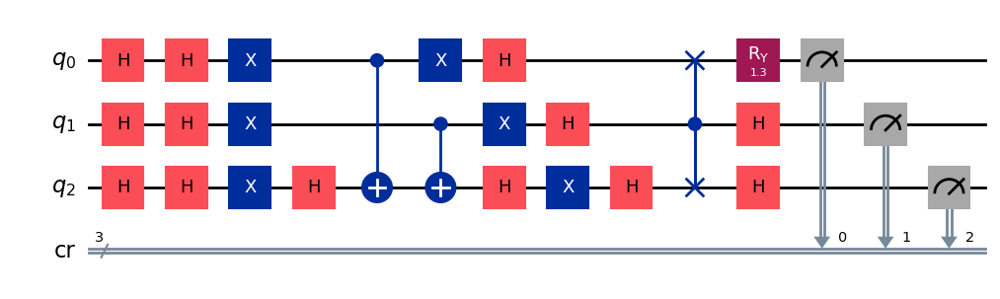

gen = 0 , Best fitness = (0.5355,)
gen = 1 , Best fitness = (0.52,) , Number of invalids = 0

[Run 5 | Gen 73/99] Best Fitness: 0.5200 | Fidelity: 1.0000 | Gates: 26


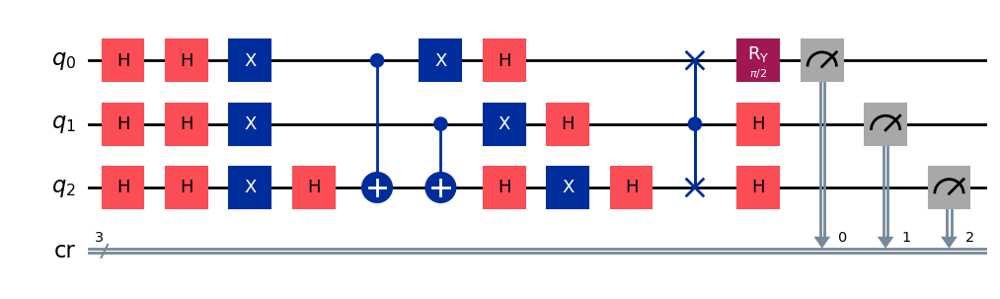

gen = 0 , Best fitness = (0.52,)
gen = 1 , Best fitness = (0.5195,) , Number of invalids = 0

[Run 5 | Gen 74/99] Best Fitness: 0.5195 | Fidelity: 0.9829 | Gates: 25


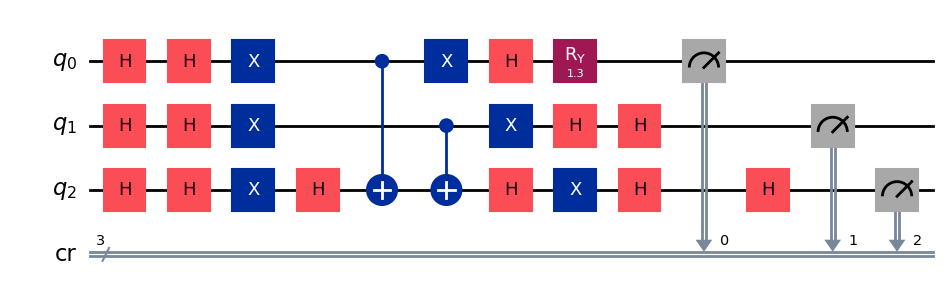

gen = 0 , Best fitness = (0.5195,)
gen = 1 , Best fitness = (0.5186,) , Number of invalids = 0

[Run 5 | Gen 75/99] Best Fitness: 0.5186 | Fidelity: 0.9811 | Gates: 25


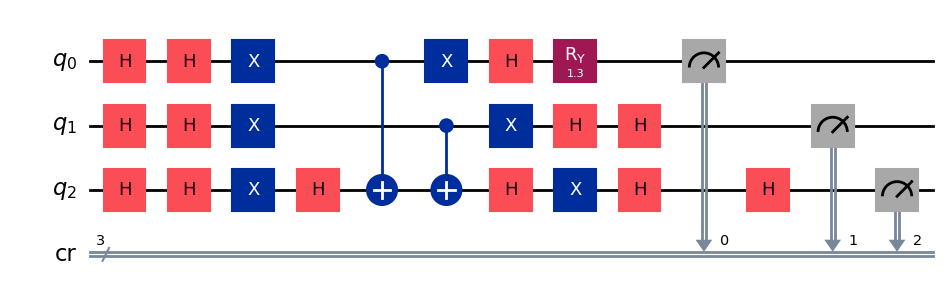

gen = 0 , Best fitness = (0.5186,)
gen = 1 , Best fitness = (0.5174,) , Number of invalids = 0

[Run 5 | Gen 76/99] Best Fitness: 0.5174 | Fidelity: 0.9813 | Gates: 25


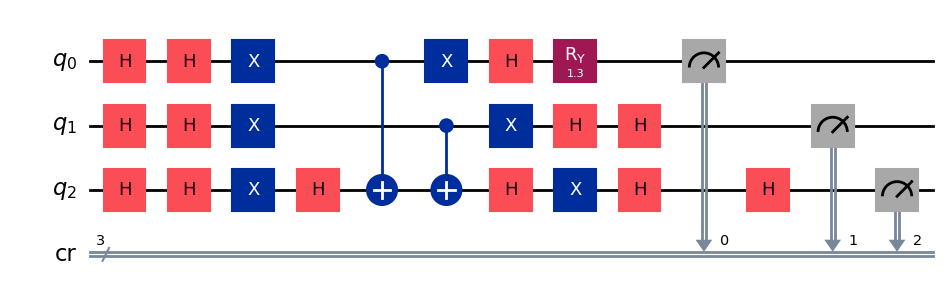

gen = 0 , Best fitness = (0.5174,)
gen = 1 , Best fitness = (0.5168,) , Number of invalids = 0

[Run 5 | Gen 77/99] Best Fitness: 0.5168 | Fidelity: 0.9818 | Gates: 25


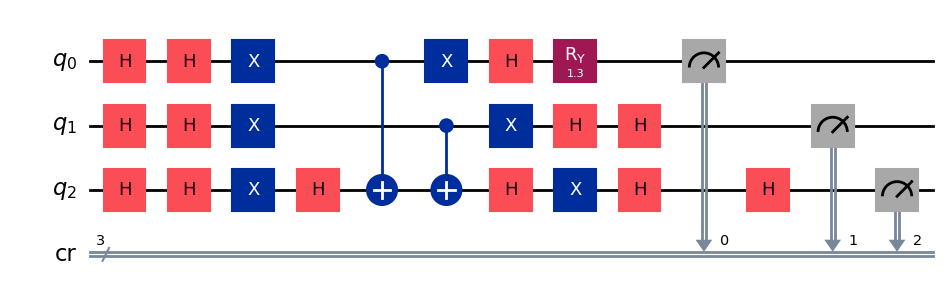

gen = 0 , Best fitness = (0.5168,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 78/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


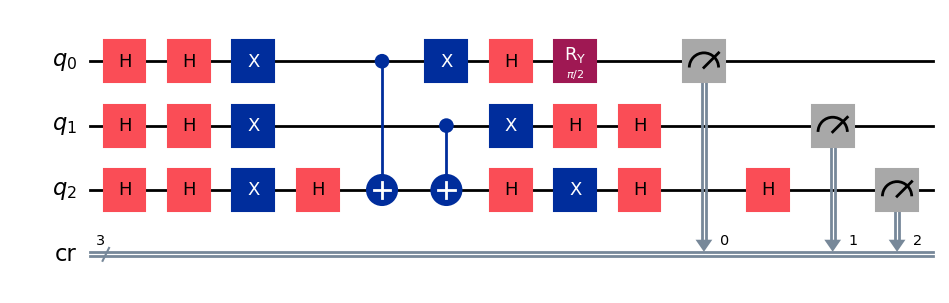

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 79/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


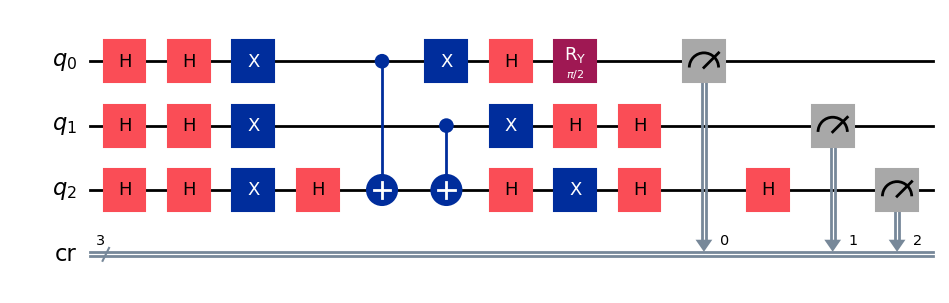

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 80/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


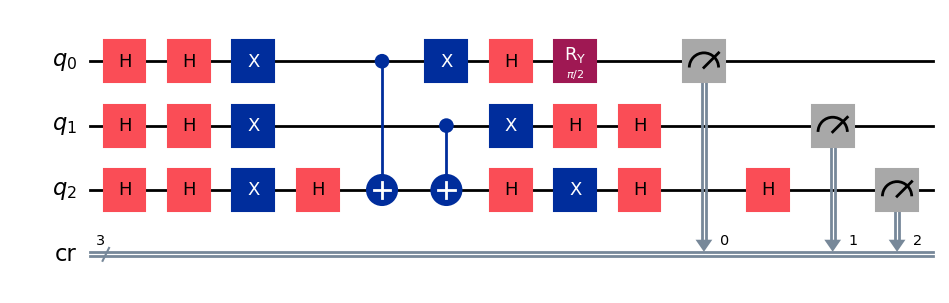

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 81/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


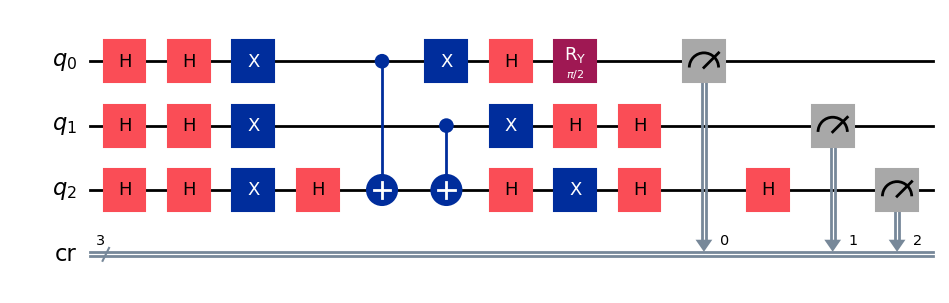

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 82/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


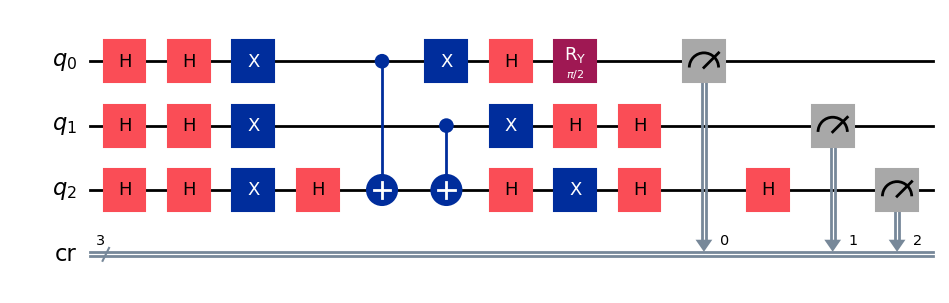

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 83/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


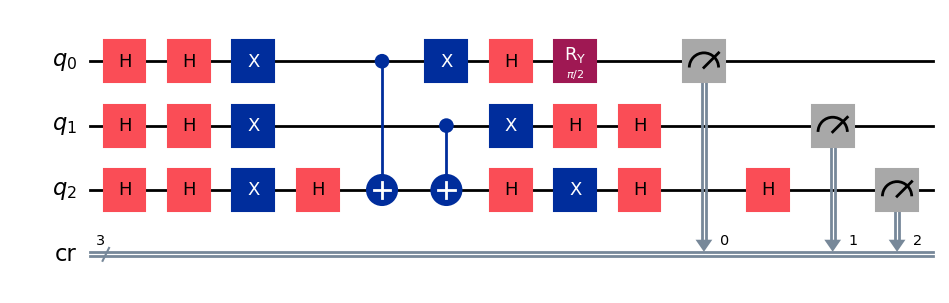

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 84/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


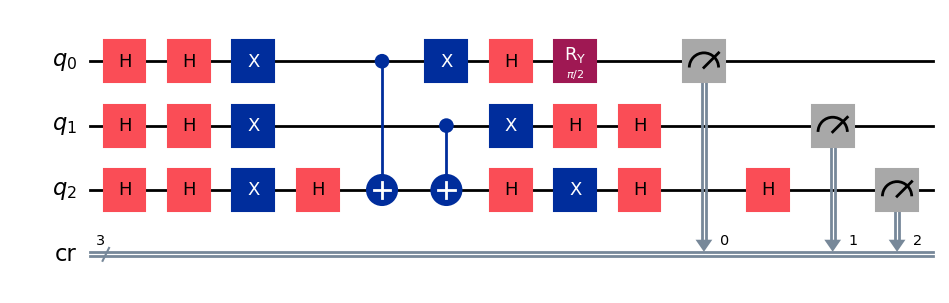

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 85/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


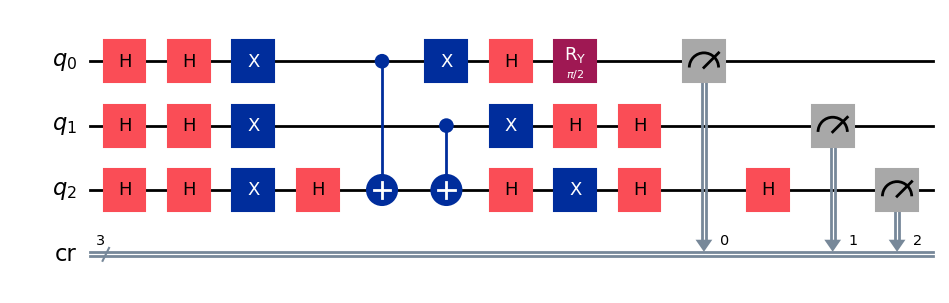

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 86/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


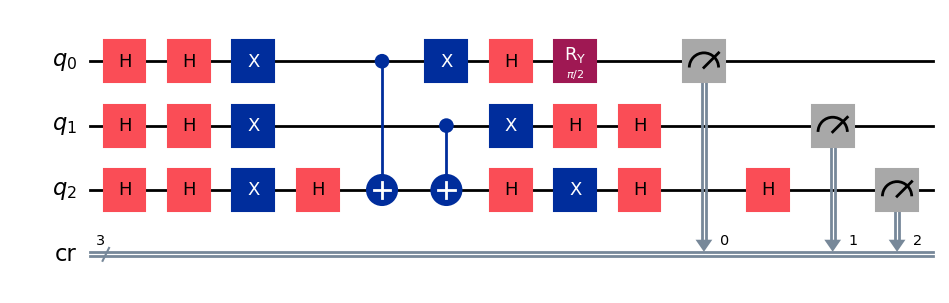

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 87/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


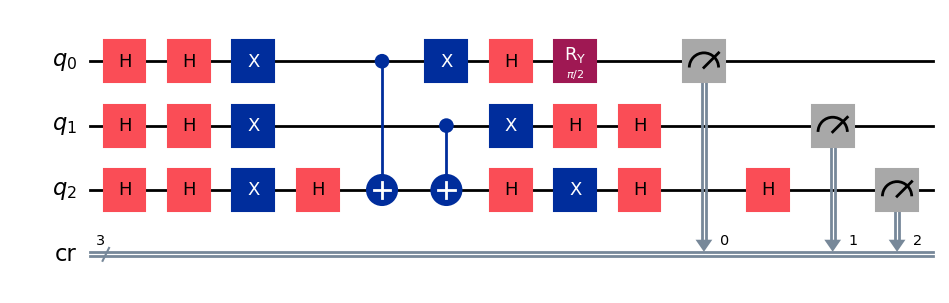

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 88/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


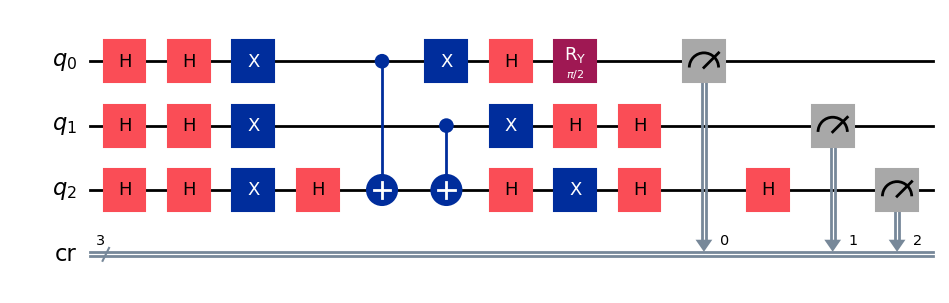

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 89/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


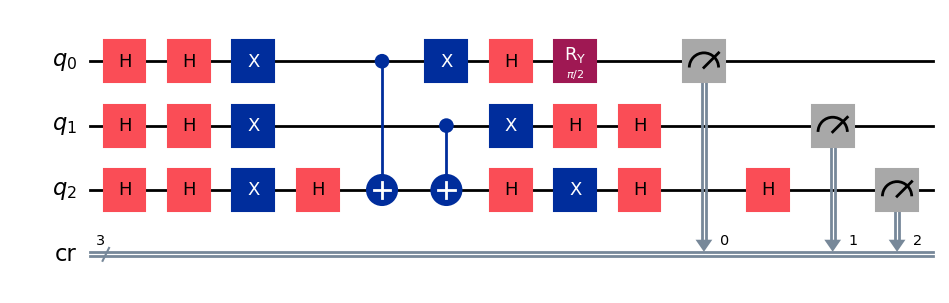

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 90/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


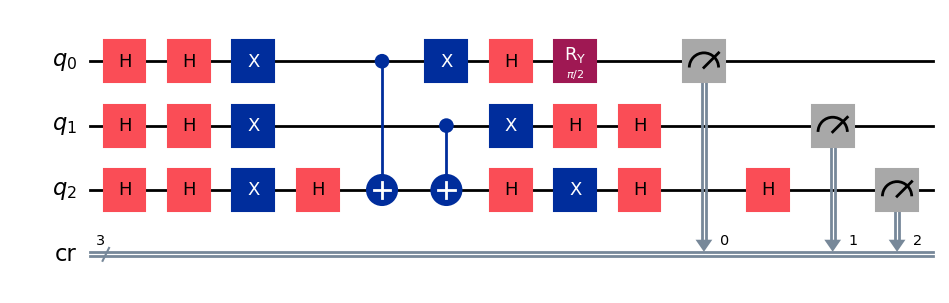

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 91/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


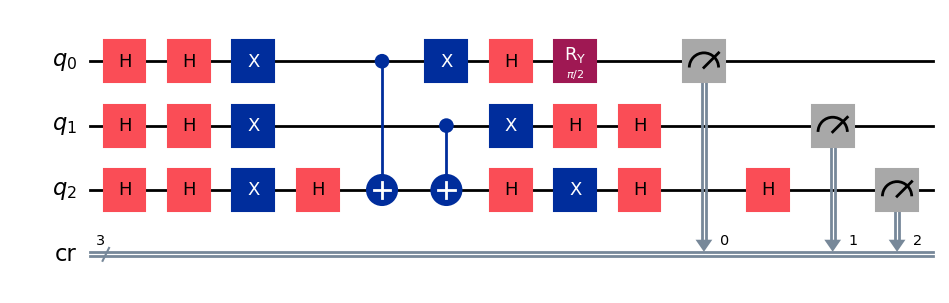

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 92/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


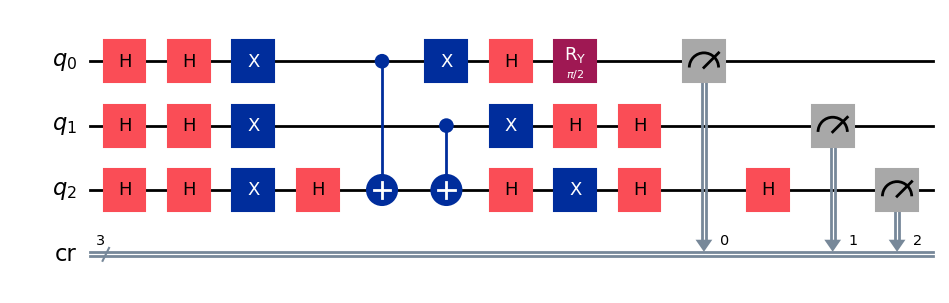

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 93/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


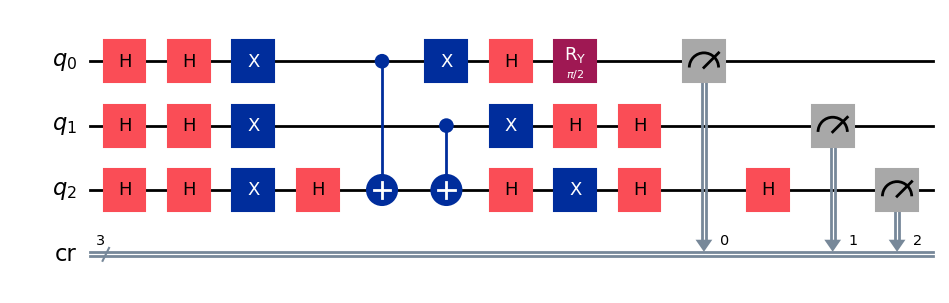

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 94/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


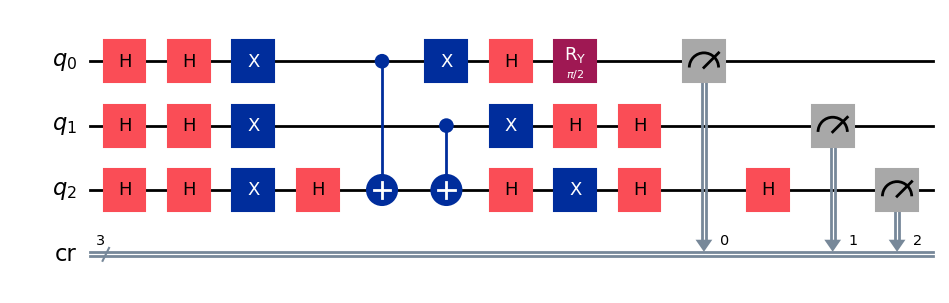

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 95/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


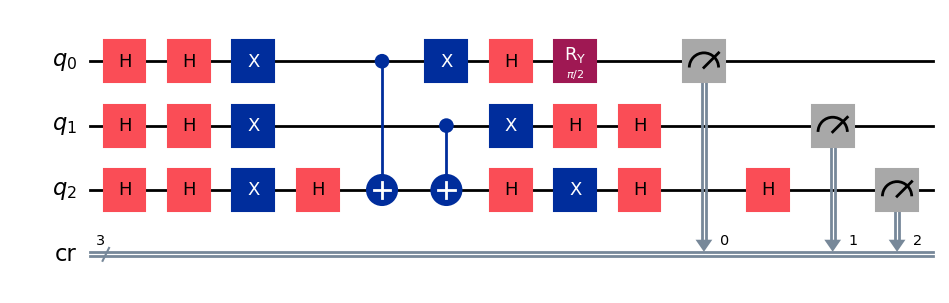

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 96/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


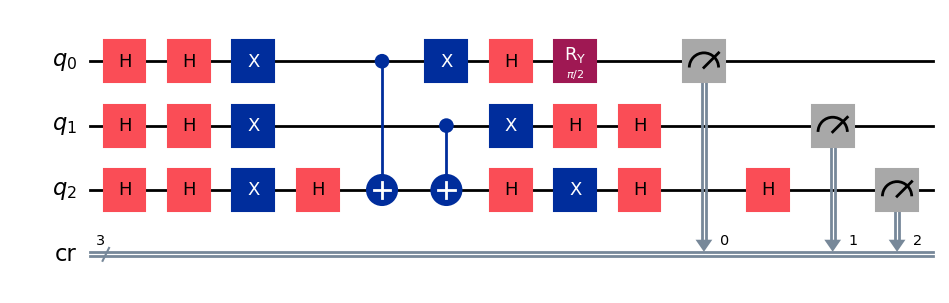

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 97/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


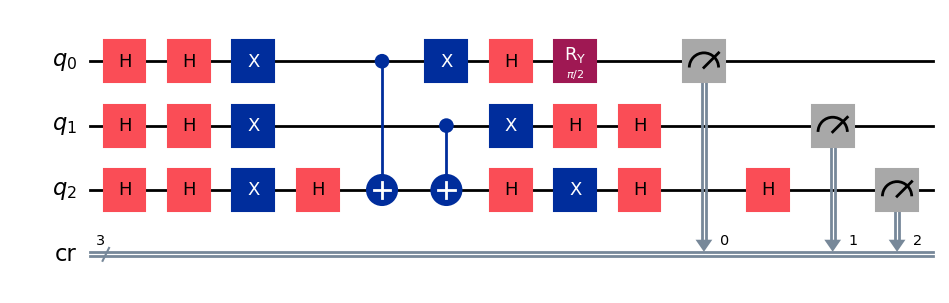

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 98/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


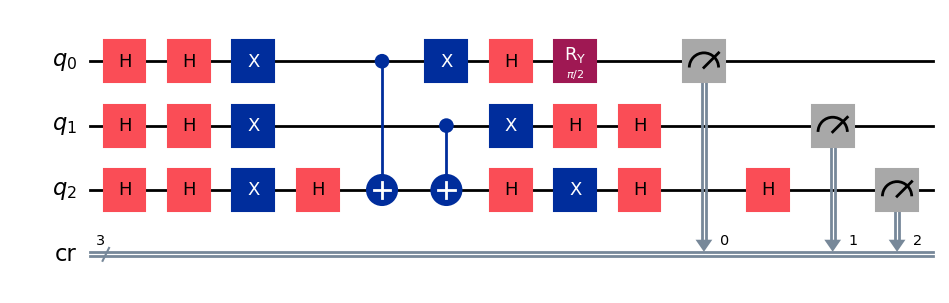

gen = 0 , Best fitness = (0.5,)
gen = 1 , Best fitness = (0.5,) , Number of invalids = 0

[Run 5 | Gen 99/99] Best Fitness: 0.5000 | Fidelity: 1.0000 | Gates: 25


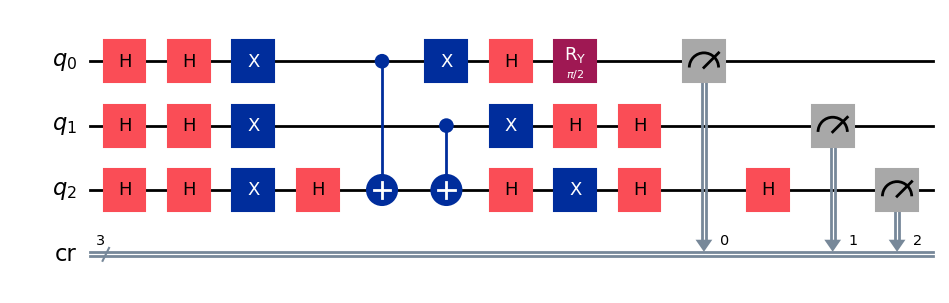


Generating evolution plots for Run 5...
✓ Plot saved to: experiments_state_100/run_5_seed_30112/evolution_metrics_run_5.png


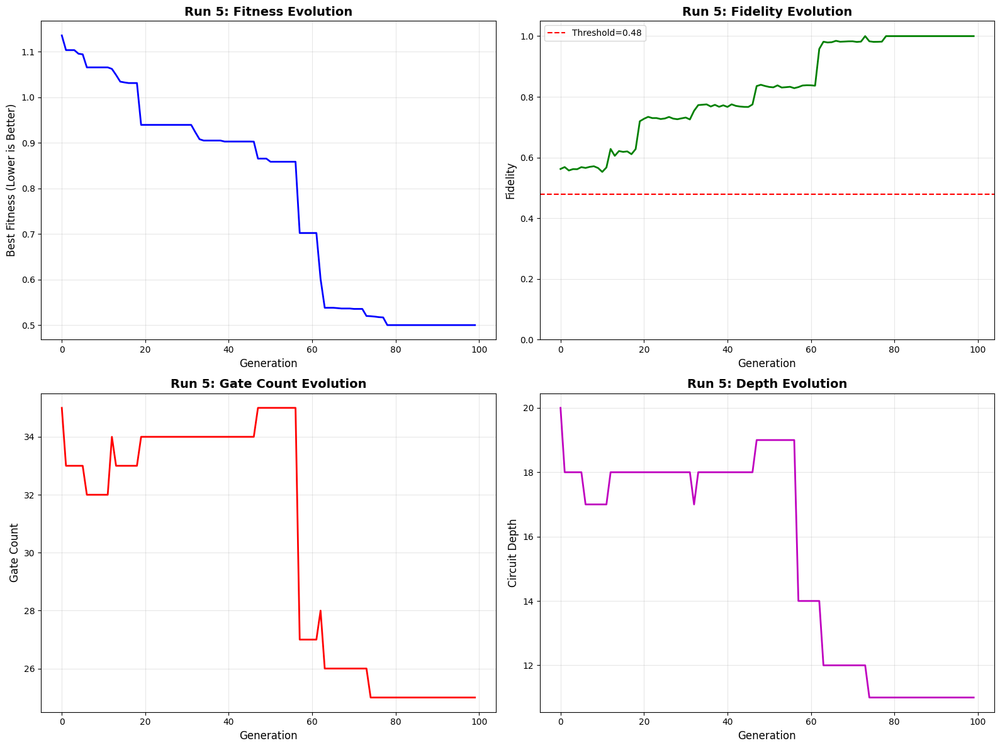


✓ Run 5 COMPLETE | Fidelity: 1.0000 | Gates: 25 | Depth: 11



In [14]:
NUMBER_OF_RUNS = 5
TARGET_STATE_FOR_EXPERIMENT = "100"

# Generate 5 random 5-digit seeds
seeds = [random.randint(10000, 99999) for _ in range(NUMBER_OF_RUNS)]
print(f"Generated seeds: {seeds}")

# Save seeds to file for reproducibility
seed_log = {
    "target_state": TARGET_STATE_FOR_EXPERIMENT,
    "seeds": seeds,
    "timestamp": pd.Timestamp.now().isoformat()
}
with open('experiment_seeds.json', 'w') as f:
    json.dump(seed_log, f, indent=2)
print(f"✓ Seeds saved to experiment_seeds.json")

all_run_results = []

print(f"\nStarting {NUMBER_OF_RUNS} independent runs for state |{TARGET_STATE_FOR_EXPERIMENT}>...")

for i, seed in enumerate(seeds):
    result = run_evolution_experiment(i+1, seed, TARGET_STATE_FOR_EXPERIMENT)
    all_run_results.append(result)

### Statistical Analysis (Mean ± SD)

In [15]:
fidelities = [r['fidelity'] for r in all_run_results]
depths = [r['depth'] for r in all_run_results]
gates = [r['gate_count'] for r in all_run_results]

mean_fid = statistics.mean(fidelities)
std_fid = statistics.stdev(fidelities)

mean_depth = statistics.mean(depths)
std_depth = statistics.stdev(depths)

mean_gates = statistics.mean(gates)
std_gates = statistics.stdev(gates)

print("\n" + "="*50)
print(f"AGGREGATE STATISTICS FOR STATE |{TARGET_STATE_FOR_EXPERIMENT}> ({NUMBER_OF_RUNS} Runs)")
print("="*50)
print(f"Fidelity:   {mean_fid*100:.2f}% ± {std_fid*100:.2f}%")
print(f"Depth:      {mean_depth:.2f} ± {std_depth:.2f}")
print(f"Gate Count: {mean_gates:.2f} ± {std_gates:.2f}")
print("="*50)

print("\nLaTeX Copy-Paste String:")
print(f"{mean_fid*100:.1f} \\pm {std_fid*100:.1f} & {mean_depth:.1f} \\pm {std_depth:.1f} & {mean_gates:.1f} \\pm {std_gates:.1f}")

# Print individual run details
print("\n" + "="*50)
print("INDIVIDUAL RUN DETAILS")
print("="*50)
for r in all_run_results:
    print(f"Run {r['run_id']} (Seed: {r['seed']}): Fidelity={r['fidelity']:.4f}, Gates={r['gate_count']}, Depth={r['depth']}, Log Dir={r['log_dir']}")



AGGREGATE STATISTICS FOR STATE |100> (5 Runs)
Fidelity:   96.26% ± 5.13%
Depth:      16.40 ± 5.08
Gate Count: 32.40 ± 7.09

LaTeX Copy-Paste String:
96.3 \pm 5.1 & 16.4 \pm 5.1 & 32.4 \pm 7.1

INDIVIDUAL RUN DETAILS
Run 1 (Seed: 69681): Fidelity=1.0000, Gates=25, Depth=11, Log Dir=experiments_state_100/run_1_seed_69681
Run 2 (Seed: 38083): Fidelity=1.0000, Gates=40, Depth=19, Log Dir=experiments_state_100/run_2_seed_38083
Run 3 (Seed: 68853): Fidelity=0.9094, Gates=38, Depth=22, Log Dir=experiments_state_100/run_3_seed_68853
Run 4 (Seed: 81245): Fidelity=0.9036, Gates=34, Depth=19, Log Dir=experiments_state_100/run_4_seed_81245
Run 5 (Seed: 30112): Fidelity=1.0000, Gates=25, Depth=11, Log Dir=experiments_state_100/run_5_seed_30112


#### Aggregate Evolution Plots Across All Runs



GENERATING AGGREGATE PLOTS
✓ Aggregate plot saved to: experiments_state_100/aggregate_evolution_all_runs.png


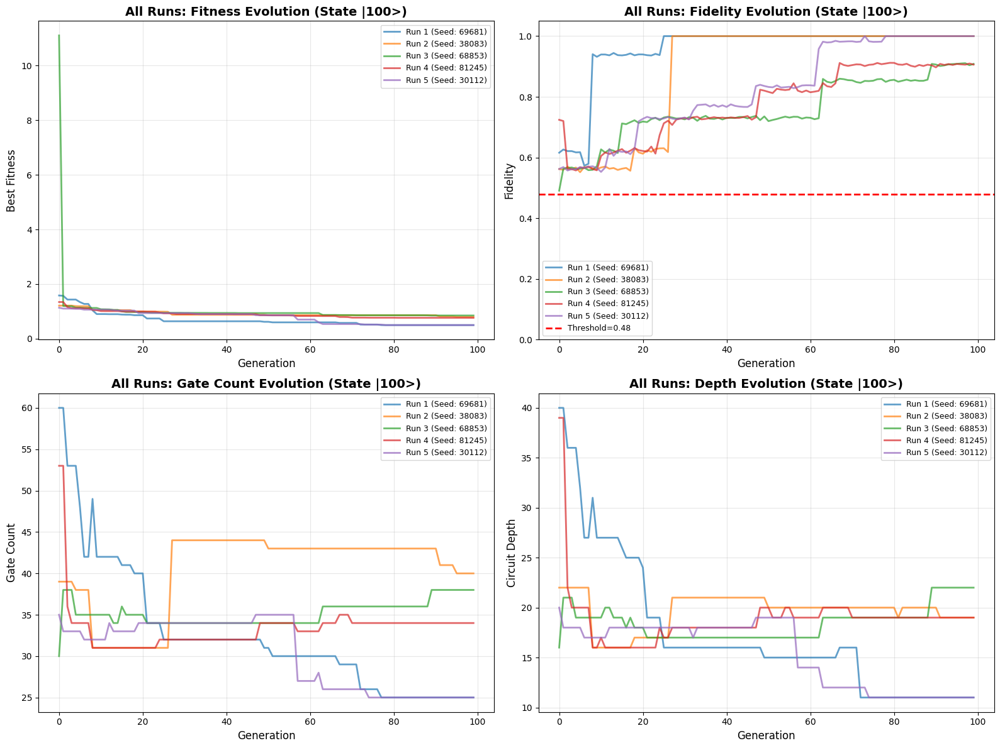

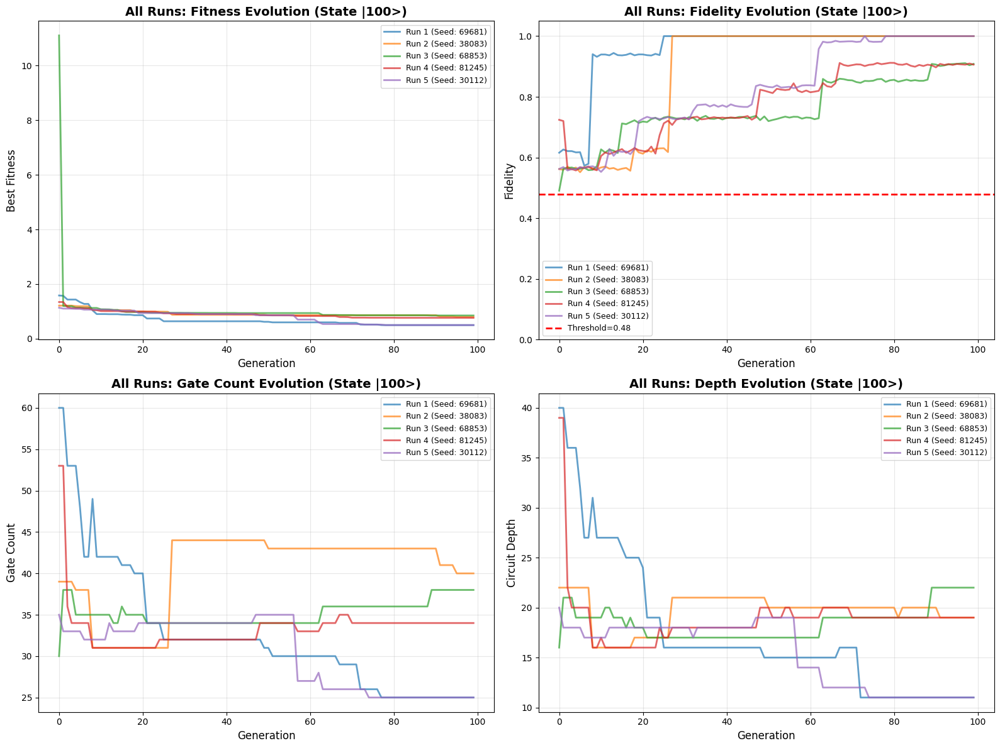

In [16]:
print("\n" + "="*50)
print("GENERATING AGGREGATE PLOTS")
print("="*50)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for idx, r in enumerate(all_run_results):
    color = colors[idx % len(colors)]
    label = f"Run {r['run_id']} (Seed: {r['seed']})"
    
    # Fitness
    axes[0, 0].plot(r['generations'], r['fitness_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)
    
    # Fidelity
    axes[0, 1].plot(r['generations'], r['fidelity_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)
    
    # Gate count
    axes[1, 0].plot(r['generations'], r['gate_count_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)
    
    # Depth
    axes[1, 1].plot(r['generations'], r['depth_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)

# Configure subplots
axes[0, 0].set_xlabel('Generation', fontsize=12)
axes[0, 0].set_ylabel('Best Fitness', fontsize=12)
axes[0, 0].set_title(f'All Runs: Fitness Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].legend(fontsize=9)

axes[0, 1].set_xlabel('Generation', fontsize=12)
axes[0, 1].set_ylabel('Fidelity', fontsize=12)
axes[0, 1].set_title(f'All Runs: Fidelity Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_ylim([0, 1.05])
axes[0, 1].axhline(y=SUCCESS_THRESHOLD, color='r', linestyle='--', 
                   linewidth=2, label=f'Threshold={SUCCESS_THRESHOLD}')
axes[0, 1].legend(fontsize=9)

axes[1, 0].set_xlabel('Generation', fontsize=12)
axes[1, 0].set_ylabel('Gate Count', fontsize=12)
axes[1, 0].set_title(f'All Runs: Gate Count Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].legend(fontsize=9)

axes[1, 1].set_xlabel('Generation', fontsize=12)
axes[1, 1].set_ylabel('Circuit Depth', fontsize=12)
axes[1, 1].set_title(f'All Runs: Depth Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].legend(fontsize=9)

plt.tight_layout()

state_dir = f"experiments_state_{TARGET_STATE_FOR_EXPERIMENT}"
aggregate_plot_path = os.path.join(state_dir, f'aggregate_evolution_all_runs.png')
plt.savefig(aggregate_plot_path, dpi=150, bbox_inches='tight')

print(f"✓ Aggregate plot saved to: {aggregate_plot_path}")
display(fig)

### Select Best Circuit for IBM Hardware


Selecting Best Circuit from Run #1 (Seed: 69681)
Simulated Fidelity: 1.0000
Log directory: experiments_state_100/run_1_seed_69681
[QPU] Running on: ibm_torino

[HOF Individual 1] Fitness: 0.5
Evolved transpiled count_ops: OrderedDict([('x', 5), ('rz', 4), ('measure', 3), ('cz', 2), ('sx', 2)])
Evolved transpiled depth:    8
Total ops:        16
Qubits / Clbits:  133 / 3


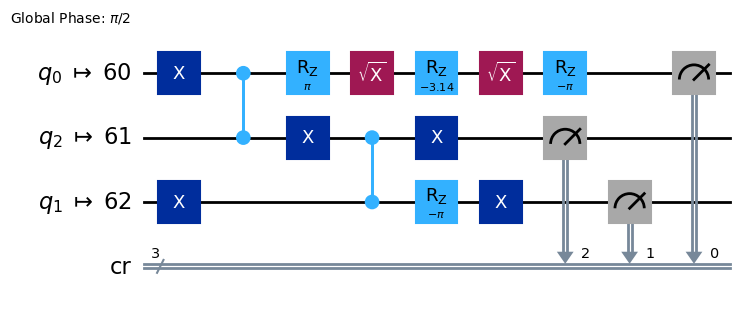

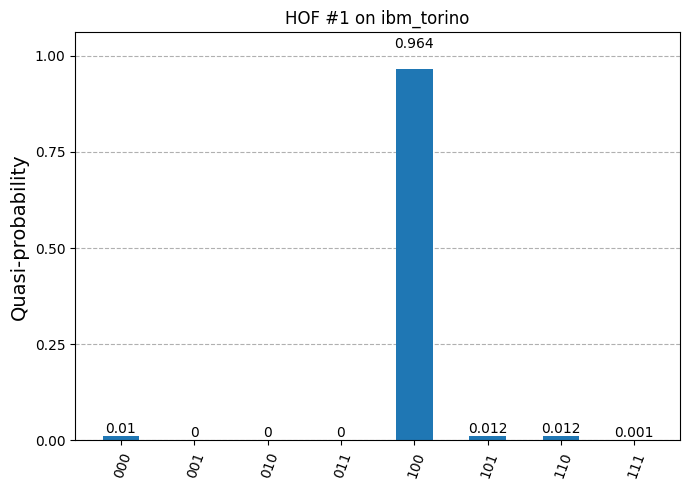

In [17]:
best_run = min(all_run_results, key=lambda x: x['raw_fitness'])

print(f"\nSelecting Best Circuit from Run #{best_run['run_id']} (Seed: {best_run['seed']})")
print(f"Simulated Fidelity: {best_run['fidelity']:.4f}")
print(f"Log directory: {best_run['log_dir']}")

evaluator = CircuitEvaluator(shots=NUM_SHOTS, log_dir=best_run['log_dir'])
dummy_hof = tools.HallOfFame(1)
dummy_hof.update([best_run['individual']])

run_hof_on_ibm(evaluator, dummy_hof, target_state=TARGET_STATE_FOR_EXPERIMENT)